In [1]:
import sys
print(sys.version)

3.8.3 | packaged by conda-forge | (default, Jun  1 2020, 17:21:09) 
[Clang 9.0.1 ]


In [2]:
"""
Created on May 1 2021
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)

In [3]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [4]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [5]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *

# 0.35d or greater

print('Zernike_Module.__version__: '+str(Zernike_Module.__version__))
print('Zernike_Analysis_Module.__version__: '+str(Zernike_Analysis_Module.__version__))

Zernike_Module.__version__: 0.46e
Zernike_Analysis_Module.__version__: 0.26g


In [27]:
#from Zernike_Module_v040a import *
#import Zernike_Module_v040a


In [6]:
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle
import glob
import time

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

from astropy.io import fits

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c



print(np.__version__)
print(skimage.__version__)
print(scipy.__version__)
print(pd.__version__)

1.18.5
0.17.2
1.5.0
1.0.5


# Unit test 

In [36]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([7.1,1.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1,verbosity=0,npix=1536)   

res=model(allparameters_proposal,return_Image=True)


print(res[0])

version of the code is: 0.46e
-367.5754132818689


/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image


In [33]:
np.int(np.round(280.011))

280

In [34]:
np.rint(280.011)

280.0

In [37]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

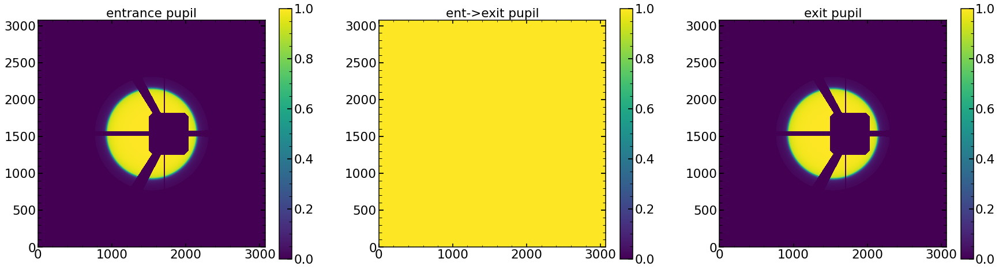

In [38]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

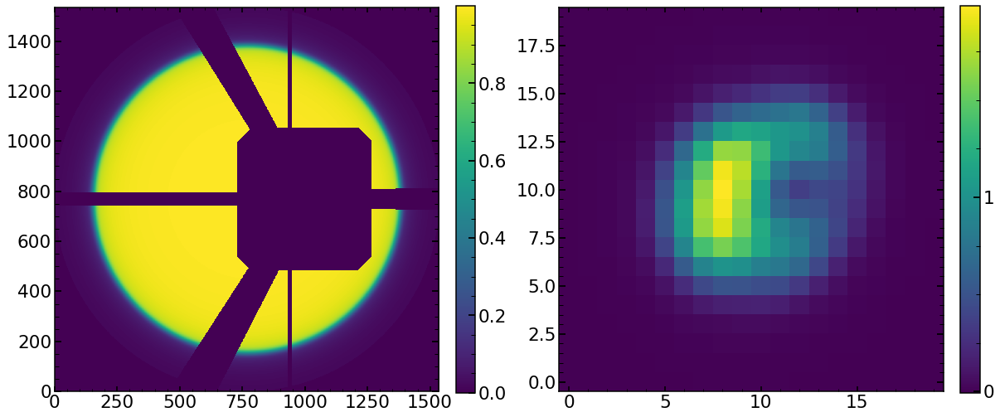

In [39]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**-2,1,10,10**2,10**3,10**4,10**5])

In [40]:
%timeit model(allparameters_proposal,return_Image=True)

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overlo

3.62 s ± 609 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image


In [41]:
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=0,verbosity=0,npix=1536)   
%timeit model(allparameters_proposal,return_Image=True)

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image
/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overlo

1.12 s ± 75.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5209: RankWarning: Polyfit may be poorly conditioned
  # overload var_image with newly created image


# Apr 29

In [195]:
import glob

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_flip.pkl",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_flip.pkl",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_flip.pkl",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## scripts 

## which are avaliable 

In [386]:
#date='May2921'

date='Apr1421'
ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*KrSwarm1.npy', recursive=True)

In [387]:
eps_value=6

analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 

analyzed_Ar_images=np.array(analyzed_Ar_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [388]:
print(analyzed_Ar_images)
print(analyzed_Neon_images)
print(analyzed_Kr_images)

[['34437' '100' 'Ar']
 ['34437' '101' 'Ar']
 ['34437' '102' 'Ar']
 ['34437' '103' 'Ar']
 ['34437' '104' 'Ar']
 ['34437' '105' 'Ar']
 ['34437' '106' 'Ar']
 ['34437' '107' 'Ar']
 ['34437' '109' 'Ar']
 ['34437' '110' 'Ar']
 ['34437' '111' 'Ar']
 ['34437' '112' 'Ar']
 ['34437' '113' 'Ar']
 ['34437' '114' 'Ar']
 ['34437' '115' 'Ar']
 ['34437' '116' 'Ar']
 ['34437' '11' 'Ar']
 ['34437' '117' 'Ar']
 ['34437' '118' 'Ar']
 ['34437' '119' 'Ar']
 ['34437' '13' 'Ar']
 ['34437' '15' 'Ar']
 ['34437' '1' 'Ar']
 ['34437' '17' 'Ar']
 ['34437' '18' 'Ar']
 ['34437' '19' 'Ar']
 ['34437' '20' 'Ar']
 ['34437' '21' 'Ar']
 ['34437' '23' 'Ar']
 ['34437' '25' 'Ar']
 ['34437' '27' 'Ar']
 ['34437' '29' 'Ar']
 ['34437' '30' 'Ar']
 ['34437' '32' 'Ar']
 ['34437' '33' 'Ar']
 ['34437' '3' 'Ar']
 ['34437' '37' 'Ar']
 ['34437' '39' 'Ar']
 ['34437' '41' 'Ar']
 ['34437' '42' 'Ar']
 ['34437' '43' 'Ar']
 ['34437' '44' 'Ar']
 ['34437' '47' 'Ar']
 ['34437' '49' 'Ar']
 ['34437' '51' 'Ar']
 ['34437' '53' 'Ar']
 ['34437' '54' 'A

In [389]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:83 / analyzed_Ne_images:16 / analyzed_Kr_images:8


## single image analysis 

In [196]:
#date='May2821'
date='Apr1421'

single_number='11'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6



if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr

wavelength=float(finalArc.iloc[int(single_number)]['wavelength'])
wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                  650
xc                      59
yc                    4044
wavelength        966.0642
close                    1
lamp                    Ar
xc_effective            59
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 11, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]


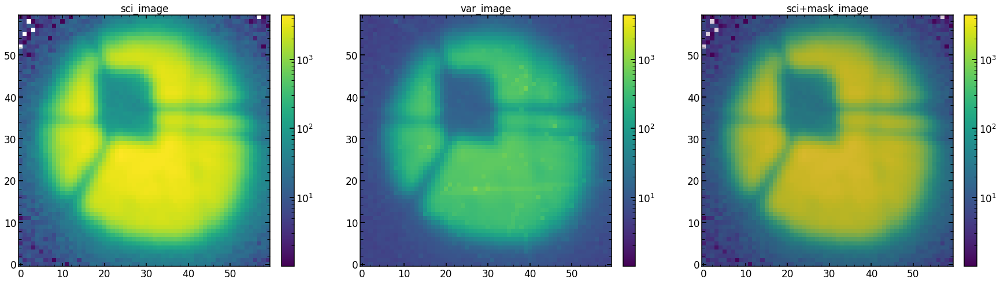

In [197]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [198]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
(51, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 5.060299555460612
average chi2 reduced is: -4.756823660089094


In [20]:
wavelength

### chain analysis 

In [16]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2821/chainMay2821_Single_P_34437118Arres_gbests_position.npy
(21, 129)


array([   -6.81849949,     0.55488341,     0.43054948,    -1.03853828,
           0.14783005,    -0.44737273,     0.06236882,    -0.50840074,
          -0.12801747,     0.82566797,     0.03285232,    -0.54920246,
          -0.01719356,    -0.75238163,    -0.0859265 ,     0.75091487,
           0.00431008,     0.08501358,     0.00669094,     0.09269485,
           0.04159008,     0.02754939,     0.00498194,    -0.12314295,
          -0.00095606,     0.14435017,    -0.03219455,     0.08323498,
           0.00694153,     0.05378713,     0.00365518,    -0.08205348,
          -0.00558036,    -0.00726624,    -0.00265084,     0.03805602,
          -0.02576044,     0.09833656,     0.69991908,     0.11069462,
          -0.23095152,     0.2634755 ,     0.05955178,     0.09111398,
           0.16964857,     0.23727531,     0.48081831,     2.26598792,
          -0.07118267,    -0.00769592,     0.852666  ,     0.03060708,
           0.64430913,     1.06384943,     0.52920915, 63436.8173559 ,
      

Text(0, 0.5, 'par_1')

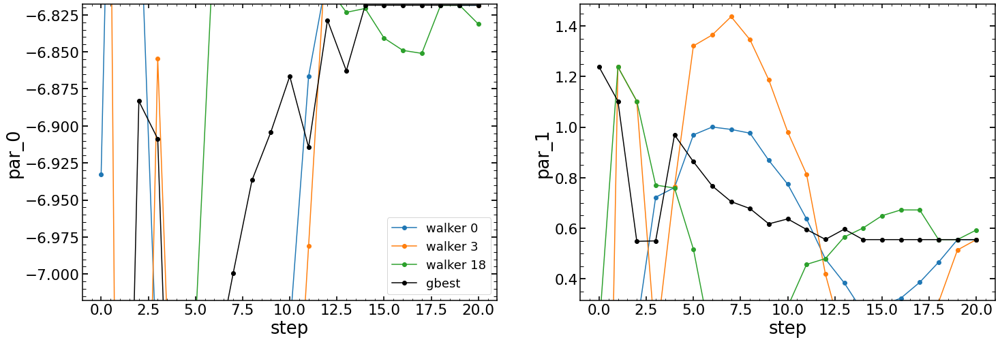

In [17]:
# wavefront paramter
plt.figure(figsize=(24,8))
i=0*2
plt.subplot(121)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(122)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))

In [310]:
np.max(gbests_positions[:,i+1])*1.2

1.485799982139406

Text(0.5, 1.0, 'par_46 / wide_43')

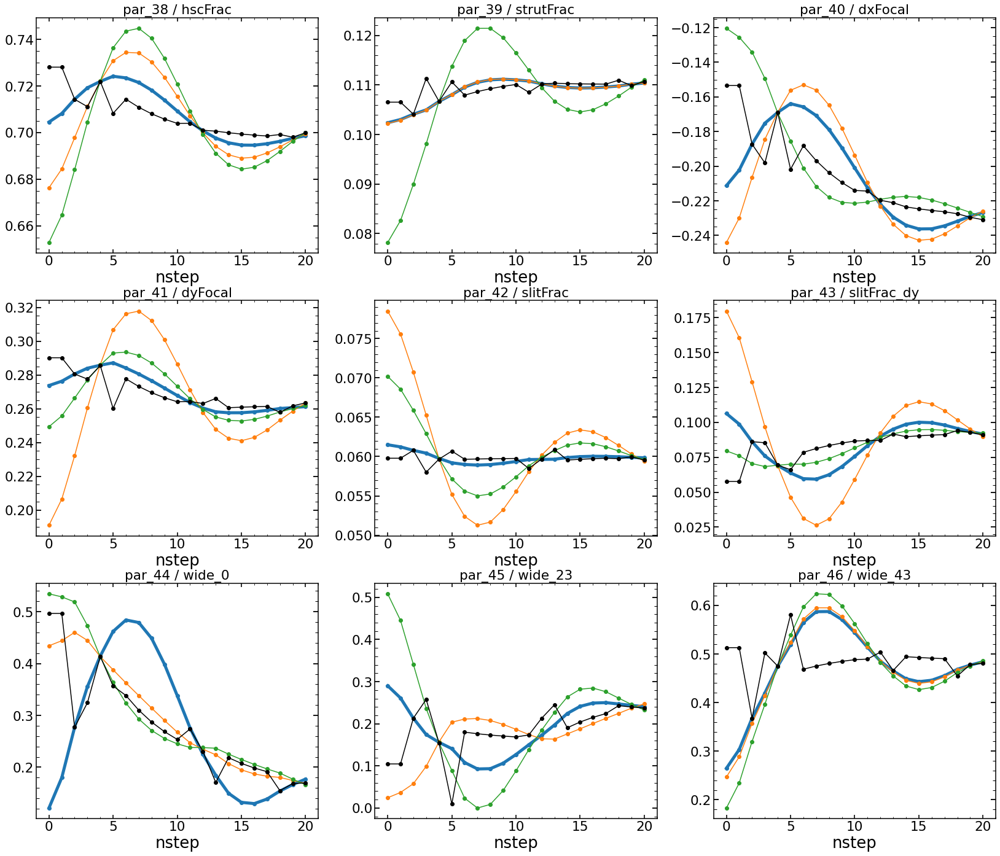

In [311]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

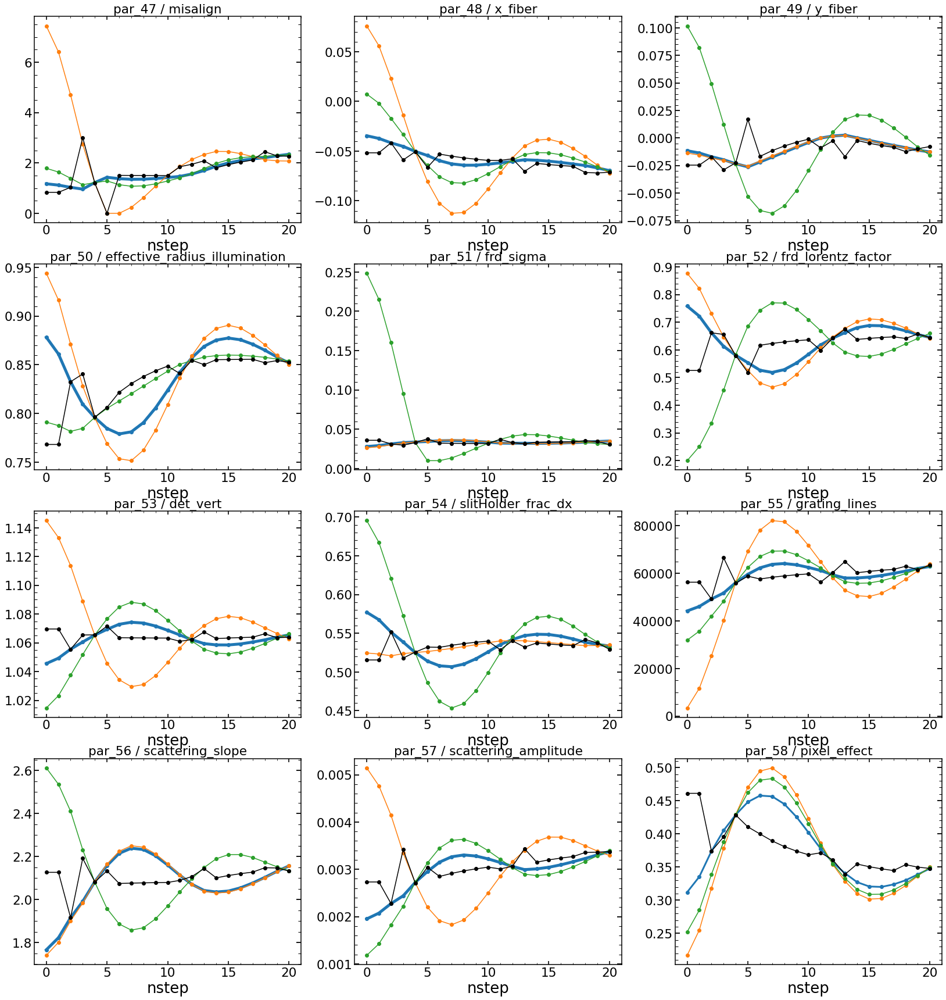

In [312]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

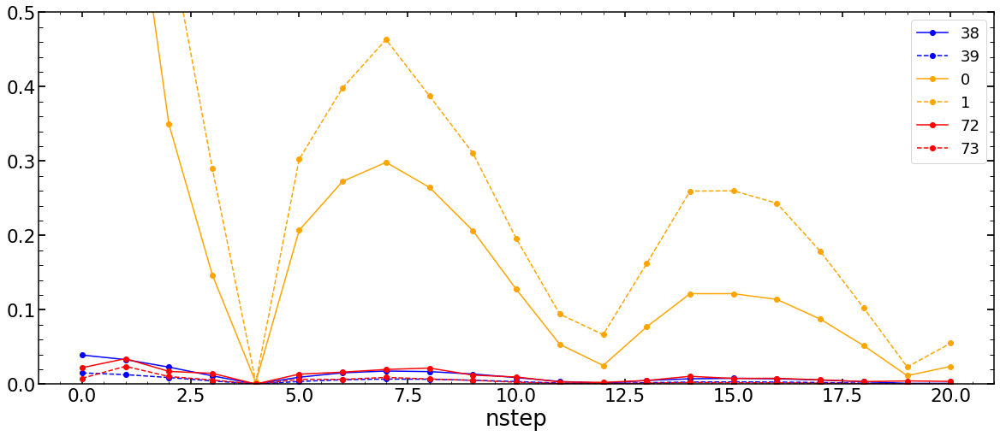

In [313]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

In [314]:
i1

38

(0.09984398560720255, 0.11986739083579641)

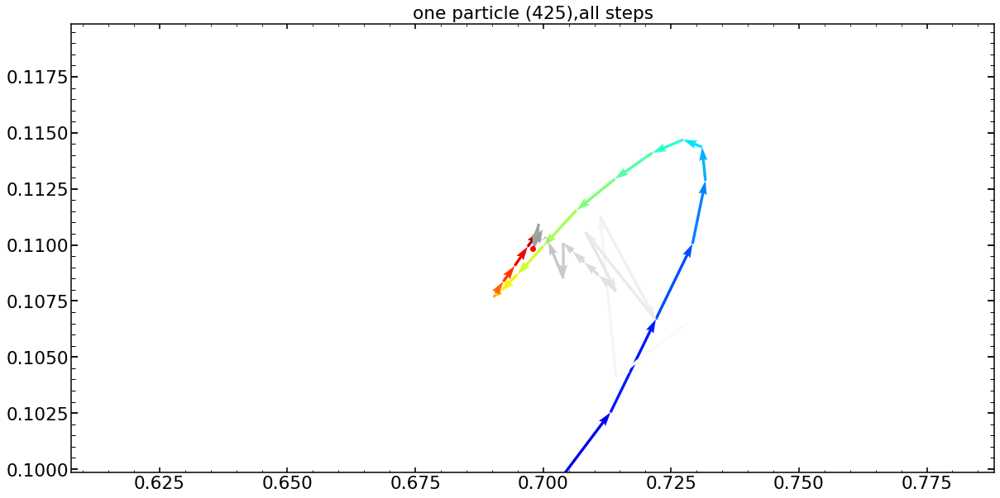

In [315]:
nsteps=chain0_swarm_1.shape[0]


j=0
n_particle=425
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle ('+str(n_particle)+'),all steps')

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors)
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,ls='--')
plt.scatter(X_best[-1],Y_best[-1],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.xlim(X_best[-1]-3*delta_X,X_best[-1]+3*delta_X)
plt.ylim(Y_best[-1]-3*delta_Y,Y_best[-1]+3*delta_Y)

Text(0, 0.5, 'parameter: 39')

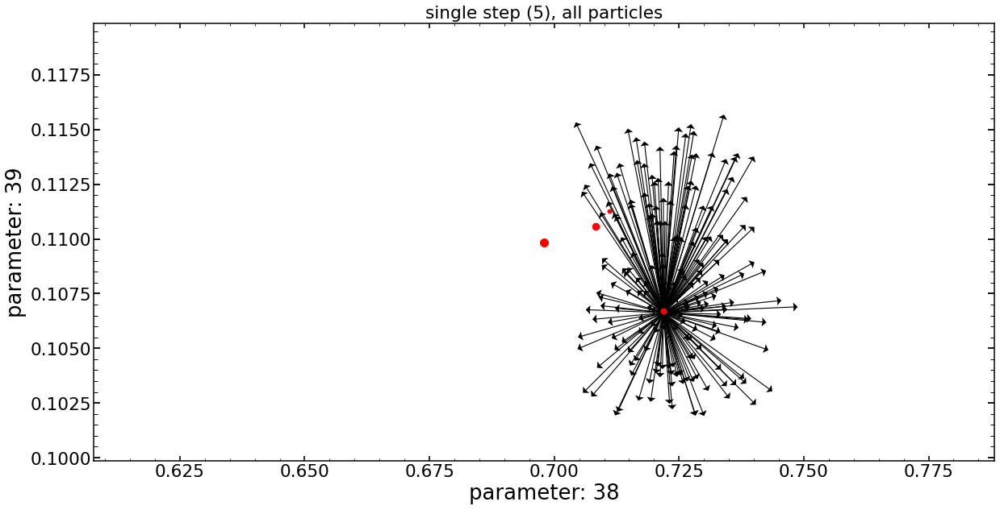

In [316]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

In [317]:
X[0:number_of_particles_shown]

array([0.72194955, 0.72204326, 0.72205478, 0.72205893, 0.72183111,
       0.72198561, 0.7220876 , 0.72190071, 0.7219325 , 0.7218232 ,
       0.72221554, 0.72201522, 0.72167894, 0.72191207, 0.72188223,
       0.72199127, 0.72170529, 0.72187231, 0.72214998, 0.72188751,
       0.72210118, 0.72175639, 0.72199427, 0.72180355, 0.72188818,
       0.72201164, 0.72180936, 0.72203651, 0.72202447, 0.72175164,
       0.72215926, 0.72196349, 0.7216943 , 0.72226973, 0.72196889,
       0.72218578, 0.72174363, 0.72200312, 0.7218744 , 0.7218036 ,
       0.72182532, 0.72170006, 0.72225672, 0.72163013, 0.72203929,
       0.72173406, 0.72174878, 0.7218709 , 0.72191771, 0.72187287,
       0.72210705, 0.72195957, 0.72224911, 0.72202238, 0.72195626,
       0.72194914, 0.72214455, 0.72165374, 0.72178353, 0.7219952 ,
       0.72202997, 0.72211827, 0.72190228, 0.7221111 , 0.72201799,
       0.72190834, 0.72221088, 0.72163177, 0.72211808, 0.72201261,
       0.72198463, 0.72165739, 0.72212234, 0.72186636, 0.72185

In [318]:
 U

array([ 0.00220878,  0.00783758,  0.00852972,  0.00877892, -0.00490581,
        0.004375  ,  0.01050115, -0.00072483,  0.0011848 , -0.005381  ,
        0.01818621,  0.00615342, -0.01404651, -0.00004284, -0.00183487,
        0.00471498, -0.01246331, -0.00243094,  0.01424848, -0.00151815,
        0.01131711, -0.00939432,  0.00489484, -0.00656109, -0.00147738,
        0.00593844, -0.00621239,  0.00743203,  0.00670923, -0.00967953,
        0.01480586,  0.00304591, -0.01312366,  0.02144116,  0.00337044,
        0.016399  , -0.01016069,  0.00542659, -0.00230556, -0.00655827,
       -0.00525334, -0.01277777,  0.02066002, -0.01697855,  0.00759935,
       -0.01073538, -0.00985104, -0.00251584,  0.00029595, -0.00239754,
        0.01166928,  0.00281059,  0.02020279,  0.00658348,  0.00261157,
        0.0021841 ,  0.01392237, -0.01555981, -0.00776369,  0.0049508 ,
        0.00703928,  0.01234335, -0.00063056,  0.01191296,  0.00631986,
       -0.00026684,  0.0179065 , -0.01687969,  0.01233225,  0.00

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2821/chainMay2821_Single_P_34437118ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.3615632851918535
average chi2 reduced is: -4.741222778273953
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2821/chainMay2821_Single_P_34437118ArSwarm1.npy
(21, 480, 129)


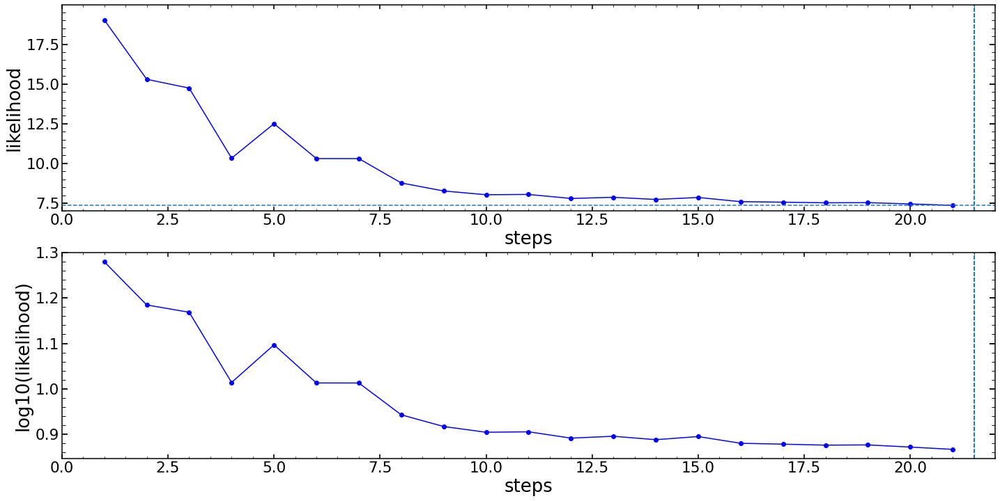

In [319]:
single_analysis.create_fitting_evolution_plot()

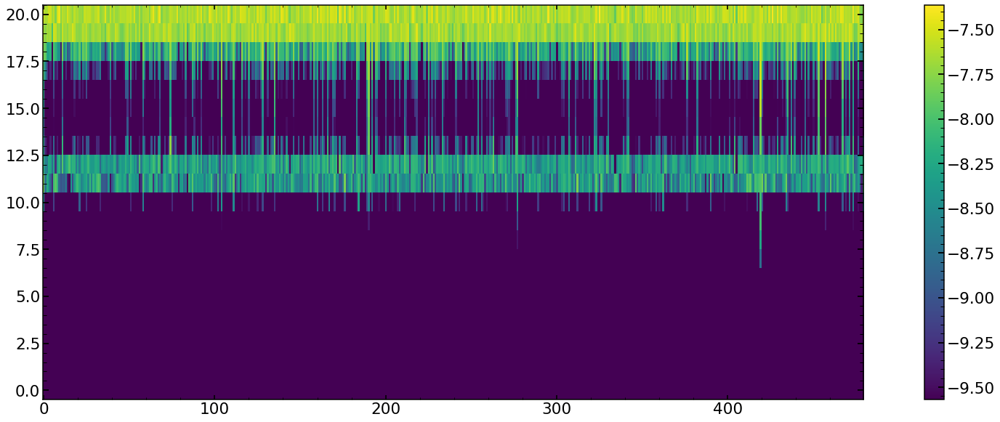

In [320]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()

In [321]:
list_of_which_particle_is_gbest=[]
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,38]==gbests_positions[i][38])[0][0]])

In [322]:
list_of_which_particle_is_gbest

[[0, 419],
 [1, 419],
 [2, 0],
 [3, 464],
 [4, 223],
 [5, 404],
 [6, 419],
 [7, 419],
 [8, 419],
 [9, 419],
 [10, 419],
 [11, 312],
 [12, 263],
 [13, 74],
 [14, 419],
 [15, 419],
 [16, 419],
 [17, 419],
 [18, 457],
 [19, 261],
 [20, 325]]

### image analysis 

In [199]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
#                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   32.22567211    -2.84233175    -1.38853808    -0.33929127
     0.77613744    -0.53716545    -0.50862084     0.88338617
     0.05926845     0.25076177    -0.15412505     0.02043507
     0.02462387     0.11501181     0.02333005    -0.02619306
    -0.04548757    -0.01886651     0.13800486     0.70449815
     0.10236876    -0.21129985     0.2737523      0.06149946
     0.10636336     0.

chi2 within shgo with use_only_chi True and use_center_of_light False [-14.00097944  -4.88439608] / 8.03463
chi2 within shgo with use_only_chi True and use_center_of_light False [-16.50097944 -19.88439608] / 12.92672
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.50097944  0.11560392] / 13.16749
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.50097944  -9.88439608] / 4.8309574
chi2 within shgo with use_only_chi True and use_center_of_light False [-21.50097944  10.11560392] / 24.569965
chi2 within shgo with use_only_chi True and use_center_of_light False [-20.87597944  -8.63439608] / 10.874381
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.87597944  11.36560392] / 22.910616
chi2 within shgo with use_only_chi True and use_center_of_light False [ -5.87597944 -18.63439608] / 12.134887
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.87597944   1.36560392] / 14.232637
chi2 within shgo

chi2 within shgo with use_only_chi True and use_center_of_light False [-11.34607274 -10.03108498] / 4.8259034
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.34607918 -10.03109009] / 4.825903
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.34607489 -10.03108668] / 4.825903
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.34607811 -10.03108924] / 4.825903
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.34607703 -10.03108839] / 4.8259034
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.34607969 -10.03108664] / 4.825903
We are fitting for only one source
One source fitting result is [-11.34608021 -10.03108319]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.7601890563964844
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disr

simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
Time for postprocessing up to single_Psf_position protocol is 0.5805692672729492
parameter use_only_chi in Psf_postion is set to: True
parameter use_center_of_flux in Psf_postion is set to: False
offset_initial_and_sci: [-0.76216181 -0.03570086]
chi2 within shgo with use_only_chi True and use_center_of_light False [-17.62161814 -20.35700857] / 28.052288
chi2 within shgo with use_only_chi True and use_center_of_light False [-7.62161814 -0.35700857] / 5.2957916
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.62161814 -10.35700857] / 12.952522
chi2 within shgo with use_only_chi True and use_center_of_light False [-12.62161814   9.64299143] / 17.153471
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.12161814  -5.35700857] / 7.7690744
chi2 within shgo with use_only_chi True and use_center_of_light False [-0.12161814

chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77331338 -1.95723273] / 4.738488
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77330188 -1.95723238] / 4.7384887
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77329039 -1.95723203] / 4.7384887
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77327256 -1.95720199] / 4.7384887
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77329555 -1.95720269] / 4.7384887
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77327831 -1.95720216] / 4.7384887
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77328406 -1.95720234] / 4.738488
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77327514 -1.95718731] / 4.738488
chi2 within shgo with use_only_chi True and use_center_of_light False [-6.77328664 -1.95718766] / 4.738488
chi2 within shgo with use_only_c

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004398822784423828
Time for FFT is 0.2969059944152832
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 1980
optPsf_cut.shape(1981, 1981)
oversampling:10
optPsf_cut.shape[0]1981
size_of_optPsf_cut_downsampled: 560.0
optPsf_cut_downsampled.shape: (561, 561)
size_of_optPsf_cut_in_Microns: 841.5
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[36531.72636471021, 2.32348704283297, 0.006886271868838824, 0.46311424555366637, 1.8684774496827912]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(561, 561)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
Time for postprocessing up to single_Psf_position protocol is 0.459218978881835

chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33781122 -13.88575639] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33782775 -13.88568127] / 4.74862
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33781536 -13.88573761] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33781949 -13.88571883] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33781673 -13.88574522] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.337825   -13.88570766] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.3378188  -13.88573583] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33782087 -13.88572644] / 4.7486196
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.33781949 -13.88573964] / 4.7486196
We are fitti

chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.08393132 -15.61290115] / 1.2703231024171262
chi2 within shgo with use_only_chi True and use_center_of_light True [6.91606868 4.38709885] / 0.961350622776642
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91606868 -5.61290115] / 0.2667795956329057
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.08393132 14.38709885] / 1.921311744945303
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.45893132 -4.36290115] / 0.8080182037323362
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.54106868 15.63709885] / 1.849202926690665
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.54106868 -14.36290115] / 1.2839506024924132
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.45893132  5.63709885] / 0.9158125247186734
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.

Finished with optPsf_postprocessing
 
Image in focus, using pipeline normalization; multiplying all values in the model by 1.0406017
Finished with lnlike_Neven
chi_almost/d.o.f is 6.240125; chi_almost_max_dof is 40.33284 log(improvment) is -0.81046546
The likelihood reported is: -6.2401251792907715
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4471154112
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4471154112 is: 4.679366827011108 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Di

chi2 within shgo with use_only_chi True and use_center_of_light True [-4.87545347 -4.82365441] / 0.012780232037132357
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.87545349 -4.82365441] / 0.01278023554015894
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.87545347 -4.82365443] / 0.012780232512198323
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.64036934 -4.79177328] / 0.033801904930917795
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.78987579 -4.81204872] / 0.019845524881945686
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.84363668 -4.81933955] / 0.015237979294465215
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.86342588 -4.82202328] / 0.013675627498800375
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.87086613 -4.8230323 ] / 0.013116153021928508
chi2 within shgo with use_only_chi True and use_center_of

We are fitting for only one source
One source fitting result is [-4.95755315 -4.92480924]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.2897322177886963
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Image in focus, using pipeline normalization; multiplying all values in the model by 0.995111
Finished with lnlike_Neven
chi_almost/d.o.f is 4.933538; chi_almost_max_dof is 32.616055 log(improvment) is -0.8202729
The likelihood reported is: -4.93353796005249
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4471154112
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4471154112 is: 3.7268178462982178 seconds
 
##############################

chi2 within shgo with use_only_chi True and use_center_of_light True [-7.60797761  8.54613984] / 0.8803428311501368
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.35797761 -3.95386016] / 0.9625835747526785
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.64202239 16.04613984] / 1.270124598367242
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.64202239 -13.95386016] / 1.9232934449181447
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.35797761  6.04613984] / 0.2669712221493715
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.85797761 -8.95386016] / 1.2846567221987601
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.14202239 11.04613984] / 0.9511166380971474
chi2 within shgo with use_only_chi True and use_center_of_light True [1.14202239 1.04613984] / 0.28063399576894
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.85

chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10931504  3.62359786] / 3.2997867509376296e-06
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10928013  3.62361992] / 1.2480894765690868e-06
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10927311  3.62358915] / 2.01814494808601e-06
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10927865  3.62359885] / 9.25028591281358e-07
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10928677  3.62357612] / 3.0981211377005885e-06
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10928179  3.62360897] / 1.6798066338174962e-07
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.10927219  3.62361063] / 1.1118085073257222e-06
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.1092762   3.62360727] / 6.547581063127835e-07
chi2 within shgo with use_only_chi True and u

optPsf_cut_downsampled.shape: (701, 701)
size_of_optPsf_cut_in_Microns: 1051.5
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[36531.72636471021, 2.32348704283297, 0.006886271868838824, 0.46311424555366637, 1.8684774496827912]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(701, 701)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
Time for postprocessing up to single_Psf_position protocol is 0.5786740779876709
parameter use_only_chi in Psf_postion is set to: True
parameter use_center_of_flux in Psf_postion is set to: False
offset_initial_and_sci: [ 0.2843726  -0.26019441]
chi2 within shgo with use_only_chi True and use_center_of_light False [ -7.15627404 -22.60194412] / 25.002363
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.84372596 -2.60194412] / 4.8324285
chi2 within shgo with use_o

chi2 within shgo with use_only_chi True and use_center_of_light False [ 4.07678246 -4.30220106] / 4.2104263
chi2 within shgo with use_only_chi True and use_center_of_light False [ 4.07676881 -4.30219763] / 4.210426
chi2 within shgo with use_only_chi True and use_center_of_light False [ 4.07677336 -4.30219878] / 4.210426
chi2 within shgo with use_only_chi True and use_center_of_light False [ 4.07677085 -4.30219547] / 4.210426
We are fitting for only one source
One source fitting result is [ 4.07677743 -4.30219445]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.5145480632781982
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9876999980767307
Finished with lnlike_Neven
chi_almost/d.o.f is 4.868168; chi_almost_max_dof is 70.4936 log(improvment) is -1.16

chi2 within shgo with use_only_chi True and use_center_of_light False [ 9.16153502 25.12272799] / 19.78683
chi2 within shgo with use_only_chi True and use_center_of_light False [14.16153502 -4.87727201] / 11.473861
chi2 within shgo with use_only_chi True and use_center_of_light False [ 4.16153502 15.12272799] / 11.810511
chi2 within shgo with use_only_chi True and use_center_of_light False [8.53653502 3.87272799] / 4.382725
chi2 within shgo with use_only_chi True and use_center_of_light False [8.53653504 3.87272799] / 4.382725
chi2 within shgo with use_only_chi True and use_center_of_light False [8.53653502 3.872728  ] / 4.382725
chi2 within shgo with use_only_chi True and use_center_of_light False [8.53653502 3.87272799] / 4.382725
chi2 within shgo with use_only_chi True and use_center_of_light False [8.96336177 3.87272799] / 4.397556
chi2 within shgo with use_only_chi True and use_center_of_light False [8.53653502 4.06636438] / 4.360479
chi2 within shgo with use_only_chi True and use

We are fitting for only one source
One source fitting result is [8.64290073 4.3516425 ]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.7269139289855957
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9868269605262605
Finished with lnlike_Neven
chi_almost/d.o.f is 5.247953; chi_almost_max_dof is 70.456055 log(improvment) is -1.1279284
The likelihood reported is: -5.247952938079834
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4471154112
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4471154112 is: 5.2

chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.03053419 -7.61831814] / 5.269517
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.06760495 -7.80079283] / 5.2770877
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.07455571 -7.5612948 ] / 5.268867
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.99114651 -7.51567613] / 5.271056
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.08324417 -7.62687164] / 5.2689114
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.12726569 -7.5698483 ] / 5.2686243
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.17563144 -7.54561339] / 5.2696443
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.11857723 -7.50427146] / 5.270138
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.09207744 -7.5962216 ] / 5.2684507
chi2 within shgo with use_only_c

In [200]:
#index_of_single_image=8
#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
#                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

In [201]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [202]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-215.87121582 -209.41952515 -205.4322052  -158.58338928 -127.20812225
 -119.05495453 -218.79428101 -229.09568787 -242.25369263]


'model pixels with a flux larger than (quantile_08_focus): 16.822856903076207'

mean reported value:-5.604486624399821
array_of_single_res: [-6.07666683 -5.69015694 -5.45778131 -6.24012518 -4.93353796 -5.6411438
 -4.86816788 -5.24795294 -6.28484678]
renormalization factors: [1 1 1 1 1 1 1 1 1]
array_of_single_res renormalized: [-6.07666683 -5.69015694 -5.45778131 -6.24012518 -4.93353796 -5.6411438
 -4.86816788 -5.24795294 -6.28484678]


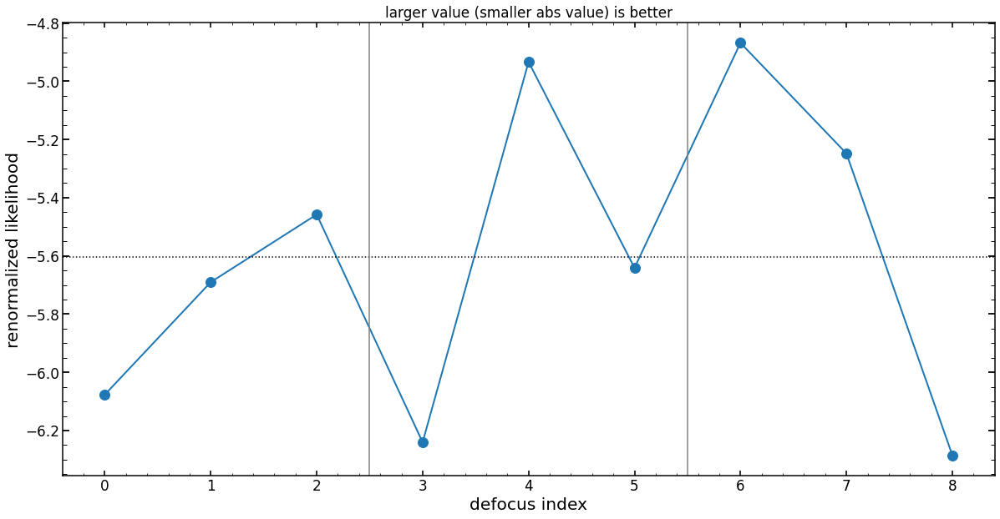

In [203]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.array([1,1,1,1,1,1,1,1,1])


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [204]:
minchain=list_of_minchain[4]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0  0.141509 -0.866217 -0.492212 -0.350574  0.462323 -0.444646 -0.580683   

        z11  
0  0.584267  
##############################################
        z12       z13       z14       z15       z16       z17       z18  \
0  0.032346  0.224784 -0.051462  0.031311  0.056816  0.049346  0.030785   

        z19       z20       z21       z22  
0 -0.035854 -0.030686  0.025259  0.046064  

##############################################
    hscFrac  strutFrac  dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.704498   0.102369  -0.2113  0.273752  0.061499     0.106363
##############################################
     wide_0   wide_23   wide_43  misalign
0  0.121338  0.290224  0.264646  1.173067
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.034594 -0.011542                       0.878269   0.027971   

   frd_lorentz_factor  

(-1.5, -0.5)

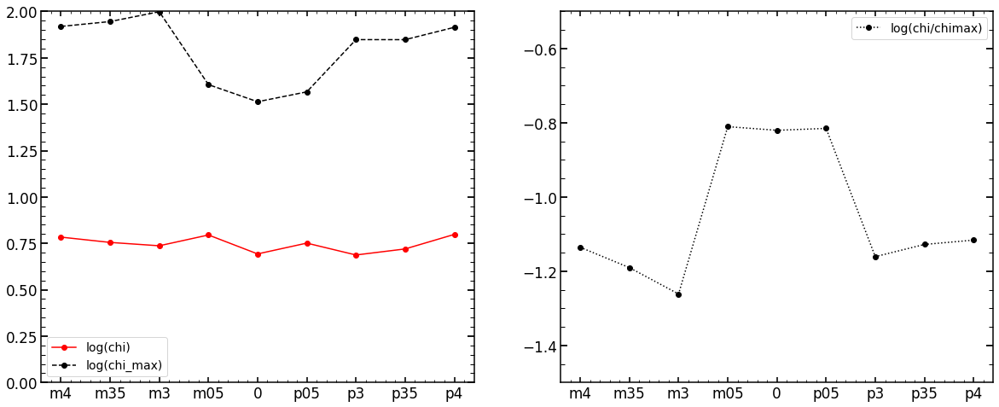

In [205]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

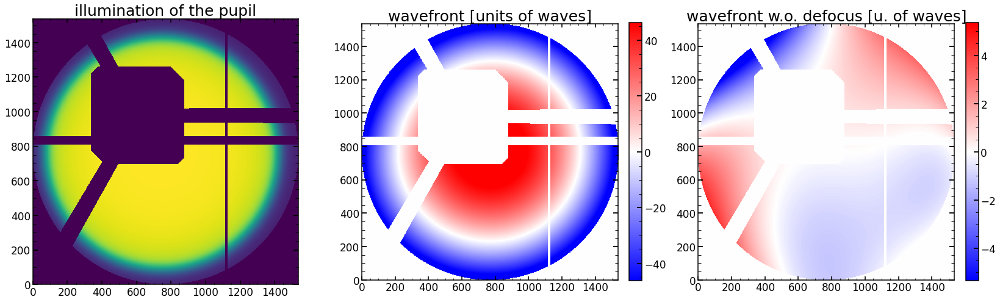

In [206]:
# save has to be save=1 for this to update
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 45.24108123779297
---------------------
chi**2 max reduced is: 6623.747
chi**2 reduced is: 48.832756 for log improvment: -2.1323924
chi max reduced is: 61.07741
chi reduced is: 4.8258276 for log improvment: -1.1023089
---------------------
chi**2 reduced within custom mask area is: 48.83275
---------------------
chi**2 max reduced within flux mask area is: 9452.83
chi**2 reduced within flux mask area is: 67.55643 for log improv

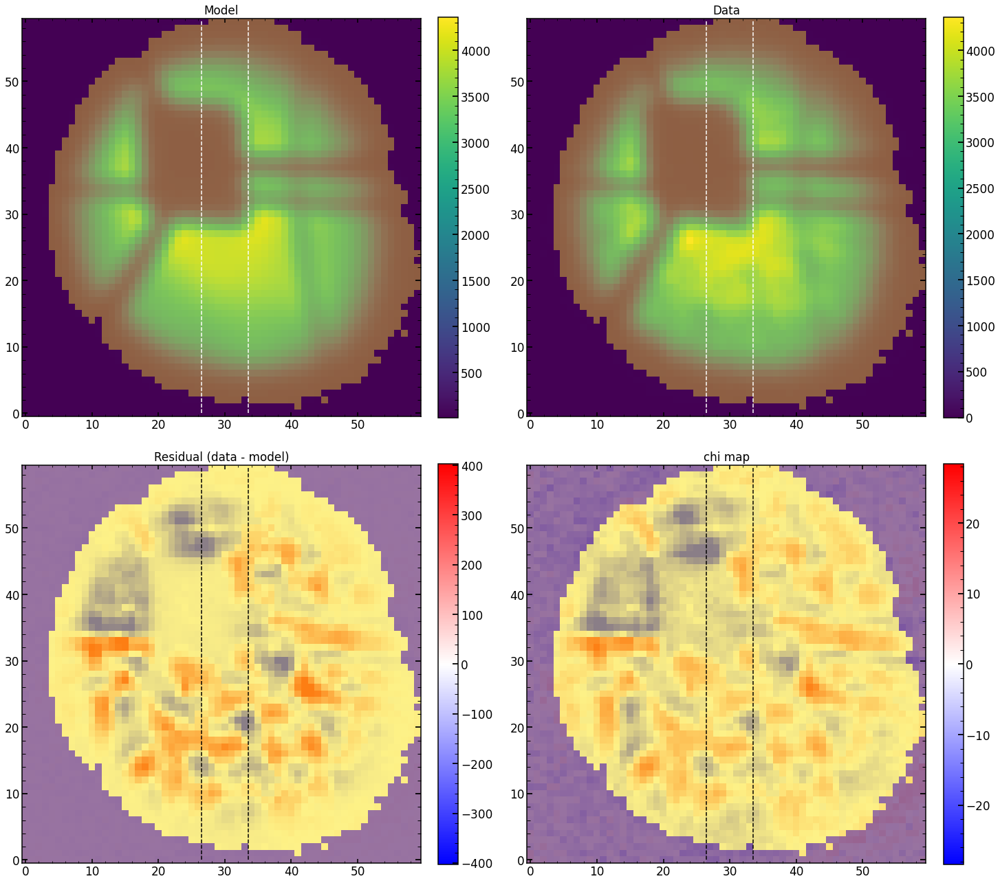

In [207]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_single_model_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_var_images)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 45.24108123779297
fraction of chi2 due to 1% of pixels: 0.14793368
---------------------
chi**2 max reduced is: 6623.747
chi**2 reduced is: 48.832756 for log improvment: -2.1323924
chi max reduced is: 61.07741
chi reduced is: 4.8258276 for log improvment: -1.1023089
---------------------
chi**2 reduced within custom mask area is: 48.83275
---------------------
chi**2 max reduced within flux mask area is: 9452.83
chi**2 reduced 

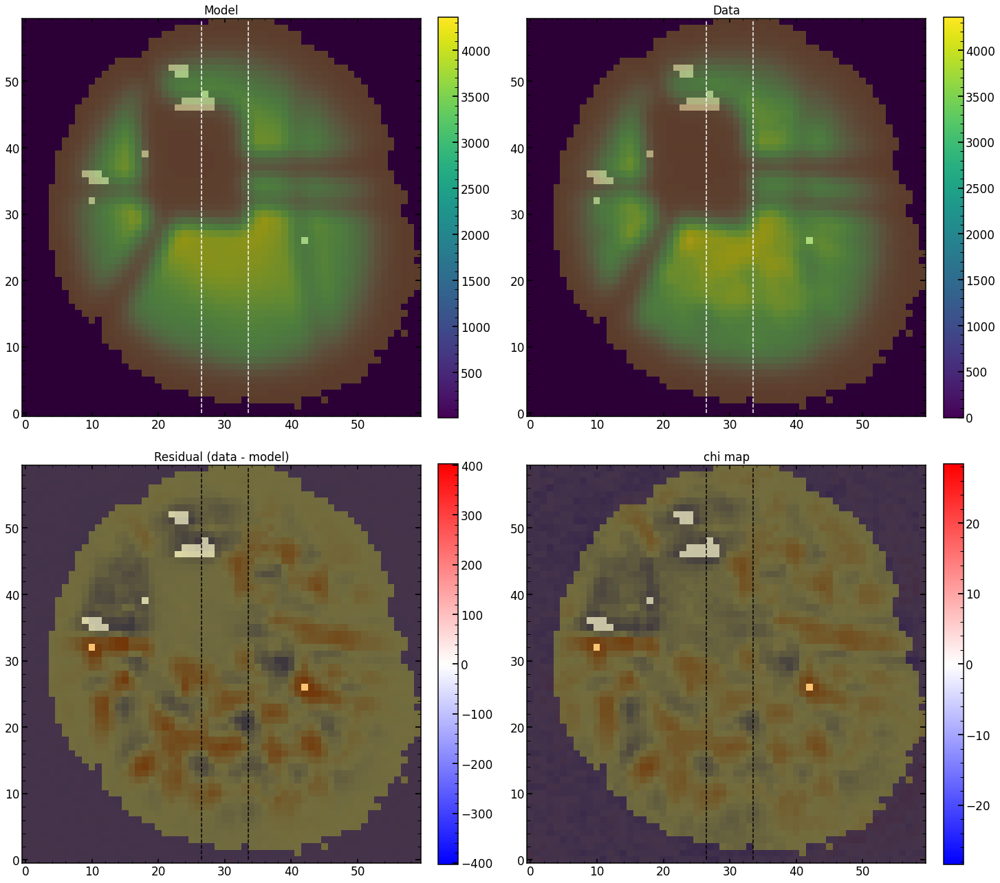

In [208]:

model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 45.24108123779297
---------------------
chi**2 max reduced is: 6623.747
chi**2 reduced is: 48.832756 for log improvment: -2.1323924
chi max reduced is: 61.07741
chi reduced is: 4.8258276 for log improvment: -1.1023089
---------------------
chi**2 reduced within custom mask area is: 48.83275
---------------------
chi**2 max reduced within flux mask area is: 9452.83
chi**2 reduced within flux mask area is: 67.55643 for log improv

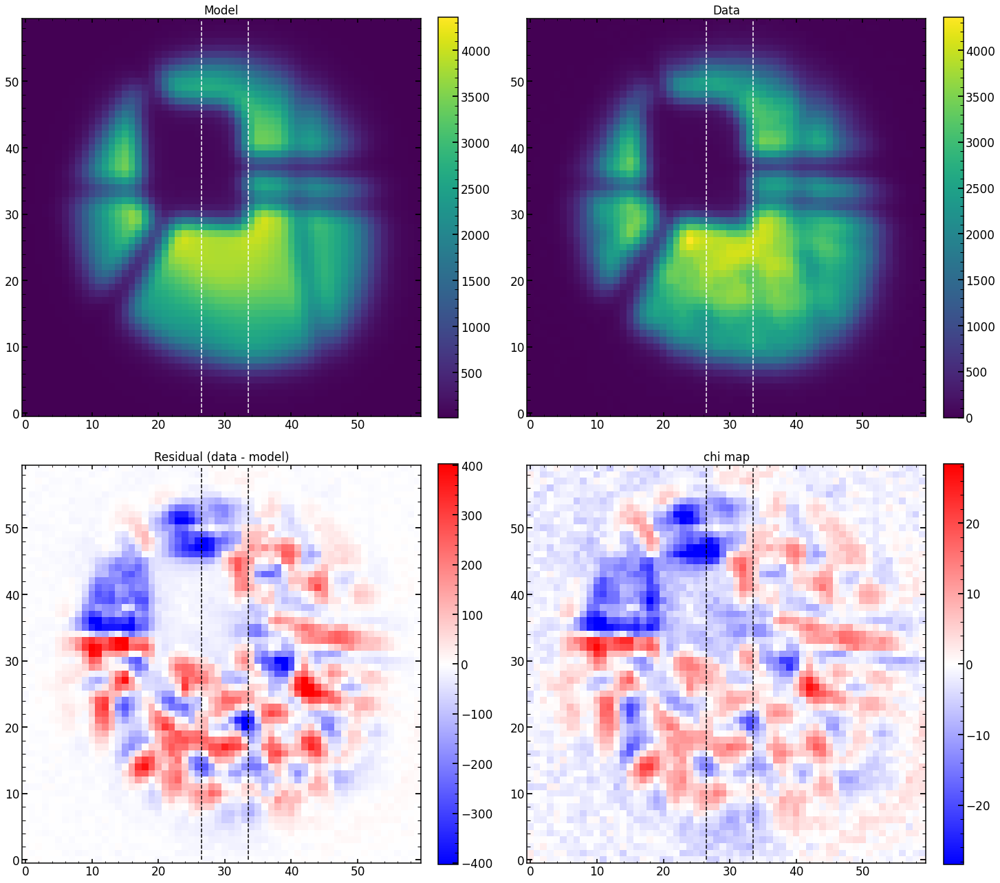

In [209]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 10.439679622650146
---------------------
chi**2 max reduced is: 660.39233
chi**2 reduced is: 14.502176 for log improvment: -1.6583688
chi max reduced is: 9.891563
chi reduced is: 2.2950718 for log improvment: -0.6344687
---------------------
chi**2 reduced within custom mask area is: 14.502175
---------------------
chi**2 max reduced within flux mask area is: 2500.011
chi**2 reduced within flux mask area is: 46.785034 for log 

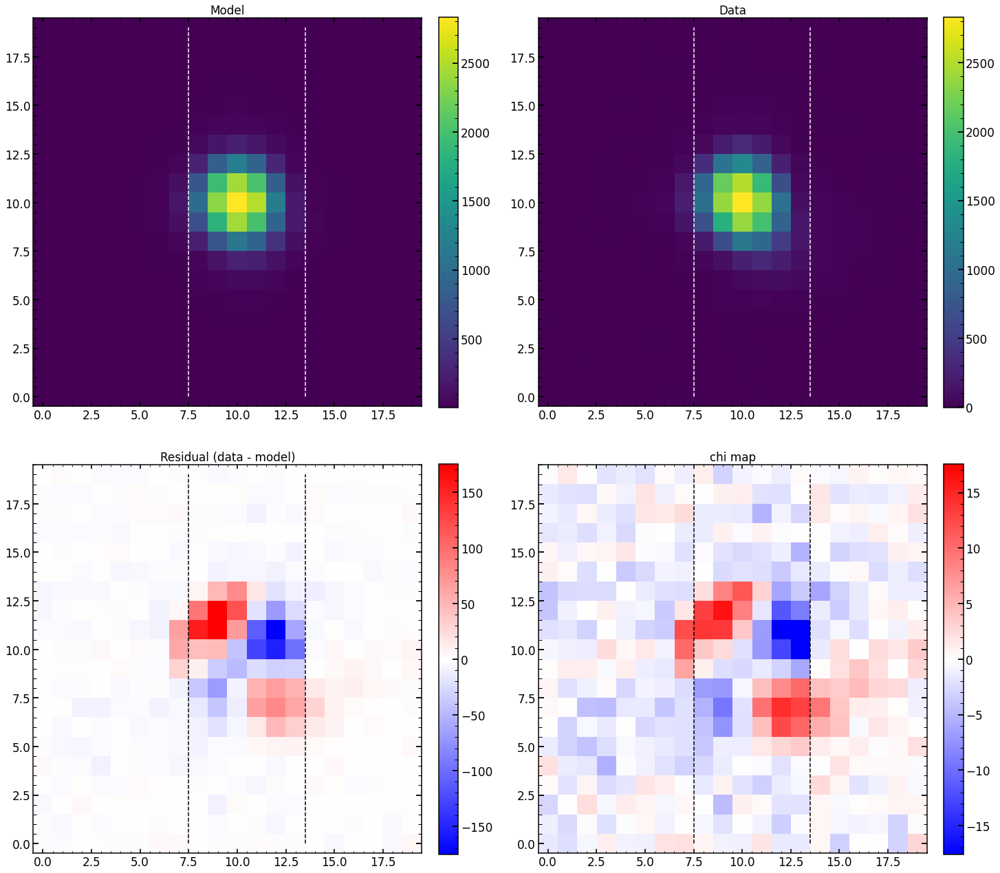

In [210]:
index_of_single_image=4
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 660.39233
chi**2 reduced is: 14.502176
Abs of residual divided by total flux is: 0.10871057
Abs of residual divided by largest value of a flux in the image is: 0.081341684


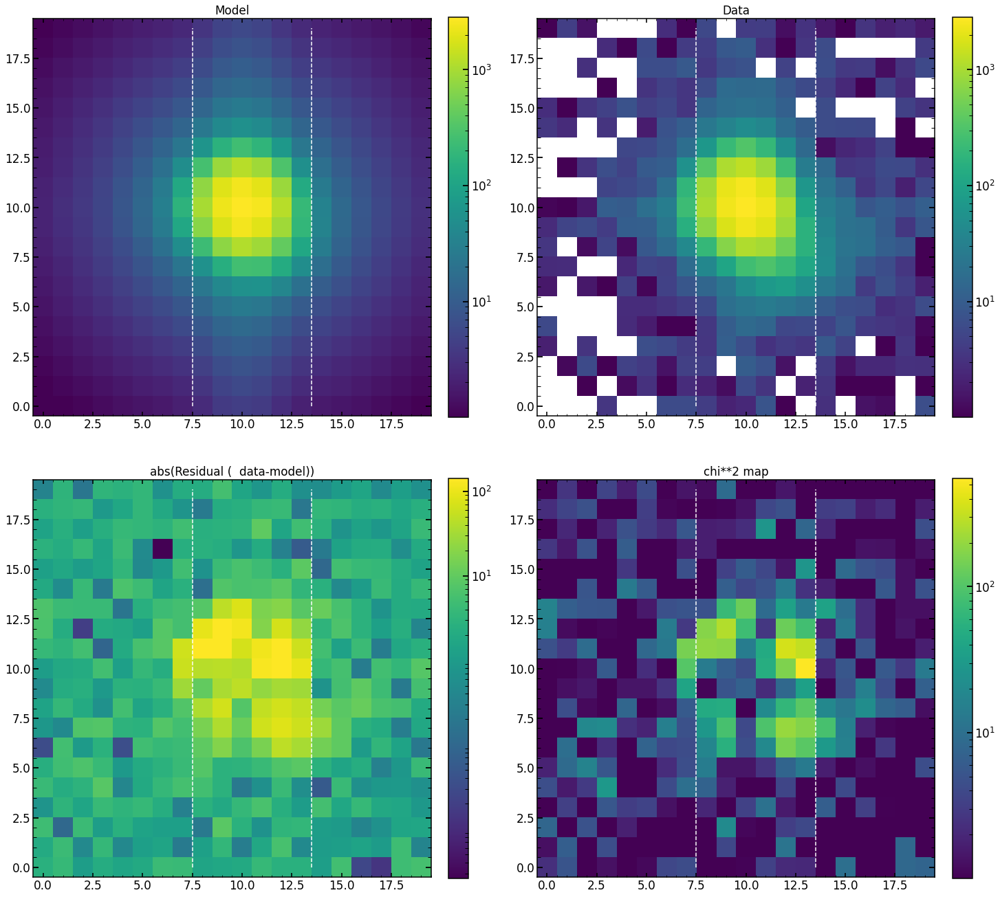

In [211]:
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

14.502176
chi**2 reduced is: 14.502176
Abs of residual divided by total flux is: 0.10871057
Abs of residual divided by largest value of a flux in the image is: 0.081341684


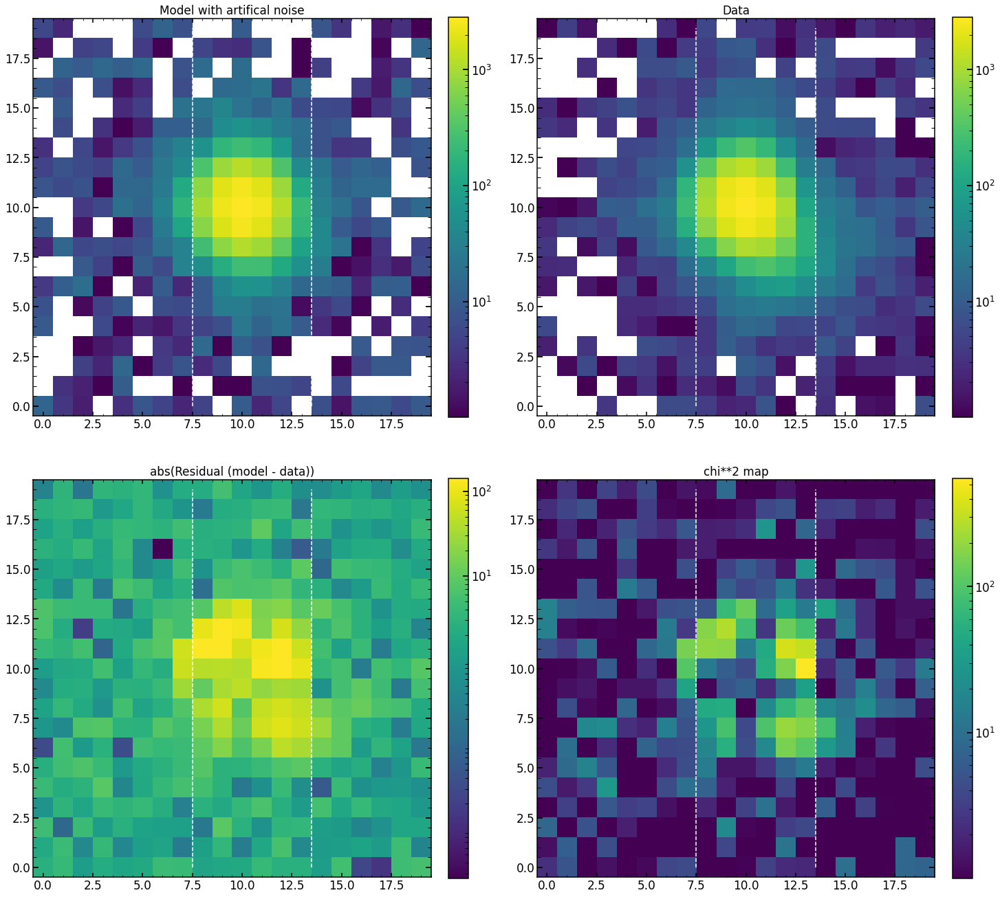

In [212]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

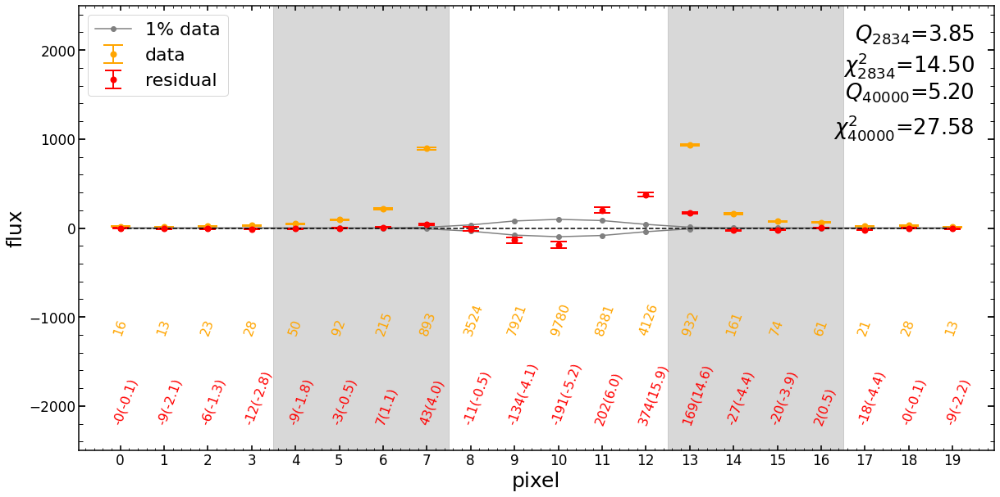

In [35]:
index_of_single_image=4
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

In [415]:
list_of_minchain[8]

array([  -30.39018189,     0.06736144,     0.39590545,     0.13056717,
          -0.01830373,    -0.08719915,    -0.32542055,    -0.35584825,
          -0.03214684,     0.00545394,     0.01501401,     0.03161113,
          -0.02622804,     0.01130876,     0.01194769,    -0.00033766,
          -0.01068694,     0.01146058,    -0.06897183,     0.65492422,
           0.07      ,    -0.0321214 ,     0.04006749,     0.06063299,
           0.00675912,     0.16196142,     0.17645599,     0.27762149,
           0.7642588 ,     0.02050476,    -0.06471026,     0.92050385,
           0.03592068,     0.84299629,     1.01952281,     0.17414345,
       28417.33357048,     2.31060376,     0.00253692,     0.31020259,
           1.81207546,     0.99866357,    -0.00978547,    -0.00359741,
          -0.00290931,     0.00275294,     0.00483906,    -0.00305993,
           0.00606414,     0.00121816,     0.00884854,     0.00413912,
           0.02782559,    -0.00921102,    -0.00541536,    -0.00180266,
      

## testing the block 

In [ ]:
    """
    initial_model_result,final_model_result,\
    list_of_initial_model_result,list_of_final_model_result,\
    out_images, pre_images, list_of_image_final,\
    allparameters_parametrization_proposal, allparameters_parametrization_proposal_after_iteration,\
    list_of_initial_input_parameters, list_of_finalinput_parameters,\
    list_of_pre_chi2,list_of_after_chi2,\
    list_of_psf_positions,list_of_final_psf_positions,\
    [uber_images_normalized,uber_M0_std,H_std,array_of_delta_z_parametrizations_None,list_of_final_psf_positions] 
    
    0. likelihood averaged over all images (before the function)    
    1. likelihood averaged over all images (after the function)
    2. likelihood per image (output from model_multi) (before the function)
    3. likelihood per image (output from model_multi) (after the function)
    4. out_images
    5. list of initial model images
    6. list of final model images 
    7. parametrization before the function
    8. parametrization after the function
    9. list of parameters per image (before the function)
    10. list of parameters per image (after the function)
    11. list of chi2 per image (before the function)
    12. list of chi2 per image (after the function)
    13. list of psf position of image (function the function)
    14. list of psf position of image (after the function)
    """

In [332]:
# non-dedicated
best_result0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/best_result0.npy',allow_pickle=True)
array_of_particle_position_proposal=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_particle_position_proposal0.npy',allow_pickle=True)
out20=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/out20.npy',allow_pickle=True)

In [283]:
# dedicated
best_result_from_Tokovinin_5=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/best_result_from_Tokovinin_5.npy',allow_pickle=True)
best_result0_global=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/best_result0_global.npy',allow_pickle=True)
out20_global=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/out20_global.npy',allow_pickle=True)


In [284]:
multi_background_factor=80
verbosity=2

list_of_mean_value_of_background=[]
list_of_flux_mask=[]
list_of_sci_image_std=[]
for i in range(len(list_of_sci_images)):
    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]

    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])
    if verbosity>1:
        print(str(multi_background_factor)+'x mean_value_of_background in image with index'+str(i)+' is estimated to be: '+str(mean_value_of_background))


    list_of_mean_value_of_background.append(mean_value_of_background)
    flux_mask=sci_image>(mean_value_of_background)


    # normalized science image
    var_image=list_of_var_images[i]
    sci_image_std=sci_image/np.sqrt(var_image)
    list_of_sci_image_std.append(sci_image_std)
    list_of_flux_mask.append(flux_mask)

80x mean_value_of_background in image with index0 is estimated to be: 1206.4288330078125
80x mean_value_of_background in image with index1 is estimated to be: 1828.70361328125
80x mean_value_of_background in image with index2 is estimated to be: 3751.1190795898438
80x mean_value_of_background in image with index3 is estimated to be: 337.32757568359375
80x mean_value_of_background in image with index4 is estimated to be: 278.3914566040039
80x mean_value_of_background in image with index5 is estimated to be: 284.07543182373047
80x mean_value_of_background in image with index6 is estimated to be: 512.4932861328125
80x mean_value_of_background in image with index7 is estimated to be: 463.8100814819336
80x mean_value_of_background in image with index8 is estimated to be: 751.5959167480469


In [285]:
previous_best_result=best_result0    

main_body_of_best_result=previous_best_result[:-1]
previous_best_result=previous_best_result[-1]


# we need actual final model images from the previous best result
#list_of_image_0_from_previous_best_result=main_body_of_best_result[6]
#list_of_image_0=list_of_image_0_from_previous_best_result

# we need actual initial model images from the previous best result
# this will be used to evalute change of model due to changes in singel wavefront parameters
# i.e., to estimate matrix H
list_of_image_0_from_previous_best_result=main_body_of_best_result[5]
list_of_image_0=list_of_image_0_from_previous_best_result


list_of_flux_mask=list_of_flux_mask 
list_of_sci_image_std=list_of_sci_image_std

list_of_image_0_std=[]
for i in range(len(list_of_image_0)):
    # normalizing by standard deviation image
    STD=np.sqrt(list_of_var_images[i])    
    image_0=list_of_image_0[i]
    list_of_image_0_std.append(image_0/STD)  
    
    
list_of_M0=[]
list_of_M0_std=[]
for i in range(len(list_of_image_0_std)):

    image_0=list_of_image_0[i]
    image_0_std=list_of_image_0_std[i]
    flux_mask=list_of_flux_mask[i]


    M0=image_0[flux_mask].ravel()            
    #M0=((image_0[flux_mask])/np.sum(image_0[flux_mask])).ravel()
    M0_std=((image_0_std[flux_mask])/1).ravel()
    #M0_std=((image_0_std[flux_mask])/np.sum(image_0_std[flux_mask])).ravel()

    list_of_M0.append(M0)
    list_of_M0_std.append(M0_std)

# join all M0,M0_std from invidiual images into one uber M0,M0_std
uber_M0_previous_best=[item for sublist in list_of_M0 for item in sublist]
uber_M0_previous_best_std=[item for sublist in list_of_M0_std for item in sublist]    

uber_M0_previous_best=np.array(uber_M0_previous_best)
uber_M0_previous_best_std=np.array(uber_M0_previous_best_std)

out_images=main_body_of_best_result[4]   

# join all images together
list_of_images_normalized_uber=[]
list_of_images_normalized_std_uber=[]
# go over (zmax-3)*2 images
for j in range(len(out_images)):
    # two steps for what could have been achived in one, but to ease up transition from previous code 
    out_images_single_parameter_change=out_images[j]
    optpsf_list=out_images_single_parameter_change

    # flux image has to correct per image
    #  mask images that have been created in the fitting procedure with the appropriate flux mask
    images_normalized=[]
    for i in range(len(optpsf_list)):

        flux_mask=list_of_flux_mask[i]
        if j==0:

            #print('sum_flux_in images'+str([i,np.sum(flux_mask)]))
            pass
        images_normalized.append((optpsf_list[i][flux_mask]).ravel())                
        # !old double-normalizing code
        # !images_normalized.append((optpsf_list[i][flux_mask]/np.sum(optpsf_list[i][flux_mask])).ravel())



    images_normalized_flat=[item for sublist in images_normalized for item in sublist]  
    images_normalized_flat=np.array(images_normalized_flat)
    #images_normalized_flat=np.array(images_normalized_flat)/len(optpsf_list)        

    # list of (zmax-3)*2 raveled images
    list_of_images_normalized_uber.append(images_normalized_flat)

    # same but divided by STD
    images_normalized_std=[]
    for i in range(len(optpsf_list)):   
        # seems that I am a bit more verbose here with my definitions
        optpsf_list_i=optpsf_list[i]


        # do I want to generate new STD images, from each image?
        STD=list_of_sci_image_std[i]
        optpsf_list_i_STD=optpsf_list_i/STD    
        flux_mask=list_of_flux_mask[i]
        #images_normalized_std.append((optpsf_list_i_STD[flux_mask]/np.sum(optpsf_list_i_STD[flux_mask])).ravel())

    # join all images together
    #images_normalized_std_flat=[item for sublist in images_normalized_std for item in sublist]  
    # normalize so that the sum is still one
    #images_normalized_std_flat=np.array(images_normalized_std_flat)/len(optpsf_list)

    #list_of_images_normalized_std_uber.append(images_normalized_std_flat)

# create uber images_normalized,images_normalized_std    
# images that have zmax*2 rows and very large number of columns (number of non-masked pixels from all N images)
uber_images_normalized_previous_best=np.array(list_of_images_normalized_uber)   


number_of_extra_zernike=56-22
list_of_delta_z_parametrizations=[]
for z_par in range(0,19*2+2*number_of_extra_zernike):
    z_par_i=z_par+4
    # if this is the parameter that change
    if np.mod(z_par_i,2)==0:
        list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
    if np.mod(z_par_i,2)==1:
        list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))
                    
array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)
array_of_delta_parametrizations=array_of_delta_z_parametrizations



array_of_delta_parametrizations_None_previous_best=previous_best_result[3]

# ratio between current parametrization and the previous (provided) changed parametrization
ratio_of_parametrizations=(array_of_delta_parametrizations[:,None]/array_of_delta_parametrizations_None_previous_best)

# create the array of how wavefront changes the uber_model by multiply the changes with new ratios
array_of_wavefront_changes=np.transpose(ratio_of_parametrizations*\
                                        np.array(uber_images_normalized_previous_best-uber_M0_previous_best)/(array_of_delta_parametrizations_None_previous_best))  
        

In [286]:
# dedicated


previous_best_result=best_result_from_Tokovinin_5    
    

main_body_of_best_result=previous_best_result[:-1]
previous_best_result=previous_best_result[-1]


# we need actual final model images from the previous best result
#list_of_image_0_from_previous_best_result=main_body_of_best_result[6]
#list_of_image_0=list_of_image_0_from_previous_best_result

# we need actual initial model images from the previous best result
# this will be used to evalute change of model due to changes in singel wavefront parameters
# i.e., to estimate matrix H
list_of_image_0_from_previous_best_result=main_body_of_best_result[5]
list_of_image_0=list_of_image_0_from_previous_best_result


list_of_flux_mask=list_of_flux_mask 
list_of_sci_image_std=list_of_sci_image_std

list_of_image_0_std=[]
for i in range(len(list_of_image_0)):
    # normalizing by standard deviation image
    STD=np.sqrt(list_of_var_images[i])    
    image_0=list_of_image_0[i]
    list_of_image_0_std.append(image_0/STD)  
    
    
list_of_M0=[]
list_of_M0_std=[]
for i in range(len(list_of_image_0_std)):

    image_0=list_of_image_0[i]
    image_0_std=list_of_image_0_std[i]
    flux_mask=list_of_flux_mask[i]


    M0=image_0[flux_mask].ravel()            
    #M0=((image_0[flux_mask])/np.sum(image_0[flux_mask])).ravel()
    M0_std=((image_0_std[flux_mask])/1).ravel()
    #M0_std=((image_0_std[flux_mask])/np.sum(image_0_std[flux_mask])).ravel()

    list_of_M0.append(M0)
    list_of_M0_std.append(M0_std)

# join all M0,M0_std from invidiual images into one uber M0,M0_std
uber_M0_previous_best_dedicated=[item for sublist in list_of_M0 for item in sublist]
uber_M0_previous_best_std_dedicated=[item for sublist in list_of_M0_std for item in sublist]    

uber_M0_previous_best_dedicated=np.array(uber_M0_previous_best_dedicated)
uber_M0_previous_best_std_dedicated=np.array(uber_M0_previous_best_std_dedicated)

out_images=main_body_of_best_result[4]   

# join all images together
list_of_images_normalized_uber=[]
list_of_images_normalized_std_uber=[]
# go over (zmax-3)*2 images
for j in range(len(out_images)):
    # two steps for what could have been achived in one, but to ease up transition from previous code 
    out_images_single_parameter_change=out_images[j]
    optpsf_list=out_images_single_parameter_change

    # flux image has to correct per image
    #  mask images that have been created in the fitting procedure with the appropriate flux mask
    images_normalized=[]
    for i in range(len(optpsf_list)):

        flux_mask=list_of_flux_mask[i]
        if j==0:

            #print('sum_flux_in images'+str([i,np.sum(flux_mask)]))
            pass
        images_normalized.append((optpsf_list[i][flux_mask]).ravel())                
        # !old double-normalizing code
        # !images_normalized.append((optpsf_list[i][flux_mask]/np.sum(optpsf_list[i][flux_mask])).ravel())



    images_normalized_flat=[item for sublist in images_normalized for item in sublist]  
    images_normalized_flat=np.array(images_normalized_flat)
    #images_normalized_flat=np.array(images_normalized_flat)/len(optpsf_list)        

    # list of (zmax-3)*2 raveled images
    list_of_images_normalized_uber.append(images_normalized_flat)

    # same but divided by STD
    images_normalized_std=[]
    for i in range(len(optpsf_list)):   
        # seems that I am a bit more verbose here with my definitions
        optpsf_list_i=optpsf_list[i]


        # do I want to generate new STD images, from each image?
        STD=list_of_sci_image_std[i]
        optpsf_list_i_STD=optpsf_list_i/STD    
        flux_mask=list_of_flux_mask[i]
        #images_normalized_std.append((optpsf_list_i_STD[flux_mask]/np.sum(optpsf_list_i_STD[flux_mask])).ravel())

    # join all images together
    #images_normalized_std_flat=[item for sublist in images_normalized_std for item in sublist]  
    # normalize so that the sum is still one
    #images_normalized_std_flat=np.array(images_normalized_std_flat)/len(optpsf_list)

    #list_of_images_normalized_std_uber.append(images_normalized_std_flat)

# create uber images_normalized,images_normalized_std    
# images that have zmax*2 rows and very large number of columns (number of non-masked pixels from all N images)
uber_images_normalized_previous_best_dedicated=np.array(list_of_images_normalized_uber)   

number_of_extra_zernike=56-22
list_of_delta_z_parametrizations=[]
for z_par in range(0,19*2+2*number_of_extra_zernike):
    z_par_i=z_par+4
    # if this is the parameter that change
    if np.mod(z_par_i,2)==0:
        list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
    if np.mod(z_par_i,2)==1:
        list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))
                    
array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)
array_of_delta_parametrizations=array_of_delta_z_parametrizations



array_of_delta_parametrizations_None_previous_best=previous_best_result[3]

# ratio between current parametrization and the previous (provided) changed parametrization
ratio_of_parametrizations=(array_of_delta_parametrizations[:,None]/array_of_delta_parametrizations_None_previous_best)

# create the array of how wavefront changes the uber_model by multiply the changes with new ratios
array_of_wavefront_changes_dedicated=np.transpose(ratio_of_parametrizations*\
                                        np.array(uber_images_normalized_previous_best_dedicated-uber_M0_previous_best_dedicated)/(array_of_delta_parametrizations_None_previous_best))  

In [287]:
number_of_extra_zernike=56-22
list_of_delta_z_parametrizations=[]
for z_par in range(0,19*2+2*number_of_extra_zernike):
    z_par_i=z_par+4
    # if this is the parameter that change
    if np.mod(z_par_i,2)==0:
        list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
    if np.mod(z_par_i,2)==1:
        list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))
                    
array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)
array_of_delta_parametrizations=array_of_delta_z_parametrizations

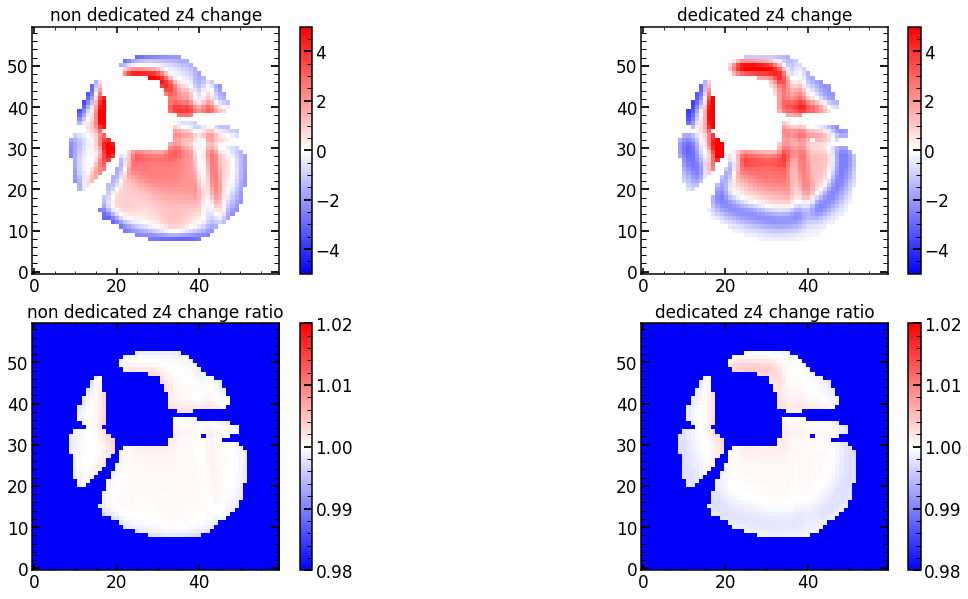

In [288]:
change_single=np.zeros((60,60))
change_single[list_of_flux_mask[0]]=np.array(uber_images_normalized_previous_best[0]-uber_M0_previous_best)[:1143]
change_single_ratio=np.zeros((60,60))
change_single_ratio[list_of_flux_mask[0]]=np.array(uber_images_normalized_previous_best[0]/uber_M0_previous_best)[:1143]

change_single_dedicated=np.zeros((60,60))
change_single_dedicated[list_of_flux_mask[0]]=np.array(uber_images_normalized_previous_best_dedicated[0]-uber_M0_previous_best_dedicated)[:1143]
change_single_dedicated_ratio=np.zeros((60,60))
change_single_dedicated_ratio[list_of_flux_mask[0]]=np.array(uber_images_normalized_previous_best_dedicated[0]/uber_M0_previous_best_dedicated)[:1143]

plt.figure(figsize=(20,10))
plt.subplot(221)
plt.title('non dedicated z4 change')
plt.imshow(change_single,cmap='bwr',vmin=-5,vmax=5)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(222)
plt.title('dedicated z4 change')
plt.imshow(change_single_dedicated,cmap='bwr',vmin=-5,vmax=5)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(223)
plt.title('non dedicated z4 change ratio')
plt.imshow(change_single_ratio,cmap='bwr',vmin=0.98,vmax=1.02)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(224)
plt.title('dedicated z4 change ratio')
plt.imshow(change_single_dedicated_ratio,cmap='bwr',vmin=0.98,vmax=1.02)
plt.colorbar(fraction=0.046, pad=0.04)

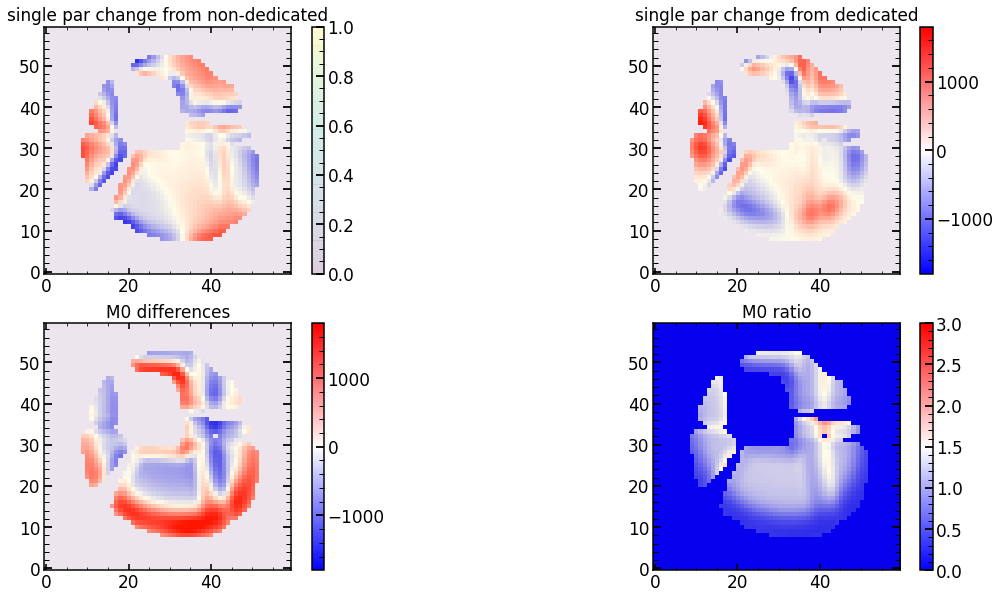

In [289]:
change_single=np.zeros((60,60))
change_single[list_of_flux_mask[0]]=array_of_wavefront_changes[:,12][:1143]

change_single_dedicated=np.zeros((60,60))
change_single_dedicated[list_of_flux_mask[0]]=array_of_wavefront_changes_dedicated[:,12][:1143]


difference_M=np.zeros((60,60))
difference_M[list_of_flux_mask[0]]=(uber_M0_previous_best-uber_M0_previous_best_dedicated)[:1143]

ratio_M=np.zeros((60,60))
ratio_M[list_of_flux_mask[0]]=(uber_M0_previous_best/uber_M0_previous_best_dedicated)[:1143]

ratio_M=np.zeros((60,60))
ratio_M[list_of_flux_mask[0]]=(uber_M0_previous_best_dedicated/uber_M0_previous_best)[:1143]

plt.figure(figsize=(20,10))
plt.subplot(221)
plt.title('single par change from non-dedicated')
plt.imshow(change_single,cmap='bwr',vmax=1800,vmin=-1800)
plt.imshow(list_of_flux_mask[0],alpha=0.1)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(222)
plt.title('single par change from dedicated')
plt.imshow(change_single_dedicated,cmap='bwr',vmax=1800,vmin=-1800)
plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(list_of_flux_mask[0],alpha=0.1)

plt.subplot(223)
plt.title('M0 differences')
plt.imshow(difference_M,cmap='bwr',vmax=1800,vmin=-1800)
plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(list_of_flux_mask[0],alpha=0.1)

plt.subplot(224)
plt.title('M0 ratio')
plt.imshow(ratio_M,cmap='bwr',vmax=3,vmin=0)
plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(list_of_flux_mask[0],alpha=0.1)

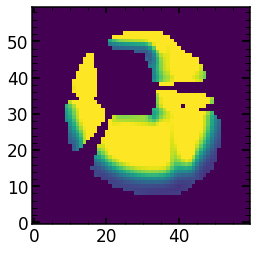

In [290]:
ratio_M_1=np.copy(ratio_M)
ratio_M_1[ratio_M>1]=1

ratio_M_2=np.copy(ratio_M)
ratio_M_2[ratio_M>2]=2

plt.imshow(ratio_M_1)

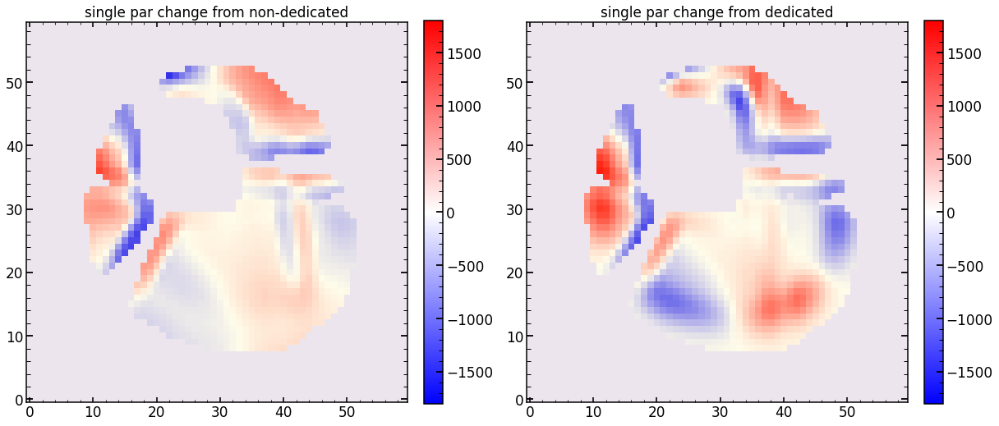

In [291]:

change_single=np.zeros((60,60))
change_single[list_of_flux_mask[0]]=(array_of_wavefront_changes[:,12])[:1143]*ratio_M_1[list_of_flux_mask[0]]

change_single_dedicated=np.zeros((60,60))
change_single_dedicated[list_of_flux_mask[0]]=array_of_wavefront_changes_dedicated[:,12][:1143]


plt.figure(figsize=(20,10))
plt.subplot(121)

plt.title('single par change from non-dedicated')
plt.imshow(change_single,cmap='bwr',vmax=1800,vmin=-1800)
plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(list_of_flux_mask[0],alpha=0.1)


plt.subplot(122)
plt.title('single par change from dedicated')
plt.imshow(change_single_dedicated,cmap='bwr',vmax=1800,vmin=-1800)
plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(list_of_flux_mask[0],alpha=0.1)

In [293]:
delta_single_change_0=(((uber_images_normalized_previous_best[12]/uber_M0_previous_best)-1)[:1143])
delta_single_change=np.zeros((60,60))
delta_single_change[list_of_flux_mask[0]]=delta_single_change_0

print(array_of_delta_parametrizations_None_previous_best[12])



delta_single_change_0_dedicated=(((uber_images_normalized_previous_best_dedicated[12]/uber_M0_previous_best_dedicated)-1)[:1143])
delta_single_change_dedicated=np.zeros((60,60))
delta_single_change_dedicated[list_of_flux_mask[0]]=delta_single_change_0_dedicated

print(array_of_delta_parametrizations_None_previous_best[12])

[0.00125]
[0.00125]


In [294]:
np.sum(delta_single_change)

0.001580953598022461

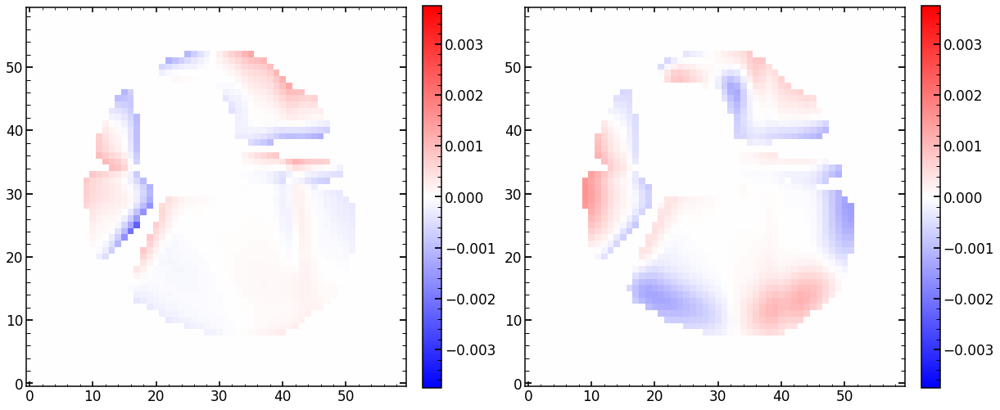

In [295]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(delta_single_change*ratio_M,cmap='bwr',vmax=3*0.00125,vmin=-3*0.00125)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(delta_single_change_dedicated,cmap='bwr',vmax=3*0.00125,vmin=-3*0.00125)
plt.colorbar(fraction=0.046, pad=0.04)

-5.9554865095350475
-5.723304430643718


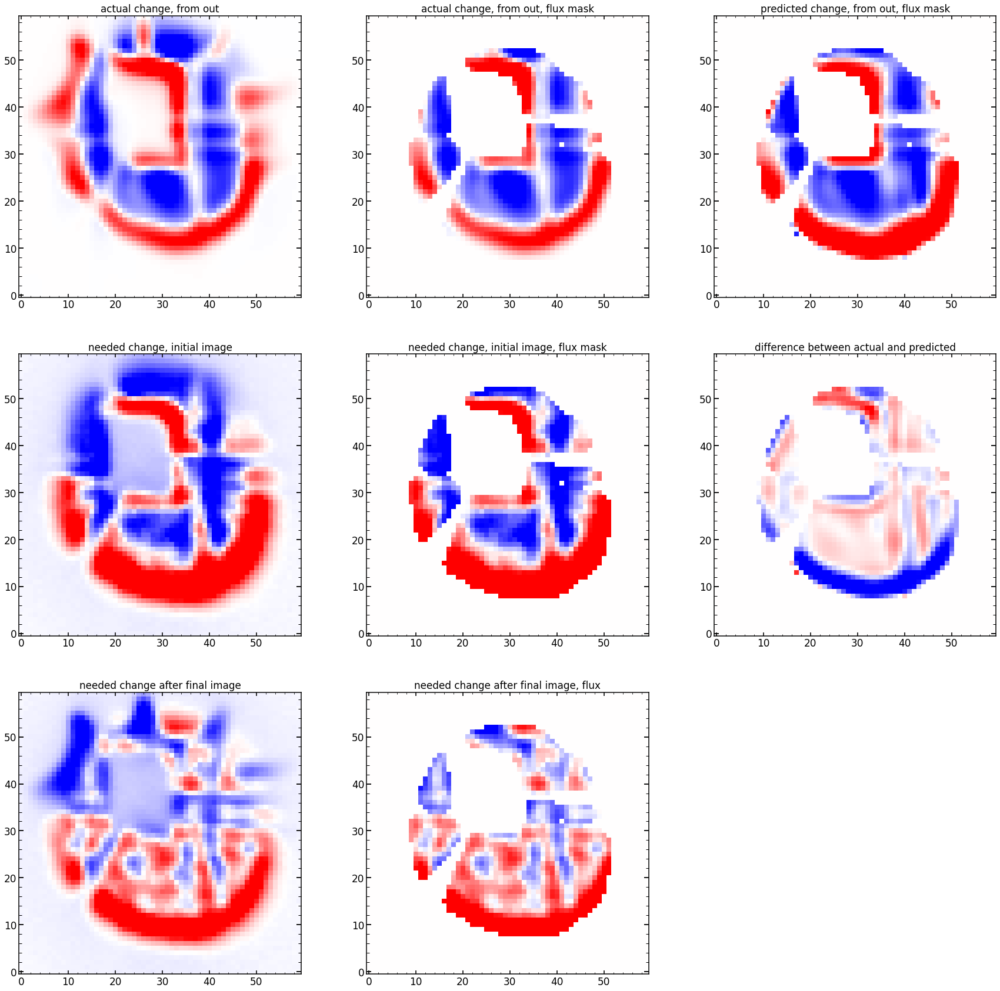

In [308]:
#which image
i=1

# how much did parameters change
actual_wavefront_change=np.concatenate(((out20[i][8]-out20[i][7])[:19*2],(out20[i][8]-out20[i][7])[19*2+23:]))

# change I expect from the changes of singular parameters
predicted_change=np.dot(array_of_wavefront_changes,actual_wavefront_change[:,None]).ravel()
predicted_change_0=np.zeros((60,60))
predicted_change_0[list_of_flux_mask[0]]=predicted_change[:1143]

# change I expect from the changes of singular parameters, from the dedicated effort 
predicted_change_dedicated=np.dot(array_of_wavefront_changes_dedicated,actual_wavefront_change[:,None]).ravel()
predicted_change_0_dedicated=np.zeros((60,60))
predicted_change_0_dedicated[list_of_flux_mask[0]]=predicted_change_dedicated[:1143]


# difference between final and initial image


actual_change_full=out20[i][6][0]-out20[i][5][0]

actual_change_flux_mask=np.zeros((60,60))
actual_change_flux_mask[list_of_flux_mask[0]]=actual_change_full[list_of_flux_mask[0]]

##############
initial_figure=out20[i][5][0]
needed_change=list_of_sci_images[0]-initial_figure

needed_change_flux_mask=np.zeros((60,60))
needed_change_flux_mask[list_of_flux_mask[0]]=needed_change[list_of_flux_mask[0]]


#################
final_figure=out20[i][6][0]
final_difference=list_of_sci_images[0]-final_figure
final_needed_change_flux_mask=np.zeros((60,60))
final_needed_change_flux_mask[list_of_flux_mask[0]]=final_difference[list_of_flux_mask[0]]


print(best_result0[0])
print(best_result0[1])

plt.figure(figsize=(30,30))

plt.subplot(331)
# actual change in particle 0
plt.title('actual change, from out')
plt.imshow(actual_change_full,cmap='bwr',vmax=800,vmin=-800)

plt.subplot(332)
# predicted change in particle 0
plt.title('actual change, from out, flux mask')
plt.imshow(actual_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)

plt.subplot(333)
plt.title('predicted change, from out, flux mask')
plt.imshow(predicted_change_0,cmap='bwr',vmax=800,vmin=-800)


plt.subplot(334)
# needed change
plt.title('needed change, initial image')
plt.imshow(list_of_sci_images[0]-initial_figure,cmap='bwr',vmax=800,vmin=-800)



plt.subplot(335)
# needed change flux
plt.title('needed change, initial image, flux mask')
plt.imshow(needed_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)

#difference between actual and predicted image
plt.subplot(336)
plt.title('difference between actual and predicted')
plt.imshow(actual_change_flux_mask-predicted_change_0,cmap='bwr',vmax=800,vmin=-800)

# needed change after final image
plt.subplot(337)
plt.title('needed change after final image')
plt.imshow(list_of_sci_images[0]-final_figure,cmap='bwr',vmax=800,vmin=-800)


# needed change flux after final image
plt.subplot(338)
plt.title('needed change after final image, flux')
plt.imshow(final_needed_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)


[-7.8825157   0.03305758  0.49241792 -0.91129426  0.2342229 ]
[-7.8825157   0.03305758  0.49241792 -0.91129426  0.2342229 ]


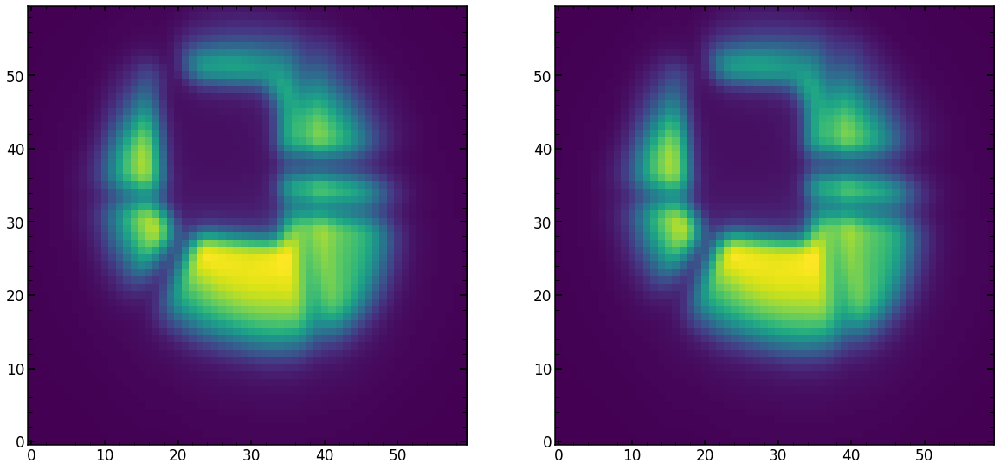

In [297]:
i=1
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(out20[i][5][0])

plt.subplot(122)
plt.imshow(best_result_from_Tokovinin_5[5][0])


print(out20[i][7][0:5])
print(best_result_from_Tokovinin_5[7][0:5])

In [281]:
out20[i][-1]

array([[-10.55950444,  -9.67599059],
       [ -6.41199078,  -2.2058663 ],
       [ -2.52495983, -12.74554173],
       [  1.00000738,  -2.99984033],
       [ -3.52851925,  -4.80982311],
       [  0.66881061,   2.85761783],
       [  4.0595144 ,  -3.7706548 ],
       [  8.39258311,   3.90861787],
       [  3.65336405,  -6.82852696]])

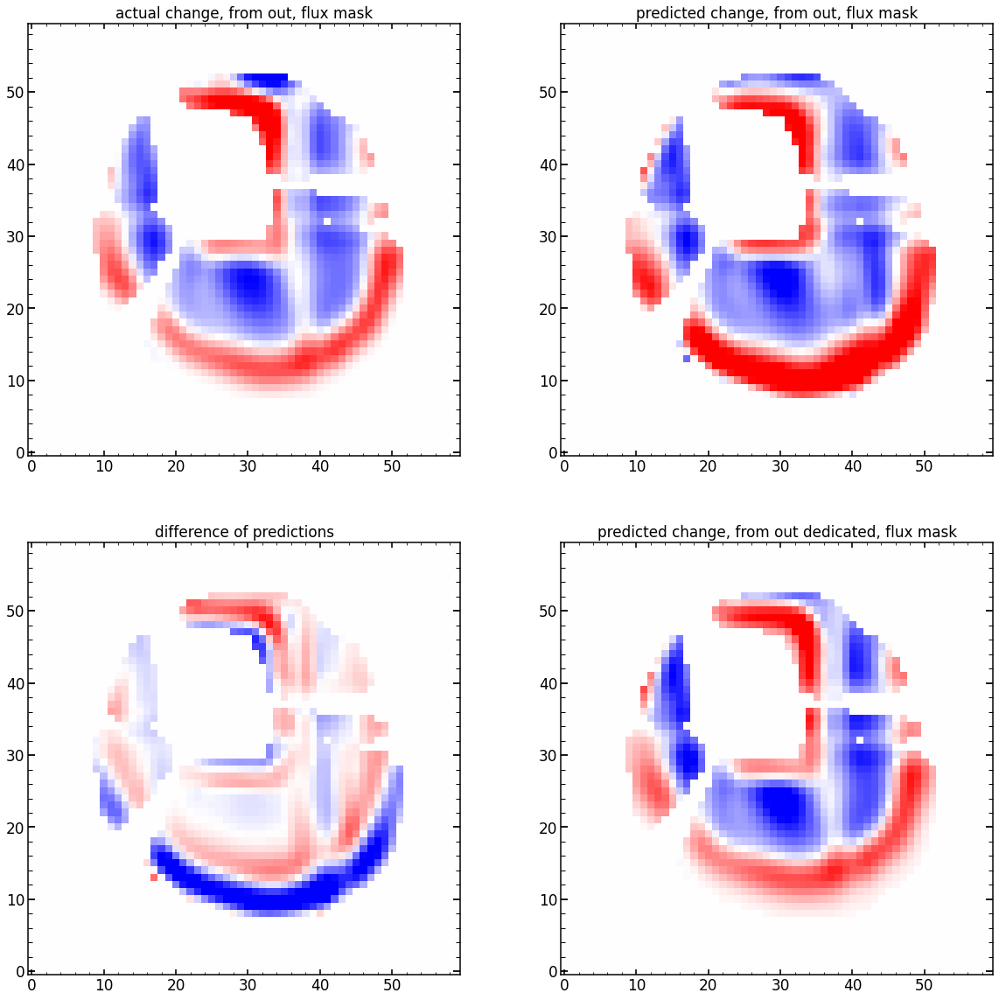

In [298]:
plt.figure(figsize=(20,20))
plt.subplot(221)
# predicted change in particle 0
plt.title('actual change, from out, flux mask')
plt.imshow(actual_change_flux_mask,cmap='bwr',vmax=1200,vmin=-1200)

plt.subplot(222)
plt.title('predicted change, from out, flux mask')
plt.imshow(predicted_change_0,cmap='bwr',vmax=1200,vmin=-1200)

plt.subplot(223)
plt.title('difference of predictions')
plt.imshow(predicted_change_0_dedicated-predicted_change_0,cmap='bwr',vmax=1200,vmin=-1200)

plt.subplot(224)
plt.title('predicted change, from out dedicated, flux mask')
plt.imshow(predicted_change_0_dedicated,cmap='bwr',vmax=1200,vmin=-1200)

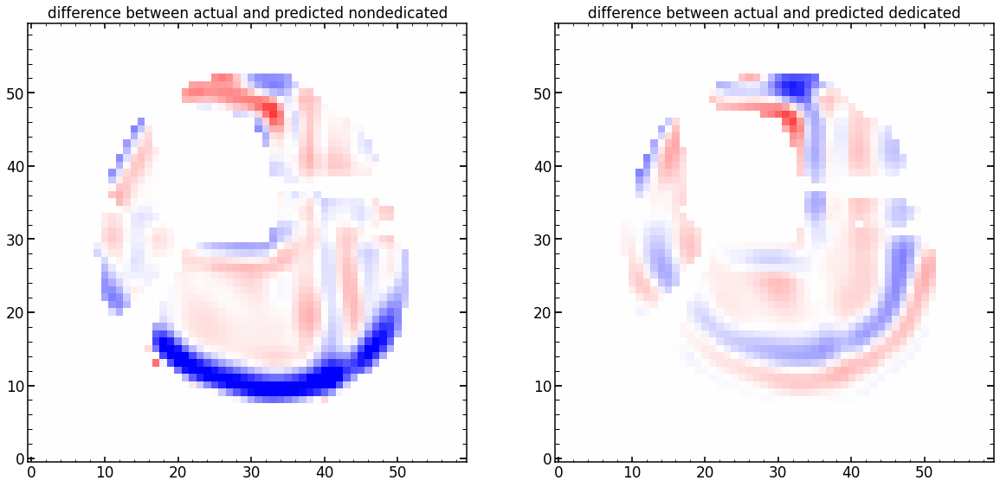

In [309]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('difference between actual and predicted nondedicated')
plt.imshow(actual_change_flux_mask-predicted_change_0,cmap='bwr',vmax=1200,vmin=-1200)
plt.subplot(122)

plt.title('difference between actual and predicted dedicated')
plt.imshow(actual_change_flux_mask-predicted_change_0_dedicated,cmap='bwr',vmax=1200,vmin=-1200)

-7.979043624752941

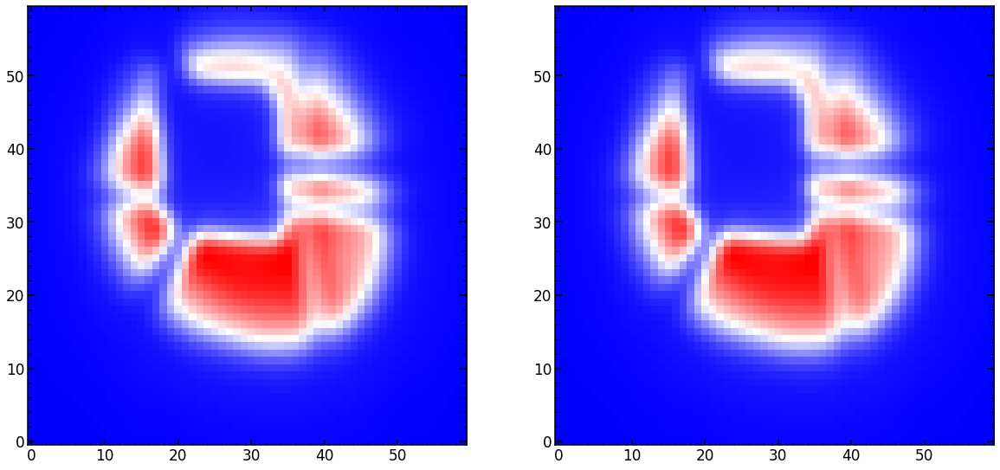

In [300]:
i=1
plt.figure(figsize=(20,10))
plt.subplot(121)

plt.imshow(initial_figure,cmap='bwr')

plt.subplot(122)
plt.imshow(out20[i][5][0],cmap='bwr')

out20[i][8][0]

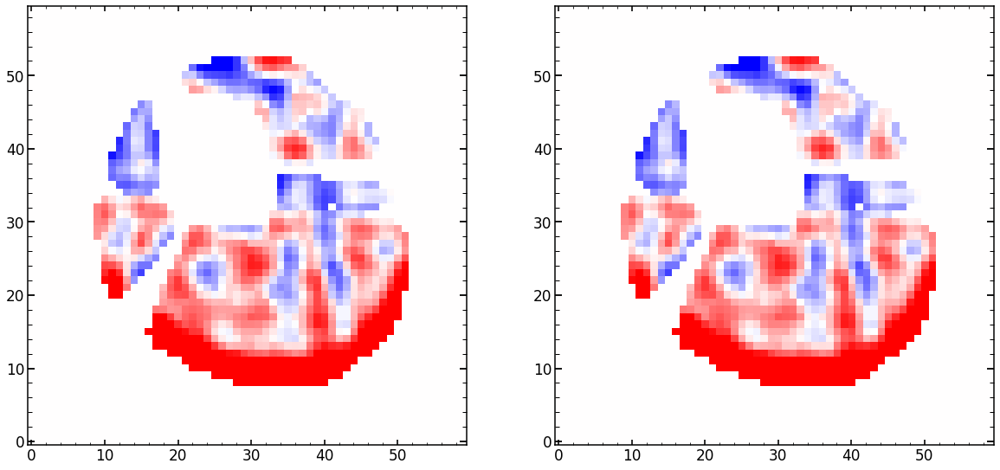

In [301]:
plt.figure(figsize=(20,10))
plt.subplot(121)

plt.imshow(needed_change_flux_mask-actual_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)

plt.subplot(122)
plt.imshow(final_needed_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)

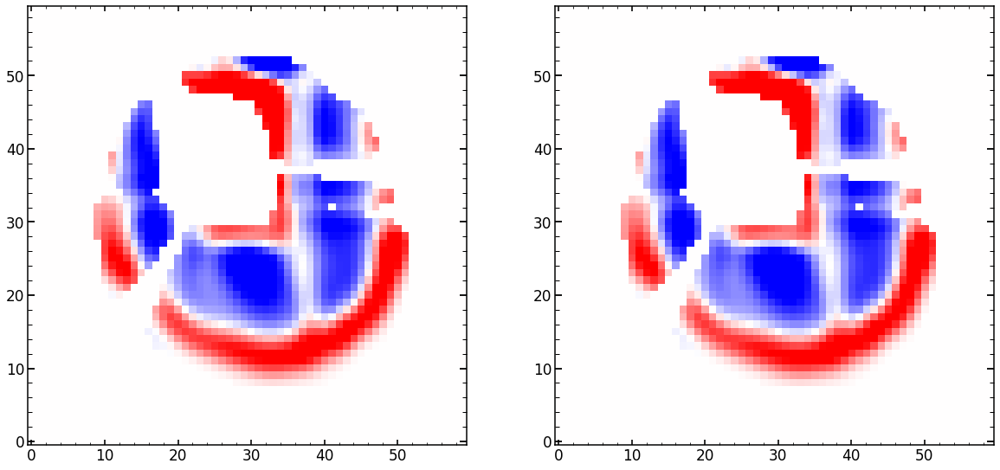

In [302]:
plt.figure(figsize=(20,10))
plt.subplot(121)

plt.imshow(actual_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)

plt.subplot(122)
plt.imshow(needed_change_flux_mask-final_needed_change_flux_mask,cmap='bwr',vmax=800,vmin=-800)

In [303]:
initial_figure_from_1st_image=main_body_of_best_result[5][0]
final_figure_from_1st_image=main_body_of_best_result[6][0]
initial_figure

array([[23.765503, 25.153244, 26.543234, ..., 30.718159, 29.116806,
        27.6076  ],
       [24.915411, 26.395117, 27.879974, ..., 32.404182, 30.667175,
        29.035728],
       [26.07504 , 27.65013 , 29.233816, ..., 34.142864, 32.261143,
        30.49983 ],
       ...,
       [32.732533, 34.869408, 37.054974, ..., 38.78799 , 36.38057 ,
        34.17682 ],
       [31.214085, 33.210823, 35.24346 , ..., 36.873108, 34.61815 ,
        32.55023 ],
       [29.67929 , 31.541986, 33.430534, ..., 34.936813, 32.825676,
        30.887005]], dtype=float32)

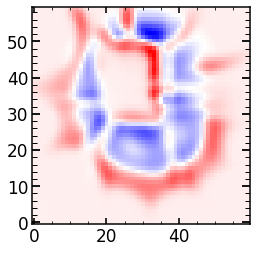

In [304]:
plt.imshow(final_figure_from_1st_image-initial_figure,cmap='bwr')

In [311]:
paramCount=100
(0.5 + np.random.uniform(0,1,size=paramCount))/2*1.193

array([0.75492696, 0.72993067, 0.44827592, 0.65510329, 0.48367866,
       0.49027198, 0.42072113, 0.60425065, 0.49547633, 0.40489607,
       0.37950663, 0.82102061, 0.45599879, 0.68128806, 0.37685579,
       0.81918501, 0.31402685, 0.41682285, 0.42726273, 0.73658775,
       0.41387967, 0.53855422, 0.72561773, 0.81357645, 0.60613749,
       0.81771917, 0.34570418, 0.64890457, 0.45260618, 0.36290402,
       0.47420701, 0.86682843, 0.50192515, 0.81695989, 0.50004566,
       0.76078837, 0.80337951, 0.31647546, 0.4817443 , 0.310799  ,
       0.6712762 , 0.44085   , 0.77803725, 0.41438422, 0.71088243,
       0.48922662, 0.37263804, 0.82388429, 0.75249577, 0.78968033,
       0.54334296, 0.49243878, 0.68331314, 0.42995771, 0.70613697,
       0.82396036, 0.41970463, 0.74398338, 0.66519033, 0.89218918,
       0.78950556, 0.86933166, 0.66209829, 0.53967383, 0.38777291,
       0.42001929, 0.44029856, 0.66621048, 0.54588407, 0.30371727,
       0.74964047, 0.86083626, 0.41534744, 0.86262305, 0.64933

In [306]:
array([   -7.8825157 ,     0.03305758,     0.49241792,    -0.91129426,
           0.2342229 ,    -0.54302017,    -0.01364976,    -0.34325149,
          -0.06352654,     0.40795935,     0.01064555,    -0.44396466,
           0.00450309,    -0.57982209,    -0.06671459,     0.54374951,
          -0.00864246,     0.01886295,     0.00089042,     0.20247791,
           0.01402033,    -0.04694434,     0.01045948,     0.01222624,
           0.00874718,     0.03680648,    -0.00906852,     0.03962365,
          -0.01035716,     0.0319801 ,     0.00243948,    -0.03244641,
           0.01081932,    -0.03921772,     0.00747744,     0.01216259,
          -0.0274368 ,     0.03708531,     0.74462689,     0.0812034 ,
          -0.0868288 ,     0.03834348,     0.06469483,     0.08329746,
           0.09677616,     0.00237369,     0.65310164,     3.48658281,
          -0.17607945,     0.13462112,     0.76565118,     0.02480677,
           0.5659987 ,     1.09607081,     0.75689404, 72801.39262911,
           2.35753197,     0.00341322,     0.46153212,     1.88657571,
           0.98350389,     0.00174632,    -0.01511988,     0.00168603,
          -0.01584725,     0.00229983,    -0.00785104,    -0.00124334,
           0.00851931,     0.00143488,     0.0022975 ,     0.00128037,
          -0.000155  ,     0.00072586,    -0.01416621,    -0.00198463,
           0.00245813,     0.00959034,    -0.01031893,     0.00038837,
           0.01306438,     0.0030908 ,     0.00319384,     0.00305834,
          -0.02084817,     0.00048789,     0.00160031,    -0.00283995,
           0.01114524,    -0.00086007,     0.00307501,     0.00170246,
          -0.00239154,     0.00263968,    -0.00073899,     0.00002547,
           0.00217737,    -0.00343051,     0.01019274,     0.00481108,
          -0.00834874,    -0.00196319,     0.00685014,    -0.00490918,
          -0.01084985,     0.00127341,    -0.00627397,    -0.00052602,
          -0.01719912,    -0.00058612,    -0.00185252,    -0.000253  ,
           0.00176255,    -0.00248642,    -0.0016823 ,     0.00042267,
          -0.00583862,     0.00281019,    -0.01018753,    -0.00236892,
           0.00407194,    -0.00156917,     0.00138039,    -0.0028367 ,
           0.00124819,     0.00222119,     0.00080149,    -0.005737  ,
          -0.00105242])

NameError: name 'array' is not defined

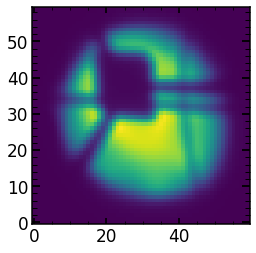

In [307]:
plt.imshow(best_result0[5][0])

## initial model, is it better via change or ratio - it is mostly the same

### initial model 

In [87]:
par_change_all=best_result0[8]-best_result0[7]
actual_wavefront_change=np.concatenate((par_change_all[:19*2],par_change_all[19*2+23:]))

In [91]:
# change I expect from the changes of singular parameters
predicted_change_dedicated=np.dot(array_of_wavefront_changes,actual_wavefront_change[:,None]).ravel()
predicted_change_0=np.zeros((60,60))
predicted_change_0[list_of_flux_mask[0]]=predicted_change_dedicated[:1143]

actual_change_0_flux=np.zeros((60,60))
actual_change_0=best_result0[6][0]-best_result0[5][0]
actual_change_0_flux[list_of_flux_mask[0]]=actual_change_0[list_of_flux_mask[0]]


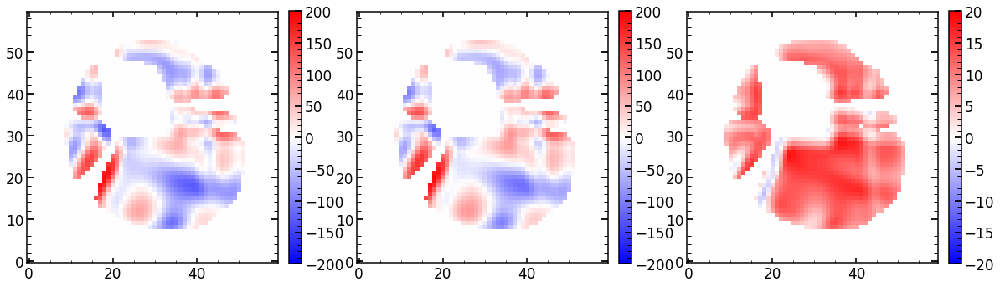

In [100]:
plt.figure(figsize=(20,10))
plt.subplot(131)

plt.imshow(predicted_change_0,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(actual_change_0_flux,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)


plt.subplot(133)
plt.imshow(actual_change_0_flux-predicted_change_0,cmap='bwr',vmax=20,vmin=-20)
plt.colorbar(fraction=0.046, pad=0.04)

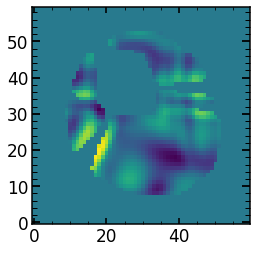

In [92]:
plt.imshow(predicted_change_0)

In [113]:
# ratio of the change change 
array_of_wavefront_changes[:,0][:1153]/uber_M0_previous_best[:1153]

array([-0.94527266, -0.87870797, -0.81805999, ..., -0.28574231,
       -0.34801374, -0.3151439 ])

In [118]:
array_of_wavefront_changes[:,1][:1153]/uber_M0_previous_best[:1153]

array([0.23603402, 0.21925272, 0.20395584, ..., 0.08079256, 0.09861076,
       0.08932824])

In [120]:
array_of_wavefront_changes_ratio=np.transpose(array_of_wavefront_changes[:1153]/uber_M0_previous_best[:1153][:,None])

In [124]:
array_of_wavefront_changes_ratio.shape

(106, 1153)

In [126]:
actual_wavefront_change

array([-0.00367245,  0.02183245, -0.04386204,  0.03516775, -0.03423949,
        0.0314706 ,  0.00231845,  0.00626276, -0.00070134,  0.01221791,
        0.00391214,  0.01077113, -0.01503768,  0.01929032, -0.00051054,
        0.00493127,  0.01011809,  0.00645242,  0.01128888,  0.00584072,
        0.00577654,  0.00398069, -0.01143672,  0.02233373, -0.00368618,
        0.01144915, -0.00247151,  0.00194253,  0.00246247, -0.00011388,
       -0.00034826,  0.00123794, -0.00608317,  0.01131962, -0.00265433,
        0.01482509,  0.00300846,  0.00345727,  0.00135668,  0.00076387,
        0.00225364, -0.00102715, -0.00033095,  0.00049345,  0.00041171,
       -0.00153447, -0.00085994,  0.00027332,  0.00188098,  0.0002308 ,
       -0.00312899,  0.00168374,  0.00111455,  0.00204254, -0.00308663,
        0.00836513,  0.00198252,  0.00232607, -0.00151968, -0.00055702,
        0.00064368, -0.00178369,  0.00082897, -0.0013149 ,  0.00007355,
       -0.00063818, -0.00018484,  0.000368  , -0.000904  ,  0.00

In [141]:
# change I expect from the changes of singular parameters
predicted_change_dedicated_ratio=np.dot(actual_wavefront_change,array_of_wavefront_changes_ratio).ravel()
predicted_change_dedicated_ratio_0=np.zeros((60,60))
predicted_change_dedicated_ratio_0[list_of_flux_mask[0]]=predicted_change_dedicated_ratio[:1143]*uber_M0_previous_best[:1143]

actual_change_0_flux=np.zeros((60,60))
actual_change_0=best_result0[6][0]-best_result0[5][0]
actual_change_0_flux[list_of_flux_mask[0]]=actual_change_0[list_of_flux_mask[0]]

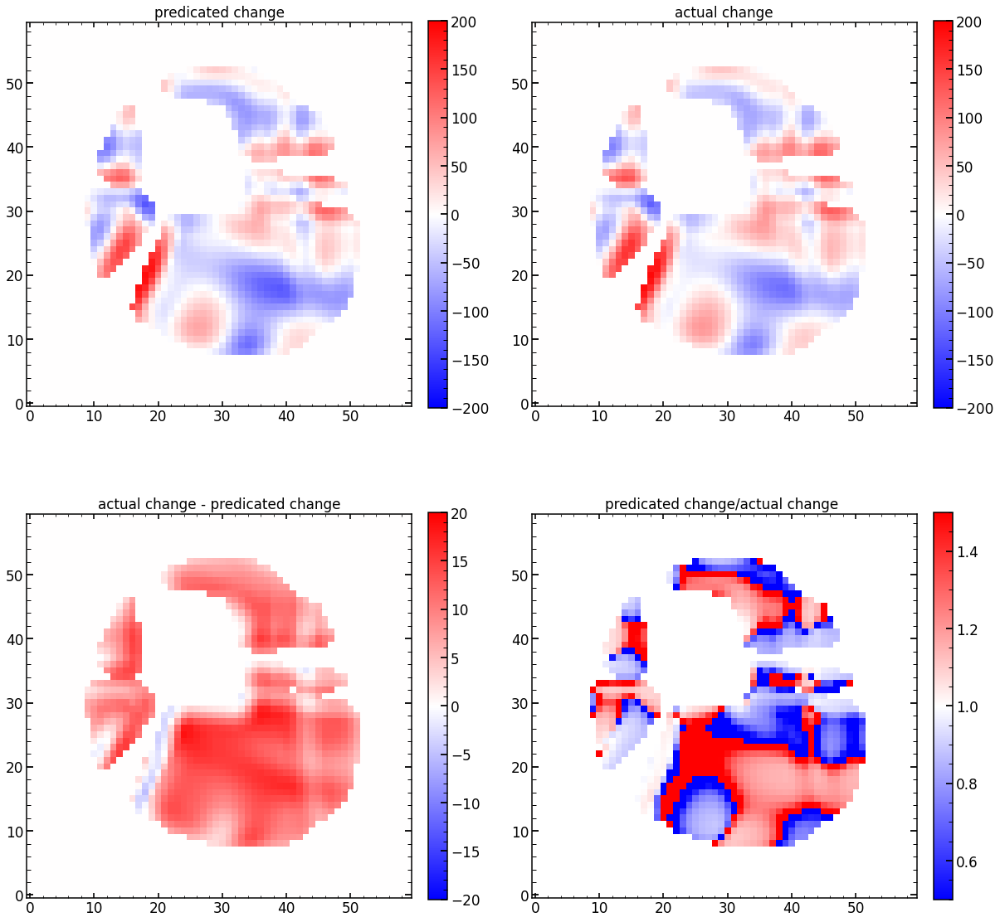

In [167]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.title('predicated change')
plt.imshow(predicted_change_dedicated_ratio_0,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(222)
plt.title('actual change')
plt.imshow(actual_change_0_flux,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(223)
plt.title('actual change - predicated change')
plt.imshow(actual_change_0_flux-predicted_change_dedicated_ratio_0,cmap='bwr',vmax=20,vmin=-20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(224)
plt.title('predicated change/actual change ')
plt.imshow(predicted_change_dedicated_ratio_0/actual_change_0_flux,cmap='bwr',vmax=1.5,vmin=0.5)
plt.colorbar(fraction=0.046, pad=0.04)

In [158]:
print(np.sum(actual_change_0_flux))
print(np.mean(actual_change_0_flux[list_of_flux_mask[0]]))

4886.253601074219
4.274937533748223


In [160]:
print(np.sum(predicted_change_dedicated_ratio_0))
print(np.mean(predicted_change_dedicated_ratio_0[list_of_flux_mask[0]]))

-5979.100836556248
-5.23105934956802


In [164]:

print((predicted_change_dedicated_ratio_0/actual_change_0_flux)[list_of_flux_mask[0]])

predicted_change_dedicated_ratio_0/actual_change_0_flux

[2.84582783 1.21609456 1.12254578 ... 0.67772749 0.29628255 2.74598024]


array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [165]:
np.mean((predicted_change_dedicated_ratio_0/actual_change_0_flux)[list_of_flux_mask[0]])

1.0926343708476458

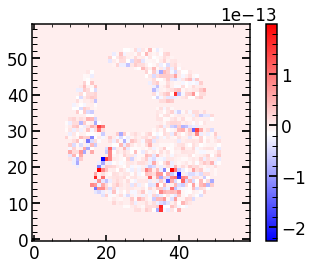

In [148]:
plt.imshow(predicted_change_dedicated_ratio_0-predicted_change_0,cmap='bwr')
plt.colorbar()

### second image 

#### via ratios 

In [182]:
array_of_wavefront_changes_dedicated[:,0][:1153]/uber_M0_previous_best_dedicated[:1153]

array([-0.41768008, -0.42616361, -0.42988662, ..., -0.34793099,
       -0.32411983, -0.70647702])

In [183]:
array_of_wavefront_changes_ratio_dedicated=np.transpose(array_of_wavefront_changes_dedicated[:1153]/uber_M0_previous_best_dedicated[:1153][:,None])

In [190]:
par_change_all_dedicated=best_result_from_Tokovinin_5[8]-best_result_from_Tokovinin_5[7]
actual_wavefront_change_dedicated=np.concatenate((par_change_all_dedicated[:19*2],par_change_all_dedicated[19*2+23:]))

In [192]:
# change I expect from the changes of singular parameters
predicted_change_dedicated_ratio=np.dot(actual_wavefront_change_dedicated,array_of_wavefront_changes_ratio_dedicated).ravel()
predicted_change_dedicated_ratio_0=np.zeros((60,60))
predicted_change_dedicated_ratio_0[list_of_flux_mask[0]]=predicted_change_dedicated_ratio[:1143]*uber_M0_previous_best_dedicated[:1143]

actual_change_0_flux_dedicated=np.zeros((60,60))
actual_change_0_dedicated=best_result_from_Tokovinin_5[6][0]-best_result_from_Tokovinin_5[5][0]
actual_change_0_flux_dedicated[list_of_flux_mask[0]]=actual_change_0_dedicated[list_of_flux_mask[0]]

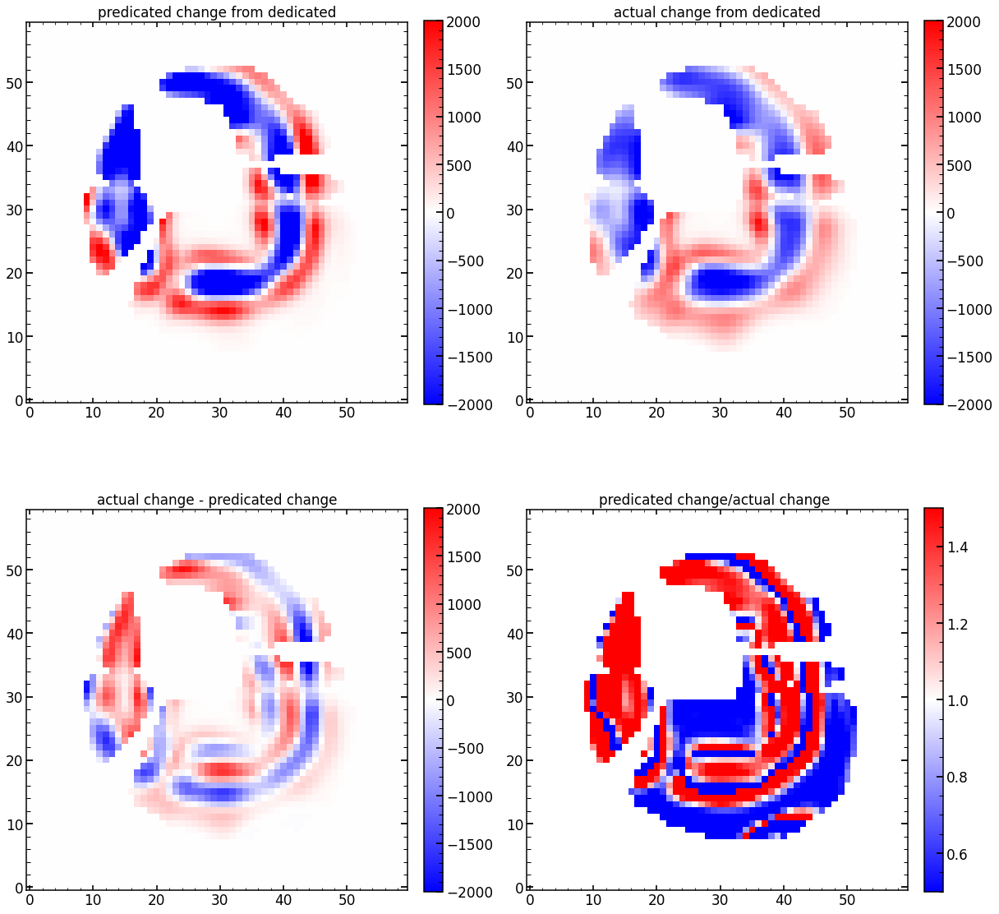

In [198]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.title('predicated change from dedicated')
plt.imshow(predicted_change_dedicated_ratio_0,cmap='bwr',vmax=2000,vmin=-2000)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(222)
plt.title('actual change from dedicated')
plt.imshow(actual_change_0_flux_dedicated,cmap='bwr',vmax=2000,vmin=-2000)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(223)
plt.title('actual change - predicated change')
plt.imshow(actual_change_0_flux_dedicated-predicted_change_dedicated_ratio_0,cmap='bwr',vmax=2000,vmin=-2000)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(224)
plt.title('predicated change/actual change ')
plt.imshow(predicted_change_dedicated_ratio_0/actual_change_0_flux_dedicated,cmap='bwr',vmax=1.5,vmin=0.5)
plt.colorbar(fraction=0.046, pad=0.04)

#### via change 

In [226]:
array_of_wavefront_changes_dedicated[:,0][:1153]

array([-10.30502319, -10.83679199, -11.20834351, ..., -10.5178833 ,
        -8.87680054, -32.54699707])

In [182]:
array_of_wavefront_changes_dedicated[:,0][:1153]/uber_M0_previous_best_dedicated[:1153]

array([-0.41768008, -0.42616361, -0.42988662, ..., -0.34793099,
       -0.32411983, -0.70647702])

In [183]:
array_of_wavefront_changes_ratio_dedicated=np.transpose(array_of_wavefront_changes_dedicated[:1153]

In [203]:
par_change_all_dedicated=best_result_from_Tokovinin_5[8]-best_result_from_Tokovinin_5[7]
actual_wavefront_change_dedicated=np.concatenate((par_change_all_dedicated[:19*2],par_change_all_dedicated[19*2+23:]))

In [223]:
array_of_wavefront_changes_dedicated.shape

(5057, 106)

In [225]:
array_of_wavefront_changes_dedicated[:,0][0:5]

array([-10.30502319, -10.83679199, -11.20834351, -11.42807007,
       -11.3319397 ])

In [236]:
# change I expect from the changes of singular parameters
predicted_change_dedicated=np.dot(array_of_wavefront_changes_dedicated,actual_wavefront_change_dedicated[:,None]).ravel()
predicted_change_dedicated_0=np.zeros((60,60))
predicted_change_dedicated_0[list_of_flux_mask[0]]=predicted_change_dedicated[:1143]



actual_change_0_flux_dedicated=np.zeros((60,60))
actual_change_0_dedicated=best_result_from_Tokovinin_5[6][0]-best_result_from_Tokovinin_5[5][0]
actual_change_0_flux_dedicated[list_of_flux_mask[0]]=actual_change_0_dedicated[list_of_flux_mask[0]]

In [260]:
actual_wavefront_change_dedicated[0:5]

array([-0.02296041, -1.29475315, -0.65396748, -1.58326897, -0.22245096])

In [261]:
actual_wavefront_change[0:5]

array([-0.09652792, -0.45882299,  0.16198556,  0.01088182, -0.02373699])

In [237]:
predicted_change_dedicated.shape

(5057,)

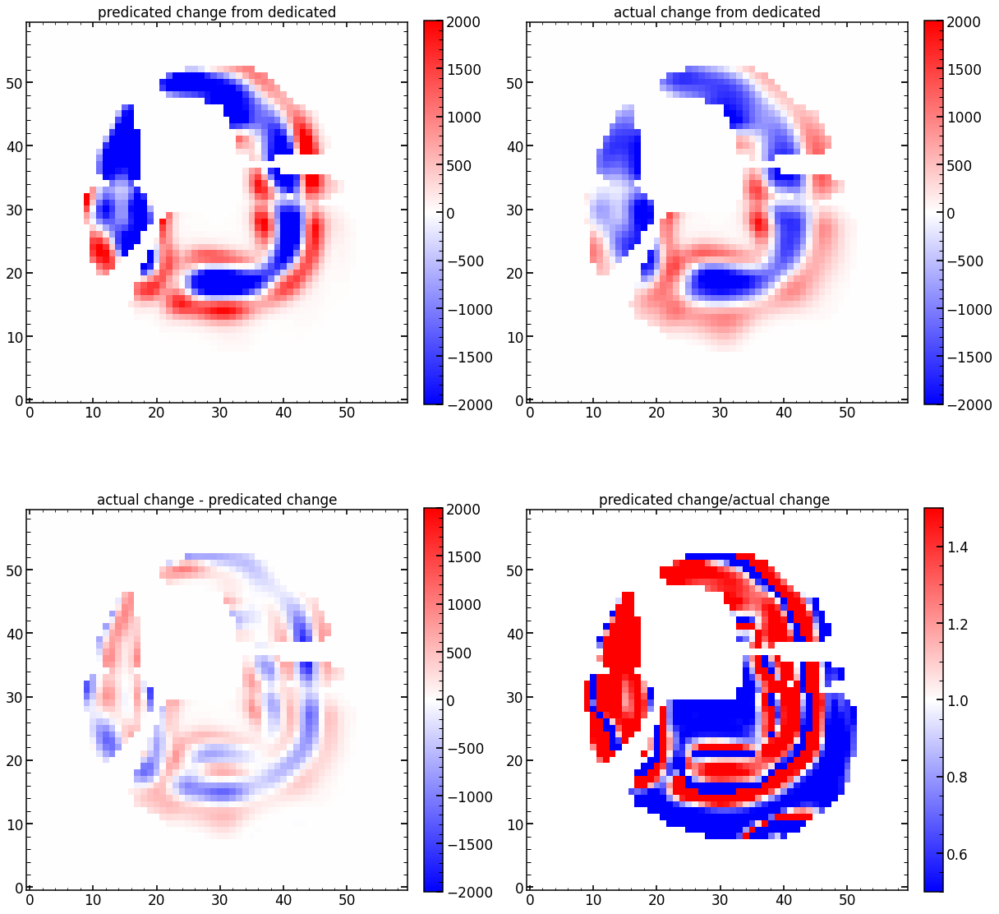

In [246]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.title('predicated change from dedicated')
plt.imshow(predicted_change_dedicated_0,cmap='bwr',vmax=2000,vmin=-2000)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(222)
plt.title('actual change from dedicated')
plt.imshow(actual_change_0_flux_dedicated,cmap='bwr',vmax=2000,vmin=-2000)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(223)
plt.title('actual change - predicated change')
plt.imshow(actual_change_0_flux_dedicated-0.75*predicted_change_dedicated_0,cmap='bwr',vmax=2000,vmin=-2000)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(224)
plt.title('predicated change/actual change ')
plt.imshow(predicted_change_dedicated_0/actual_change_0_flux_dedicated,cmap='bwr',vmax=1.5,vmin=0.5)
plt.colorbar(fraction=0.046, pad=0.04)

In [245]:
np.mean(actual_change_0_flux_dedicated-0.75*predicted_change_dedicated_0)

2.3078274777218133

In [ ]:
# why is it different

In [230]:
print(predicted_change_dedicated.shape)
predicted_change_dedicated

(5057,)


array([6.46906234, 8.08072384, 9.52347966, ..., 5.17016093, 6.41256048,
       5.01545063])

In [234]:
print(predicted_change_dedicated_ratio.shape)
predicted_change_dedicated_ratio

(1153,)


array([0.48769076, 0.8702017 , 1.25896865, ..., 0.34385455, 0.19967145,
       0.91865239])

In [216]:
uber_M0_previous_best_dedicated[0:5]

array([24.672049, 25.428713, 26.07279 , 26.519861, 26.66901 ],
      dtype=float32)

In [212]:
array_of_wavefront_changes_dedicated[0][0:5]

array([-10.30502319,   2.58883145,  -3.4311395 ,   0.84960688,
         9.59086941])

In [214]:
array_of_wavefront_changes_ratio_dedicated[0][0:5]

array([-0.41768008, -0.42616361, -0.42988662, -0.43092496, -0.4249104 ])

In [219]:
array_of_wavefront_changes_ratio_dedicated[0:5][:,0]*uber_M0_previous_best_dedicated[0:5]

array([-10.30502319,   2.66822803,  -3.6259405 ,   0.91323817,
        10.36715671])

# error in out2 in May06 run 

In [162]:
out20=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0621/out20.npy',allow_pickle=True)
out21=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0621/out21.npy',allow_pickle=True)
out22=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0621/out22.npy',allow_pickle=True)

In [163]:
print(out20.shape)
print(out21.shape)
print(out22.shape)

(480, 15)
(480, 15)
(480, 15)


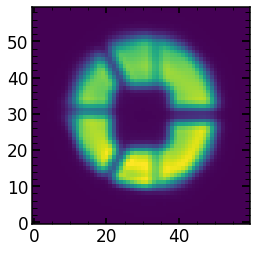

In [164]:
plt.imshow(out22[0][5][0])

In [167]:
out22[348][8]

array([   -7.14916652,     0.3084908 ,     0.05373343,     0.06294714,
           0.08223451,    -0.46426516,     0.01742116,     0.33341953,
           0.00986669,    -0.0373038 ,     0.00405113,    -0.07357417,
          -0.00986717,    -0.28121989,     0.06884757,    -0.38081305,
          -0.00560713,    -0.01991907,     0.00083238,    -0.03904129,
           0.00672716,    -0.01528049,     0.00209517,     0.01034842,
          -0.00656395,    -0.02451019,     0.00649775,     0.03761395,
           0.00088058,    -0.00175424,    -0.00182116,    -0.00025094,
           0.00227272,    -0.00971916,     0.00011846,     0.02356437,
          -0.02973854,    -0.00137178,     0.65986851,     0.0742971 ,
          -0.03721673,    -0.05442053,     0.05748462,     0.02884292,
           0.28275699,     0.28045917,     0.25977405,     0.59634898,
           0.0253993 ,    -0.06525822,     1.        ,     0.06532539,
           0.47377537,     1.03015512,     0.18722502, 61593.22967487,
      

In [168]:
chain0_swarm_1[2][348]-out22[348][8]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

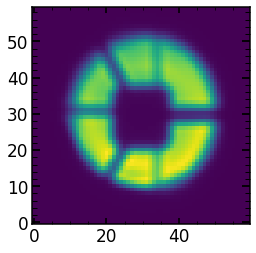

In [174]:
plt.imshow(list_of_single_model_image[0])

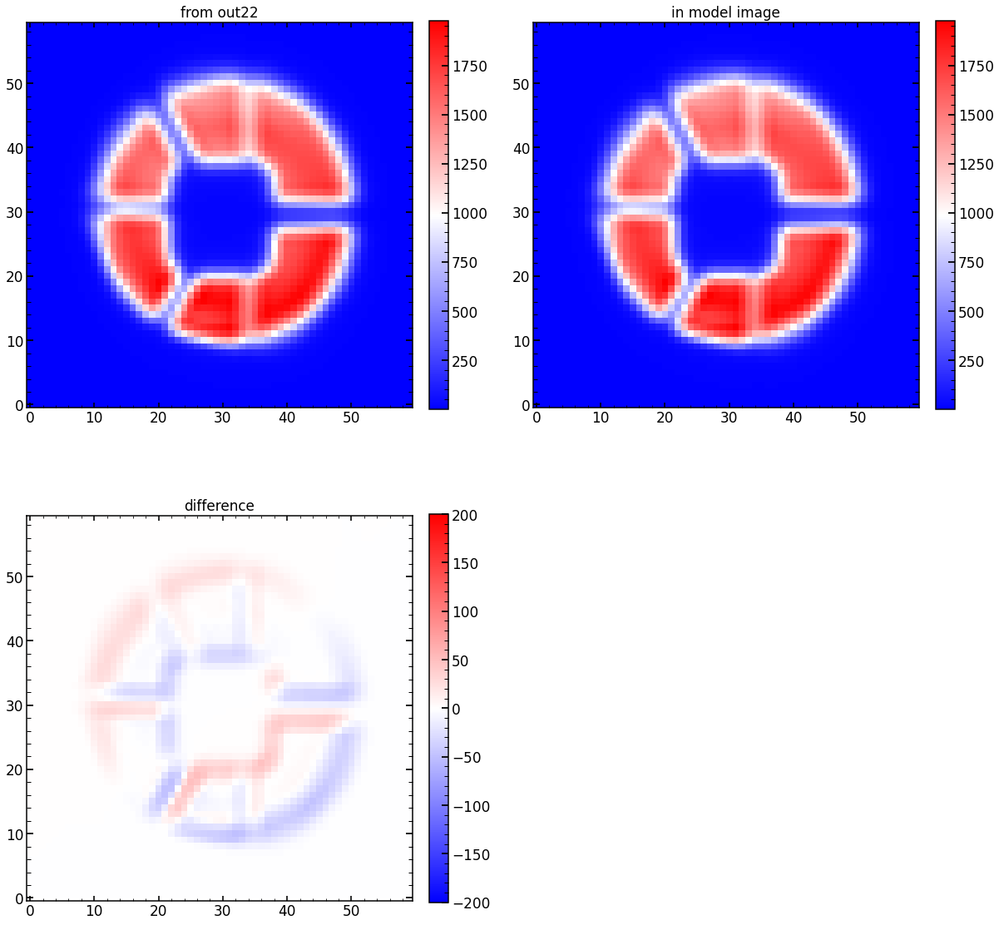

In [183]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.title('from out22')
plt.imshow(out22[348][6][0],cmap='bwr',vmax=np.max(list_of_single_model_image[0]))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(222)
plt.title('in model image')
plt.imshow(list_of_single_model_image[0],cmap='bwr',vmax=np.max(list_of_single_model_image[0]))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(223)
plt.title('difference')
plt.imshow(list_of_single_model_image[0]-out22[348][6][0],cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)


In [184]:
out22[348][-1]

array([[ -8.68450188,  -5.49665652],
       [ -2.98664735,   2.83715699],
       [ -6.62304314,   2.29371979],
       [  2.72180036,  -0.3914607 ],
       [ -0.98691315,  -0.97224107],
       [ -4.35649768,   7.54820962],
       [ -3.87109291,   4.7038007 ],
       [  1.69085734,  13.21446189],
       [-10.83559705,  12.29985204]])

In [185]:
res_multi[-1]

array([[ -8.169592  ,  -6.07665418],
       [ -2.57966623,   2.37885795],
       [ -6.31406233,   1.91771309],
       [  2.69353914,  -0.35164685],
       [ -0.99311793,  -0.94076832],
       [ -4.34600781,   7.56862453],
       [ -4.29111075,   5.1330227 ],
       [  1.21996639,  13.7196104 ],
       [-11.46361067,  12.90248797]])

In [186]:
res_multi[0]

-3.118515372276306

In [190]:
nsteps=3
array_of_multi_background_factors=np.concatenate((np.arange(80,3,-(80-3)/(nsteps-1)),np.array([3])) )

In [191]:
array_of_multi_background_factors

array([80. , 41.5,  3. ])

In [239]:
30*150

4500

In [240]:
4500*0.97

4365.0

In [384]:
best_result_from_Tokovinin_5_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0721/best_result_from_Tokovinin_5_0.npy',allow_pickle=True)
best_result_from_Tokovinin_5_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0721/best_result_from_Tokovinin_5.npy',allow_pickle=True)
#best_result_from_Tokovinin_5_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0721/best_result_from_Tokovinin_5_2.npy',allow_pickle=True)

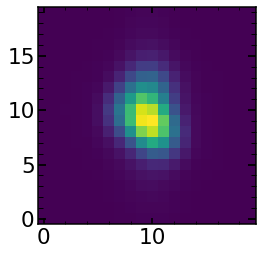

In [385]:
plt.imshow(best_result_from_Tokovinin_5_0[5][0])

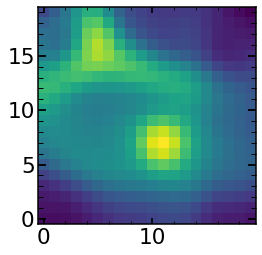

In [386]:
plt.imshow(best_result_from_Tokovinin_5_0[6][2])

In [390]:
list_of_sci_images_0=list_of_sci_images[3:6]
list_of_var_images_0=list_of_var_images[3:6]
list_of_mask_images_0=list_of_mask_images[3:6]

list_of_init_images

In [ ]:
def create_liner_combination(list_of_sci_images=list_of_sci_images_0,list_of_var_images=list_of_var_images_0,
                             list_of_mask_images=list_of_mask_images_0,list_of_init_images=best_result_from_Tokovinin_5_0[5],out_images):
    
    ############################################################################
    list_of_mean_value_of_background=[]
    list_of_flux_mask=[]
    list_of_sci_image_std=[]
    for i in range(len(list_of_sci_images)):
        sci_image=list_of_sci_images[i]
        var_image=list_of_var_images[i]

        mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                              np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor

        mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                              np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor

        mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])
        if verbosity>1:
            print(str(multi_background_factor)+'x mean_value_of_background in image with index'+str(i)+' is estimated to be: '+str(mean_value_of_background))


        list_of_mean_value_of_background.append(mean_value_of_background)
        flux_mask=sci_image>(mean_value_of_background)


        # normalized science image
        var_image=list_of_var_images[i]
        sci_image_std=sci_image/np.sqrt(var_image)
        list_of_sci_image_std.append(sci_image_std)
        list_of_flux_mask.append(flux_mask)
    
    ############################################################################ 

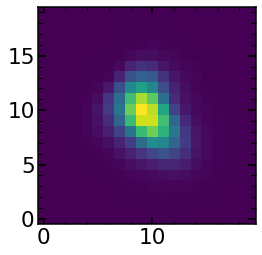

In [389]:
plt.imshow(list_of_sci_images[3])

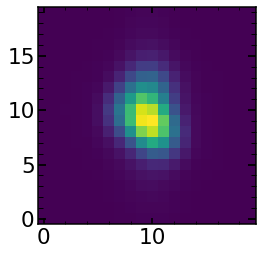

In [392]:
plt.imshow(best_result_from_Tokovinin_5_0[5][0])

In [395]:
len(best_result_from_Tokovinin_5_0[5])

3

In [333]:
previous_best_result=best_result0    

main_body_of_best_result=previous_best_result[:-1]
previous_best_result=previous_best_result[-1]

out_images=main_body_of_best_result[4]   


In [335]:
np.array(out_images).shape

(106, 9)

In [336]:
/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0721/

AttributeError: 'list' object has no attribute 'shape'

In [339]:
out_images_pre_renormalization=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0721/out_images_pre_renormalization.npy',allow_pickle=True)

out_images_pre_renormalization_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May0721/out_images_pre_renormalization_0.npy',allow_pickle=True)

In [340]:
out_images_pre_renormalization_0.shape

(3, 20, 20)

In [341]:
out_images_pre_renormalization.shape

(9,)

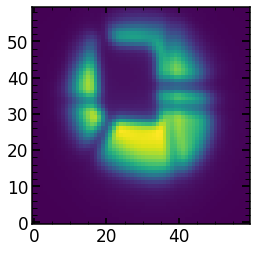

In [343]:
plt.imshow(out_images_pre_renormalization[0])

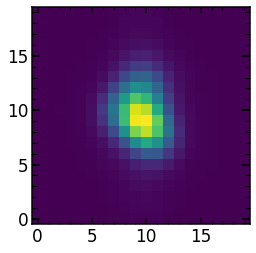

In [345]:
plt.imshow(out_images_pre_renormalization_0[0])

In [346]:
out_images_pre_renormalization*[1,1,1,1,1,1,1,1,1]

array([array([[23.765207, 25.15296 , 26.542969, ..., 30.718225, 29.116776,
        27.607634],
       [24.915335, 26.395054, 27.879936, ..., 32.404278, 30.667154,
        29.03578 ],
       [26.075195, 27.650301, 29.234009, ..., 34.142956, 32.26109 ,
        30.49985 ],
       ...,
       [32.731903, 34.868576, 37.053673, ..., 38.787933, 36.380775,
        34.177036],
       [31.213358, 33.20991 , 35.242157, ..., 36.873096, 34.618374,
        32.55044 ],
       [29.678549, 31.5411  , 33.42933 , ..., 34.936874, 32.82593 ,
        30.887228]], dtype=float32),
       array([[27.34858 , 29.282547, 31.258123, ..., 35.81341 , 33.5276  ,
        31.44226 ],
       [28.91569 , 31.00427 , 33.144623, ..., 38.20717 , 35.674965,
        33.37813 ],
       [30.50775 , 32.759346, 35.074745, ..., 40.71972 , 37.91252 ,
        35.382053],
       ...,
       [36.36634 , 39.28956 , 42.38305 , ..., 42.33569 , 39.16775 ,
        36.414413],
       [34.213947, 36.882565, 39.68225 , ..., 39.68243 , 36.77292

In [351]:
out_images_pre_renormalization_0*[1,1,1]

ValueError: operands could not be broadcast together with shapes (3,20,20) (3,) 

In [358]:
out_images_pre_renormalization_0*(np.array([1,1,1]).T)

ValueError: operands could not be broadcast together with shapes (3,20,20) (3,) 

In [361]:
np.matmul(np.array([1,1,1]).T,out_images_pre_renormalization_0)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 20 is different from 3)

# in focus idea 

## first idea

In [637]:
first_proposal_Tokovnin=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/first_proposal_Tokovnin99_0.npy',allow_pickle=True)
first_proposal_Tokovnin

uber_I=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_I_99.npy')
uber_M0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_M0_99_0.npy')
H=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_99_0.npy')
H_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_std_99_0.npy')

In [638]:
def create_linear_combination(list_of_sci_images=list_of_sci_images_0,list_of_var_images=list_of_var_images_0,
                             list_of_mask_images=list_of_mask_images_0,previous_best_result=best_result_from_Tokovinin_5_0,
                             first_proposal_Tokovnin=first_proposal_Tokovnin,multi_background_factor=3,verbosity=1):
    
    ######################################################################################################### 
    list_of_sci_image_std=[]
    for i in range(len(list_of_sci_images)):
        sci_image=list_of_sci_images[i]
        var_image=list_of_var_images[i]
        sci_image_std=sci_image/np.sqrt(var_image)
        list_of_sci_image_std.append(sci_image_std)
    
    
    ############################################################################
    list_of_mean_value_of_background=[]
    list_of_flux_mask=[]
    list_of_sci_image_std=[]
    for i in range(len(list_of_sci_images)):
        sci_image=list_of_sci_images[i]
        var_image=list_of_var_images[i]

        mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                              np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor

        mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                              np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor

        mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])
        if verbosity>1:
            print(str(multi_background_factor)+'x mean_value_of_background in image with index'+str(i)+' is estimated to be: '+str(mean_value_of_background))


        list_of_mean_value_of_background.append(mean_value_of_background)
        flux_mask=sci_image>(mean_value_of_background)


        # normalized science image
        var_image=list_of_var_images[i]
        sci_image_std=sci_image/np.sqrt(var_image)
        list_of_sci_image_std.append(sci_image_std)
        list_of_flux_mask.append(flux_mask)
    
    ############################################################################ 

    # masked science image
    list_of_I=[]
    list_of_I_std=[]    
    list_of_std_image=[]
    for i in range(len(list_of_sci_images)):

        sci_image=list_of_sci_images[i]
        sci_image_std=list_of_sci_image_std[i]
        flux_mask=list_of_flux_mask[i]
        std_image=np.sqrt(list_of_var_images[i][flux_mask]).ravel()

        I=sci_image[flux_mask].ravel()        
        #I=((sci_image[flux_mask])/np.sum(sci_image[flux_mask])).ravel()
        I_std=((sci_image_std[flux_mask])/1).ravel()
        #I_std=((sci_image_std[flux_mask])/np.sum(sci_image_std[flux_mask])).ravel()

        list_of_I.append(I)
        list_of_std_image.append(std_image)
        list_of_I_std.append(I_std)

    # join all I,I_std from all individual images into one uber I,I_std  
    uber_I=[item for sublist in list_of_I for item in sublist]
    uber_std=[item for sublist in list_of_std_image for item in sublist]
    uber_I_std=[item for sublist in list_of_I_std for item in sublist]    

    uber_I=np.array(uber_I)
    uber_std=np.array(uber_std)
    print(uber_I.shape)
    ############################################################################ 

    
    main_body_of_best_result=previous_best_result[:-1]
    previous_best_result=previous_best_result[-1]


    # we need actual final model images from the previous best result
    #list_of_image_0_from_previous_best_result=main_body_of_best_result[6]
    #list_of_image_0=list_of_image_0_from_previous_best_result

    # we need actual initial model images from the previous best result
    # this will be used to evalute change of model due to changes in singel wavefront parameters
    # i.e., to estimate matrix H
    list_of_image_0_from_previous_best_result=main_body_of_best_result[5]
    list_of_image_0=list_of_image_0_from_previous_best_result


    list_of_flux_mask=list_of_flux_mask 
    list_of_sci_image_std=list_of_sci_image_std

    list_of_image_0_std=[]
    for i in range(len(list_of_image_0)):
        # normalizing by standard deviation image
        STD=np.sqrt(list_of_var_images[i])    
        image_0=list_of_image_0[i]
        list_of_image_0_std.append(image_0/STD)  


    list_of_M0=[]
    list_of_M0_std=[]
    for i in range(len(list_of_image_0_std)):

        image_0=list_of_image_0[i]
        image_0_std=list_of_image_0_std[i]
        flux_mask=list_of_flux_mask[i]


        M0=image_0[flux_mask].ravel()            
        #M0=((image_0[flux_mask])/np.sum(image_0[flux_mask])).ravel()
        M0_std=((image_0_std[flux_mask])/1).ravel()
        #M0_std=((image_0_std[flux_mask])/np.sum(image_0_std[flux_mask])).ravel()

        list_of_M0.append(M0)
        list_of_M0_std.append(M0_std)

    # join all M0,M0_std from invidiual images into one uber M0,M0_std
    uber_M0_previous_best_dedicated=[item for sublist in list_of_M0 for item in sublist]
    uber_M0_previous_best_std_dedicated=[item for sublist in list_of_M0_std for item in sublist]    

    uber_M0_previous_best_dedicated=np.array(uber_M0_previous_best_dedicated)
    uber_M0_previous_best_std_dedicated=np.array(uber_M0_previous_best_std_dedicated)

    out_images=main_body_of_best_result[4]   

    # join all images together
    list_of_images_normalized_uber=[]
    list_of_images_normalized_std_uber=[]
    # go over (zmax-3)*2 images
    for j in range(len(out_images)):
        # two steps for what could have been achived in one, but to ease up transition from previous code 
        out_images_single_parameter_change=out_images[j]
        optpsf_list=out_images_single_parameter_change

        # flux image has to correct per image
        #  mask images that have been created in the fitting procedure with the appropriate flux mask
        images_normalized=[]
        for i in range(len(optpsf_list)):

            flux_mask=list_of_flux_mask[i]
            if j==0:

                #print('sum_flux_in images'+str([i,np.sum(flux_mask)]))
                pass
            images_normalized.append((optpsf_list[i][flux_mask]).ravel())                
            # !old double-normalizing code
            # !images_normalized.append((optpsf_list[i][flux_mask]/np.sum(optpsf_list[i][flux_mask])).ravel())



        images_normalized_flat=[item for sublist in images_normalized for item in sublist]  
        images_normalized_flat=np.array(images_normalized_flat)
        #images_normalized_flat=np.array(images_normalized_flat)/len(optpsf_list)        

        # list of (zmax-3)*2 raveled images
        list_of_images_normalized_uber.append(images_normalized_flat)

        # same but divided by STD
        images_normalized_std=[]
        for i in range(len(optpsf_list)):   
            # seems that I am a bit more verbose here with my definitions
            optpsf_list_i=optpsf_list[i]


            # do I want to generate new STD images, from each image?
            STD=list_of_sci_image_std[i]
            optpsf_list_i_STD=optpsf_list_i/STD    
            flux_mask=list_of_flux_mask[i]
            #images_normalized_std.append((optpsf_list_i_STD[flux_mask]/np.sum(optpsf_list_i_STD[flux_mask])).ravel())

        # join all images together
        #images_normalized_std_flat=[item for sublist in images_normalized_std for item in sublist]  
        # normalize so that the sum is still one
        #images_normalized_std_flat=np.array(images_normalized_std_flat)/len(optpsf_list)

        #list_of_images_normalized_std_uber.append(images_normalized_std_flat)

    # create uber images_normalized,images_normalized_std    
    # images that have zmax*2 rows and very large number of columns (number of non-masked pixels from all N images)
    uber_images_normalized_previous_best_dedicated=np.array(list_of_images_normalized_uber)   

    number_of_extra_zernike=56-22
    list_of_delta_z_parametrizations=[]
    for z_par in range(0,19*2+2*number_of_extra_zernike):
        z_par_i=z_par+4
        # if this is the parameter that change
        if np.mod(z_par_i,2)==0:
            list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
        if np.mod(z_par_i,2)==1:
            list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))

    array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)
    array_of_delta_parametrizations=array_of_delta_z_parametrizations



    array_of_delta_parametrizations_None_previous_best=previous_best_result[3]

    # ratio between current parametrization and the previous (provided) changed parametrization
    ratio_of_parametrizations=(array_of_delta_parametrizations[:,None]/array_of_delta_parametrizations_None_previous_best)

    # create the array of how wavefront changes the uber_model by multiply the changes with new ratios
    array_of_wavefront_changes_dedicated=np.transpose(ratio_of_parametrizations*\
                                            np.array(uber_images_normalized_previous_best_dedicated-uber_M0_previous_best_dedicated)/(array_of_delta_parametrizations_None_previous_best))    


     # how much did parameters change
    actual_wavefront_change=np.concatenate(((best_result_from_Tokovinin_5_0[8]-best_result_from_Tokovinin_5_0[7])[:19*2],(best_result_from_Tokovinin_5_0[8]-best_result_from_Tokovinin_5_0[7])[19*2+23:]))

    actual_wavefront_change=first_proposal_Tokovnin
    
    # change I expect from the changes of singular parameters
    predicted_change=np.dot(array_of_wavefront_changes_dedicated,actual_wavefront_change[:,None]).ravel()   
    

    
    return array_of_wavefront_changes_dedicated,actual_wavefront_change,predicted_change

In [639]:
array_of_wavefront_changes_dedicated,actual_wavefront_change,predicted_change=create_linear_combination()

(482,)


In [640]:
predicted_change=np.dot(H,first_proposal_Tokovnin).ravel()  

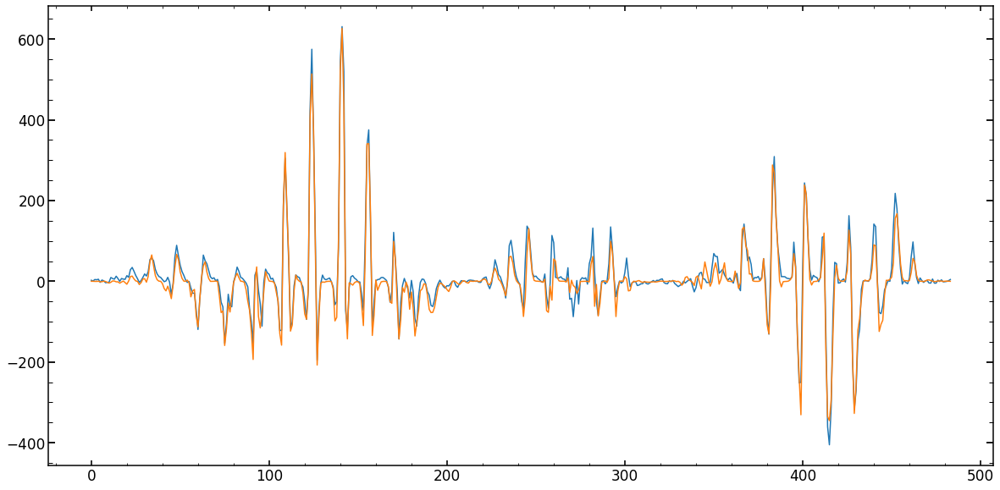

In [641]:
plt.figure(figsize=(20,10))
plt.plot(uber_I-uber_M0)
plt.plot(predicted_change)

non_singlular_parameters.shape)(104,)
[ 56 104]


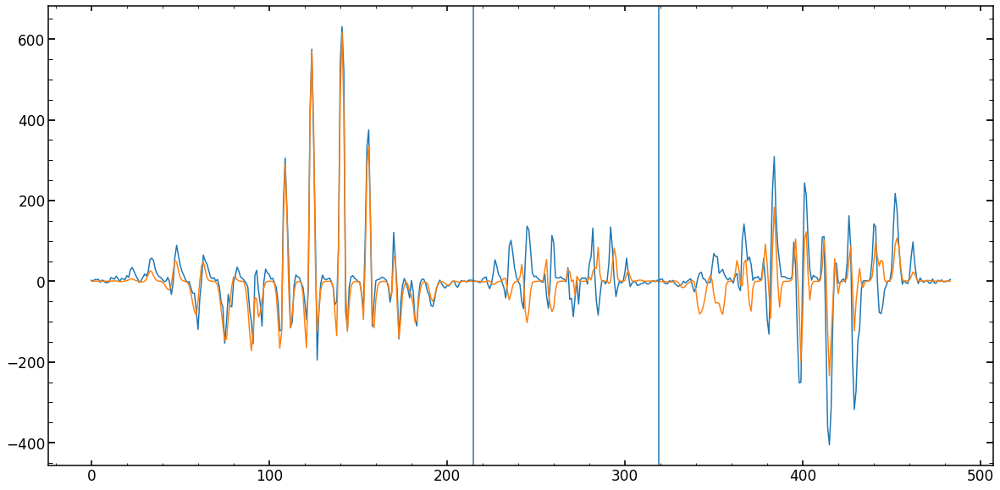

In [642]:
first_proposal_Tokovnin=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/first_proposal_Tokovnin99_0.npy',allow_pickle=True)
first_proposal_Tokovnin

uber_I=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_I_99.npy')
uber_M0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_M0_99_0.npy')
H=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_99_0.npy')
H_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_std_99_0.npy')

list_of_flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/list_of_flux_mask_99.npy')

#print('np.mean(H,axis=0).shape)'+str(np.mean(H,axis=0).shape))
singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))<0.001]
non_singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))>0.001]
print('non_singlular_parameters.shape)'+str(non_singlular_parameters.shape))
print(singlular_parameters)
H=H[:,non_singlular_parameters]
H_std=H_std[:,non_singlular_parameters]

H=H[:,0:(11-3)*2]

HHt=np.matmul(np.transpose(H),H)
HHt_std=np.matmul(np.transpose(H_std),H_std) 
#print('svd thresh is '+str(thresh))
#invHHt=svd_invert(HHt,thresh)
#invHHt_std=svd_invert(HHt_std,thresh)
invHHt=np.linalg.inv(HHt)        
invHHt_std=np.linalg.inv(HHt_std)

invHHtHt=np.matmul(invHHt,np.transpose(H))
invHHtHt_std=np.matmul(invHHt_std,np.transpose(H_std))

first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)

predicted_change=np.dot(H,first_proposal_Tokovnin).ravel()  

plt.figure(figsize=(20,10))
plt.plot(uber_I-uber_M0)
plt.plot(predicted_change)

plt.axvline(np.sum(list_of_flux_mask[0]))
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]))

In [643]:
first_proposal_Tokovnin

array([ 0.22993777, -0.22839255,  0.35120224, -0.09519532,  0.01339623,
       -0.119555  ,  0.55621382,  0.14750764, -0.44786827, -0.09663604,
       -0.04374517, -0.0577904 ,  0.12331301,  0.03507161,  0.05037613,
        0.11205413])

In [644]:
H=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_99_0.npy')

H=H[:,0:(11-3)*2]

In [645]:
H

array([[-0.09670258,  0.19877705, -0.2661656 , ...,  0.86705163,
        -0.10123336,  0.23403741],
       [ 0.11032104, -0.19250755, -0.21248397, ...,  0.70401104,
        -0.15561291,  0.34190247],
       [ 0.03044128, -0.02723178,  0.00883014, ..., -0.10365015,
        -0.02573318,  0.08915038],
       ...,
       [-0.41290283, -0.81373327, -0.49430087, ..., -1.24721492,
         0.26267265,  0.55172968],
       [-0.6060791 , -1.20047995, -0.57349179, ..., -0.88772661,
         0.15002929,  0.32712028],
       [ 0.07259369,  0.15549196, -0.01691275, ..., -0.28357125,
         0.06797444,  0.14361084]])

In [646]:
H=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_99_0.npy')
H_only_focus=H[np.sum(list_of_flux_mask[0]):(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])),1:(11-3)*2:2]
print(H_only_focus.shape)


uber_I_only_focus=uber_I[np.sum(list_of_flux_mask[0]):(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]))]
uber_M0_only_focus=uber_M0[np.sum(list_of_flux_mask[0]):(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]))]

(104, 8)


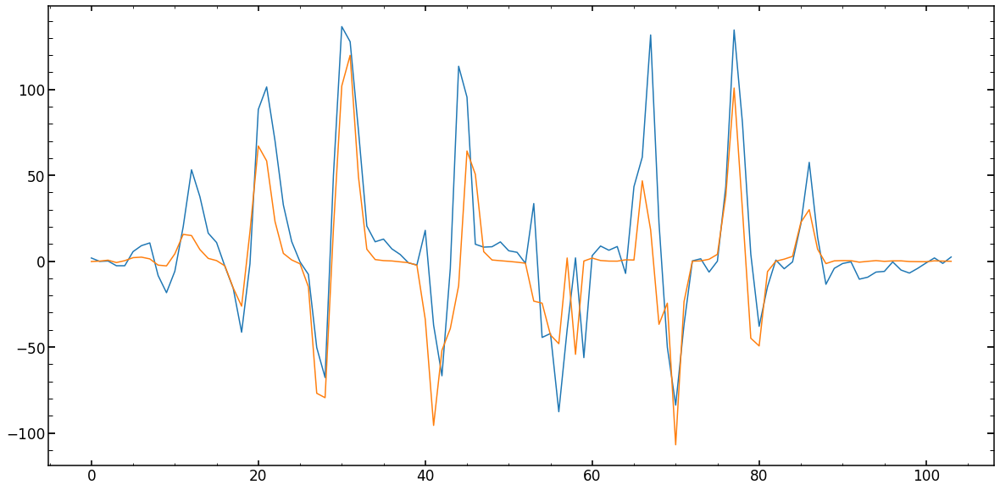

In [647]:
HHt=np.matmul(np.transpose(H_only_focus),H_only_focus)

#print('svd thresh is '+str(thresh))
#invHHt=svd_invert(HHt,thresh)
#invHHt_std=svd_invert(HHt_std,thresh)
invHHt=np.linalg.inv(HHt)        


invHHtHt=np.matmul(invHHt,np.transpose(H_only_focus))


first_proposal_Tokovnin_only_focus=np.matmul(invHHtHt,uber_I_only_focus-uber_M0_only_focus)

predicted_change=np.dot(H_only_focus,first_proposal_Tokovnin_only_focus).ravel()  

plt.figure(figsize=(20,10))
plt.plot(uber_I_only_focus-uber_M0_only_focus)
plt.plot(predicted_change)



In [678]:
array_of_delta_z_parametrizations=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_delta_z_parametrizations_99_0.npy')
uber_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_std_99.npy')

array_of_delta_z_parametrizations[1:(11-3)*2:2]

array([0.2236068 , 0.18898224, 0.16666667, 0.15075567, 0.13867505,
       0.12909944, 0.12126781, 0.11470787])

In [649]:
first_proposal_Tokovnin_only_focus/array_of_delta_z_parametrizations[1:(11-3)*2:2]

array([-0.01549733,  3.04272805,  3.94670219, -2.55892507,  2.1072693 ,
        1.14137577, -6.35707754, -0.70428088])

In [ ]:
first_proposal_Tokovnin_only_focus

In [650]:
test_minchain=np.copy(list_of_minchain[index_of_single_image])
test_minchain[0:8]=test_minchain[0:8]+first_proposal_Tokovnin_only_focus

In [653]:
index_of_single_image=4
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)
res_with_Image=model(test_minchain,return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.16145615    -0.31130643     0.14108806    -0.70516188
     0.80068095    -0.28014912    -1.3518691      0.50466031
     0.03863879     0.22954357    -0.04948961     0.03281349
     0.0587434      0.050954       0.02756475    -0.03203576
    -0.03294923     0.02517083     0.04498642     0.6982929
     0.10099376    -0.22868679     0.27114778     0.06266987
     0.10090548     0.2078081      0.31853494     0.31105295
     1.28564277    -0.0

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.10283958 -4.43548541] / 9.844139
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.30798156 -4.43548541] / 10.827947
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.10283958 -4.65725968] / 9.919631
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.89769761 -4.65725968] / 9.312118
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.69255563 -4.76814682] / 9.261282
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.69255563 -4.54637255] / 9.110946
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.48741365 -4.49092898] / 9.397796
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.28227167 -4.87903395] / 10.221128
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.89769761 -4.54637255] / 9.256732
chi2 within shgo optimization routine (chi_2_almost_multi_valu

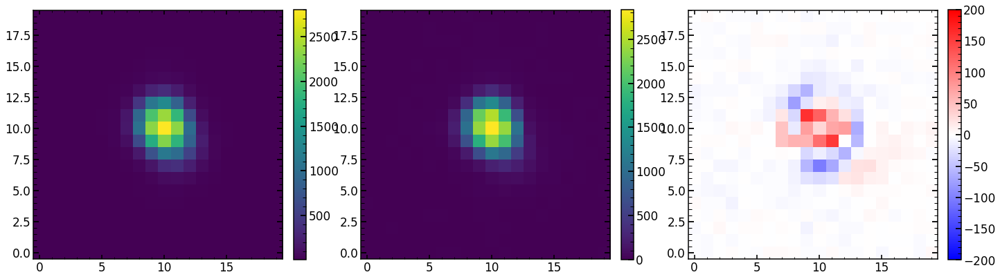

In [655]:
plt.figure(figsize=(24,10))
plt.subplot(131)
plt.imshow(res_with_Image[1])
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(list_of_sci_images[index_of_single_image])
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(list_of_sci_images[index_of_single_image]-res_with_Image[1],cmap='bwr',vmin=-200,vmax=200)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

In [658]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


#minchain_parametrization_test=np.copy(chain0_swarm_1[2][348])
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   32.26286464    -2.7904354     -1.38901013    -0.25933571
     0.7909853     -0.50167539    -0.49062885     0.8347611
     0.05159541     0.23869737    -0.15181199     0.02699841
     0.0328766      0.10617364     0.0171643     -0.0287926
    -0.04517753    -0.00510353     0.12597928     0.6982929
     0.10099376    -0.22868679     0.27114778     0.06266987
     0.10090548     0.207

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.4350372 -10.026419 ] / 46.40675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.43503722 -10.026419  ] / 46.406746
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.4350372  -10.02641902] / 46.406742
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-23.56003718 -25.77641895] / 1404.9917
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.92507994 -17.01092992] / 302.15085
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-15.56479648 -13.33937788] / 104.0078
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.4732371  -11.64139661] / 60.404507
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.94757115 -10.82369403] / 49.98264
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68961651 -10.42243126] / 47.374523
chi2 within shgo optimization routine (chi

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.66799903  -9.83314028] / 46.077065
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.66799936  -9.83312977] / 46.077057
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.66799925  -9.83313327] / 46.077057
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.66799665  -9.83312688] / 46.077053
We are fitting for only one source
One source fitting result is [-13.66799383  -9.8331275 ]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.7583901882171631
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9984090588552478
Finished with lnlike_Neven
chi_almost/d.o.f is 5.942976; chi_almost_max_dof is 83.02857 log(improvment) is -1.

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55746954 -1.42916147] / 46.18685
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55746896 -1.37640982] / 46.64183
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55746867 -1.34911443] / 46.886696
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55746851 -1.33497112] / 47.016098
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55746853 -1.33497112] / 47.0161
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55746851 -1.33497113] / 47.016098
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.5505252  -1.34191427] / 46.92636
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55381227 -1.33862728] / 46.968746
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.55554298 -1.33689661] / 46.991123
chi2 within shgo optimization routine (chi_2_almost_multi_va

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9982663428921026
Finished with lnlike_Neven
chi_almost/d.o.f is 5.63893; chi_almost_max_dof is 88.2037 log(improvment) is -1.19429
The likelihood reported is: -5.638929843902588
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4489811392
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4489811392 is: 8.037091970443726 seconds
 
################################
analyzing image 3 out of 9
 
Science image shape is: (40, 40)
Top left pixel value of the science image is: 9.511934
Variance image shape is: (40, 40)
Top left pixel value of the variance image is: 5.372835
Mask imag

We are fitting for only one source
One source fitting result is [ -4.84349867 -12.95357902]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.32024502754211426
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.996254312198276
Finished with lnlike_Neven
chi_almost/d.o.f is 5.48214; chi_almost_max_dof is 99.651505 log(improvment) is -1.2595338
The likelihood reported is: -5.482140064239502
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4489811392
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4489811392 is: 

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.2108071  -3.20953701] / 32.96736
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.21871237 -2.99070494] / 32.759926
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.22925272 -2.99070494] / 32.698383
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.23847553 -2.95423293] / 32.693733
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.24111062 -3.02717695] / 32.612495
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.25230975 -3.04541296] / 32.54748
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.26943783 -2.93599692] / 32.56322
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.28327204 -3.02717695] / 32.385498
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 0.3056703  -3.06364896] / 32.26855
chi2 within shgo optimization routine (chi_2_almost_multi_v

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.98
Finished with lnlike_Neven
chi_almost/d.o.f is 5.4613633; chi_almost_max_dof is 40.33284 log(improvment) is -0.8683577
The likelihood reported is: -5.461363315582275
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4489811392
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4489811392 is: 4.889502048492432 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shap

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.55326311 -4.85449605] / 11.242668
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.77192546 -4.85449605] / 11.309068
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.56692951 -4.77358778] / 11.212508
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.73092627 -4.66571009] / 11.241775
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.68651048 -4.71290658] / 11.19703
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.83684084 -4.68593716] / 11.355965
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.63440734 -4.75167513] / 11.183824
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.60365795 -4.71796335] / 11.203993
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.63205843 -4.7251271 ] / 11.190749
chi2 within shgo optimization routine (chi_2_almost_mult

Time to apodize the pupil: 0.12877678871154785
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.28225111961364746
Time for pupil and illumination calculation is 0.2876441478729248

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -3.8473214438365786, -0.6483145505384295, -0.40765632883409575, -0.32689611851895084, 0.47313902768679506, -0.4182281916809615, -0.5922516320404919, 0.5542825881371083, 0.03701921727871536, 0.22839935053516663, -0.036699312245598685, 0.03354037226601576, 0.0619767556281039, 0.04405154345961625, 0.028864804051634583, -0.03244115740840232, -0.03142069654292452, 0.028955127537114954, 0.03486231570193804, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.6483145505384295, -0.40765632883409575, -0.326896118

chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.63623561 3.26440415] / 31.089401
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.84966982 3.20473755] / 31.00047
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.89134269 3.05811879] / 31.133307
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.79110216 3.23798155] / 30.987392
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.84141046 3.29140206] / 31.015474
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.80987375 3.18633829] / 30.992756
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.75130609 3.21958229] / 30.993101
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.77589703 3.2158711 ] / 30.987633
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.75712543 3.26751436] / 30.99952
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.79668

Time to apodize the pupil: 0.13411617279052734
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.2816751003265381
Time for pupil and illumination calculation is 0.2872800827026367

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -23.908535936848207, 0.5417525879738455, 0.13754022731788662, -0.3644296774066478, 0.2965577631212643, -0.37186863684827154, -0.64870873398725, 0.3984611919388467, 0.02892133152391895, 0.2226782287111591, 0.027252176455337812, 0.037174795140606336, 0.07814351143109785, 0.009539268869445415, 0.03536508482493178, -0.03446813366453716, -0.023778011510373585, 0.04787660352243031, -0.015758218218489557, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.5417525879738455, 0.13754022731788662, -0.364429677406647

We are fitting for only one source
One source fitting result is [ 6.16029626 -3.42534751]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.428530216217041
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9827872567439042
Finished with lnlike_Neven
chi_almost/d.o.f is 4.840548; chi_almost_max_dof is 70.4936 log(improvment) is -1.1632552
The likelihood reported is: -4.840548038482666
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4489811392
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4489811392 is: 6.08

chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.38578376  4.5288506 ] / 32.874786
chi2 within shgo optimization routine (chi_2_almost_multi_values): [18.26078376  4.52885058] / 229.33568
chi2 within shgo optimization routine (chi_2_almost_multi_values): [13.97364379  4.52885058] / 65.70726
chi2 within shgo optimization routine (chi_2_almost_multi_values): [12.11780099  4.52885058] / 37.58828
chi2 within shgo optimization routine (chi_2_almost_multi_values): [11.24268317  4.52885058] / 32.647465
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.81467791  4.52885058] / 32.138275
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.60167905  4.52885058] / 32.346798
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.49477258  4.52885058] / 32.568398
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.44088323  4.52885058] / 32.70974
chi2 within shgo optimization routine (chi_2_almost_multi_

chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86595775  4.28098841] / 31.913954
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86590269  4.28096293] / 31.913958
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.8659618   4.28097429] / 31.913954
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86596992  4.28094605] / 31.913954
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86595311  4.28095027] / 31.913956
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.8659363   4.28095449] / 31.913958
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86590675  4.28094882] / 31.913954
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86588125  4.28092902] / 31.913954
chi2 within shgo optimization routine (chi_2_almost_multi_values): [10.86589501  4.28093539] / 31.91395
chi2 within shgo optimization routine (chi_2_almost_mult

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004181861877441406
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.33124208450317383
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 2971
optPsf_cut.shape(2972, 2972)
oversampling:9.0
optPsf_cut.shape[0]2972
size_of_optPsf_cut_downsampled: 756.0
optPsf_cut_downsampled.shape: (757, 757)
size_of_optPsf_cut_in_Microns: 1261.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[30096.76438941175, 2.3107404715388187, 0.006455527493489705, 0.4920384686666554, 1.8371325296272112]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(757, 757)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positio

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50701028 -6.44537137] / 47.593445
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.51095289 -6.44678234] / 47.59352
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.5061843  -6.44327667] / 47.593445
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50936336 -6.44561378] / 47.593468
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50697906 -6.44386095] / 47.593437
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50850615 -6.44200867] / 47.593468
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50738425 -6.44453069] / 47.593445
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50775822 -6.44369002] / 47.593437
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 6.50699467 -6.44461616] / 47.593445
chi2 within shgo optimization routine (chi_2_almost_mult

In [659]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images[4:5],list_of_var_images[4:5],list_of_mask_images=list_of_mask_images[4:5],dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


#minchain_parametrization_test=np.copy(chain0_swarm_1[2][348])
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long[4:5],zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi_focus=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)

################################
analyzing image 1 out of 1
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.16492145    -0.88632798    -0.51669564    -0.31938941
     0.50845528    -0.4275001     -0.58096021     0.58544687
     0.03863879     0.22954357    -0.04948961     0.03281349
     0.0587434      0.050954       0.02756475    -0.03203576
    -0.03294923     0.02517083     0.04498642     0.6982929
     0.10099376    -0.22868679     0.27114778     0.06266987
     0.10090548     0.

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64706028 -4.76576868] / 11.181929
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64760827 -4.76591358] / 11.1819315
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64692466 -4.76540441] / 11.181929
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64709556 -4.7655317 ] / 11.181929
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64743736 -4.76578628] / 11.18193
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64718101 -4.76559535] / 11.181929
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64726646 -4.76565899] / 11.1819315
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.6472841 -4.7655405] / 11.18193
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.64749028 -4.76543081] / 11.1819315
chi2 within shgo optimization routine (chi_2_almost_mult

In [664]:
pre_model_result,model_results,pre_images,pre_input_parameters,chi_2_before_iteration_array,list_of_psf_positions=res_multi
pre_model_result,model_results_focus,pre_images_focus,pre_input_parameters_focus,chi_2_before_iteration_array_focus,list_of_psf_positions_focus=res_multi_focus

In [669]:
chi_2_before_iteration=chi_2_before_iteration_array[2]
chi_2_before_iteration

[6457.961, 117389.48, 5.48214, 99.651505]

In [790]:
def create_first_proposal_Tokovnin(H,H_std,uber_I,uber_M0,uber_std,up_to_which_z=None):
        
        H_shape=H.shape
    

        if up_to_which_z!=None:
            #H=H[:,1:(up_to_which_z-3)*2:2]
            #H_std=H_std[:,1:(up_to_which_z-3)*2:2]    
            H=H[:,0:(up_to_which_z-3)*2]
            H_std=H_std[:,0:(up_to_which_z-3)*2] 
            
        else:
            pass
    
        #print('np.mean(H,axis=0).shape)'+str(np.mean(H,axis=0).shape))
        singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))<0.01]
        non_singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))>0.01]
        #print('non_singlular_parameters.shape)'+str(non_singlular_parameters.shape))
        H=H[:,non_singlular_parameters]
        H_std=H_std[:,non_singlular_parameters]

        HHt=np.matmul(np.transpose(H),H)
        HHt_std=np.matmul(np.transpose(H_std),H_std) 
        #print('svd thresh is '+str(thresh))
        #invHHt=svd_invert(HHt,thresh)
        #invHHt_std=svd_invert(HHt_std,thresh)
        invHHt=np.linalg.inv(HHt)        
        invHHt_std=np.linalg.inv(HHt_std)

        invHHtHt=np.matmul(invHHt,np.transpose(H))
        invHHtHt_std=np.matmul(invHHt_std,np.transpose(H_std))


        # I is uber_I now (science images)
        # M0 is uber_M0 now (set of models before the iteration)
        first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)
        #first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,uber_I_std-uber_M0_std)
        first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,(uber_I-uber_M0)/uber_std.ravel())  



        # if you have removed certain parameters because of the singularity, return them here, with no change
        if len(singlular_parameters)>0:
            for i in range(len(singlular_parameters)):
                first_proposal_Tokovnin=np.insert(first_proposal_Tokovnin,singlular_parameters[i],0)
                first_proposal_Tokovnin_std=np.insert(first_proposal_Tokovnin_std,singlular_parameters[i],0)         
                
        if up_to_which_z!=None:
            #H=H[:,1:(up_to_which_z-3)*2:2]
            #H_std=H_std[:,1:(up_to_which_z-3)*2:2]    

            first_proposal_Tokovnin_0=np.zeros((H_shape[1]))
            first_proposal_Tokovnin_0_std=np.zeros((H_shape[1]))
            print('first_proposal_Tokovnin_0.shape'+str(first_proposal_Tokovnin_0.shape))

            print('up_to_which_z: '+str(up_to_which_z))
            print(first_proposal_Tokovnin)

            print(first_proposal_Tokovnin_0[0:(up_to_which_z-3)*2].shape)
            print(first_proposal_Tokovnin.shape)
            first_proposal_Tokovnin_0[0:(up_to_which_z-3)*2]=first_proposal_Tokovnin
            first_proposal_Tokovnin_0_std[0:(up_to_which_z-3)*2]=first_proposal_Tokovnin_std

            first_proposal_Tokovnin=first_proposal_Tokovnin_0
            first_proposal_Tokovnin_std=first_proposal_Tokovnin_0_std
        else:
            pass 

        return first_proposal_Tokovnin,first_proposal_Tokovnin_std

In [829]:
array_of_delta_z_parametrizations_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_delta_z_parametrizations_99_0.npy')
array_of_delta_z_parametrizations_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_delta_z_parametrizations_99_1.npy')
array_of_delta_z_parametrizations_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_delta_z_parametrizations_99_2.npy')
array_of_delta_z_parametrizations_3=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_delta_z_parametrizations_99_3.npy')
array_of_delta_z_parametrizations_4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/array_of_delta_z_parametrizations_99_4.npy')

uber_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_std_99.npy')
uber_I=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_I_99.npy')

uber_M0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_M0_99_0.npy')
H=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_99_0.npy')
H_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_std_99_0.npy')

H_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_99_1.npy')
H_std_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/H_std_99_1.npy')

uber_M_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_M_final_99_0.npy')
#uber_M_final_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/uber_M_final_99_1.npy')

best_result_from_Tokovinin_5=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/best_result_from_Tokovinin_5_0.npy',allow_pickle=True)

first_proposal_Tokovnin_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/first_proposal_Tokovnin99_0.npy')
first_proposal_Tokovnin_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/first_proposal_Tokovnin99_1.npy')
first_proposal_Tokovnin_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/first_proposal_Tokovnin99_2.npy')
first_proposal_Tokovnin_3=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/first_proposal_Tokovnin99_3.npy')


In [830]:
array_of_delta_z_parametrizations_1

array([0.0025    , 0.06104231, 0.00204124, 0.18291355, 0.00176777,
       0.04575056, 0.00158114, 0.01507557, 0.00144338, 0.26805046,
       0.00133631, 0.01290994, 0.00125   , 0.19128891, 0.00117851,
       0.06443273, 0.00111803, 0.01091089, 0.001066  , 0.01042572,
       0.00102062, 0.01      , 0.00098058, 0.0096225 , 0.00094491,
       0.00928477, 0.00091287, 0.00898027, 0.00088388, 0.00870388,
       0.00085749, 0.00845154, 0.00083333, 0.00821995, 0.00081111,
       0.00800641, 0.00079057, 0.00780869, 0.00077152, 0.00762493,
       0.00075378, 0.00745356, 0.00073721, 0.00729325, 0.00072169,
       0.00714286, 0.00070711, 0.0070014 , 0.00069338, 0.00686803,
       0.00068041, 0.006742  , 0.00066815, 0.00662266, 0.00065653,
       0.00650945, 0.0006455 , 0.00640184, 0.000635  , 0.00629941,
       0.000625  , 0.00620174, 0.00061546, 0.00610847, 0.00060634,
       0.00601929, 0.00059761, 0.00593391, 0.00058926, 0.00585206,
       0.00058124, 0.0057735 , 0.00057354, 0.00569803, 0.00056

In [828]:
first_proposal_Tokovnin_0[:22]

array([ 0.        ,  0.24416923,  0.        ,  0.73165422,  0.        ,
        0.18300225,  0.        , -0.20956073,  0.        ,  1.07220184,
        0.        , -0.02881015,  0.        ,  0.76515564,  0.        ,
        0.25773093,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ])

In [819]:
first_proposal_Tokovnin_1[:22]

array([ 0.        ,  0.        ,  0.        ,  0.18377556,  0.        ,
        0.8912319 ,  0.        , -0.45204521,  0.        , -0.16888878,
        0.        ,  0.07290906,  0.        , -1.29583458,  0.        ,
       -0.18912928,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ])

In [820]:
first_proposal_Tokovnin_2[:22]

array([ 0.        ,  0.29590094,  0.        ,  0.77373077,  0.        ,
        0.06489392,  0.        , -0.14756783,  0.        ,  1.18517078,
        0.        , -0.07596906,  0.        ,  0.97428031,  0.        ,
        0.30123427,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ])

In [821]:
first_proposal_Tokovnin_3[:22]

array([ 0.        ,  0.        ,  0.        ,  0.04713046,  0.        ,
        0.88193371,  0.        , -0.45178682,  0.        , -0.29718874,
        0.        ,  0.00949546,  0.        , -1.45098903,  0.        ,
       -0.20603441,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ])

In [755]:
first_proposal_Tokovnin,first_proposal_Tokovnin_std=create_first_proposal_Tokovnin(H,H_std,uber_I,uber_M0,uber_std,up_to_which_z=11)

first_proposal_Tokovnin_0.shape(106,)
up_to_which_z: 11
[ 0.          0.24416923  0.          0.73165422  0.          0.18300225
  0.         -0.20956073  0.          1.07220184  0.         -0.02881015
  0.          0.76515564  0.          0.25773093]
(16,)
(16,)


In [733]:
t=np.array([ 0.        , -0.19390775,  0.        ,  1.19691389,  0.        ,
         0.41940357,  0.        , -0.6166786 ,  0.        ,  1.0865107 ,
         0.        ,  0.40504995,  0.        ,  0.22898822,  0.        ,
         0.22612439])

In [734]:
            
number_of_extra_zernike=56-22
list_of_delta_z_parametrizations=[]
for z_par in range(0,19*2+2*number_of_extra_zernike):
    z_par_i=z_par+4
    # if this is the parameter that change
    if np.mod(z_par_i,2)==0:
        list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
    if np.mod(z_par_i,2)==1:
        list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))
        
        
array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)
array_of_delta_z_parametrizations=array_of_delta_z_parametrizations[:16]

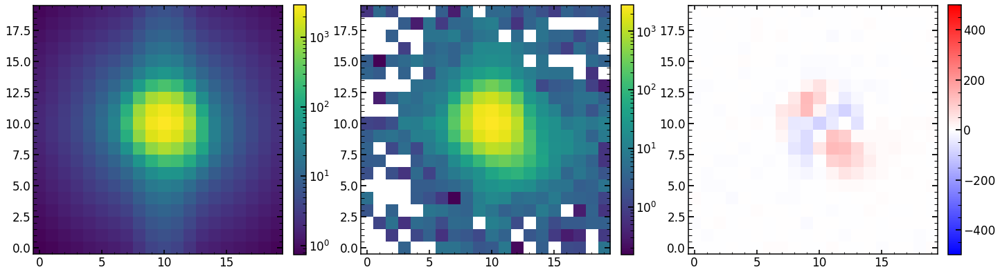

In [799]:

plt.figure(figsize=(24,10))
plt.subplot(131)
plt.imshow(best_result_from_Tokovinin_5_0[5][0],norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(list_of_sci_images[index_of_single_image],norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(list_of_sci_images[index_of_single_image]-best_result_from_Tokovinin_5_0[5][0],cmap='bwr',vmin=-500,vmax=500)
cbar=plt.colorbar(fraction=0.046, pad=0.04)



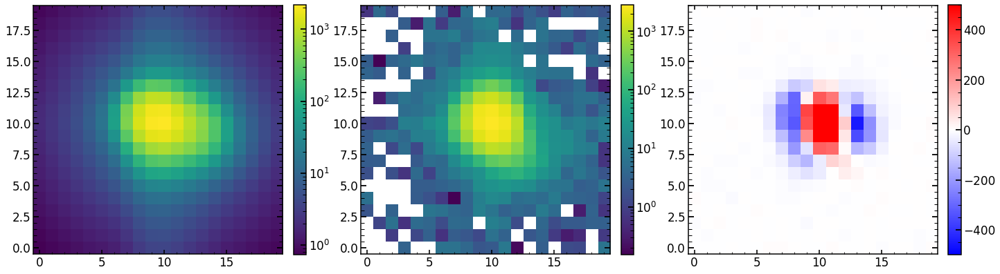

In [800]:

plt.figure(figsize=(24,10))
plt.subplot(131)
plt.imshow(best_result_from_Tokovinin_5_0[6][0],norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(list_of_sci_images[index_of_single_image],norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(list_of_sci_images[index_of_single_image]-best_result_from_Tokovinin_5_0[6][0],cmap='bwr',vmin=-500,vmax=500)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

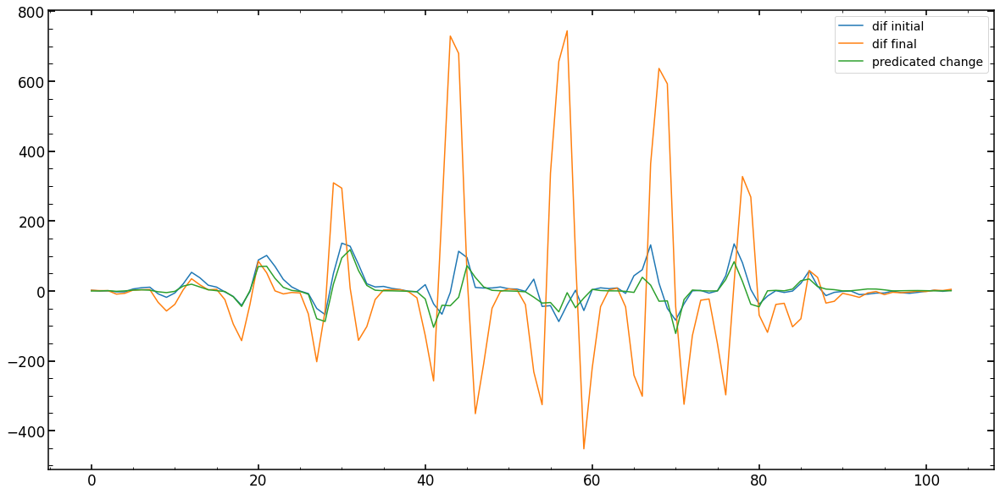

In [801]:
predicted_change=np.dot(H,first_proposal_Tokovnin).ravel()

plt.figure(figsize=(20,10))
plt.plot(uber_I_only_focus-uber_M0_only_focus,label='dif initial')

plt.plot(uber_I_only_focus-uber_M_final,label='dif final')

plt.plot(predicted_change,label='predicated change')

plt.legend()

In [756]:
# ratio between current parametrization and the previous (provided) changed parametrization
ratio_of_parametrizations=(array_of_delta_parametrizations[:,None]/array_of_delta_parametrizations_None_previous_best)

# create the array of how wavefront changes the uber_model by multiply the changes with new ratios
array_of_wavefront_changes_dedicated=np.transpose(ratio_of_parametrizations*\
                                        np.array(uber_images_normalized_previous_best_dedicated-uber_M0_previous_best_dedicated)/(array_of_delta_parametrizations_None_previous_best))  

NameError: name 'array_of_delta_parametrizations' is not defined

In [735]:
t/array_of_delta_z_parametrizations

array([  0.        ,  -8.67181821,   0.        ,  63.33472987,
         0.        ,  25.1642142 ,   0.        , -40.90583065,
         0.        ,  78.3494008 ,   0.        ,  31.37503421,
         0.        ,  18.88285236,   0.        ,  19.71306729])

In [805]:
H

array([[ 0.        ,  0.21687328,  0.        , ...,  0.04873253,
         0.        ,  0.00458006],
       [ 0.        ,  0.87649218,  0.        , ...,  0.42596568,
         0.        ,  0.08901247],
       [ 0.        ,  1.21077983,  0.        , ...,  0.31370331,
         0.        ,  0.1603021 ],
       ...,
       [ 0.        ,  0.26562178,  0.        , ..., -0.51751181,
         0.        , -0.05396505],
       [ 0.        ,  0.05732108,  0.        , ..., -0.07378933,
         0.        , -0.00557573],
       [ 0.        , -0.23768629,  0.        , ...,  0.37881154,
         0.        ,  0.05097806]])

In [806]:
np.nan_to_num(H,0)

array([[ 0.        ,  0.21687328,  0.        , ...,  0.04873253,
         0.        ,  0.00458006],
       [ 0.        ,  0.87649218,  0.        , ...,  0.42596568,
         0.        ,  0.08901247],
       [ 0.        ,  1.21077983,  0.        , ...,  0.31370331,
         0.        ,  0.1603021 ],
       ...,
       [ 0.        ,  0.26562178,  0.        , ..., -0.51751181,
         0.        , -0.05396505],
       [ 0.        ,  0.05732108,  0.        , ..., -0.07378933,
         0.        , -0.00557573],
       [ 0.        , -0.23768629,  0.        , ...,  0.37881154,
         0.        ,  0.05097806]])

array([[nan,  1.],
       [ 2., nan]])

In [808]:
np.nan_to_num(np.array([[np.nan,1],[2,np.nan]]),0)

array([[0., 1.],
       [2., 0.]])

In [811]:
np.maximum(array_of_delta_z_parametrizations,first_proposal_Tokovnin)

array([0.0025    , 0.24416923, 0.00204124, 0.73165422, 0.00176777,
       0.18300225, 0.00158114, 0.01507557, 0.00144338, 1.07220184,
       0.00133631, 0.01290994, 0.00125   , 0.76515564, 0.00117851,
       0.25773093, 0.00111803, 0.01091089, 0.001066  , 0.01042572,
       0.00102062, 0.01      , 0.00098058, 0.0096225 , 0.00094491,
       0.00928477, 0.00091287, 0.00898027, 0.00088388, 0.00870388,
       0.00085749, 0.00845154, 0.00083333, 0.00821995, 0.00081111,
       0.00800641, 0.00079057, 0.00780869, 0.00077152, 0.00762493,
       0.00075378, 0.00745356, 0.00073721, 0.00729325, 0.00072169,
       0.00714286, 0.00070711, 0.0070014 , 0.00069338, 0.00686803,
       0.00068041, 0.006742  , 0.00066815, 0.00662266, 0.00065653,
       0.00650945, 0.0006455 , 0.00640184, 0.000635  , 0.00629941,
       0.000625  , 0.00620174, 0.00061546, 0.00610847, 0.00060634,
       0.00601929, 0.00059761, 0.00593391, 0.00058926, 0.00585206,
       0.00058124, 0.0057735 , 0.00057354, 0.00569803, 0.00056

In [823]:
            list_of_delta_z_parametrizations=[]
            for z_par in range(0,19*2+2*number_of_extra_zernike):
                z_par_i=z_par+4
                # if this is the parameter that change
                if np.mod(z_par_i,2)==0:
                    list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
                if np.mod(z_par_i,2)==1:
                    list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))
                        
            array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)
            array_of_delta_z_parametrizations

array([0.0025    , 0.02236068, 0.00204124, 0.01889822, 0.00176777,
       0.01666667, 0.00158114, 0.01507557, 0.00144338, 0.0138675 ,
       0.00133631, 0.01290994, 0.00125   , 0.01212678, 0.00117851,
       0.01147079, 0.00111803, 0.01091089, 0.001066  , 0.01042572,
       0.00102062, 0.01      , 0.00098058, 0.0096225 , 0.00094491,
       0.00928477, 0.00091287, 0.00898027, 0.00088388, 0.00870388,
       0.00085749, 0.00845154, 0.00083333, 0.00821995, 0.00081111,
       0.00800641, 0.00079057, 0.00780869, 0.00077152, 0.00762493,
       0.00075378, 0.00745356, 0.00073721, 0.00729325, 0.00072169,
       0.00714286, 0.00070711, 0.0070014 , 0.00069338, 0.00686803,
       0.00068041, 0.006742  , 0.00066815, 0.00662266, 0.00065653,
       0.00650945, 0.0006455 , 0.00640184, 0.000635  , 0.00629941,
       0.000625  , 0.00620174, 0.00061546, 0.00610847, 0.00060634,
       0.00601929, 0.00059761, 0.00593391, 0.00058926, 0.00585206,
       0.00058124, 0.0057735 , 0.00057354, 0.00569803, 0.00056

In [833]:
array_of_multi_background_factors=np.concatenate((np.arange(3,3,-(3-3)/(nsteps-1)),np.array([3])) )
array_of_multi_background_factors

ZeroDivisionError: float division by zero

In [836]:
array_of_multi_background_factors=np.ones((nsteps))*3
array_of_multi_background_factors

array([3., 3., 3.])

In [841]:
list_of_particle_postion_focus_proposal=[]
for l in range(len(array_of_particle_position_proposal)):
    list_of_minchain=model_multi.create_list_of_allparameters(array_of_particle_position_proposal[0],\
                                                          list_of_defocuses=['0'],zmax=56)
    list_of_particle_postion_focus_proposal.append(list_of_minchain)

array_of_particle_postion_focus_proposal=np.array(list_of_particle_postion_focus_proposal)

In [880]:
list_of_minchain[0]

array([    0.03305758,    -0.91129426,    -0.54302017,    -0.34325149,
           0.40795935,    -0.44396466,    -0.57982209,     0.54374951,
           0.01886295,     0.20247791,    -0.04694434,     0.01222624,
           0.03680648,     0.03962365,     0.0319801 ,    -0.03244641,
          -0.03921772,     0.01216259,     0.03708531,     0.70255835,
           0.10599709,    -0.21711041,     0.27352715,     0.0627802 ,
           0.10376147,     0.25      ,     0.25      ,     0.25      ,
           1.        ,    -0.03620577,    -0.01351665,     0.89335116,
           0.02591337,     0.73920926,     1.04663307,     0.59825735,
       25718.09765165,     2.31572029,     0.00717128,     0.48939688,
           1.84215377,     0.99083419,    -0.01511988,    -0.01584725,
          -0.00785104,     0.00851931,     0.0022975 ,    -0.000155  ,
          -0.01416621,     0.00245813,    -0.01031893,     0.01306438,
           0.00319384,    -0.02084817,     0.00160031,     0.01114524,
      

In [844]:
allparameters_proposal_22=list_of_minchain[0]

In [854]:
stronger_array_01=np.array([1,0,0,0,0,0,0,0,
                                0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,
                                0.0,0.0,0.0,0.0,0.0,0.0,
                                0,0,0,0,
                                0,0,0,
                                0,0,0,0,
                                1,1,1,
                                1,1,1])  
zmax_input=22
stronger_array_01=np.concatenate((stronger_array_01,np.zeros((zmax_input-22))))
stronger_array_01

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 1., 1.])

In [876]:
zmax_input=56    
print('allparameters_proposal_22: '+str(allparameters_proposal_22))
parInit1=create_parInit(allparameters_proposal=allparameters_proposal_22,multi=None,pupil_parameters=None,\
                        allparameters_proposal_err=None,\
                        stronger=stronger_array_01,use_optPSF=None,deduced_scattering_slope=None,zmax=zmax_input)

allparameters_proposal_22: [    0.03305758    -0.91129426    -0.54302017    -0.34325149
     0.40795935    -0.44396466    -0.57982209     0.54374951
     0.01886295     0.20247791    -0.04694434     0.01222624
     0.03680648     0.03962365     0.0319801     -0.03244641
    -0.03921772     0.01216259     0.03708531     0.70255835
     0.10599709    -0.21711041     0.27352715     0.0627802
     0.10376147     0.25           0.25           0.25
     1.            -0.03620577    -0.01351665     0.89335116
     0.02591337     0.73920926     1.04663307     0.59825735
 25718.09765165     2.31572029     0.00717128     0.48939688
     1.84215377     0.99083419    -0.01511988    -0.01584725
    -0.00785104     0.00851931     0.0022975     -0.000155
    -0.01416621     0.00245813    -0.01031893     0.01306438
     0.00319384    -0.02084817     0.00160031     0.01114524
     0.00307501    -0.00239154    -0.00073899     0.00217737
     0.01019274    -0.00834874     0.00685014    -0.01084985
    -0

In [867]:
?? find_centroid_of_flux

In [877]:
14139*0.9

12725.1

In [928]:
out20=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/out20.npy',allow_pickle=True)
out21=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/out21.npy',allow_pickle=True)


best_particle0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/best_particle0.npy',allow_pickle=True)
best_particle1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/best_particle1.npy',allow_pickle=True)

best_result0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/best_result0.npy',allow_pickle=True)
best_result1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/best_result1.npy',allow_pickle=True)

array_of_particle_position_proposal0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/array_of_particle_position_proposal0.npy',allow_pickle=True)
array_of_particle_position_proposal1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/array_of_particle_position_proposal1.npy',allow_pickle=True)

In [932]:
out20[12][2]

array([    4.50030168,    -0.63775652,    -0.33172367,    -0.39387243,
           0.2183226 ,    -0.37758738,    -0.53761969,     0.8026604 ,
           0.01886295,     0.20247791,    -0.04694434,     0.01222624,
           0.03680648,     0.03962365,     0.0319801 ,    -0.03244641,
          -0.03921772,     0.01216259,     0.03708531,     0.70255835,
           0.10599709,    -0.21711041,     0.27352715,     0.0627802 ,
           0.10376147,     0.25      ,     0.25      ,     0.25      ,
           1.        ,    -0.03620577,    -0.01351665,     0.89335116,
           0.02591337,     0.73920926,     1.04663307,     0.59825735,
       85051.83246867,     1.55034087,     0.0082512 ,     0.62497022,
           1.76719692,     0.99751371,    -0.01511988,    -0.01584725,
          -0.00785104,     0.00851931,     0.0022975 ,    -0.000155  ,
          -0.01416621,     0.00245813,    -0.01031893,     0.01306438,
           0.00319384,    -0.02084817,     0.00160031,     0.01114524,
      

In [974]:
gbests_positions=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test_2/chainMay1221_Single_P_34389116Arres_gbests_position.npy')
gbests_positions[-1]

array([    0.26171978,    -0.94039191,    -0.5919298 ,    -0.62910179,
           0.77424995,    -0.72266234,    -0.92990731,     0.83330667,
           0.03863879,     0.22954357,    -0.04948961,     0.03281349,
           0.0587434 ,     0.050954  ,     0.02756475,    -0.03203576,
          -0.03294923,     0.02517083,     0.04498642,     0.6982929 ,
           0.10099376,    -0.22868679,     0.27114778,     0.06266987,
           0.10090548,     0.2078081 ,     0.31853494,     0.31105295,
           1.28564277,    -0.0509813 ,    -0.0183548 ,     0.87879873,
           0.03103068,     0.7212447 ,     1.04674646,     0.57226047,
       41743.30611071,     2.3012498 ,     0.00531958,     0.35327868,
           1.78696424,     0.98282497,    -0.01291785,    -0.01807254,
          -0.00805709,     0.01291273,     0.00101384,     0.00141808,
          -0.01207241,     0.00628245,    -0.00219551,     0.01574115,
           0.00356404,    -0.0226188 ,     0.00086017,     0.01206215,
      

## second idea

In [975]:
res_test=model(gbests_positions[-1],return_Image=True)


Entering lnlike_Neven
allparameters [    0.26171978    -0.94039191    -0.5919298     -0.62910179
     0.77424995    -0.72266234    -0.92990731     0.83330667
     0.03863879     0.22954357    -0.04948961     0.03281349
     0.0587434      0.050954       0.02756475    -0.03203576
    -0.03294923     0.02517083     0.04498642     0.6982929
     0.10099376    -0.22868679     0.27114778     0.06266987
     0.10090548     0.2078081      0.31853494     0.31105295
     1.28564277    -0.0509813     -0.0183548      0.87879873
     0.03103068     0.7212447      1.04674646     0.57226047
 41743.30611071     2.3012498      0.00531958     0.35327868
     1.78696424     0.98282497    -0.01291785    -0.01807254
    -0.00805709     0.01291273     0.00101384     0.00141808
    -0.01207241     0.00628245    -0.00219551     0.01574115
     0.00356404    -0.0226188      0.00086017     0.01206215
     0.00444335    -0.00095454    -0.00213609     0.00216633
     0.01068864    -0.00586613     0.00746922    

We are fitting for only one source
One source fitting result is [-3.90591631 -4.64877684]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.28982114791870117
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9956606666189773
Finished with lnlike_Neven
chi_2_almost/d.o.f is 10.024325; chi_2_almost_max_dof is 2514.4185 log(improvment) is -2.3993824
The likelihood reported is: -1233.0096435546875
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4489811392
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 448981139

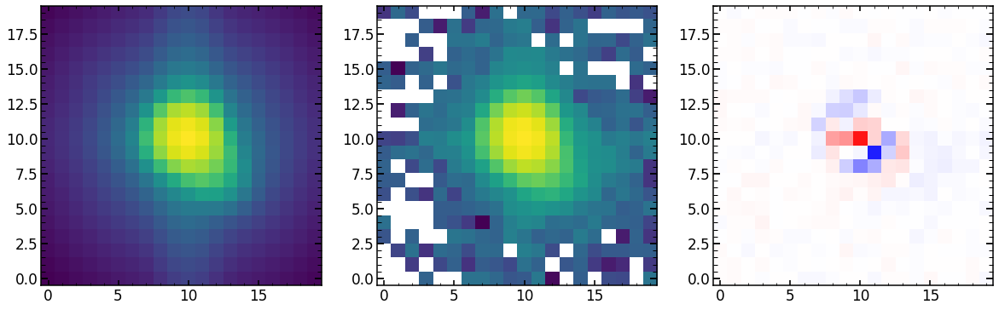

In [977]:
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(res_test[1],norm=LogNorm())

plt.subplot(132)
plt.imshow(list_of_sci_images[4],norm=LogNorm())

plt.subplot(133)
plt.imshow(res_test[1]-list_of_sci_images[4],cmap='bwr',vmin=-200,vmax=200)

In [979]:
minchain_focus_proposed=gbests_positions[-1]
minchain_focus_proposed

array([    0.26171978,    -0.94039191,    -0.5919298 ,    -0.62910179,
           0.77424995,    -0.72266234,    -0.92990731,     0.83330667,
           0.03863879,     0.22954357,    -0.04948961,     0.03281349,
           0.0587434 ,     0.050954  ,     0.02756475,    -0.03203576,
          -0.03294923,     0.02517083,     0.04498642,     0.6982929 ,
           0.10099376,    -0.22868679,     0.27114778,     0.06266987,
           0.10090548,     0.2078081 ,     0.31853494,     0.31105295,
           1.28564277,    -0.0509813 ,    -0.0183548 ,     0.87879873,
           0.03103068,     0.7212447 ,     1.04674646,     0.57226047,
       41743.30611071,     2.3012498 ,     0.00531958,     0.35327868,
           1.78696424,     0.99566067,    -0.01291785,    -0.01807254,
          -0.00805709,     0.01291273,     0.00101384,     0.00141808,
          -0.01207241,     0.00628245,    -0.00219551,     0.01574115,
           0.00356404,    -0.0226188 ,     0.00086017,     0.01206215,
      

In [981]:
list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
list_of_minchain[4]

array([    0.16492145,    -0.88632798,    -0.51669564,    -0.31938941,
           0.50845528,    -0.4275001 ,    -0.58096021,     0.58544687,
           0.03863879,     0.22954357,    -0.04948961,     0.03281349,
           0.0587434 ,     0.050954  ,     0.02756475,    -0.03203576,
          -0.03294923,     0.02517083,     0.04498642,     0.6982929 ,
           0.10099376,    -0.22868679,     0.27114778,     0.06266987,
           0.10090548,     0.2078081 ,     0.31853494,     0.31105295,
           1.28564277,    -0.0509813 ,    -0.0183548 ,     0.87879873,
           0.03103068,     0.7212447 ,     1.04674646,     0.57226047,
       30096.76438941,     2.31074047,     0.00645553,     0.49203847,
           1.83713253,     0.99250387,    -0.01291785,    -0.01807254,
          -0.00805709,     0.01291273,     0.00101384,     0.00141808,
          -0.01207241,     0.00628245,    -0.00219551,     0.01574115,
           0.00356404,    -0.0226188 ,     0.00086017,     0.01206215,
      

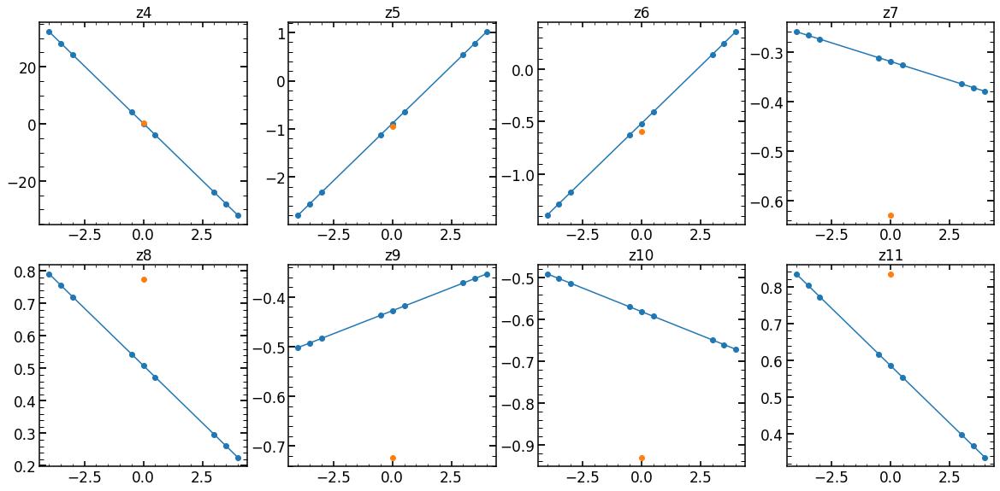

In [1007]:
plt.figure(figsize=(20,20))

for i in range(8):
    plt.subplot(4,4,i+1)
    
    points_single_par=np.array([[-4,list_of_minchain[0][i]],[-3.5,list_of_minchain[1][i]],[-3,list_of_minchain[2][i]],\
              [-0.5,list_of_minchain[3][i]],[0,list_of_minchain[4][i]],[0.5,list_of_minchain[5][i]],\
              [3,list_of_minchain[6][i]],[3.5,list_of_minchain[7][i]],[4,list_of_minchain[8][i]]])

    plt.plot(points_single_par[:,0],points_single_par[:,1],marker='o')
    plt.plot(0,minchain_focus_proposed[i],marker='o')
    plt.title('z'+str(i+4))



In [1015]:
minchain_parametrization_test=np.copy(minchain_parametrization)
for i in range(8):
    minchain_parametrization_test[i*2+1]=minchain_focus_proposed[i]

In [1018]:
minchain_parametrization_test-minchain_parametrization

array([ 0.        ,  0.09679832,  0.        , -0.05406393,  0.        ,
       -0.07523416,  0.        , -0.30971238,  0.        ,  0.26579467,
        0.        , -0.29516224,  0.        , -0.3489471 ,  0.        ,
        0.2478598 ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [1017]:
minchain_parametrization

array([   -8.0244858 ,     0.16492145,     0.47602686,    -0.88632798,
           0.21807862,    -0.51669564,    -0.01501342,    -0.31938941,
          -0.07063251,     0.50845528,     0.01854382,    -0.4275001 ,
          -0.02258284,    -0.58096021,    -0.06232856,     0.58544687,
          -0.00323915,     0.03863879,    -0.00228845,     0.22954357,
           0.0255806 ,    -0.04948961,     0.00145377,     0.03281349,
           0.0064667 ,     0.0587434 ,    -0.01380491,     0.050954  ,
           0.00260011,     0.02756475,    -0.00081079,    -0.03203576,
           0.00305707,    -0.03294923,     0.00756859,     0.02517083,
          -0.02024821,     0.04498642,     0.6982929 ,     0.10099376,
          -0.22868679,     0.27114778,     0.06266987,     0.10090548,
           0.2078081 ,     0.31853494,     0.31105295,     1.28564277,
          -0.0509813 ,    -0.0183548 ,     0.87879873,     0.03103068,
           0.7212447 ,     1.04674646,     0.57226047, 30096.76438941,
      

In [1057]:
results_of_fit_many_direct_Ar=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ne_from_Apr1421.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Kr_from_Apr1421.pkl',allow_pickle=True)

In [1058]:
print(len(results_of_fit_many_direct_Ar['m4']))
print(len(results_of_fit_many_direct_Ne['m4']))
print(len(results_of_fit_many_direct_Kr['m4']))

83
16
8


In [1062]:
# in minutes
((83+15+8)*(160))/3600

4.711111111111111

In [1060]:
530/60

8.833333333333334

In [1068]:
results_of_fit_many_direct_Ar['0'].loc['11']

z4         0.141509
z5        -0.866217
z6        -0.492212
z7        -0.350574
z8         0.462323
             ...   
z54        0.001938
z55        0.004467
z56       -0.000056
chi2       5.060300
chi2max    5.401278
Name: 11, Length: 78, dtype: float64

In [1069]:
    allparameters_proposal_22=np.array([    0.16492145,    -0.88632798,    -0.51669564,    -0.31938941,
           0.50845528,    -0.4275001 ,    -0.58096021,     0.58544687,
           0.03863879,     0.22954357,    -0.04948961,     0.03281349,
           0.0587434 ,     0.050954  ,     0.02756475,    -0.03203576,
          -0.03294923,     0.02517083,     0.04498642,     0.6982929 ,
           0.10099376,    -0.22868679,     0.27114778,     0.06266987,
           0.10090548,     0.2078081 ,     0.31853494,     0.31105295,
           1.28564277,    -0.0509813 ,    -0.0183548 ,     0.87879873,
           0.03103068,     0.7212447 ,     1.04674646,     0.57226047,
       30096.76438941,     2.31074047,     0.00645553,     0.49203847,
           1.83713253,     0.99250387,    -0.01291785,    -0.01807254,
          -0.00805709,     0.01291273,     0.00101384,     0.00141808,
          -0.01207241,     0.00628245,    -0.00219551,     0.01574115,
           0.00356404,    -0.0226188 ,     0.00086017,     0.01206215,
           0.00444335,    -0.00095454,    -0.00213609,     0.00216633,
           0.01068864,    -0.00586613,     0.00746922,    -0.00992799,
          -0.00369008,    -0.01585207,    -0.00102798,     0.00326984,
          -0.00046356,    -0.00617323,    -0.01062363,     0.00643621,
           0.00136246,     0.00197025,     0.00300083,     0.0008643 ])

In [1070]:
allparameters_proposal_22.shape

(76,)

In [1074]:
results_of_fit_input=results_of_fit_many_direct_Ar
labelInput='0'
allparameters_proposalp2=results_of_fit_input[labelInput].loc[11].values

TypeError: cannot do label indexing on <class 'pandas.core.indexes.base.Index'> with these indexers [11] of <class 'int'>

In [1079]:
results_of_fit_input[labelInput].loc['119']

z4        -0.110626
z5         0.307557
z6        -0.405004
z7        -0.141118
z8        -0.769986
             ...   
z54       -0.008748
z55        0.004465
z56       -0.004019
chi2       5.578534
chi2max    6.262082
Name: 119, Length: 78, dtype: float64

In [1080]:
results_of_fit_many_direct_Ar=pickle.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl')


TypeError: file must have 'read' and 'readline' attributes

In [1082]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'rb') as f:
    results_of_fit_input_HgAr=pickle.load(f)

In [1085]:
results_of_fit_input_HgAr

{'m4':             z4        z5        z6        z7        z8        z9       z10  \
 1    30.290384 -0.644932  0.064155  0.388022  0.307304  0.195472 -0.339191   
 100  30.585876  0.288952 -0.276118  0.338667 -0.720702 -0.015958 -0.398630   
 101  30.613730  0.404984 -0.456706  0.211602 -0.701137  0.031037 -0.382912   
 102  29.782121  0.936275 -0.781658  0.068944 -0.724301 -0.068564 -0.314337   
 103  29.604000  1.161121 -0.779373  0.145028 -0.635748 -0.047075 -0.349592   
 ..         ...       ...       ...       ...       ...       ...       ...   
 93   31.058508  0.849810 -1.661763 -0.013216 -0.386707 -0.125456 -0.369292   
 95   31.392135  0.995179 -2.075854 -0.088601 -0.356210 -0.130338 -0.245515   
 97   30.324235 -0.047577 -0.299759  0.376226 -0.782590  0.021636 -0.288402   
 98   30.101740  0.083810 -0.357582  0.327705 -0.642663  0.026658 -0.294792   
 99   29.944398  0.481207 -0.791697  0.317473 -0.749966 -0.041459 -0.309717   
 
           z11       z12       z13  ...     

# May13 (focus run)

In [ ]:
import glob

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_flip.pkl",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_flip.pkl",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_flip.pkl",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## scripts 

### first scripts

In [1158]:
results_of_fit_many_direct_Ar=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ne_from_Apr1421.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Kr_from_Apr1421.pkl',allow_pickle=True)

In [1159]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=finalAr[finalAr['close']=='1'].index & finalAr[finalAr['xc']<3000].index
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index & finalNe[finalNe['xc']<3000].index
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index & finalKr[finalKr['xc']<3000].index

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)


64
32
8
Int64Index([ 1,  3,  5,  6,  7,  8,  9, 11, 13, 15, 17, 18, 19, 20, 21, 23, 25,
            27, 29, 30, 31, 32, 33, 35, 37, 39, 41, 42, 43, 44, 45, 47, 49, 51,
            53, 54, 55, 56, 57, 59, 61, 63, 65, 66, 67, 68, 69, 71, 73, 75, 77,
            78, 79, 80, 81, 83, 85, 87, 89, 90, 91, 92, 93, 95],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31], dtype='int64')


In [1132]:
results_of_fit_many_direct_Ar['0'].index.values

array(['1', '100', '101', '102', '103', '104', '105', '106', '107', '109',
       '11', '110', '111', '112', '113', '114', '115', '116', '117',
       '118', '119', '13', '15', '17', '18', '19', '20', '21', '23', '25',
       '27', '29', '3', '30', '32', '33', '37', '39', '41', '42', '43',
       '44', '47', '49', '5', '51', '53', '54', '55', '56', '57', '59',
       '6', '61', '63', '65', '66', '67', '68', '69', '7', '71', '73',
       '75', '77', '78', '79', '8', '80', '81', '83', '85', '87', '89',
       '9', '90', '91', '92', '93', '95', '97', '98', '99'], dtype=object)

In [1160]:
len(results_of_fit_many_direct_Ar['0'].index.values)

83

In [1134]:
date='May1321'


file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ar_1_'+date+'.sh','w') 

for single_spot in results_of_fit_many_direct_Ar['0'].index.values.astype(int):
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        

    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34389 -spot "+str(single_spot)+\
               " -nsteps 13 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Apr1421 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type focus \n")

file.close()    
  




### 2nd script 

In [ ]:
results_of_fit_many_direct_Ar['0'].index.values

In [1162]:
analyzed_Ar_images[:,1]

array(['100', '101', '102', '103', '104', '105', '106', '107', '109',
       '110', '111', '112', '113', '114', '115', '116', '11', '118',
       '119', '13', '15', '1', '17', '18', '19', '20', '21', '23', '25',
       '29', '30', '32', '33', '3', '37', '39', '41', '42', '43', '47',
       '49', '51', '53', '54', '5', '57', '59', '61', '63', '65', '6',
       '69', '71', '7', '78', '80', '81', '83', '8', '87', '89', '90',
       '91', '92', '95', '9', '97', '98', '99'], dtype='<U21')

In [1166]:
values_for_2nd_focus_script=np.setdiff1d(results_of_fit_many_direct_Ar['0'].index.values,analyzed_Ar_images[:,1])
values_for_2nd_focus_script

array(['117', '27', '44', '55', '56', '66', '67', '68', '73', '75', '77',
       '79', '85', '93'], dtype=object)

In [1182]:
date='May1321'


file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ar_2_'+date+'.sh','w') 

for single_spot in values_for_2nd_focus_script.astype(int):
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        

    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34389 -spot "+str(single_spot)+\
               " -nsteps 13 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Apr1421 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type focus \n")

file.close()    
  


## which are avaliable 

In [84]:
date='May1321'

ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*KrSwarm1.npy', recursive=True)

In [85]:
eps_value=6

analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 

analyzed_Ar_images=np.array(analyzed_Ar_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [86]:
print(analyzed_Ar_images)
print(analyzed_Neon_images)
print(analyzed_Kr_images)

[['34389' '100' 'Ar']
 ['34389' '101' 'Ar']
 ['34389' '102' 'Ar']
 ['34389' '103' 'Ar']
 ['34389' '104' 'Ar']
 ['34389' '105' 'Ar']
 ['34389' '106' 'Ar']
 ['34389' '107' 'Ar']
 ['34389' '109' 'Ar']
 ['34389' '110' 'Ar']
 ['34389' '111' 'Ar']
 ['34389' '112' 'Ar']
 ['34389' '113' 'Ar']
 ['34389' '114' 'Ar']
 ['34389' '115' 'Ar']
 ['34389' '116' 'Ar']
 ['34389' '11' 'Ar']
 ['34389' '117' 'Ar']
 ['34389' '118' 'Ar']
 ['34389' '119' 'Ar']
 ['34389' '13' 'Ar']
 ['34389' '15' 'Ar']
 ['34389' '1' 'Ar']
 ['34389' '17' 'Ar']
 ['34389' '18' 'Ar']
 ['34389' '19' 'Ar']
 ['34389' '20' 'Ar']
 ['34389' '21' 'Ar']
 ['34389' '23' 'Ar']
 ['34389' '25' 'Ar']
 ['34389' '27' 'Ar']
 ['34389' '29' 'Ar']
 ['34389' '30' 'Ar']
 ['34389' '32' 'Ar']
 ['34389' '33' 'Ar']
 ['34389' '3' 'Ar']
 ['34389' '37' 'Ar']
 ['34389' '39' 'Ar']
 ['34389' '41' 'Ar']
 ['34389' '42' 'Ar']
 ['34389' '43' 'Ar']
 ['34389' '44' 'Ar']
 ['34389' '47' 'Ar']
 ['34389' '49' 'Ar']
 ['34389' '51' 'Ar']
 ['34389' '53' 'Ar']
 ['34389' '54' 'A

In [87]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:83 / analyzed_Ne_images:0 / analyzed_Kr_images:0


## single image analysis 

In [1190]:
date='May1321'
#obs=34389
#obs_int=int(obs)
single_number='23'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34389
    finalArc=finalAr
if arc=='Ne':
    obs=34389
    finalArc=finalNe
if arc=='Kr':
    obs=34389
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                  587
xc                     453
yc                    4020
wavelength        966.0642
close                    1
lamp                    Ar
xc_effective           453
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 23, dtype: object

In [1136]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=False,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/


UnboundLocalError: local variable 'obs_single' referenced before assignment

In [1137]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443736ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443736ArSwarm1.npy
(51, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443736ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 2.859537045160929
average chi2 reduced is: -4.444352120235594


In [1191]:
for Argon_index in analyzed_Ar_images[:,1]:
    gbests_positions=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1321/chainMay1321_Single_P_34389'+\
                             Argon_index+'6Arres_gbests_position.npy')
    minchain_parametrization_focus=gbests_positions[-1]

    date='Apr1421'
    #obs=34313
    #obs_int=int(obs)
    single_number=str(Argon_index)
    image_index=int(single_number)
    eps=6
    arc='Ar'
    dataset=6

    if arc=='Ar':
        obs=34341+96
        finalArc=finalAr

    list_of_defocuses_input_short=['m4','p4']
    list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']



    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371006ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 5.166008710861206
average chi2 reduced is: -4.7614817005132535
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 343

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371126ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 5.532273981306288
average chi2 reduced is: -4.754088456959487
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 113
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371136ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 12.295840581258139
average chi2 reduced is: -5.881756243

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437176ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 7.367576016320123
average chi2 reduced is: -5.809459286886445
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 18
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437186ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.623629278606838
average chi2 reduced is: -5.066474377170675
S

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437376ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.0202855004204645
average chi2 reduced is: -4.832688091120991
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 39
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437396ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 2.6658375130759344
average chi2 reduced is: -4.34370246383512


Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437596ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.411076837115818
average chi2 reduced is: -4.782815874686889
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 61
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437616ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 3.5124304559495716
average chi2 reduced is: -4.749544338380287


Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443786ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.9326249493492975
average chi2 reduced is: -5.125329908458201
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 87
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437876ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 2.5093792147106595
average chi2 reduced is: -4.1729959411336
ST

In [82]:
columns56_analysis=['z4',
 'z5',
 'z6',
 'z7',
 'z8',
 'z9',
 'z10',
 'z11',
 'z12',
 'z13',
 'z14',
 'z15',
 'z16',
 'z17',
 'z18',
 'z19',
 'z20',
 'z21',
 'z22',
 'hscFrac',
 'strutFrac',
 'dxFocal',
 'dyFocal',
 'slitFrac',
 'slitFrac_dy',
 'wide_0',
 'wide_23',
 'wide_43',
 'misalign',
 'x_fiber',
 'y_fiber',
 'effective_radius_illumination',
 'frd_sigma',
 'frd_lorentz_factor',
 'det_vert',
 'slitHolder_frac_dx',
 'grating_lines',
 'scattering_slope',
 'scattering_amplitude',
 'pixel_effect',
 'fiber_r',
 'flux',
 'z23',
 'z24',
 'z25',
 'z26',
 'z27',
 'z28',
 'z29',
 'z30',
 'z31',
 'z32',
 'z33',
 'z34',
 'z35',
 'z36',
 'z37',
 'z38',
 'z39',
 'z40',
 'z41',
 'z42',
 'z43',
 'z44',
 'z45',
 'z46',
 'z47',
 'z48',
 'z49',
 'z50',
 'z51',
 'z52',
 'z53',
 'z54',
 'z55',
 'z56',
 'chi2',
 'chi2max']

In [99]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for Argon_index in analyzed_Ar_images[:,1]:
    
    # focus analysis
    gbests_positions=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1321/chainMay1321_Single_P_34389'+Argon_index+'6Arres_gbests_position.npy')
    minchain_parametrization_focus=gbests_positions[-1]

    # defocus
    date='Apr1421'
    #obs=34313
    #obs_int=int(obs)
    single_number=str(Argon_index)
    image_index=int(single_number)
    eps=6
    arc='Ar'
    dataset=6

    if arc=='Ar':
        obs=34341+96
        finalArc=finalAr

    list_of_defocuses_input_short=['m4','p4']
    list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_long)
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    minchain_parametrization_modified_via_focus=np.copy(minchain_parametrization)
    # changing z
    for i in range(8):
        minchain_parametrization_modified_via_focus[2*i+1]=minchain_parametrization_focus[i]
    # changing global
    for i in range(6):
        minchain_parametrization_modified_via_focus[2*19+17+i]=minchain_parametrization_focus[19+17+i]
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization_modified_via_focus)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371006ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 5.166008710861206
average chi2 reduced is: -4.7614817005132535
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 343

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371126ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 5.532273981306288
average chi2 reduced is: -4.754088456959487
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 113
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371136ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 12.295840581258139
average chi2 reduced is: -5.881756243

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437176ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 7.367576016320123
average chi2 reduced is: -5.809459286886445
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 18
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437186ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.623629278606838
average chi2 reduced is: -5.066474377170675
S

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443736ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 2.859537045160929
average chi2 reduced is: -4.444352120235594
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 37
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437376ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.0202855004204645
average chi2 reduced is: -4.832688091120991
S

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437556ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.879402531517877
average chi2 reduced is: -5.356514174461366
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 56
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437566ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.083590149879456
average chi2 reduced is: -5.055117966737677
S

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437696ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 11.947154257032606
average chi2 reduced is: -6.16655277310669
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 71
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437716ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.460354407628377
average chi2 reduced is: -4.735163720929999
S

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443786ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.9326249493492975
average chi2 reduced is: -5.125329908458201
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 87
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437876ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 2.5093792147106595
average chi2 reduced is: -4.1729959411336
ST

In [100]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/May1321/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_May1321.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_May1321.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_May1321.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

In [1239]:
results_of_fit_many_Ar['0']

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,z49,z50,z51,z52,z53,z54,z55,z56,chi2,chi2max
100,0.548473,-0.568507,-0.125218,0.373691,-0.803355,0.009048,-0.316340,-0.215712,-0.127737,0.096974,...,0.005446,-0.007415,-0.001499,0.003604,0.002728,-0.006380,-0.000403,0.005272,5.201240,5.666430
101,0.614050,-0.430231,0.032457,0.284276,-0.743021,-0.036727,-0.323499,-0.240701,-0.126180,0.054981,...,0.000847,-0.007742,0.000254,0.001566,0.000241,-0.003502,0.000986,0.002734,11.935018,13.145102
102,0.513211,-0.225052,0.041941,0.162731,-0.662420,-0.091029,-0.332471,-0.209098,-0.115726,0.019899,...,0.000110,-0.006042,0.000463,0.002931,-0.004497,-0.002766,0.002884,0.000495,6.164428,6.869142
103,0.396547,0.020131,0.036862,0.098334,-0.630436,-0.100235,-0.338485,-0.189316,-0.105897,-0.019381,...,0.001222,-0.007737,-0.002712,0.004026,-0.001965,-0.002946,0.001685,0.001108,7.385048,8.057009
104,0.260061,0.172471,-0.076560,0.038949,-0.647441,-0.142815,-0.343105,-0.145419,-0.110329,-0.051784,...,-0.000066,-0.007836,-0.004445,0.002570,-0.002725,-0.001715,0.003782,0.000820,5.483433,6.298566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.082058,0.216326,-0.762162,-0.137787,-0.448578,-0.114900,-0.328846,0.071396,0.059272,-0.100780,...,-0.003456,-0.003316,0.004204,0.004258,-0.002729,-0.009679,-0.000852,0.004570,4.462058,4.647131
9,0.362063,-0.904987,-0.365740,-0.263358,0.503873,-0.335363,-0.307692,0.227665,-0.070145,0.171032,...,-0.000706,-0.005580,-0.002843,0.001411,0.000711,0.001506,0.007624,0.008623,12.119239,13.673769
97,0.650283,-0.634564,-0.230429,0.511329,-0.857167,0.068832,-0.204667,-0.160685,-0.077383,0.117331,...,0.007888,-0.008843,-0.001682,0.001592,0.002397,-0.003809,0.001688,0.000850,4.683351,4.904297
98,0.599535,-0.671418,-0.207277,0.455729,-0.793069,0.040637,-0.228391,-0.170618,-0.075092,0.114428,...,0.005391,-0.008497,-0.002681,0.002358,0.002623,-0.004645,0.000486,0.004208,3.501802,4.017262


# Comparing May13 and May14

In [70]:

list_of_label=['m4','m35','m3','m05','0','p05','p3','p35','p4']

In [144]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/May1321/'
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_May1321.pkl', 'rb') as f:
    results_of_fit_input_Ar=pickle.load(f)
list_of_minchain_focus_May13=[]
for l in list_of_label:
    minchain_focus_May13=results_of_fit_input_Ar[l].loc['23'].values
    list_of_minchain_focus_May13.append(minchain_focus_May13)
    
list_of_minchain_focus_Apr14=[]
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'rb') as f:
    results_of_fit_input_Ar=pickle.load(f)
for l in list_of_label:
    minchain_focus_Apr14=results_of_fit_input_Ar[l].loc['23'].values
    list_of_minchain_focus_Apr14.append(minchain_focus_Apr14)

In [112]:
Argon_index='11'
gbests_positions=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1321/chainMay1321_Single_P_34389'+Argon_index+'6Arres_gbests_position.npy')
minchain_parametrization_focus=gbests_positions[-1]

In [64]:
list_of_minchain[4]

array([    0.22547686,    -0.81937869,    -0.50688784,    -0.31293386,
           0.5098703 ,    -0.4531222 ,    -0.6135466 ,     0.62270752,
           0.03915772,     0.24664053,    -0.0584393 ,     0.02960187,
           0.06938332,     0.05670946,     0.02991142,    -0.03138752,
          -0.02896674,     0.0203729 ,     0.04536624,     0.69803544,
           0.09677465,    -0.21199589,     0.25834043,     0.06148195,
           0.09258847,     0.12832376,     0.26656449,     0.33822621,
           2.02183362,    -0.04039842,    -0.02453535,     0.86261315,
           0.0313619 ,     0.77308003,     1.0391207 ,     0.5667973 ,
       39901.28533223,     2.33003029,     0.00671279,     0.5076813 ,
           1.86974135,     0.99059306,    -0.01581092,    -0.02516584,
          -0.00917507,     0.0095926 ,    -0.00073757,    -0.00168001,
          -0.01071725,     0.00892149,    -0.00271214,     0.02671868,
           0.00376128,    -0.0192859 ,    -0.00112825,     0.01709003,
      

In [105]:
minchain_focus_proposed_pre_May13=np.array([    0.26171978,    -0.94039191,    -0.5919298 ,    -0.62910179,
           0.77424995,    -0.72266234,    -0.92990731,     0.83330667,
           0.03863879,     0.22954357,    -0.04948961,     0.03281349,
           0.0587434 ,     0.050954  ,     0.02756475,    -0.03203576,
          -0.03294923,     0.02517083,     0.04498642,     0.6982929 ,
           0.10099376,    -0.22868679,     0.27114778,     0.06266987,
           0.10090548,     0.2078081 ,     0.31853494,     0.31105295,
           1.28564277,    -0.0509813 ,    -0.0183548 ,     0.87879873,
           0.03103068,     0.7212447 ,     1.04674646,     0.57226047,
       41743.30611071,     2.3012498 ,     0.00531958,     0.35327868,
           1.78696424,     0.99566067,    -0.01291785,    -0.01807254,
          -0.00805709,     0.01291273,     0.00101384,     0.00141808,
          -0.01207241,     0.00628245,    -0.00219551,     0.01574115,
           0.00356404,    -0.0226188 ,     0.00086017,     0.01206215,
           0.00444335,    -0.00095454,    -0.00213609,     0.00216633,
           0.01068864,    -0.00586613,     0.00746922,    -0.00992799,
          -0.00369008,    -0.01585207,    -0.00102798,     0.00326984,
          -0.00046356,    -0.00617323,    -0.01062363,     0.00643621,
           0.00136246,     0.00197025,     0.00300083,     0.0008643 ])

In [107]:
minchain_parametrization_focus_11_May13

array([    0.49205226,    -0.70169865,    -0.83415743,    -0.48090025,
           0.85394434,    -0.7434078 ,    -0.67482133,     0.8550878 ,
           0.03234551,     0.22478388,    -0.05146237,     0.031311  ,
           0.05681622,     0.04934641,     0.03078492,    -0.03585405,
          -0.03068573,     0.02525885,     0.04606385,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       44228.80941593,     1.76663572,     0.00195193,     0.31210391,
           1.8611165 ,     0.99830155,    -0.01402689,    -0.02122329,
          -0.00962404,     0.00867068,     0.00084195,    -0.00002553,
          -0.01315779,     0.00663897,    -0.00163735,     0.01874173,
           0.00365519,    -0.02150885,    -0.00064811,     0.01421953,
      

In [103]:
Argon_index='11'
gbests_positions=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1321/chainMay1321_Single_P_34389'+Argon_index+'6Arres_gbests_position.npy')
minchain_parametrization_focus_11_May13=gbests_positions[-1]

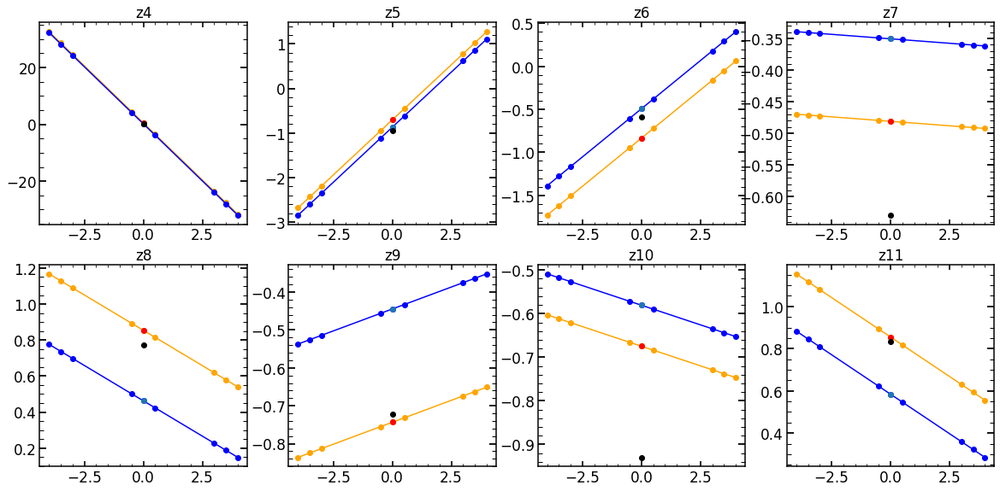

In [143]:
plt.figure(figsize=(20,20))

for i in range(8):
    plt.subplot(4,4,i+1)
    #May 13
    points_single_par=np.array([[-4,list_of_minchain_focus_May13[0][i]],[-3.5,list_of_minchain_focus_May13[1][i]],[-3,list_of_minchain_focus_May13[2][i]],\
              [-0.5,list_of_minchain_focus_May13[3][i]],[0,list_of_minchain_focus_May13[4][i]],[0.5,list_of_minchain_focus_May13[5][i]],\
              [3,list_of_minchain_focus_May13[6][i]],[3.5,list_of_minchain_focus_May13[7][i]],[4,list_of_minchain_focus_May13[8][i]]])
    
    points_single_par_Apr14=np.array([[-4,list_of_minchain_focus_Apr14[0][i]],[-3.5,list_of_minchain_focus_Apr14[1][i]],[-3,list_of_minchain_focus_Apr14[2][i]],\
              [-0.5,list_of_minchain_focus_Apr14[3][i]],[0,list_of_minchain_focus_Apr14[4][i]],[0.5,list_of_minchain_focus_Apr14[5][i]],\
              [3,list_of_minchain_focus_Apr14[6][i]],[3.5,list_of_minchain_focus_Apr14[7][i]],[4,list_of_minchain_focus_Apr14[8][i]]])

    plt.plot(points_single_par[:,0],points_single_par[:,1],marker='o',color='orange')
    plt.plot(points_single_par_Apr14[:,0],points_single_par_Apr14[:,1],marker='o',color='blue')
    # May 14
    plt.plot(0,minchain_focus_proposed[i],marker='o')
    # what should have been an input for May13
    plt.plot(0,minchain_parametrization_focus_11_May13[i],marker='o',color='red')
    plt.plot(0,minchain_focus_proposed_pre_May13[i],marker='o',color='black')
    
    plt.title('z'+str(i+4))

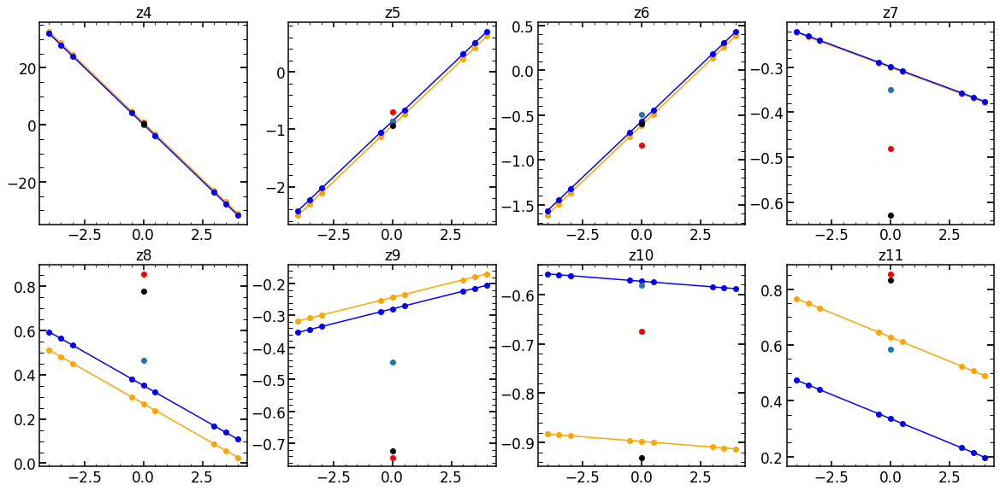

In [145]:
plt.figure(figsize=(20,20))

for i in range(8):
    plt.subplot(4,4,i+1)
    #May 13
    points_single_par=np.array([[-4,list_of_minchain_focus_May13[0][i]],[-3.5,list_of_minchain_focus_May13[1][i]],[-3,list_of_minchain_focus_May13[2][i]],\
              [-0.5,list_of_minchain_focus_May13[3][i]],[0,list_of_minchain_focus_May13[4][i]],[0.5,list_of_minchain_focus_May13[5][i]],\
              [3,list_of_minchain_focus_May13[6][i]],[3.5,list_of_minchain_focus_May13[7][i]],[4,list_of_minchain_focus_May13[8][i]]])
    
    points_single_par_Apr14=np.array([[-4,list_of_minchain_focus_Apr14[0][i]],[-3.5,list_of_minchain_focus_Apr14[1][i]],[-3,list_of_minchain_focus_Apr14[2][i]],\
              [-0.5,list_of_minchain_focus_Apr14[3][i]],[0,list_of_minchain_focus_Apr14[4][i]],[0.5,list_of_minchain_focus_Apr14[5][i]],\
              [3,list_of_minchain_focus_Apr14[6][i]],[3.5,list_of_minchain_focus_Apr14[7][i]],[4,list_of_minchain_focus_Apr14[8][i]]])

    plt.plot(points_single_par[:,0],points_single_par[:,1],marker='o',color='orange')
    plt.plot(points_single_par_Apr14[:,0],points_single_par_Apr14[:,1],marker='o',color='blue')
    # May 14
    plt.plot(0,minchain_focus_proposed[i],marker='o')
    # what should have been an input for May13
    plt.plot(0,minchain_parametrization_focus_11_May13[i],marker='o',color='red')
    plt.plot(0,minchain_focus_proposed_pre_May13[i],marker='o',color='black')
    
    plt.title('z'+str(i+4))

In [120]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/May1321/'
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_May1321.pkl', 'rb') as f:
    results_of_fit_input_Ar_May13=pickle.load(f)
list_of_minchain_focus_May13=[]
for l in list_of_label:
    minchain_focus_May13=results_of_fit_input_Ar_May13[l].loc['55'].values
    list_of_minchain_focus_May13.append(minchain_focus_May13)
    
list_of_minchain_focus_Apr14=[]
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'rb') as f:
    results_of_fit_input_Ar_Apr14=pickle.load(f)
for l in list_of_label:
    minchain_focus_Apr14=results_of_fit_input_Ar_Apr14[l].loc['55'].values
    list_of_minchain_focus_Apr14.append(minchain_focus_Apr14)

In [125]:
results_of_fit_input_Ar_Apr14['0'].loc['11'].values

array([    0.14150858,    -0.86621665,    -0.49221216,    -0.35057435,
           0.46232263,    -0.44464628,    -0.58068307,     0.58426673,
           0.03234551,     0.22478388,    -0.05146237,     0.031311  ,
           0.05681622,     0.04934641,     0.03078492,    -0.03585405,
          -0.03068573,     0.02525885,     0.04606385,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       36531.72636471,     2.32348704,     0.00688627,     0.46311425,
           1.86847745,     0.99269762,    -0.01402689,    -0.02122329,
          -0.00962404,     0.00867068,     0.00084195,    -0.00002553,
          -0.01315779,     0.00663897,    -0.00163735,     0.01874173,
           0.00365519,    -0.02150885,    -0.00064811,     0.01421953,
      

In [118]:
finalAr.loc[11]['xc_effective']

59

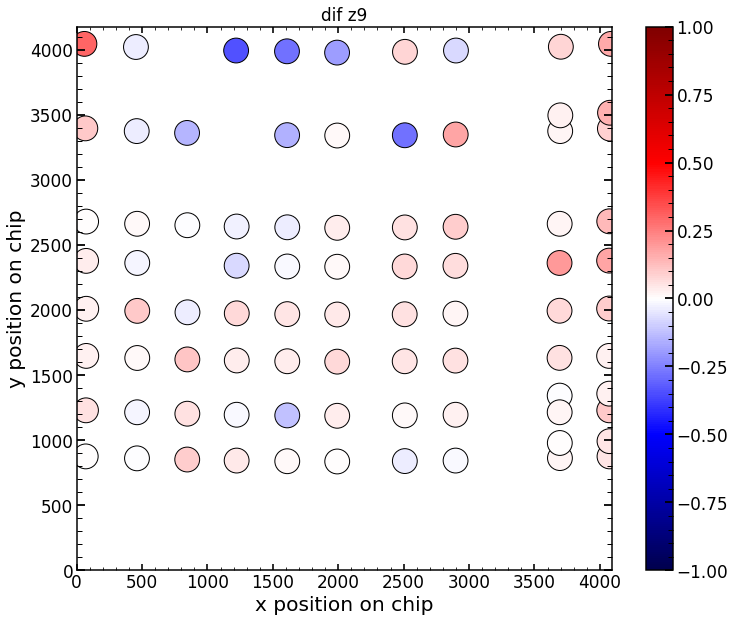

In [140]:
i=5
list_of_x=[]
list_of_y=[]
list_of_values_Ar=[]
for Argon_index in analyzed_Ar_images[:,1]:
    list_of_x.append(finalAr.loc[int(Argon_index)]['xc_effective'])
    list_of_y.append(finalAr.loc[int(Argon_index)]['yc'])
    list_of_values_Ar.append(results_of_fit_input_Ar_Apr14['0'].loc[Argon_index].values[i]-results_of_fit_input_Ar_May13['0'].loc[Argon_index].values[i])

# plot the results of the interpolation
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Apr1421'
descriptions=results_of_fit_many_Ar[label[0]].columns
# j runs throught the amount of defocu that we have analyzed
# i runs through all the parameters


# take values for HgAr
x_Ar=np.array(list_of_x)
y_Ar=np.array(list_of_y)
values_Ar=np.array(list_of_values_Ar)

# join these values
x=x_Ar
y=y_Ar
colors=values_Ar



plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=-1, vmax=1,edgecolor='black',marker='o')

plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('dif z'+str(4+i))

plt.colorbar()


# why no change in May14

In [185]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/May1321/'
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_May1321.pkl', 'rb') as f:
    results_of_fit_input_Ar=pickle.load(f)
list_of_minchain_focus_May13=[]
for l in list_of_label:
    minchain_focus_May13=results_of_fit_input_Ar[l].loc['11'].values
    list_of_minchain_focus_May13.append(minchain_focus_May13)
    
list_of_minchain_focus_Apr14=[]
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'rb') as f:
    results_of_fit_input_Ar=pickle.load(f)
for l in list_of_label:
    minchain_focus_Apr14=results_of_fit_input_Ar[l].loc['11'].values
    list_of_minchain_focus_Apr14.append(minchain_focus_Apr14)

In [307]:
initial_best_result_11Ar6_May1821=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1821/initial_best_result_11Ar6.npy',allow_pickle=True)

In [304]:
initial_best_result_11Ar6_May1421=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1421/initial_best_result_11Ar6.npy',allow_pickle=True)

In [310]:
initial_best_result_11Ar6_May1421[7]

array([   -8.02104088,     0.49205226,     0.49402878,    -0.70169865,
           0.22408148,    -0.83415743,    -0.00282077,    -0.48090025,
          -0.0784537 ,     0.85394434,     0.02312979,    -0.7434078 ,
          -0.01801556,    -0.67482133,    -0.07477986,     0.8550878 ,
          -0.00673073,     0.03234551,    -0.00649447,     0.22478388,
           0.02566567,    -0.05146237,     0.00271898,     0.031311  ,
           0.00804809,     0.05681622,    -0.01641635,     0.04934641,
           0.00186372,     0.03078492,    -0.00241525,    -0.03585405,
           0.00370046,    -0.03068573,     0.01103134,     0.02525885,
          -0.02298525,     0.04606385,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 44228.80941593,
      

In [311]:
initial_best_result_11Ar6_May1821[7]

array([   -8.02104088,     0.49205226,     0.49402878,    -0.70169865,
           0.22408148,    -0.83415743,    -0.00282077,    -0.48090025,
          -0.0784537 ,     0.85394434,     0.02312979,    -0.7434078 ,
          -0.01801556,    -0.67482133,    -0.07477986,     0.8550878 ,
          -0.00673073,     0.03234551,    -0.00649447,     0.22478388,
           0.02566567,    -0.05146237,     0.00271898,     0.031311  ,
           0.00804809,     0.05681622,    -0.01641635,     0.04934641,
           0.00186372,     0.03078492,    -0.00241525,    -0.03585405,
           0.00370046,    -0.03068573,     0.01103134,     0.02525885,
          -0.02298525,     0.04606385,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 44228.80941593,
      

In [299]:
list_of_minchain_focus_May13[4]

array([    0.49205226,    -0.70169865,    -0.83415743,    -0.48090025,
           0.85394434,    -0.7434078 ,    -0.67482133,     0.8550878 ,
           0.03234551,     0.22478388,    -0.05146237,     0.031311  ,
           0.05681622,     0.04934641,     0.03078492,    -0.03585405,
          -0.03068573,     0.02525885,     0.04606385,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       44228.80941593,     1.76663572,     0.00195193,     0.31210391,
           1.8611165 ,     0.99830155,    -0.01402689,    -0.02122329,
          -0.00962404,     0.00867068,     0.00084195,    -0.00002553,
          -0.01315779,     0.00663897,    -0.00163735,     0.01874173,
           0.00365519,    -0.02150885,    -0.00064811,     0.01421953,
      

In [300]:
list_of_minchain_focus_Apr14[4]

array([    0.14150858,    -0.86621665,    -0.49221216,    -0.35057435,
           0.46232263,    -0.44464628,    -0.58068307,     0.58426673,
           0.03234551,     0.22478388,    -0.05146237,     0.031311  ,
           0.05681622,     0.04934641,     0.03078492,    -0.03585405,
          -0.03068573,     0.02525885,     0.04606385,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       36531.72636471,     2.32348704,     0.00688627,     0.46311425,
           1.86847745,     0.99269762,    -0.01402689,    -0.02122329,
          -0.00962404,     0.00867068,     0.00084195,    -0.00002553,
          -0.01315779,     0.00663897,    -0.00163735,     0.01874173,
           0.00365519,    -0.02150885,    -0.00064811,     0.01421953,
      

In [301]:
initial_best_result_11Ar6[9][4]

array([    0.49205226,    -0.70169865,    -0.83415743,    -0.48090025,
           0.85394434,    -0.7434078 ,    -0.67482133,     0.8550878 ,
           0.03234551,     0.22478388,    -0.05146237,     0.031311  ,
           0.05681622,     0.04934641,     0.03078492,    -0.03585405,
          -0.03068573,     0.02525885,     0.04606385,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       44228.80941593,     1.76663572,     0.00195193,     0.31210391,
           1.8611165 ,     1.00331675,    -0.01402689,    -0.02122329,
          -0.00962404,     0.00867068,     0.00084195,    -0.00002553,
          -0.01315779,     0.00663897,    -0.00163735,     0.01874173,
           0.00365519,    -0.02150885,    -0.00064811,     0.01421953,
      

In [302]:
initial_best_result_11Ar6[10][4]

array([    0.10061962,    -0.93757859,    -0.63938294,    -0.34082413,
           0.52201703,    -0.47743422,    -0.57742713,     0.53268974,
           0.01523364,     0.2156781 ,    -0.0515432 ,     0.01885835,
           0.01017626,     0.02973368,     0.00967788,    -0.05006234,
          -0.03248405,     0.0251196 ,     0.01269494,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       44228.80941593,     1.76663572,     0.00195193,     0.31210391,
           1.8611165 ,     0.99018508,    -0.01044919,    -0.00922158,
          -0.00894651,     0.00911853,     0.00251285,     0.00251291,
          -0.01276147,     0.00474132,     0.00400784,     0.02438456,
          -0.00550395,    -0.00370847,     0.00060605,     0.01510875,
      

In [303]:
initial_best_result_11Ar6[7]

array([   -8.02104088,     0.49205226,     0.49402878,    -0.70169865,
           0.22408148,    -0.83415743,    -0.00282077,    -0.48090025,
          -0.0784537 ,     0.85394434,     0.02312979,    -0.7434078 ,
          -0.01801556,    -0.67482133,    -0.07477986,     0.8550878 ,
          -0.00673073,     0.03234551,    -0.00649447,     0.22478388,
           0.02566567,    -0.05146237,     0.00271898,     0.031311  ,
           0.00804809,     0.05681622,    -0.01641635,     0.04934641,
           0.00186372,     0.03078492,    -0.00241525,    -0.03585405,
           0.00370046,    -0.03068573,     0.01103134,     0.02525885,
          -0.02298525,     0.04606385,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 44228.80941593,
      

In [194]:
list_of_minchain=model_multi.create_list_of_allparameters(initial_best_result_11Ar6[7],list_of_defocuses=list_of_defocuses_input_long,zmax=56)
list_of_minchain[4]

array([    0.49205226,    -0.70169865,    -0.83415743,    -0.48090025,
           0.85394434,    -0.7434078 ,    -0.67482133,     0.8550878 ,
           0.03234551,     0.22478388,    -0.05146237,     0.031311  ,
           0.05681622,     0.04934641,     0.03078492,    -0.03585405,
          -0.03068573,     0.02525885,     0.04606385,     0.70449815,
           0.10236876,    -0.21129985,     0.2737523 ,     0.06149946,
           0.10636336,     0.12133806,     0.29022445,     0.26464617,
           1.17306662,    -0.03459426,    -0.01154226,     0.87826898,
           0.02797102,     0.75836072,     1.04555796,     0.57710921,
       44228.80941593,     1.76663572,     0.00195193,     0.31210391,
           1.8611165 ,     0.99830155,    -0.01402689,    -0.02122329,
          -0.00962404,     0.00867068,     0.00084195,    -0.00002553,
          -0.01315779,     0.00663897,    -0.00163735,     0.01874173,
           0.00365519,    -0.02150885,    -0.00064811,     0.01421953,
      

In [239]:
        multi_background_factor=3
        # import science images and determine the flux mask      
        list_of_mean_value_of_background=[]
        list_of_flux_mask=[]
        list_of_sci_image_std=[]
        for i in range(len(list_of_sci_images)):
            sci_image=list_of_sci_images[i]
            var_image=list_of_var_images[i]
    
            mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                                  np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor
         
            mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                                  np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor
                
            mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])
               
    
            list_of_mean_value_of_background.append(mean_value_of_background)
            flux_mask=sci_image>(mean_value_of_background)
       
            
            # normalized science image
            var_image=list_of_var_images[i]
            sci_image_std=sci_image/np.sqrt(var_image)
            list_of_sci_image_std.append(sci_image_std)
            list_of_flux_mask.append(flux_mask)

In [242]:
np.sum@np.array(list_of_flux_mask)

ValueError: matmul: Input operand 0 does not have enough dimensions (has 0, gufunc core with signature (n?,k),(k,m?)->(n?,m?) requires 1)

In [264]:
len_of_flux_masks=np.array(list(map(np.sum,list_of_flux_mask)))
position_of_most_focus_image=np.where(len_of_flux_masks==np.min(len_of_flux_masks))[0][0]

print(len_of_flux_masks)
position_focus_1=np.sum(len_of_flux_masks[:position_of_most_focus_image])
position_focus_2=np.sum(len_of_flux_masks[:position_of_most_focus_image+1])

[2514 1829 1178  215  105  162 1547 2095 2261]


In [265]:
position_focus_1

5736

In [266]:
position_focus_2

5841

In [479]:
initial_best_result_11Ar6=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1921/initial_best_result_11Ar6.npy',allow_pickle=True)

In [480]:
initial_best_result_11Ar6

array([-1.472327344947391, -1.3299195567766826,
       list([-12.338618278503418, -12.245745658874512, -12.302125930786133, -7.834364414215088, -2.0918519496917725, -8.325042724609375, -12.593788146972656, -11.882152557373047, -11.75091552734375]),
       list([-7.1902666091918945, -6.258087158203125, -5.642413139343262, -4.4141364097595215, -5.131458282470703, -7.586737632751465, -7.120977401733398, -7.953413009643555, -8.536510467529297]),
       list([[array([[16.563808, 17.499647, 18.474453, ..., 23.777704, 22.497007,
        21.28665 ],
       [17.301691, 18.300503, 19.34355 , ..., 25.128893, 23.721493,
        22.399326],
       [18.05155 , 19.116505, 20.23145 , ..., 26.551846, 25.002548,
        23.556719],
       ...,
       [16.659082, 17.597246, 18.586271, ..., 20.75937 , 19.580452,
        18.493462],
       [15.8093  , 16.682049, 17.600574, ..., 19.577711, 18.483934,
        17.475138],
       [14.977866, 15.789383, 16.642193, ..., 18.424946, 17.409672,
        16.473656]],

In [331]:
initial_best_result_11Ar6[8]

array([   -8.02104088,     0.49205226,     0.49402878,    -0.70169865,
           0.22408148,    -0.83415743,    -0.00282077,    -0.48090025,
          -0.0784537 ,     0.85394434,     0.02312979,    -0.7434078 ,
          -0.01801556,    -0.67482133,    -0.07477986,     0.8550878 ,
          -0.00673073,     0.03234551,    -0.00649447,     0.22478388,
           0.02566567,    -0.05146237,     0.00271898,     0.031311  ,
           0.00804809,     0.05681622,    -0.01641635,     0.04934641,
           0.00186372,     0.03078492,    -0.00241525,    -0.03585405,
           0.00370046,    -0.03068573,     0.01103134,     0.02525885,
          -0.02298525,     0.04606385,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 44228.80941593,
      

In [472]:
renormalization_of_var_sum=np.ones((len(list_of_sci_images)))*8
renormalization_of_var_sum[4]=1

test=np.array([16,16,16,16,1,16,16,16,16])
renormalization_of_var_sum

array([8., 8., 8., 8., 1., 8., 8., 8., 8.])

In [482]:
np.mean(test/renormalization_of_var_sum)

-1.472327344947391

In [477]:
np.mean([np.mean(np.concatenate((test[:4],test[5:]))),test[4]])

8.5

In [478]:
8.5/4.5

1.8888888888888888

In [481]:
test=[-12.338618278503418, -12.245745658874512, -12.302125930786133, -7.834364414215088, -2.0918519496917725, -8.325042724609375, -12.593788146972656, -11.882152557373047, -11.75091552734375]

In [57]:
velocity_chain=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2021/chainMay2021_Single_P_34437116Arvelocity_Swarm1.npy')

In [ ]:
#w = 0.5 + np.random.uniform(0,1,size=paramCount)/2
w=0.41
part_vel = w * particle_velocity
# cog_vel set at 0 at the moment
#cog_vel = c1 * numpy.random.uniform(0,1,size=paramCount) * (particle.pbest.position - particle.position)   
cog_vel = c1 * np.random.uniform(0,1,size=paramCount) * (particle_position - particle_position)         

soc_vel = c2 * w * (best_particle_position - particle_position)


proposed_particle_velocity = part_vel + cog_vel + soc_vel
#print('part_vel, cog_vel,soc_vel:' +str([part_vel[0:5],cog_vel[0:5],soc_vel[0:5]]))

# propose the position for next step and check if it is within limits
# modify if it tries to venture outside limits
proposed_particle_position = particle_position + proposed_particle_velocity

In [74]:
velocity_chain[10].shape

(480, 129)

In [105]:
velocity_chain[10][:,38]

array([-0.00012503,  0.00020274,  0.00038891, -0.0001491 ,  0.00003645,
        0.00036171, -0.00022259, -0.00071191, -0.00002755, -0.00022407,
        0.00011793, -0.00010805,  0.00011555,  0.00045038, -0.00039469,
        0.00015333,  0.00010279, -0.00040734, -0.00028194, -0.00030444,
       -0.00000552, -0.00035257, -0.00033313, -0.00016352, -0.00024575,
        0.00018342, -0.00008362, -0.00017824,  0.00015424, -0.00047004,
       -0.00018761, -0.00011245, -0.00004723, -0.00013049, -0.00005117,
       -0.00019109, -0.00000081,  0.00016659,  0.00029938, -0.00056113,
       -0.00004074,  0.00015009, -0.00009414,  0.0003706 , -0.00021159,
       -0.0000897 ,  0.00016577, -0.00002328, -0.00054704, -0.0002163 ,
       -0.00006258, -0.00002132,  0.00019826, -0.00000491, -0.00015603,
        0.00000569,  0.0000191 , -0.00034057, -0.00010648,  0.00011364,
        0.00004438, -0.00001882, -0.00034665, -0.00039961,  0.00003806,
        0.0003283 , -0.00015034, -0.00042862, -0.00009758, -0.00

In [83]:
chain0_swarm_1[0][:,0]

array([-8.02104088, -7.22471442, -8.02104088, -8.03847077, -7.85737019,
       -8.02104088, -7.50227087, -8.02104088, -7.82067731, -7.64606911,
       -8.02104088, -7.80874948, -8.02104088, -8.1689193 , -8.02104088,
       -7.22214432, -7.8001482 , -8.35840762, -7.73140988, -7.82228349,
       -8.31841109, -8.02104088, -7.67099897, -7.88260388, -8.54790713,
       -7.83081563, -7.34435594, -7.81669251, -7.75829367, -7.42160395,
       -7.62004197, -7.16737096, -7.99325668, -8.02104088, -8.02104088,
       -8.02104088, -8.02104088, -8.02104088, -8.02104088, -7.43888697,
       -8.11100836, -8.02104088, -8.11978154, -8.02104088, -7.82313084,
       -7.16101825, -7.77834368, -8.00919036, -7.72692248, -8.02104088,
       -8.02104088, -8.48387836, -8.02104088, -7.82630363, -7.44604986,
       -8.02104088, -8.02104088, -7.57052872, -8.02104088, -8.02104088,
       -8.02104088, -8.02104088, -8.02104088, -7.92119539, -7.75085853,
       -8.02104088, -7.42482646, -7.68533158, -7.31054974, -8.02

In [103]:
sci_image.shape[0]==20

False

In [108]:
int(3/2)

1

In [120]:
t=np.array([-12.338618278503418, -12.245745658874512, -12.302125930786133, -7.834364414215088, -2.0918519496917725,\
            -8.325042724609375, -12.593788146972656, -11.882152557373047, -11.75091552734375])


In [121]:
renormalization_of_var_sum=np.ones((len(t)))*len(t)
central_index=int(len(t)/2)
renormalization_of_var_sum[central_index]=1
renormalization_of_var_sum

array([9., 9., 9., 9., 1., 9., 9., 9., 9.])

In [123]:
t/renormalization_of_var_sum

array([-1.37095759, -1.36063841, -1.36690288, -0.87048493, -2.09185195,
       -0.92500475, -1.39930979, -1.32023917, -1.30565728])

In [122]:
np.mean(t/renormalization_of_var_sum)

-1.3345607504432584

In [118]:
t=np.array( [-6.680263996124268, -8.08342170715332, -7.630035400390625, -5.064968585968018,\
             -5.21783971786499, -7.478442192077637, -7.133847713470459, -7.9781670570373535, -8.544767379760742])
np.mean(t/renormalization_of_var_sum)

-1.303141623367498

In [125]:
initial_best_result_11Ar6=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May1921/initial_best_result_11Ar6.npy',allow_pickle=True)

In [126]:
out_images=initial_best_result_11Ar6[4]

In [129]:
            number_of_extra_zernike=56-22
            list_of_delta_z_parametrizations=[]
            for z_par in range(0,19*2+2*number_of_extra_zernike):
                z_par_i=z_par+4
                # if this is the parameter that change
                if np.mod(z_par_i,2)==0:
                    list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
                if np.mod(z_par_i,2)==1:
                    list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))
                        
            array_of_delta_z_parametrizations=np.array(list_of_delta_z_parametrizations)*(1)

In [141]:
first_proposal_Tokovnin=array_of_delta_z_parametrizations

In [137]:
H=initial_best_result_11Ar6[15][2]

In [134]:
def create_linear_aproximation_prediction(H,first_proposal_Tokovnin): 
    return np.dot(H,first_proposal_Tokovnin)

9

In [144]:
np.dot(H,first_proposal_Tokovnin)

array([-0.11127169,  0.11361953,  0.16655481, ...,  0.03235763,
       -0.01989905, -0.01109405])

In [9]:
1/3*2+1/3*5+1/3*7+0.00001*500

4.671666666666666

In [92]:
chain=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2121/chainMay2121_Single_P_34437118ArSwarm1.npy')
velo=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2121/chainMay2121_Single_P_34437118Arvelocity_Swarm1.npy')
gbest=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2121/chainMay2121_Single_P_34437118Arres_gbests_position.npy')
velo[:,38]

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [ 0., -0.,  0., ..., -0., -0.,  0.],
       [ 0., -0., -0., ..., -0., -0.,  0.],
       [ 0., -0., -0., ..., -0., -0.,  0.]])

In [102]:
velo[0][1][38]

-0.023070825251025107

In [204]:
velocity_step=0
velocity_step=((chain[0][:,38][1]-gbest[0][38]))*0.41*0.793
chain_this_step=chain[0][:,38][1]-velocity_step
print(chain[0][:,38][1])
print(gbest[0][38])
print(velocity0)
w=0.81
c2=0.193
list_of_velocity=[]
for i in range(1,len(gbest)):
    #print([i,chain_this_step,(chain_next_step-gbest[i][38])*0.41*0.793,0.41*velocity_step,gbest[i][38]])
    
    velocity_step=(chain_this_step-gbest[i][38])*w*c2+w*velocity_step
    chain_next_step=chain_this_step-velocity_step    

    chain_this_step=chain_next_step
    
    #print([i,chain_next_step,velocity_step])
    list_of_velocity.append([i,chain_next_step,velocity_step])
    
array_of_velocity=np.array(list_of_velocity)

0.775456922029811
0.7044981509197162
0.023070825251025103


In [205]:
array_of_velocity

array([[ 1.        ,  0.72621241,  0.02617369],
       [ 2.        ,  0.70161713,  0.02459528],
       [ 3.        ,  0.68225842,  0.01935871],
       [ 4.        ,  0.67000886,  0.01224956],
       [ 5.        ,  0.66536585,  0.00464301],
       [ 6.        ,  0.66687921, -0.00151337],
       [ 7.        ,  0.67318825, -0.00630903],
       [ 8.        ,  0.68275189, -0.00956364],
       [ 9.        ,  0.69324783, -0.01049594],
       [10.        ,  0.7028725 , -0.00962467],
       [11.        ,  0.710296  , -0.0074235 ],
       [12.        ,  0.714749  , -0.004453  ],
       [13.        ,  0.71610652, -0.00135752],
       [14.        ,  0.71475442,  0.0013521 ],
       [15.        ,  0.71141551,  0.0033389 ],
       [16.        ,  0.70699479,  0.00442073],
       [17.        ,  0.70239048,  0.00460431],
       [18.        ,  0.69835423,  0.00403625],
       [19.        ,  0.69541131,  0.00294292],
       [20.        ,  0.69381365,  0.00159766],
       [21.        ,  0.69355585,  0.000

In [115]:
print(chain[0][:,38][1]-(((chain[0][:,38]-gbest[0][38])*0.41*0.793)[1]))
print(chain[1][:,38][1])

0.7523860967787859
0.7523860967787859


In [167]:
print(chain[1][:,38][1])

0.7523860967787859


In [168]:
print((((chain[1][:,38]-gbest[1][38])*0.41*0.793)[1]))

0.01556980783715931


In [181]:
0.41*(((chain[0][:,38]-gbest[0][38])*0.41*0.793)[1])

0.009459038352920291

In [124]:
print(chain[1][:,38][1]-(((chain[1][:,38]-gbest[1][38])*0.41*0.793)[1])-0.41*(((chain[0][:,38]-gbest[0][38])*0.41*0.793)[1]))
print(chain[2][:,38][1])

0.7273572505887063
0.7273572505887063


In [121]:
(((chain[0][:,38]-gbest[0][38])*0.41*0.793)[1])

0.023070825251025103

In [109]:
chain[1][:,38][1]-((chain[1][:,38]-gbest[1][38])*0.41*0.793)[1]

0.7368162889416265

In [163]:
chain[1][:,38][1]

0.7523860967787859

In [174]:
(0.7523860967787859-0.7044981509197162)*0.41*0.793

0.01556980783715931

In [165]:
chain[2][:,38][1]

0.7273572505887063

In [152]:
list_of_pos=[]
for i in range(len(gbest)):
    list_of_pos.append(chain[i][:,38][1])

In [153]:
list_of_pos

[0.775456922029811,
 0.7523860967787859,
 0.7273572505887063,
 0.7096632445753949,
 0.7009645476856716,
 0.6984518274451996,
 0.6991533210958392,
 0.6994247258060577,
 0.6995263682171885,
 0.7002666083400759,
 0.7005936274127849,
 0.7006748695929486,
 0.7006480167087051,
 0.7005293398888773,
 0.7004256719572144,
 0.7003825319810333,
 0.7003711990624727,
 0.7003880646271665,
 0.700414338315556,
 0.7004296222364064,
 0.7004400416493949,
 0.7004442400440729,
 0.7004454229438873,
 0.7004454937115779,
 0.7004445102402046,
 0.7004435396612428,
 0.7004429413360036,
 0.7004427056400104,
 0.7004425895617795,
 0.7004426056632368,
 0.7004426258941086,
 0.7004426724671882,
 0.7004427027595236,
 0.7004427123084997,
 0.7004427120554363,
 0.7004427100070063,
 0.7004427043277374,
 0.700442699654496,
 0.7004426976057097,
 0.7004426976306559,
 0.7004426985054705,
 0.7004426994401703,
 0.7004427000314211,
 0.7004427004340955,
 0.7004427006016831,
 0.7004427006355335,
 0.7004427005882565,
 0.7004427005190

In [75]:
particle_velocity=np.array(swarm[i][2]) 

#w = 0.5 + np.random.uniform(0,1,size=paramCount)/2
w=0.41
part_vel = w * particle_velocity
# cog_vel set at 0 at the moment
#cog_vel = c1 * numpy.random.uniform(0,1,size=paramCount) * (particle.pbest.position - particle.position)   
cog_vel = c1 * np.random.uniform(0,1,size=paramCount) * (particle_position - particle_position)         

soc_vel = c2 * w * (best_particle_position - particle_position)


proposed_particle_velocity = part_vel + cog_vel + soc_vel

NameError: name 'swarm' is not defined

# Is prediction better if Tokovinin change is larger 

In [218]:
initial_best_result_11Ar8=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2221/initial_best_result_11Ar8.npy',allow_pickle=True)

In [580]:
uber_I=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/uber_I_initial.npy')
uber_M0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/uber_M0_initial_0.npy')

In [583]:
H=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/H_initial_0.npy')
H_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/H_std_initial_0.npy')
first_proposal_Tokovninin=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/first_proposal_Tokovnininitial_0.npy')
first_proposal_Tokovninin_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/first_proposal_Tokovnin_stdinitial_0.npy')
list_of_flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/list_of_flux_mask_initial.npy',allow_pickle=True)


list_of_initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/list_of_initial_model_result_initial_0.npy')

pre_images_initial=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/pre_images_initial.npy',allow_pickle=True)
list_of_image_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/list_of_image_final_initial_0.npy',allow_pickle=True)


pre_input_parameters_initial=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/pre_input_parameters_initial.npy')

allparameters_parametrization_proposal_after_iteration=\
np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/allparameters_parametrization_proposal_after_iteration_initial_0.npy')
allparameters_parametrization_proposal_initial=\
np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/allparameters_parametrization_proposal_initial.npy')

In [584]:
allparameters_parametrization_proposal_after_iteration-allparameters_parametrization_proposal_initial

array([ 0.00061219,  0.01184036, -0.0050898 , -0.00923694, -0.00350805,
        0.00457772, -0.00150225, -0.00248369, -0.00026102,  0.0095191 ,
        0.00028219,  0.00251674, -0.00091057,  0.        , -0.00318557,
        0.00718731, -0.00084873,  0.00167068,  0.00155603, -0.000785  ,
       -0.00196194,  0.00124532, -0.00056638, -0.00023503, -0.00151852,
        0.00625449, -0.00066678, -0.00227878, -0.00093587,  0.00016066,
       -0.00053362, -0.00093843, -0.00034758,  0.00129525, -0.00078946,
        0.00242702, -0.00015286,  0.00437808,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.00033925,  0.00174048,  0.00025817, -0.00039544,
        0.00013793, -0.00093993,  0.00020972,  0.00103905,  0.00

In [585]:
# change I expect from the changes of singular parameters
predicted_change_dedicated=np.dot(H,first_proposal_Tokovninin)
predicted_change_0=np.zeros((60,60))
predicted_change_0[list_of_flux_mask[0]]=predicted_change_dedicated[:np.sum(list_of_flux_mask[0])]

predicted_change_dedicated7=np.dot(H7,first_proposal_Tokovninin)
predicted_change_07=np.zeros((60,60))
predicted_change_07[list_of_flux_mask[0]]=predicted_change_dedicated7[:np.sum(list_of_flux_mask[0])]

actual_change_0_flux=np.zeros((60,60))
actual_change_0=list_of_image_final[0]-pre_images_initial[0]
actual_change_0_flux[list_of_flux_mask[0]]=actual_change_0[list_of_flux_mask[0]]


In [586]:
# change I expect from the changes of singular parameters
predicted_change_dedicated=np.dot(H,first_proposal_Tokovninin)
predicted_change_0=np.zeros((20,20))
predicted_change_0[list_of_flux_mask[1]]=predicted_change_dedicated[np.sum(list_of_flux_mask[0]):np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[0])]

predicted_change_dedicated7=np.dot(H7,first_proposal_Tokovninin)
predicted_change_07=np.zeros((20,20))
predicted_change_07[list_of_flux_mask[1]]=predicted_change_dedicated7[np.sum(list_of_flux_mask[0]):np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[0])]

actual_change_0_flux=np.zeros((20,20))
actual_change_0=list_of_image_final[1]-pre_images_initial[1]
actual_change_0_flux[list_of_flux_mask[1]]=actual_change_0[list_of_flux_mask[1]]

IndexError: boolean index did not match indexed array along dimension 0; dimension is 20 but corresponding boolean dimension is 50

ValueError: operands could not be broadcast together with shapes (60,60) (20,20) 

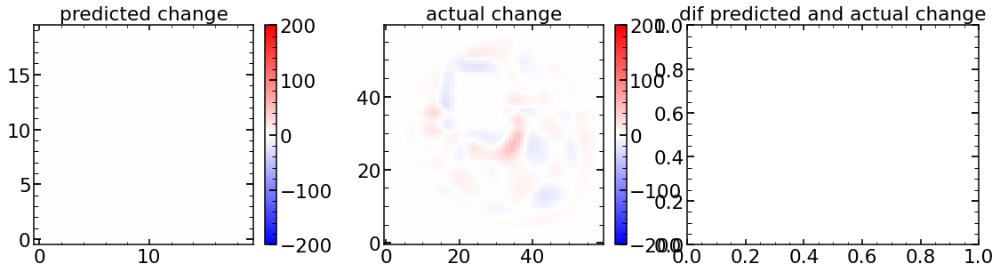

In [587]:
plt.figure(figsize=(20,10))
plt.subplot(231)
plt.title('predicted change')
plt.imshow(predicted_change_0,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(232)
plt.title('actual change')
plt.imshow(actual_change_0_flux,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)


plt.subplot(233)
plt.title('dif predicted and actual change')
plt.imshow(actual_change_0_flux-predicted_change_0,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(234)
plt.title('predicted change with larger lin. movement')
plt.imshow(predicted_change_07,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(235)
plt.title('dif predicted change')
plt.imshow(predicted_change_0-predicted_change_07,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(236)
plt.title('predicted change and actual change, via larger')
plt.imshow(actual_change_0_flux-predicted_change_07,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)



In [255]:
H7

array([[ -31.19720251,    7.62037263,   13.58014387, ...,  -20.51941677,
         206.6648878 ,  -51.46497898],
       [ -53.8074086 ,   12.7236135 ,  -12.06795735, ...,   44.37458219,
         -35.31440267,    8.5267914 ],
       [ -58.89224115,   13.84990413,  -10.16591023, ...,   32.87486754,
        -169.28514527,   42.12551684],
       ...,
       [  -6.45625696,   -1.65899008,    3.60325697, ...,    0.18047515,
           4.3415771 ,    1.05647195],
       [  -8.49613642,   -2.18894736,   -1.24046551, ...,    2.71321076,
          -3.25072858,   -0.85434616],
       [  -8.34518826,   -2.14947288,   -2.02018669, ...,    2.94235337,
           1.22175034,    0.26047139]])

In [256]:
H

array([[ -31.34460449,    7.86868282,   13.56384014, ...,  -20.58840716,
         206.81219451,  -51.34924312],
       [ -54.51660156,   13.73044549,  -12.0762655 , ...,   44.1504849 ,
         -35.40957141,    8.26003864],
       [ -59.765625  ,   15.0484891 ,  -10.27846801, ...,   32.71984671,
        -169.40459086,   42.00432766],
       ...,
       [  -6.45599365,   -1.61863807,    3.61054549, ...,    0.19177334,
           4.27356896,    1.0793011 ],
       [  -8.51287842,   -2.13367479,   -1.30256222, ...,    2.73217823,
          -3.27455284,   -0.81325935],
       [  -8.34960937,   -2.09511954,   -2.04634954, ...,    2.97682735,
           1.08623181,    0.28276892]])

In [250]:
np.array([ 0.01834716, -0.35195219, -0.00129159, -0.2283963 , -0.00630273,
        0.18039812, -0.00392163,  0.14614442,  0.02092984, -0.32378065,
       -0.00000985,  0.27104344,  0.00784988,  0.08901147,  0.00384423,
       -0.3337891 ,  0.00524147, -0.00799673,  0.00050313, -0.00987406,
        0.00036088,  0.01115559,  0.00685815, -0.01312976, -0.00342326,
       -0.04729906,  0.0013138 , -0.01949862,  0.00044663, -0.01176502,
        0.00368058, -0.01564265,  0.00050458,  0.0043486 , -0.00010885,
       -0.00154596, -0.00362701, -0.03030117, -0.00065242,  0.00353495,  0.00011591,  0.01114472,
       -0.00043675,  0.00031887, -0.0008632 ,  0.00132512, -0.00028498,
        0.00149008, -0.00002516,  0.00057003,  0.00006756, -0.00018861,
       -0.00004604, -0.00063481, -0.00083527,  0.00253817,  0.00130347,
       -0.00080245, -0.00208102, -0.00910728,  0.00135427,  0.01575946,
       -0.00084374,  0.0024199 , -0.00101303,  0.00048387,  0.00000417,
       -0.00066136,  0.00045206,  0.0029701 , -0.00059691,  0.00109795,
        0.00006879,  0.00211767,  0.00031519, -0.00135908,  0.00039164,
       -0.00177963, -0.00035086,  0.00282596, -0.00148929, -0.00145252,
        0.00162695,  0.01021817,  0.00029981,  0.00832025, -0.00011655,
        0.00572328, -0.00067255, -0.00194286, -0.00010312,  0.00091906,
       -0.00087403,  0.00077628,  0.00076979,  0.00330039,  0.00010394,
       -0.0007688 ,  0.00068158,  0.0028647 ,  0.00116214,  0.001124  ,
        0.00009011,  0.00376238,  0.00052455,  0.00183067])

array([ 0.01834716, -0.35195219, -0.00129159, -0.2283963 , -0.00630273,
        0.18039812, -0.00392163,  0.14614442,  0.02092984, -0.32378065,
       -0.00000985,  0.27104344,  0.00784988,  0.08901147,  0.00384423,
       -0.3337891 ,  0.00524147, -0.00799673,  0.00050313, -0.00987406,
        0.00036088,  0.01115559,  0.00685815, -0.01312976, -0.00342326,
       -0.04729906,  0.0013138 , -0.01949862,  0.00044663, -0.01176502,
        0.00368058, -0.01564265,  0.00050458,  0.0043486 , -0.00010885,
       -0.00154596, -0.00362701, -0.03030117, -0.00065242,  0.00353495,
        0.00011591,  0.01114472, -0.00043675,  0.00031887, -0.0008632 ,
        0.00132512, -0.00028498,  0.00149008, -0.00002516,  0.00057003,
        0.00006756, -0.00018861, -0.00004604, -0.00063481, -0.00083527,
        0.00253817,  0.00130347, -0.00080245, -0.00208102, -0.00910728,
        0.00135427,  0.01575946, -0.00084374,  0.0024199 , -0.00101303,
        0.00048387,  0.00000417, -0.00066136,  0.00045206,  0.00

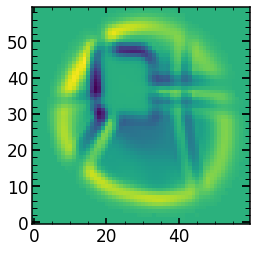

In [260]:
predicted_change_0_one_parameter=np.zeros((60,60))
predicted_change_0_one_parameter[list_of_flux_mask[0]]=H[:,1][:np.sum(list_of_flux_mask[0])]

predicted_change_0_one_parameter7=np.zeros((60,60))
predicted_change_0_one_parameter7[list_of_flux_mask[0]]=H7[:,1][:np.sum(list_of_flux_mask[0])]

plt.imshow(predicted_change_0_one_parameter)

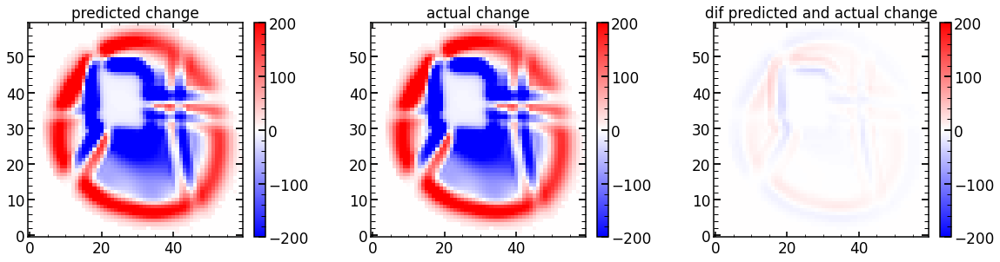

In [261]:
plt.figure(figsize=(20,10))
plt.subplot(231)
plt.title('predicted change')
plt.imshow(predicted_change_0_one_parameter,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(232)
plt.title('actual change')
plt.imshow(predicted_change_0_one_parameter7,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)


plt.subplot(233)
plt.title('dif predicted and actual change')
plt.imshow(predicted_change_0_one_parameter7-predicted_change_0_one_parameter,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

In [273]:
170*51/3600

2.408333333333333

In [588]:
uber_std_initial=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/uber_std_initial.npy')
uber_std=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/May2421/uber_std_initial.npy')
uber_std_modified=np.copy(uber_std)
uber_std_modified[:np.sum(list_of_flux_mask[0])]=uber_std_modified[:np.sum(list_of_flux_mask[0])]*100
uber_std_modified[np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]):]=uber_std_modified[np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]):]*100

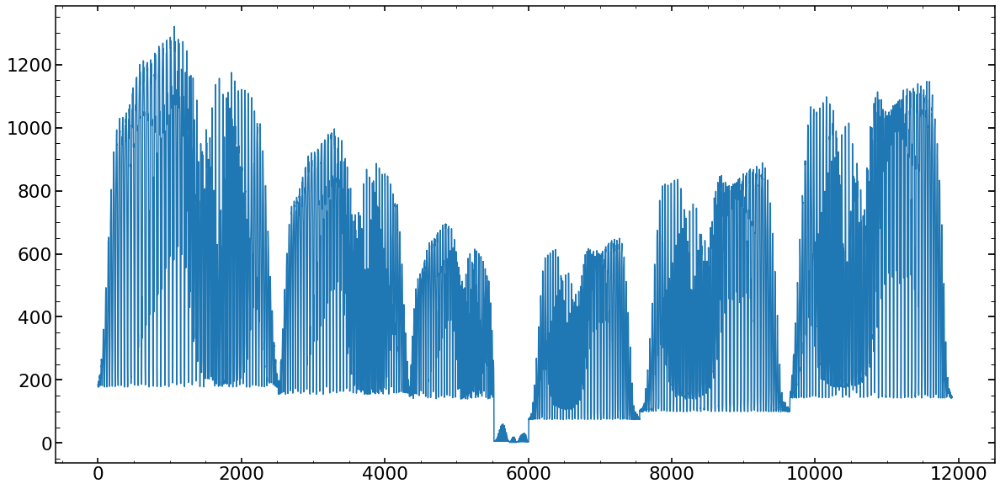

In [590]:
plt.figure(figsize=(20,10))
plt.plot(uber_std_initial)
#plt.plot(uber_std_modified)

In [591]:
H_std=H/uber_std_initial[:,None]

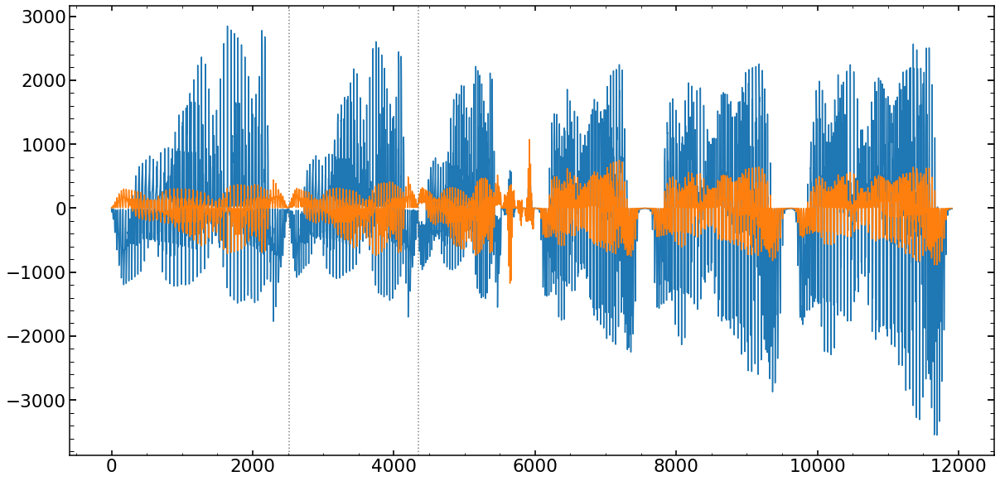

In [629]:
plt.figure(figsize=(20,10))
plt.plot(H[:,0])
plt.plot(H[:,1])
plt.axvline(np.sum(list_of_flux_mask[0]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]),color='gray',ls=':')

In [630]:
H[:,0]/H[:,1]

array([-3.95843495, -3.95996664, -3.95947897, ...,  4.01457214,
        4.00956951,  4.00870046])

In [631]:
H_std[:,0]/H_std[:,1]

array([-3.95843495, -3.95996664, -3.95947897, ...,  4.01457214,
        4.00956951,  4.00870046])

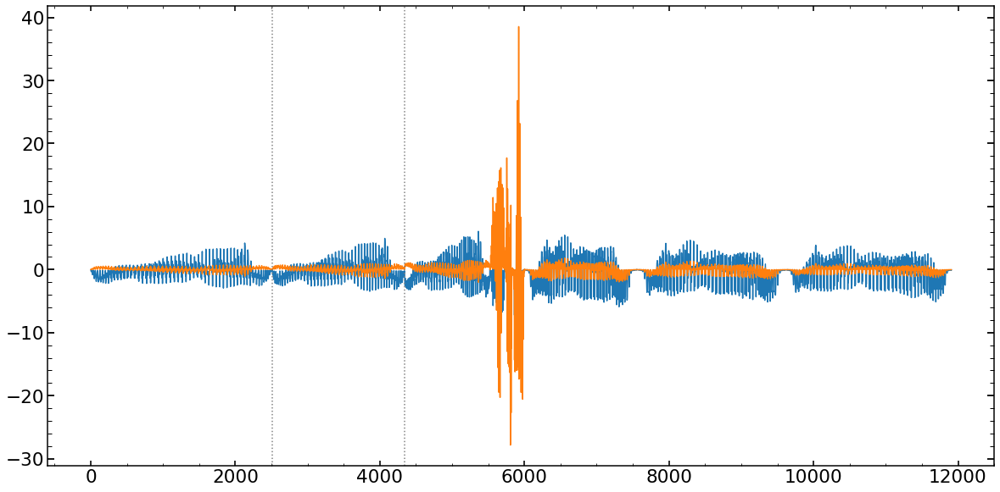

In [628]:
plt.figure(figsize=(20,10))
plt.plot(H_std[:,0])
plt.plot(H_std[:,1])
plt.axvline(np.sum(list_of_flux_mask[0]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]),color='gray',ls=':')


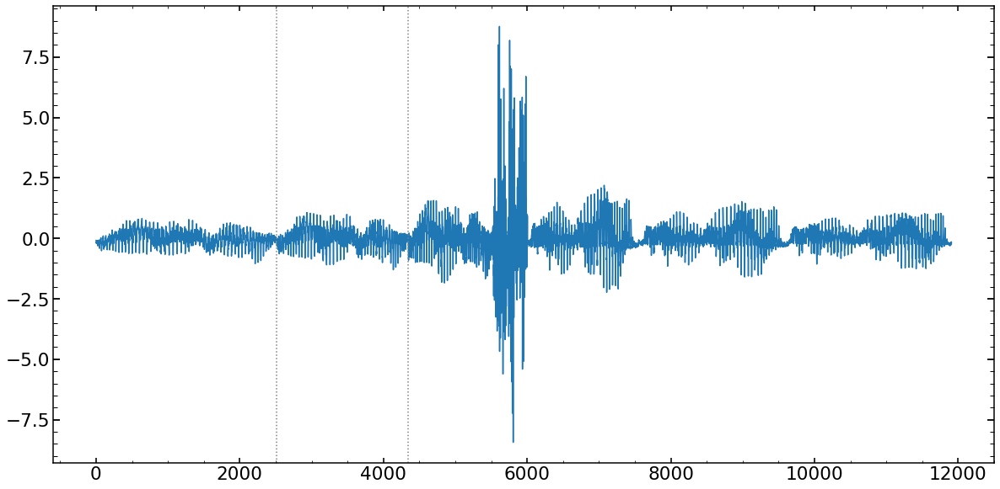

In [602]:
plt.figure(figsize=(20,10))
plt.plot((uber_I-uber_M0)/uber_std)
plt.axvline(np.sum(list_of_flux_mask[0]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]),color='gray',ls=':')

4633.426
4639.749662023837


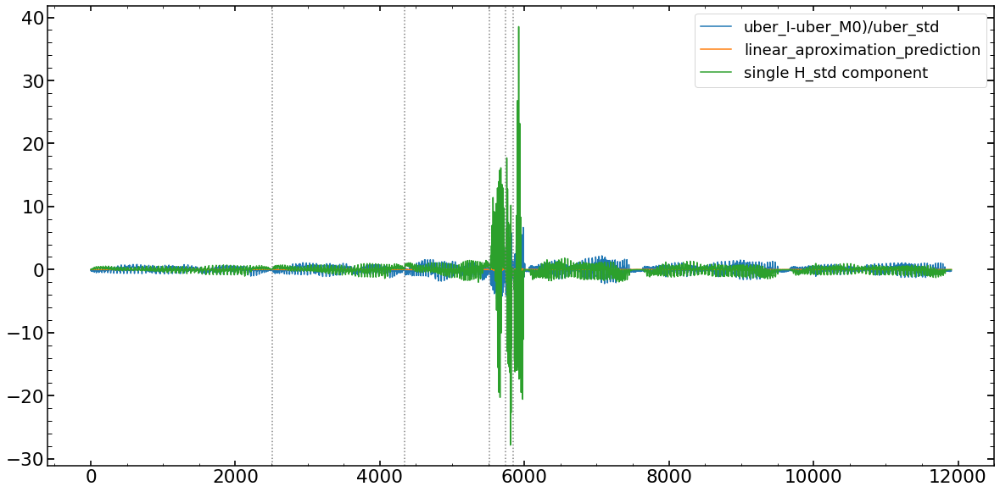

In [655]:

H_std=H/uber_std[:,None]

uber_M0_std=uber_M0/uber_std
uber_I_std=uber_I/uber_std

HHt_std=np.matmul(np.transpose(H_std),H_std) 
#print('svd thresh is '+str(thresh))
#invHHt=svd_invert(HHt,thresh)
#invHHt_std=svd_invert(HHt_std,thresh)
#invHHt=np.linalg.inv(HHt)        
invHHt_std=np.linalg.inv(HHt_std)

#invHHtHt=np.matmul(invHHt,np.transpose(H))
invHHtHt_std=np.matmul(invHHt_std,np.transpose(H_std))


# I is uber_I now (science images)
# M0 is uber_M0 now (set of models before the iteration)
#first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)
#first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,uber_I_std-uber_M0_std)
first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,(uber_I_std-uber_M0_std))  

linear_aproximation_prediction=np.dot(H_std,first_proposal_Tokovnin_std)
uber_M_final_std_linear_prediction=uber_M0_std+linear_aproximation_prediction

print(np.sum(np.abs(np.array(uber_I_std)-np.array(uber_M0_std))) )
print(np.sum(np.abs(np.array(uber_I_std)-np.array(uber_M_final_std_linear_prediction))) )

plt.figure(figsize=(20,10))
plt.plot((uber_I-uber_M0)/uber_std,label='uber_I-uber_M0)/uber_std')
plt.plot(linear_aproximation_prediction,label='linear_aproximation_prediction')

plt.plot(H_std[:,1],label='single H_std component')
plt.legend()
plt.axvline(np.sum(list_of_flux_mask[0]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3])+np.sum(list_of_flux_mask[4]),color='gray',ls=':')

In [675]:
np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])

5521

In [665]:
np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3])+np.sum(list_of_flux_mask[4])+\
np.sum(list_of_flux_mask[5])

6005

In [724]:
first_proposal_Tokovnin_std

array([ 0.03323074, -0.19345526, -0.11343424,  0.29096705, -0.04526343,
        0.06604072,  0.00699175,  0.20914001, -0.00107234, -0.27139413,
        0.01797595,  0.14757343,  0.03413517,  0.20486571, -0.04284734,
       -0.38466828,  0.0193225 ,  0.06101262,  0.03423144,  0.35090122,
        0.01866549,  0.11296563, -0.00377168, -0.05978713, -0.00498646,
       -0.20061941,  0.00438837,  0.21276712,  0.00425162,  0.05882843,
       -0.00124358,  0.02340973, -0.00036587,  0.05627657, -0.00209019,
        0.03401556, -0.00901424, -0.04979558, -0.00939191,  0.00580303,
       -0.00326762,  0.00947366,  0.00612482, -0.00141429, -0.00675365,
       -0.04011368,  0.00073107,  0.01490447,  0.00295059,  0.00307666,
       -0.00154542,  0.00058099,  0.000672  , -0.0281767 , -0.00143579,
        0.02651061, -0.00387862,  0.03708302, -0.01369103, -0.04287292,
        0.01105822,  0.041486  , -0.00197565, -0.05030727, -0.00986614,
       -0.07552995,  0.00483317,  0.04542235,  0.00089487, -0.00

3827.706
2621.795772049775


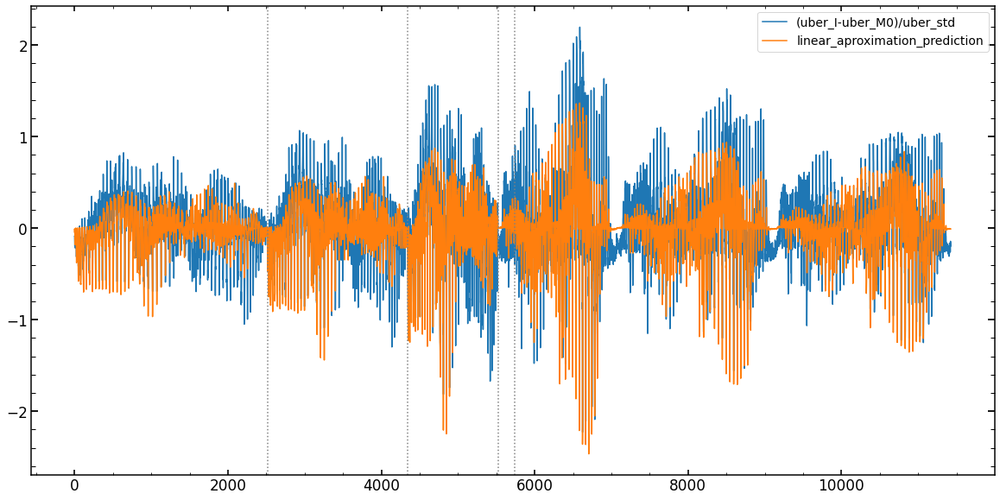

In [722]:
indices = list(range(5521))+list(range(6005,11908))


H_std=(H/uber_std[:,None])[indices]

uber_M0_std=(uber_M0/uber_std)[indices]
uber_I_std=(uber_I/uber_std)[indices]

HHt_std=np.matmul(np.transpose(H_std),H_std) 
#print('svd thresh is '+str(thresh))
#invHHt=svd_invert(HHt,thresh)
#invHHt_std=svd_invert(HHt_std,thresh)
#invHHt=np.linalg.inv(HHt)        
invHHt_std=np.linalg.inv(HHt_std)

#invHHtHt=np.matmul(invHHt,np.transpose(H))
invHHtHt_std=np.matmul(invHHt_std,np.transpose(H_std))


# I is uber_I now (science images)
# M0 is uber_M0 now (set of models before the iteration)
#first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)
#first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,uber_I_std-uber_M0_std)
first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,(uber_I_std-uber_M0_std))  

linear_aproximation_prediction=np.dot(H_std,first_proposal_Tokovnin_std)
uber_M_final_std_linear_prediction=uber_M0_std+linear_aproximation_prediction

print(np.sum(np.abs(np.array(uber_I_std)-np.array(uber_M0_std))) )
print(np.sum(np.abs(np.array(uber_I_std)-np.array(uber_M_final_std_linear_prediction))) )

plt.figure(figsize=(20,10))
plt.plot((uber_I_std-uber_M0_std),label='(uber_I-uber_M0)/uber_std')
#plt.plot((uber_I_std-uber_M_final_std_linear_prediction),label='(uber_I-uber_M0_prediction)/uber_std')
plt.plot(linear_aproximation_prediction,label='linear_aproximation_prediction')

#plt.plot(H_std[:,1],label='single H_std component')
plt.legend()
plt.axvline(np.sum(list_of_flux_mask[0]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3]),color='gray',ls=':')


In [723]:
np.zeros(60,60)
uber_M_final_std_linear_prediction[:np.sum(list_of_flux_mask[0])]

TypeError: data type not understood

In [727]:
allparameters_parametrization_proposal_initial+first_proposal_Tokovnin

ValueError: operands could not be broadcast together with shapes (129,) (106,) 

In [728]:
allparameters_parametrization_proposal_initial_plus_Tokovinin=np.copy(allparameters_parametrization_proposal_initial)
allparameters_parametrization_proposal_initial_plus_Tokovinin[:38]=allparameters_parametrization_proposal_initial_plus_Tokovinin[:38]+first_proposal_Tokovnin[:38]
allparameters_parametrization_proposal_initial_plus_Tokovinin[38+23:]=allparameters_parametrization_proposal_initial_plus_Tokovinin[38+23:]+first_proposal_Tokovnin[38:]

In [687]:
#predicted_change_dedicated=np.dot(H,first_proposal_Tokovninin)
model_final_linear=np.zeros((60,60))
model_final_linear[list_of_flux_mask[0]]=uber_M_final_std_linear_prediction[:np.sum(list_of_flux_mask[0])]

model_final=np.zeros((60,60))
model_final[list_of_flux_mask[0]]=uber_M0_std[:np.sum(list_of_flux_mask[0])]


image_0=np.zeros((60,60))
image_0[list_of_flux_mask[0]]=uber_I_std[:np.sum(list_of_flux_mask[0])]


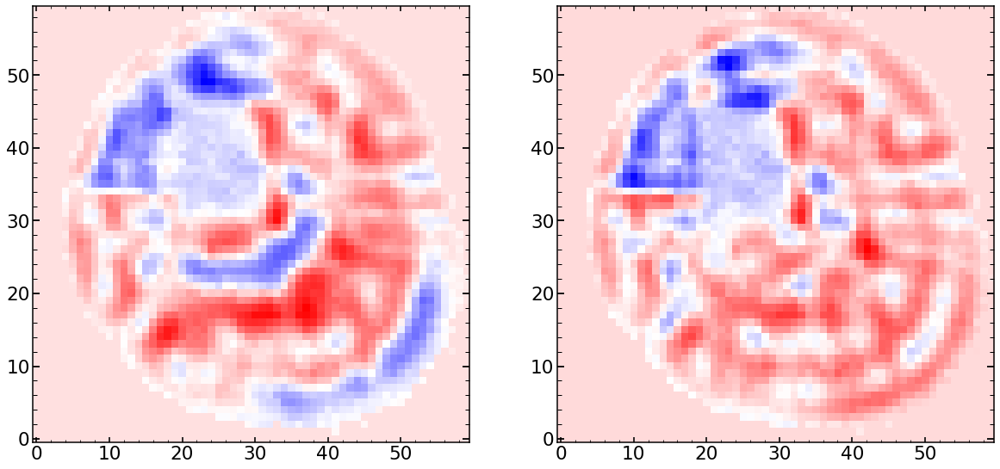

In [691]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(image_0-model_final,cmap='bwr')

plt.subplot(122)
plt.imshow(image_0-model_final_linear,cmap='bwr')

In [657]:
np.sum(uber_I_std[:np.sum(list_of_flux_mask[0])])

3897.8523

In [660]:
np.sum(uber_I_std[5736:5840])

3419.8726

In [662]:
np.sum(uber_I_std[5840:6005])

3453.7544

In [658]:
np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3])

5736

In [659]:
np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3])+np.sum(list_of_flux_mask[4])

5840

In [661]:
np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])+np.sum(list_of_flux_mask[2])+np.sum(list_of_flux_mask[3])+np.sum(list_of_flux_mask[4])+np.sum(list_of_flux_mask[5])

6005

2179933.5
1327619.5960117653


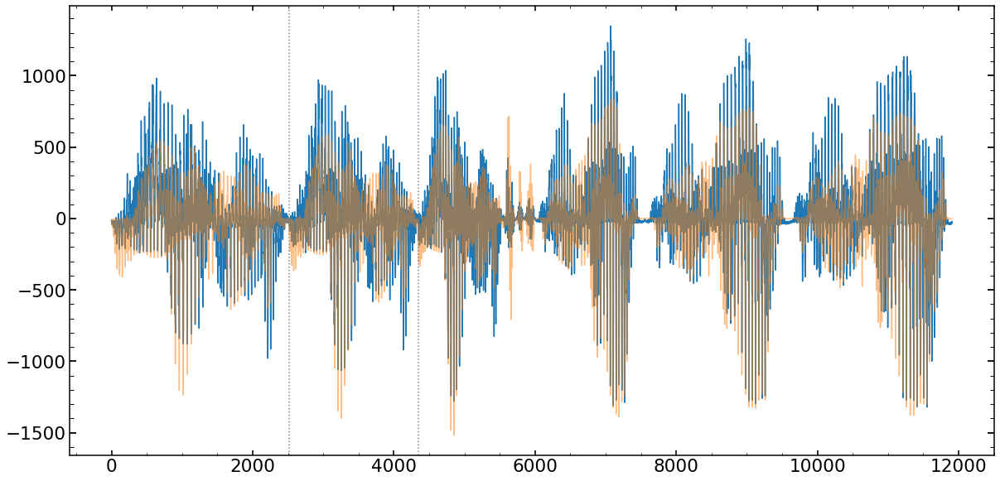

In [642]:
H_std=H

HHt=np.matmul(np.transpose(H),H) 
#print('svd thresh is '+str(thresh))
#invHHt=svd_invert(HHt,thresh)
#invHHt_std=svd_invert(HHt_std,thresh)
#invHHt=np.linalg.inv(HHt)        
invHHt=np.linalg.inv(HHt)

#invHHtHt=np.matmul(invHHt,np.transpose(H))
invHHtHt=np.matmul(invHHt,np.transpose(H))


# I is uber_I now (science images)
# M0 is uber_M0 now (set of models before the iteration)
#first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)
#first_proposal_Tokovnin_std=np.matmul(invHHtHt_std,uber_I_std-uber_M0_std)
first_proposal_Tokovnin=np.matmul(invHHtHt,(uber_I-uber_M0))

linear_aproximation_prediction=np.dot(H,first_proposal_Tokovnin)

uber_M_final_linear_prediction=uber_M0+linear_aproximation_prediction

print(np.sum(np.abs(np.array(uber_I)-np.array(uber_M0))) )
print(np.sum(np.abs(np.array(uber_I)-np.array(uber_M_final_linear_prediction))) )


plt.figure(figsize=(20,10))
plt.plot((uber_I-uber_M0))
plt.plot(linear_aproximation_prediction,alpha=0.5)
plt.axvline(np.sum(list_of_flux_mask[0]),color='gray',ls=':')
plt.axvline(np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]),color='gray',ls=':')

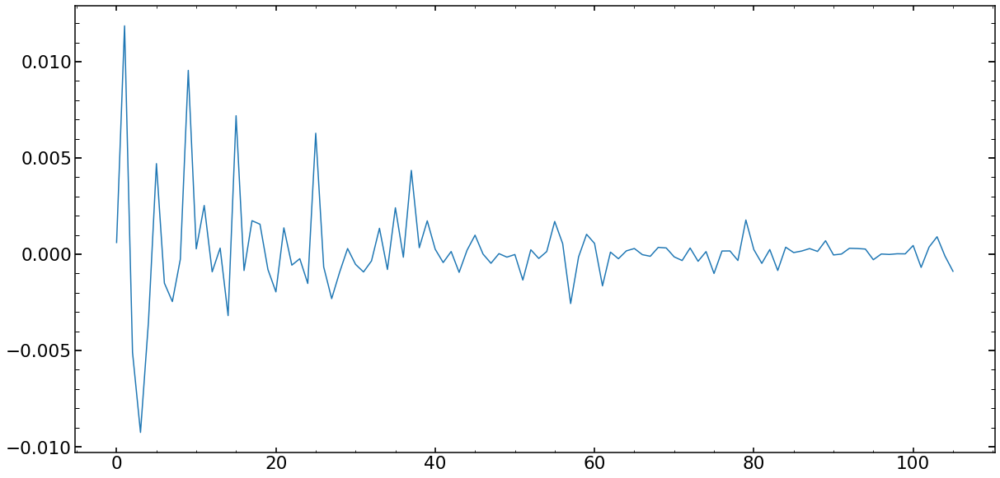

In [595]:
plt.figure(figsize=(20,10))

plt.plot(first_proposal_Tokovnin_std)

In [424]:
                array_of_delta_all_parametrizations=np.concatenate((first_proposal_Tokovnin_std_modified[0:19*2],\
                                                                    np.zeros(23), first_proposal_Tokovnin_std_modified[19*2:]))

In [404]:
allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations

array([   -8.0229094 ,     0.18260902,     0.50093048,    -1.05247171,
           0.2167879 ,    -0.87858311,    -0.00497275,    -0.41466257,
          -0.06643846,     0.65342472,     0.02416696,    -0.69853237,
          -0.00792401,    -0.80784038,    -0.07343354,     0.68253638,
          -0.00221333,     0.08411554,    -0.00336734,     0.20215402,
           0.0336808 ,    -0.03709155,     0.01237506,    -0.01081179,
           0.00064345,     0.03597793,    -0.01552995,     0.06077596,
           0.00238091,     0.06247634,     0.00308296,    -0.0139846 ,
           0.00615431,    -0.033393  ,     0.0135667 ,     0.04164948,
          -0.02894994,     0.00722955,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 44228.80941593,
      

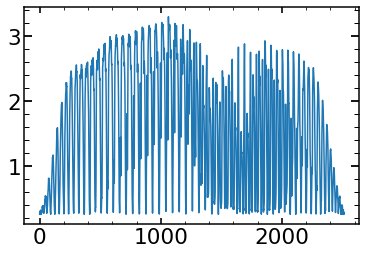

In [596]:
plt.plot(uber_I[:np.sum(list_of_flux_mask[0])]/uber_std[:np.sum(list_of_flux_mask[0])])

In [442]:
np.sum(uber_I[:np.sum(list_of_flux_mask[0])]/uber_std[:np.sum(list_of_flux_mask[0])])

208733.83

In [ ]:
np.sum(uber_I[:np.sum(list_of_flux_mask[0])]/uber_std[:np.sum(list_of_flux_mask[0])])

In [443]:
np.sum(uber_I[np.sum(list_of_flux_mask[0]):np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])]/uber_std[np.sum(list_of_flux_mask[0]):np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1])])

3419.8726

In [444]:
208733/3419

61.05089207370576

In [445]:
np.sum(uber_I[np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]):]/uber_std[np.sum(list_of_flux_mask[0])+np.sum(list_of_flux_mask[1]):])

185684.77

In [446]:
np.sum(uber_std[:np.sum(list_of_flux_mask[0])])

30326.908

In [462]:
len(list_of_flux_mask)

3

In [465]:
list_of_std_image=[]
for i in range(len(list_of_sci_images)):

    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]
    sci_image_std=sci_image_std=sci_image/np.sqrt(var_image)
    flux_mask=list_of_flux_mask[i]
    std_image=np.sqrt(list_of_var_images[i][flux_mask]).ravel()
    
    list_of_std_image.append(std_image)

In [463]:
multi_background_factor=3
            

# import science images and determine the flux mask      
list_of_mean_value_of_background=[]
list_of_flux_mask=[]
list_of_sci_image_std=[]
for i in range(len(list_of_sci_images)):
    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]

    # do not use this for images in focus or near focus
    # probably needs to be done better than via shape measurment
    #
    if sci_image.shape[0]==20:
        multi_background_factor=3


    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])


    list_of_mean_value_of_background.append(mean_value_of_background)
    flux_mask=sci_image>(mean_value_of_background)


    # normalized science image
    var_image=list_of_var_images[i]
    sci_image_std=sci_image/np.sqrt(var_image)
    list_of_sci_image_std.append(sci_image_std)
    list_of_flux_mask.append(flux_mask)

In [473]:
array_of_sci_image_std=np.array(list_of_sci_image_std)

In [485]:
list_of_std_sum=[]
for i in range(len(list_of_var_images)):
    list_of_std_sum.append(np.sum(np.sqrt(list_of_var_images[i])))
    
array_of_std_sum=np.array(list_of_std_sum)
array_of_std_sum=array_of_std_sum/np.min(array_of_std_sum)
array_of_std_sum

array([29.324217 , 22.048635 , 15.684809 ,  1.5292561,  1.       ,
        1.2685509, 16.053991 , 22.207663 , 27.110678 ], dtype=float32)

In [475]:
array_of_sci_image_std_sum=array_of_sci_image_std*array_of_std_sum

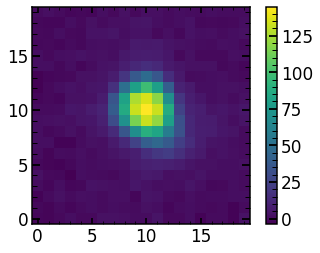

In [483]:
plt.imshow(array_of_sci_image_std_sum[4])
plt.colorbar()

In [484]:
uber_std=[item for sublist in list_of_std_image for item in sublist]

In [ ]:
        array_of_sci_image_std=np.array(list_of_sci_image_std)
        list_of_std_sum=[]
        for i in range(len(list_of_sci_image_std)):
            list_of_std_sum.append(np.sum(list_of_std_image[i]))
            
        array_of_std_sum=np.array(list_of_std_sum)
        array_of_std_sum=array_of_std_sum/np.min(array_of_std_sum)
        
        list_of_std_image_renormalized=[]
        for i in range(len(list_of_std_image)):
            list_of_std_image_renormalized.append(list_of_std_image[i]*array_of_std_sum[i])
    
        # join all I,I_std from all individual images into one uber I,I_std  
        uber_std=[item for sublist in list_of_std_image_renormalized for item in sublist]

In [ ]:
uber_M_final_std_linear_prediction

In [812]:
for i in range(9):
    mask_image=list_of_mask_images[i]
    var_image=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    # array that has True for values which are good and False for bad values
    inverted_mask=~mask_image.astype(bool)

    try:
        if sci_image.shape[0]==20:
            multi_background_factor=3


        mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                              np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor

        mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                              np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor

        mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])
    except:
        pass

    # select only images with above 80% percentile of the image with max variance?         
    var_image_masked=var_image*inverted_mask
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>mean_value_of_background]

    var_sum=-(1)*(np.sum(np.sqrt(np.abs(var_image_masked_without_nan))))
    print(var_sum)
    var_sum=-(1)*(np.mean(np.sqrt(np.abs(var_image_masked_without_nan))))
    print(var_sum)

-26681.35546875
-15.557641983032227
-19805.6953125
-16.154727935791016
-12668.740234375
-17.522462844848633
-1061.941650390625
-10.310112953186035
-418.4144287109375
-9.29809856414795
-774.05322265625
-9.556212425231934
-14357.935546875
-13.980463027954102
-19476.607421875
-14.032137870788574
-24848.328125
-15.452939987182617


# Flux 

In [975]:
from astropy.io import fits

In [979]:
data=fits.open('/Volumes/Saturn_USA/PFS/ReducedData/May_2021/2021-05-13/v051437/calExp-SA051437r1.fits')
data=data[1].data

Text(0, 0.5, 'flux')

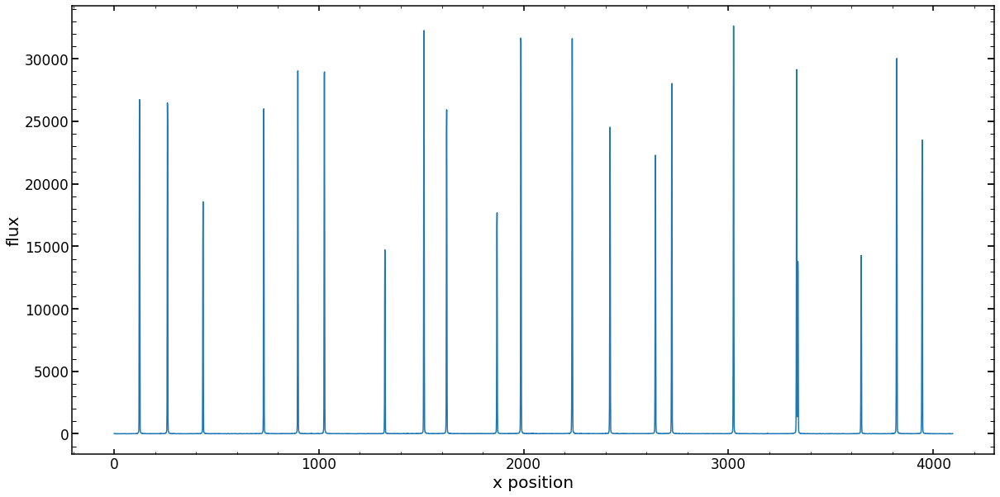

In [984]:
plt.figure(figsize=(20,10))
plt.plot(data[2000])
plt.xlabel('x position')
plt.ylabel('flux')

# Test where Zernike is set at the best value for all particles 

In [ ]:
# May 26 run?

In [1014]:
list_of_dates=['2021-05-13','2021-05-13','2021-05-13','2021-05-14','2021-05-14','2021-05-14',\
               '2021-05-14','2021-05-14','2021-05-14','2021-05-15','2021-05-15','2021-05-15']

exp_id=['51437','51438','51439','51689','51690','51691','51737','51738','51739','51989','51990','51991']

In [1015]:
list_of_data_cuts=[]
for i in tqdm(range(12)):
    data=fits.open('/Volumes/Saturn_USA/PFS/ReducedData/May_2021/'+list_of_dates[i]+'/v0'+exp_id[i]+'/calExp-SA0'+exp_id[i]+'r1.fits')
    data=data[1].data
    list_of_data_cuts.append(data[2000])

In [1020]:
x_position=np.arange(len(list_of_data_cuts[0]))

Text(3375, 2000, 'orange')

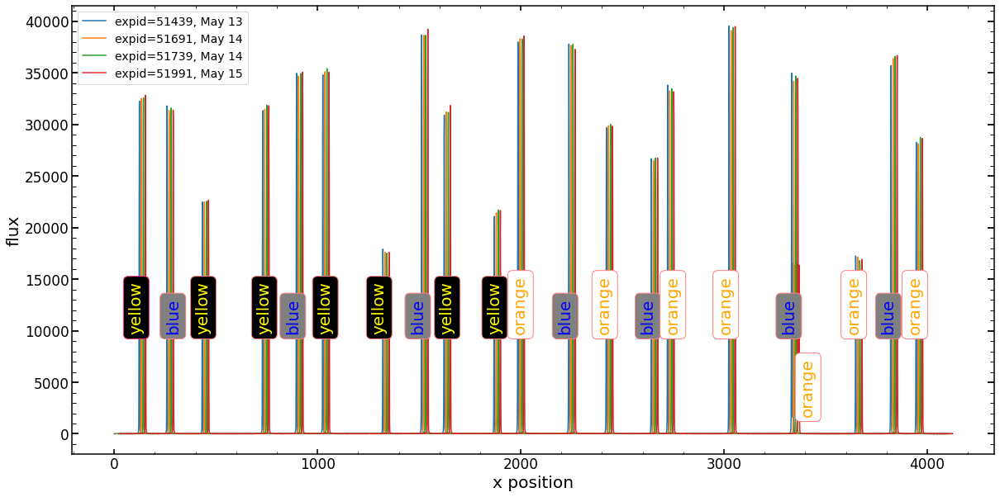

In [1071]:
plt.figure(figsize=(20,10))
plt.plot(x_position,list_of_data_cuts[2],label='expid=51439, May 13')
plt.plot(x_position+10,list_of_data_cuts[5],label='expid=51691, May 14')
plt.plot(x_position+20,list_of_data_cuts[8],label='expid=51739, May 14')
plt.plot(x_position+30,list_of_data_cuts[11],label='expid=51991, May 15')
plt.xlabel('x position')
plt.ylabel('flux')
plt.legend()
plt.text(70,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.2, 0.5),
                   fc=(0., 0, 0),
                   ))
plt.text(250,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))
plt.text(400,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0., 0, 0),
                   ))
plt.text(700,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0., 0, 0),
                   ))
plt.text(1000,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0., 0, 0),
                   ))
plt.text(1265,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0., 0, 0),
                   ))
plt.text(1600,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0., 0, 0),
                   ))
plt.text(1833,10000,'yellow',fontsize=20,rotation=90,color='yellow', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0., 0, 0),
                   ))


plt.text(840,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))

plt.text(1455,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))

plt.text(2180,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))

plt.text(2587,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))

plt.text(3280,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))


plt.text(3770,10000,'blue',fontsize=20,rotation=90,color='blue', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(0.5, 0.5, 0.5),
                   ))

plt.text(3900,10000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

plt.text(3600,10000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

plt.text(2970,10000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

plt.text(2710,10000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

plt.text(2375,10000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

plt.text(1960,10000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

plt.text(3375,2000,'orange',fontsize=20,rotation=90,color='orange', bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1, 1, 1),
                   ))

# Wavelength test 

In [45]:
index_of_single_image=4

model = LN_PFS_single(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],\
                      mask_image=list_of_mask_images[index_of_single_image],\
                      wavelength=None,dithering=1,save=1,zmax=22,verbosity=1,\
                      pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,use_wf_grid=None,
                      extraZernike=None,pupilExplicit=None,simulation_00=None,
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                      test_run=None,explicit_psf_position=None)  

res_with_Image_wv_None=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45i
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.56857894    -1.33534741    -0.61077412    -0.62100744
     0.81167376    -0.55953774    -0.75441241     0.80632108
     0.10032628     0.22539123     0.06288249    -0.086148
     0.13062653     0.10589572     0.03621032    -0.11421264
    -0.0179421      0.07790299     0.10955661     0.70388328
     0.0985159     -0.19972314     0.25807838     0.06128163
     0.09625696     0.15896682     0.28367606     0.24643717
     1.57474396    -0.03

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.83007509 -4.94416826] / 3.85854
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.84376515 -4.94046113] / 3.8560522
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.84847684 -4.90980771] / 3.8561664
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.85013247 -4.92037596] / 3.8550622
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.86617837 -4.90134212] / 3.8574183
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.84936846 -4.93068138] / 3.8550103
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.85904704 -4.93173271] / 3.8550527
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.8568184  -4.92889352] / 3.8548596
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.86726099 -4.91963943] / 3.855566
chi2 within shgo optimization routine (chi_2_almost_multi_

In [46]:
index_of_single_image=4

model = LN_PFS_single(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],\
                      mask_image=list_of_mask_images[index_of_single_image],\
                      wavelength=900,dithering=1,save=1,zmax=22,verbosity=1,\
                      pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,use_wf_grid=None,
                      extraZernike=None,pupilExplicit=None,simulation_00=None,
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                      test_run=None,explicit_psf_position=None)  

res_with_Image_wv_900=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45i
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.56857894    -1.33534741    -0.61077412    -0.62100744
     0.81167376    -0.55953774    -0.75441241     0.80632108
     0.10032628     0.22539123     0.06288249    -0.086148
     0.13062653     0.10589572     0.03621032    -0.11421264
    -0.0179421      0.07790299     0.10955661     0.70388328
     0.0985159     -0.19972314     0.25807838     0.06128163
     0.09625696     0.15896682     0.28367606     0.24643717
     1.57474396    -0.03

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9974821125492828
Finished with lnlike_Neven
chi_2_almost/d.o.f is 17.611763; chi_2_almost_max_dof is 2514.4185 log(improvment) is -2.1546347
The likelihood reported is: -1631.35009765625
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4442523072
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4442523072 is: 10.263665199279785 seconds
 


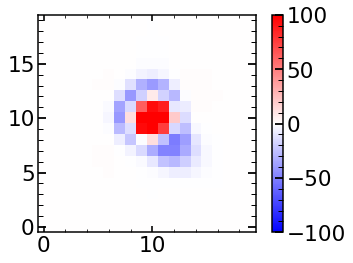

In [50]:
# longer vw is more spread out
plt.imshow(res_with_Image_wv_None[1]-res_with_Image_wv_900[1],cmap='bwr',vmin=-100,vmax=100)
plt.colorbar()

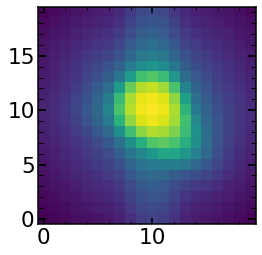

In [41]:
plt.imshow(res_with_Image[1],norm=LogNorm())

In [61]:
index_of_single_image=4

model = LN_PFS_single(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],\
                      mask_image=list_of_mask_images[index_of_single_image],\
                      wavelength=900,dithering=1,save=1,zmax=22,verbosity=1,\
                      pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,use_wf_grid=None,
                      extraZernike=None,pupilExplicit=None,simulation_00=None,
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                      test_run=None,explicit_psf_position=None)  

res_with_Image_wv_900_oversample_10=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45i
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.56857894    -1.33534741    -0.61077412    -0.62100744
     0.81167376    -0.55953774    -0.75441241     0.80632108
     0.10032628     0.22539123     0.06288249    -0.086148
     0.13062653     0.10589572     0.03621032    -0.11421264
    -0.0179421      0.07790299     0.10955661     0.70388328
     0.0985159     -0.19972314     0.25807838     0.06128163
     0.09625696     0.15896682     0.28367606     0.24643717
     1.57474396    -0.03

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 1.0080038433161822
Finished with lnlike_Neven
chi_2_almost/d.o.f is 22.604588; chi_2_almost_max_dof is 2514.4185 log(improvment) is -2.046241
The likelihood reported is: -1893.473388671875
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4442523072
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4442523072 is: 5.436402797698975 seconds
 


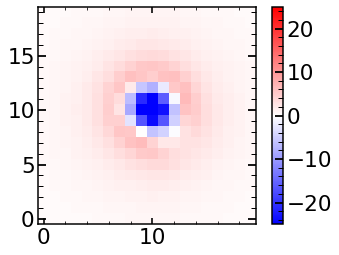

In [62]:
# longer vw is more spread out
plt.imshow((res_with_Image_wv_900_oversample_10[1]-res_with_Image_wv_900[1]),cmap='bwr',vmin=-25,vmax=25)
plt.colorbar()

In [63]:
index_of_single_image=4

model = LN_PFS_single(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],\
                      mask_image=list_of_mask_images[index_of_single_image],\
                      wavelength=900,dithering=1,save=1,zmax=22,verbosity=1,\
                      pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,use_wf_grid=None,
                      extraZernike=None,pupilExplicit=None,simulation_00=None,
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                      test_run=None,explicit_psf_position=None)  

res_with_Image_wv_900_oversample_10_order5=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45i
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.56857894    -1.33534741    -0.61077412    -0.62100744
     0.81167376    -0.55953774    -0.75441241     0.80632108
     0.10032628     0.22539123     0.06288249    -0.086148
     0.13062653     0.10589572     0.03621032    -0.11421264
    -0.0179421      0.07790299     0.10955661     0.70388328
     0.0985159     -0.19972314     0.25807838     0.06128163
     0.09625696     0.15896682     0.28367606     0.24643717
     1.57474396    -0.03

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.56865277 -5.63744124] / 8.292404
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.56758555 -5.63987237] / 8.292412
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.5687971 -5.6378609] / 8.292401
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.56931614 -5.6356806 ] / 8.292423
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.56842933 -5.63863631] / 8.292403
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.56857366 -5.63905596] / 8.292403
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.56859343 -5.63865228] / 8.2924
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.5689612  -5.63787688] / 8.292403
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.5685623  -5.63844645] / 8.292402
chi2 within shgo optimization routine (chi_2_almost_multi_values): [

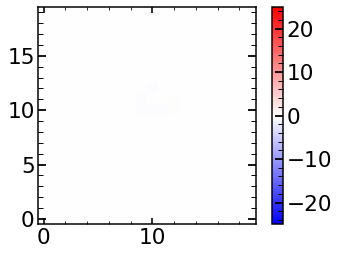

In [64]:
# longer vw is more spread out
plt.imshow((res_with_Image_wv_900_oversample_10[1]-res_with_Image_wv_900_oversample_10_order5[1]),cmap='bwr',vmin=-25,vmax=25)
plt.colorbar()

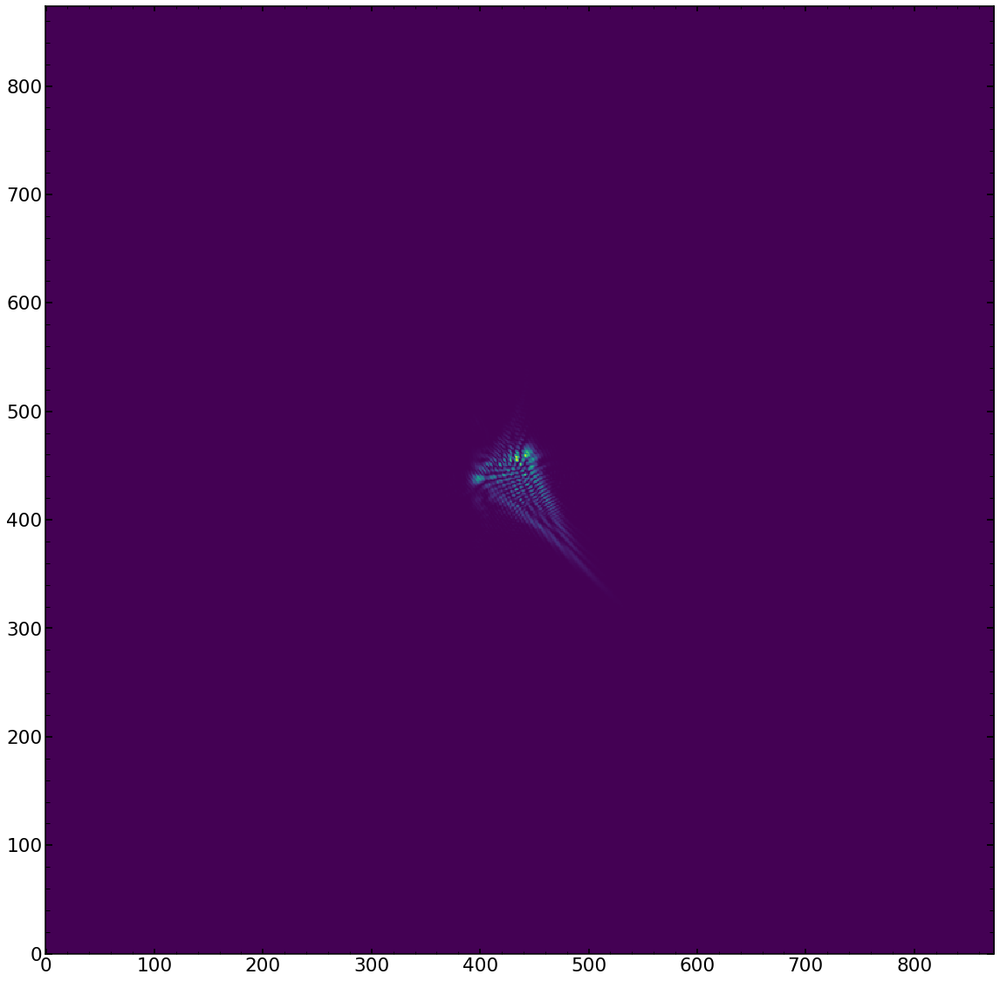

In [71]:
optPsf_cut=np.load('/Users/nevencaplar/Documents/PFS/Testing/Final_Images/optPsf_cut.npy')
optPsf_cut_downsampled=np.load('/Users/nevencaplar/Documents/PFS/Testing/Final_Images/optPsf_cut_downsampled.npy')
plt.figure(figsize=(20,20))
plt.imshow(optPsf_cut)

In [74]:
optPsf_cut_resize_example_1=skimage.transform.resize(optPsf_cut,(281,281),mode='constant',order=1)
optPsf_cut_resize_example_5=skimage.transform.resize(optPsf_cut,(281,281),mode='constant',order=5)      

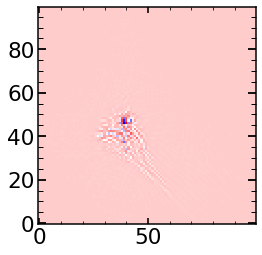

In [78]:
plt.imshow(optPsf_cut_resize_example_1[100:200,100:200]-optPsf_cut_resize_example_5[100:200,100:200],cmap='bwr')

In [98]:
float(finalArc.iloc[22]['wavelength'])

922.7301

In [101]:
np.zeros((38,))

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0.])

In [ ]:
"""
def __init__(self,image=None,image_var=None,image_mask=None,pixelScale=None,wavelength=None,
             diam_sic=None,npix=None,pupilExplicit=None,
             wf_full_Image=None,radiometricEffectArray_Image=None,
             ilum_Image=None,dithering=None,save=None,
             pupil_parameters=None,use_pupil_parameters=None,
             use_optPSF=None,use_wf_grid=None,
             zmaxInit=None,extraZernike=None,simulation_00=None,verbosity=None,
             double_sources=None,double_sources_positions_ratios=None,
             test_run=None,explicit_psf_position=None,*args):
"""

# Pixel by pixel again, May 28 run 

In [210]:
sci_image_unit=list_of_sci_images[0]
var_image_unit=list_of_var_images[0]

In [211]:
index_of_single_image=0
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],
                      wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,return_intermediate_images=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   27.82888138    -2.76073621    -1.03869291    -0.75787603
     1.33773784    -0.68061175    -0.6836074      1.09462086
     0.06777326     0.06593109    -0.13881094    -0.14307069
     0.14817439     0.2120132      0.026021      -0.09667419
     0.01505518     0.04865938     0.20137833     0.69991908
     0.11069462    -0.23095152     0.2634755      0.05955178
     0.09111398     0.16964857     0.23727531     0.48081831
     2.26598792    -0.07

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.83330908 -10.82662267] / 149.04482
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.6620637  -10.74841837] / 148.97363
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.53685203 -10.82121231] / 149.07495
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.72052651 -10.75887021] / 148.97072
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.72605055 -10.69640514] / 148.97919
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.70867283 -10.72502471] / 148.97055
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.76713563 -10.73547655] / 148.98354
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.68833168 -10.74518292] / 148.96938
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.676478   -10.71133742] / 148.97446
chi2 within shgo optimization routine

We are fitting for only one source
One source fitting result is [-18.69815339 -10.74644697]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.9389901161193848
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9821069837335319
Finished with lnlike_Neven
chi_2_almost/d.o.f is 203.43988; chi_2_almost_max_dof is 9350.616 log(improvment) is -1.6624042
The likelihood reported is: -265907.625
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4456510912
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4456510912 is: 8.

In [212]:
explicit_position_of_default=res_with_Image[-1]
explicit_position_of_default

array([-18.69815339, -10.74644697])

In [213]:
initial_model=res_with_Image[1]

explicit_position_of_default=res_with_Image[-1]

# cut the values below the treshold to consider only pixels with a lot of flux to get the flux mask
mean_value_of_background=np.mean([np.median(sci_image_unit[0]),np.median(sci_image_unit[-1]),\
                                  np.median(sci_image_unit[:,0]),np.median(sci_image_unit[:,-1])])*50


flux_mask=sci_image_unit>(mean_value_of_background)

# original wavefront
wf_grid=res_with_Image[4]
wf_grid_0_central=wf_grid[768*1:768*3,768*1:768*3]

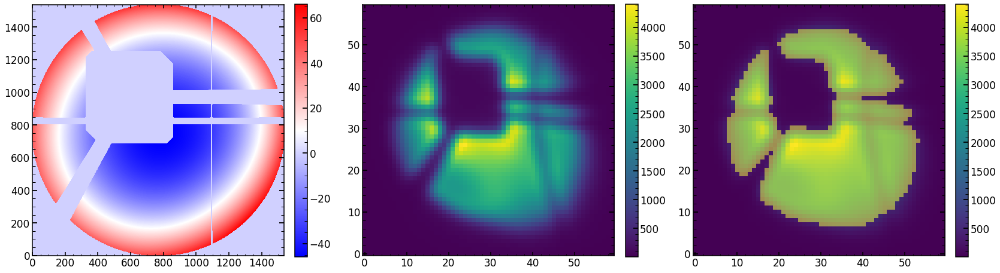

In [214]:
plt.figure(figsize=(28,10))

plt.subplot(131)
plt.imshow(wf_grid[768:768*3,768:768*3],cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(res_with_Image[1])
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(res_with_Image[1])
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(flux_mask,alpha=0.5)


In [75]:
list_of_wf_grid_1=[]
list_of_wf_15_15_grid=[]
list_of_wf_15_15_grid_dif=[]

wf_grid_1=np.copy(wf_grid)
wf_grid_0_central=wf_grid[768*1:768*3,768*1:768*3]

# list with full puppils
# list with only the parts which are new
# list with only the differences

offset=int((1536-30*50)/2)

for i in tqdm(range(30)):
    for j in range(30):
        wf_grid_1=np.copy(wf_grid)
        

        wf_1_15_15=wf_grid_0_central[(offset+i*50):(offset+(i+1)*50),(offset+j*50):(offset+(j+1)*50)]+0.1
        wf_1_15_15[wf_1_15_15==0.1]=0
        if np.sum(np.abs(wf_1_15_15))>50*50*0.5:
            wf_grid_1[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768+(offset+(j+1)*50)]=wf_1_15_15
        
        
        #list_of_wf_grid_1.append([i,j,wf_grid_1])
        #list_of_wf_15_15_grid.append([i,j,wf_1_15_15])
            list_of_wf_15_15_grid_dif.append([i,j,wf_1_15_15])
        else:
            pass
        
#rray_of_wf_grid_1=np.array(list_of_wf_grid_1)
#array_of_wf_15_15_grid=np.array(list_of_wf_15_15_grid)
array_of_wf_15_15_grid_dif_1=np.array(list_of_wf_15_15_grid_dif)


100%|████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:10<00:00,  2.87it/s]


In [77]:
# kinda like a hash value, to eliminate the ones where nothing changes
mean_value_of_wf=[]
for i in tqdm(range(len(array_of_wf_15_15_grid_dif_1))):
    mean_value_of_wf.append(np.mean(array_of_wf_15_15_grid_dif_1[i][2]))
    
mean_value_of_wf_1=np.array(mean_value_of_wf)

100%|███████████████████████████████████████████████████████████████████████████████████████| 664/664 [00:00<00:00, 54967.10it/s]


In [78]:
# len of all of them and len the ones of the ones which actually change something

#print(len(mean_value_of_wf))
#print(len(np.array(mean_value_of_wf)[mean_value_of_wf!=mean_value_of_wf[0]]))

print(len(mean_value_of_wf_1))
print(len(np.array(mean_value_of_wf_1)[mean_value_of_wf_1!=mean_value_of_wf_1[0]]))

664
663


In [79]:
array_of_wf_15_15_grid_dif_cleaned_1=array_of_wf_15_15_grid_dif_1[mean_value_of_wf_1!=mean_value_of_wf_1[0]]

[0, 9]


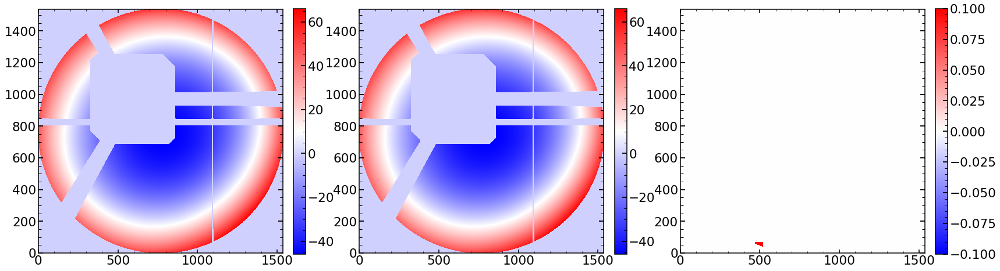

In [80]:
k=0
wf_grid_1=np.copy(wf_grid)
i=array_of_wf_15_15_grid_dif_cleaned_1[k][0]
j=array_of_wf_15_15_grid_dif_cleaned_1[k][1]    
print([i,j])
wf_grid_1[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768*1+(offset+(j+1)*50)]=array_of_wf_15_15_grid_dif_cleaned_1[k][2]

plt.figure(figsize=(28,8))
plt.subplot(131)
plt.imshow(wf_grid[768:768*3,768:768*3],cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(wf_grid_1[768:768*3,768:768*3],cmap='bwr')   
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(wf_grid_1[768:768*3,768:768*3]-wf_grid[768:768*3,768:768*3],cmap='bwr',vmax=0.1,vmin=-0.1)   
cbar=plt.colorbar(fraction=0.046, pad=0.04)

In [81]:
list_of_res_0=[]
print(len(array_of_wf_15_15_grid_dif_cleaned_1))
#for k in tqdm(range(len(array_of_wf_15_15_grid_dif_cleaned_1))):

for k in tqdm(range(8)):        

        wf_grid_1=np.copy(wf_grid)
        i=array_of_wf_15_15_grid_dif_cleaned_1[k][0]
        j=array_of_wf_15_15_grid_dif_cleaned_1[k][1]    
        
        wf_grid_1[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768*1+(offset+(j+1)*50)]=array_of_wf_15_15_grid_dif_cleaned_1[k][2]

        model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],
                              mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                              use_wf_grid=wf_grid_1,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                              explicit_psf_position=explicit_position_of_default)  

        minchain_0=list_of_minchain[index_of_single_image]

        res_0=model(minchain_0,return_Image=True)
        
        np.save('/Volumes/Saturn_USA/PFS/TigerAnalysis/51_51_4/res_0_'+str(i)+str(j),res_0)
        list_of_res_0.append([i,res_0])
        
array_of_res_0=np.array(list_of_res_0)
np.save('/Volumes/Saturn_USA/PFS/TigerAnalysis/51_51_4/array_of_res_0',array_of_res_0)

  0%|                                                                                                      | 0/8 [00:00<?, ?it/s]

663


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:17<00:00,  2.15s/it]


In [82]:
uber_list_of_input_parameters=[]
for k in tqdm(range(8)): 
    uber_list_of_input_parameters.append(list_of_minchain[index_of_single_image])
    
uber_list_of_input_parameters=np.array(uber_list_of_input_parameters)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 40820.48it/s]


In [83]:
import multiprocess
from multiprocess import Pool
print('multiprocessing.cpu_count() '+str(multiprocess.cpu_count()))
pool = Pool()

from itertools import repeat
from functools import partial


multiprocessing.cpu_count() 8


In [32]:
out1=pool.map(partial(model, return_Image=True), uber_list_of_input_parameters)

In [36]:
out32=list(map(model, uber_list_of_input_parameters))

In [48]:
wf_grid_1=np.copy(wf_grid)
i=array_of_wf_15_15_grid_dif_cleaned_1[k][0]
j=array_of_wf_15_15_grid_dif_cleaned_1[k][1]    
print([i,j])
wf_grid_1[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768*1+(offset+(j+1)*50)]=array_of_wf_15_15_grid_dif_cleaned_1[k][2]    
    

model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],
                      mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                      use_wf_grid=wf_grid_1,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                      explicit_psf_position=explicit_position_of_default)  

minchain_0=list_of_minchain[index_of_single_image]

res_0=model(minchain_0,return_Image=True)
res_0

[0, 9]


(-265905.46875,
 array([[ 7.193758 ,  7.6525536,  8.136049 , ..., 11.985089 , 11.171744 ,
         10.429393 ],
        [ 7.563042 ,  8.055967 ,  8.576638 , ..., 13.203617 , 12.103298 ,
         11.180309 ],
        [ 7.9405737,  8.469821 ,  9.030167 , ..., 15.523994 , 13.517788 ,
         12.100327 ],
        ...,
        [ 7.587813 ,  8.079705 ,  8.6036625, ...,  9.762791 ,  9.047508 ,
          8.441119 ],
        [ 7.1452866,  7.5961423,  8.075208 , ...,  9.121198 ,  8.476026 ,
          7.9235854],
        [ 6.724067 ,  7.137661 ,  7.5765686, ...,  8.512999 ,  7.9291487,
          7.425161 ]], dtype=float32),
 array([   27.82888138,    -2.76073621,    -1.03869291,    -0.75787603,
            1.33773784,    -0.68061175,    -0.6836074 ,     1.09462086,
            0.06777326,     0.06593109,    -0.13881094,    -0.14307069,
            0.14817439,     0.2120132 ,     0.026021  ,    -0.09667419,
            0.01505518,     0.04865938,     0.20137833,     0.69991908,
            0.1106

In [46]:
wf_grid_1=np.copy(wf_grid)

NameError: name 'wf_grid' is not defined

In [46]:
def extended_model(k,wf_grid):
        print('checkpoint')
        wf_grid_1=np.copy(wf_grid)
        #i=array_of_wf_15_15_grid_dif_cleaned_1[k][0]
        #j=array_of_wf_15_15_grid_dif_cleaned_1[k][1]    

        #wf_grid_1[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768*1+(offset+(j+1)*50)]=array_of_wf_15_15_grid_dif_cleaned_1[k][2]        
    
    
        #model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],
        #                      mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
        #                      use_wf_grid=wf_grid_1,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
        #                      explicit_psf_position=explicit_position_of_default)  

        #minchain_0=list_of_minchain[index_of_single_image]

        #res_0=model(minchain_0,return_Image=True)
        res_0=k
        return res_0

In [61]:
array_of_wf_15_15_grid_dif_cleaned_1[0][2]

array([[ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       ...,
       [45.204407, 45.09311 , 44.982533, ..., 40.67148 , 40.589054,
        40.507164],
       [44.912548, 44.801918, 44.691998, ..., 40.40274 , 40.32066 ,
        40.239105],
       [44.622562, 44.51258 , 44.4033  , ..., 40.13532 , 40.05357 ,
        39.972347]], dtype=float32)

In [47]:
t=extended_model(67,wf_grid)
t

checkpoint


67

In [55]:
out23=map(extended_model,np.arange(0,8))
out23=list(out23)
out23

checkpoint
checkpoint
checkpoint
checkpoint
checkpoint
checkpoint
checkpoint
checkpoint


[0, 1, 2, 3, 4, 5, 6, 7]

In [50]:
results = pool.starmap(extended_model, ((i, wf_grid) for i in range(8)))
out23=list(results)
out23

[0, 1, 2, 3, 4, 5, 6, 7]

In [42]:
out23=pool.map(extended_model,np.arange(0,8))
print('test')
out23=list(out23)

test


In [45]:
out1=pool.map(partial(extended_model),np.arange(0,8))

out1=list(out1)
out1

[0, 1, 2, 3, 4, 5, 6, 7]

In [ ]:
out1=pool.map(partial(model_multi_out, return_Images=True,\
                 use_only_chi=use_only_chi,multi_background_factor=multi_background_factor), uber_list_of_input_parameters)

In [338]:
i=18
j=16
res_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/51_51_4/res_0_'+str(i)+str(j)+'.npy',allow_pickle=True)

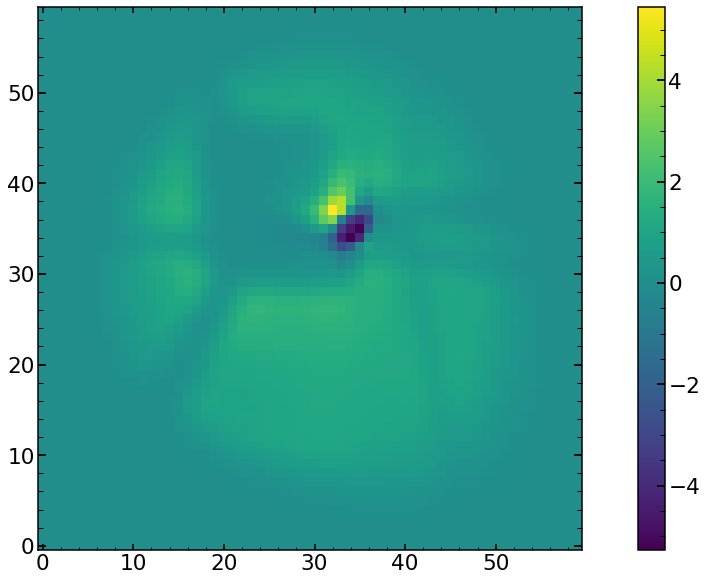

In [339]:
plt.figure(figsize=(20,10))
#plt.imshow(array_of_res_0[0][1][1]-initial_model)
plt.imshow(res_0[1]-initial_model)

plt.colorbar()

In [368]:
res_0_images_flux_differencres=[]
for i in range(len(array_of_res_0)):
    res_0_images_flux_differencres.append(array_of_res_0[i][1][1][flux_mask]-initial_model[flux_mask])
    
res_0_images_flux_differencres=np.array(res_0_images_flux_differencres)

flux_in_initial_model=np.sum(initial_model[flux_mask])

res_0_images_flux_differencres_renormalized=np.zeros(res_0_images_flux_differencres.shape)
for i in range(len(res_0_images_flux_differencres_renormalized)):
    res_0_images_flux_differencres_renormalized[i]=res_0_images_flux_differencres[i]*flux_in_initial_model/np.sum(array_of_res_0[i][1][1][flux_mask])

In [371]:
res_0_images_flux_differencres[100]

array([0.34887695, 0.37945557, 0.40771484, ..., 0.47070312, 0.4133911 ,
       0.35211182], dtype=float32)

In [372]:
res_0_images_flux_differencres_renormalized[100]

array([0.34875399, 0.37932181, 0.40757117, ..., 0.47053722, 0.41324541,
       0.35198772])

In [357]:
res_0_images_flux_differencres.shape

(663, 1369)

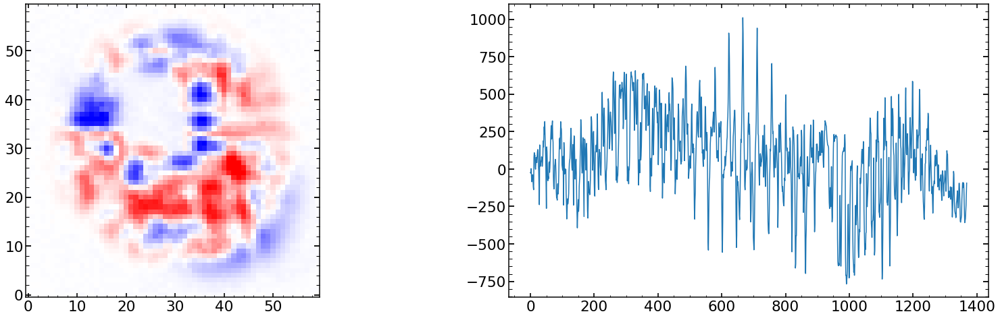

In [374]:
plt.figure(figsize=(28,8))

plt.subplot(121)
plt.imshow(sci_image_unit-initial_model,cmap='bwr',vmax=700,vmin=-700)


needed_subtraction=(sci_image_unit[flux_mask].ravel()-initial_model[flux_mask].ravel())/1
plt.subplot(122)
plt.plot(needed_subtraction)

In [375]:
from scipy.optimize import lsq_linear

In [387]:
s=len(res_0_images_flux_differencres_renormalized)
lb=np.full(s,-1)
ub=np.full(s,+1)

res = lsq_linear(res_0_images_flux_differencres_renormalized.T, needed_subtraction.astype('double'), bounds=(lb, ub), lsmr_tol='auto', verbose=1,max_iter=200)


The relative change of the cost function is less than `tol`.
Number of iterations 55, initial cost 6.4682e+07, final cost 2.9005e+07, first-order optimality 1.28e-05.


In [388]:
#res.x=np.zeros(len(res.x))
#res.x[0]=-0.1

In [389]:
res_0_images_flux_differencres_renormalized[0]

array([0.00024414, 0.00036621, 0.00054932, ..., 0.00061035, 0.00061035,
       0.00030518])

303652.2
217908.86357658842


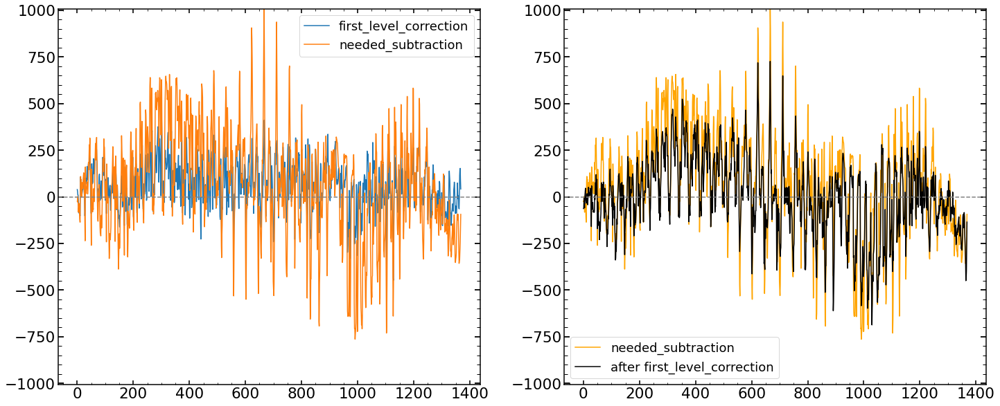

In [390]:
first_level_correction=res.x@res_0_images_flux_differencres_renormalized

plt.figure(figsize=(24,10))
plt.subplot(121)
plt.plot(first_level_correction,label='first_level_correction')
plt.plot(needed_subtraction,label='needed_subtraction')
plt.ylim(-np.max(np.abs(needed_subtraction)),np.max(np.abs(needed_subtraction)))
plt.legend()
plt.axhline(0,color='gray',ls='--')


plt.subplot(122)
plt.plot(needed_subtraction,label='needed_subtraction',c='orange')
plt.plot(needed_subtraction-first_level_correction,label='after first_level_correction',c='black')
plt.legend()
plt.ylim(-np.max(np.abs(needed_subtraction)),np.max(np.abs(needed_subtraction)))
plt.axhline(0,color='gray',ls='--')
print(np.sum(np.abs(needed_subtraction)))
print(np.sum(np.abs(needed_subtraction-1*res.x@res_0_images_flux_differencres_renormalized)))

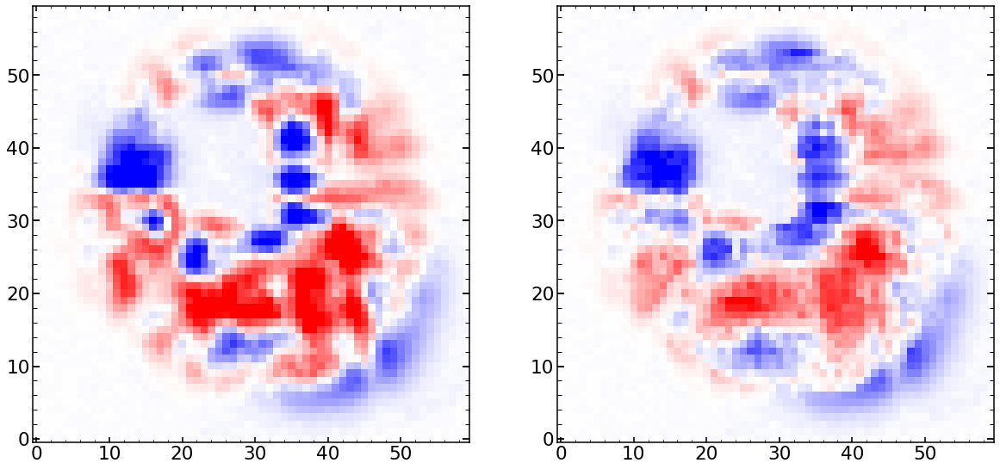

In [391]:
residual_original=(sci_image_unit-initial_model)
residual_corrected=np.copy(residual_original)

residual_corrected[flux_mask]=(residual_original[flux_mask]-1*first_level_correction)

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(residual_original,cmap='bwr',vmax=500,vmin=-500)
plt.subplot(122)
plt.imshow(residual_corrected,cmap='bwr',vmax=500,vmin=-500)
#plt.imshow(flux_mask,alpha=0.7)

In [392]:
wf_grid_first_correction_central_dif=np.zeros((768*2,768*2))
#plt.imshow(wf_grid_first_correction_central_dif)

print(len(array_of_wf_15_15_grid_dif_cleaned_1))
print(len(res))

# apply the correction and create the wavefront array thay we add (subtract?) to the original array
for k in range(len(array_of_wf_15_15_grid_dif_cleaned_1)):
    i=array_of_wf_15_15_grid_dif_cleaned_1[k][0]
    j=array_of_wf_15_15_grid_dif_cleaned_1[k][1]    
    
    wf_grid_first_correction_central_dif[768*0+(offset+i*50):768*0+(offset+(i+1)*50),768*0+(offset+j*50):768*0+(offset+(j+1)*50)]=\
    (array_of_wf_15_15_grid_dif_cleaned_1[k][2]-wf_grid[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768*1+(offset+(j+1)*50)])*res.x[k]

663
9


Text(0.5, 1.0, 'fractional change of wavefront')

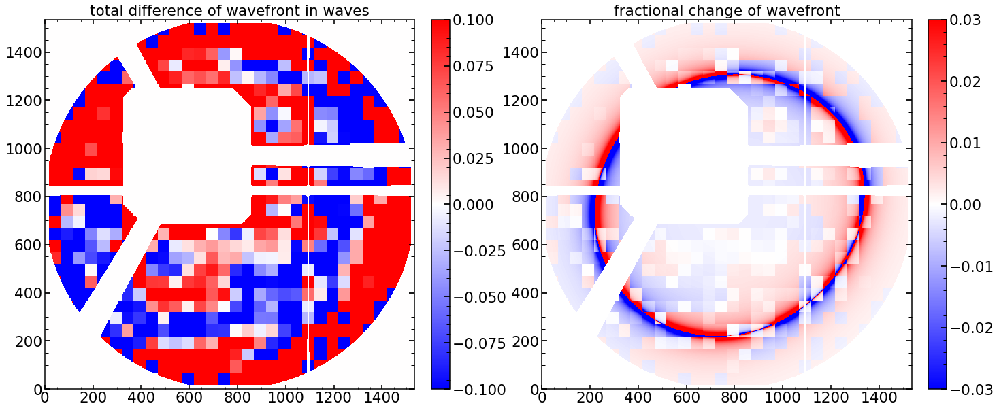

In [393]:

plt.figure(figsize=(24,10))

plt.subplot(121)
plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif))/1,vmin=-np.max(np.abs(wf_grid_first_correction_central_dif))/1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves')


plt.subplot(122)
plt.imshow(wf_grid_first_correction_central_dif/wf_grid_0_central,cmap='bwr',vmax=0.03,vmin=-0.03)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional change of wavefront')

In [394]:
wf_grid_1=np.copy(wf_grid)
wf_grid_1_final=np.copy(wf_grid_1)
wf_grid_1_final[768:3*768,768:3*768]=wf_grid_1_final[768:3*768,768:3*768]+wf_grid_first_correction_central_dif

In [395]:
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],
                      mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                      use_wf_grid=wf_grid_1_final,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                      explicit_psf_position=explicit_position_of_default)  

minchain_0=list_of_minchain[index_of_single_image]

res_final=model(minchain_0,return_Image=True)

305216.94
258395.84


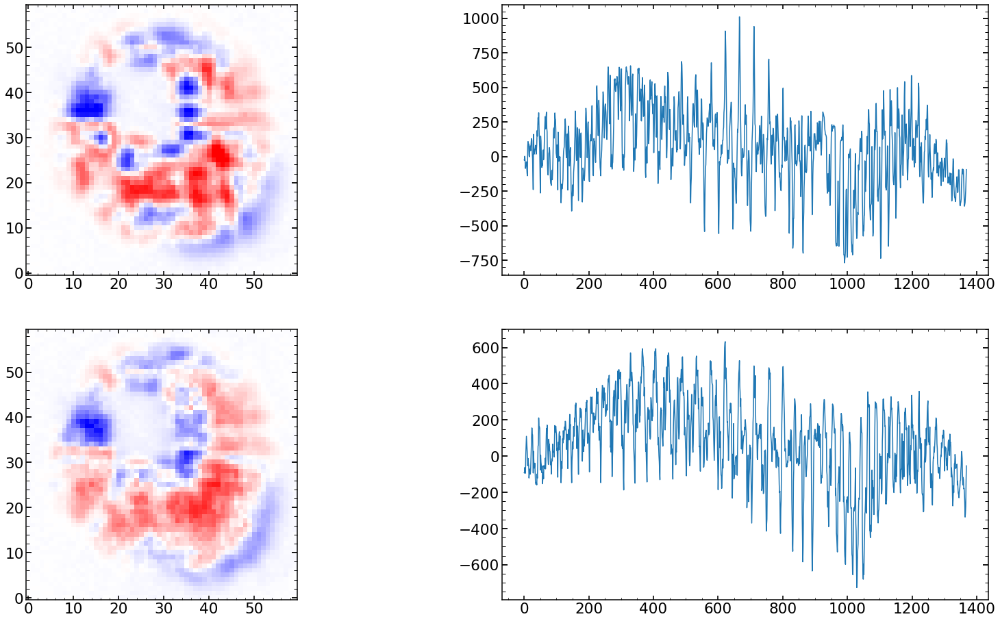

In [396]:
plt.figure(figsize=(28,16))


plt.subplot(221)
plt.imshow(sci_image_unit-initial_model,cmap='bwr',vmax=700,vmin=-700)


needed_subtraction=(sci_image_unit[flux_mask].ravel()-initial_model[flux_mask].ravel())/1
print(np.sum(np.abs(needed_subtraction)))
plt.subplot(222)
plt.plot(needed_subtraction)



plt.subplot(223)
plt.imshow(sci_image_unit-res_final[1],cmap='bwr',vmax=700,vmin=-700)


needed_subtraction=(sci_image_unit[flux_mask].ravel()-res_final[1][flux_mask].ravel())/1
plt.subplot(224)
plt.plot(needed_subtraction)
print(np.sum(np.abs(needed_subtraction)))

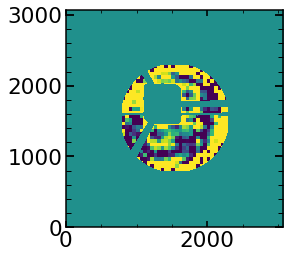

In [397]:
plt.imshow(wf_grid_1_final-wf_grid_1)

In [265]:
def

array([ 0.07120435, -0.1       , -0.1       ,  0.0914688 ,  0.0961283 ,
        0.09988045, -0.03064602,  0.02794083, -0.03803924, -0.03058797,
       -0.03949875, -0.02374905, -0.0406563 , -0.04159958,  0.09999911,
       -0.08720476,  0.03612514,  0.08537154,  0.08530511,  0.04819573,
       -0.00252592,  0.01238406,  0.02864911,  0.00711607, -0.00047528,
        0.04046637, -0.01506875, -0.03489913, -0.04157064, -0.0412824 ,
       -0.025423  , -0.03103568, -0.07302133, -0.09999969, -0.05757864,
       -0.01056553,  0.00532971,  0.02081175,  0.02286977,  0.02144621,
        0.03299397,  0.03443472,  0.03743835,  0.02190158,  0.0259384 ,
        0.054916  ,  0.0880645 , -0.04330088, -0.04510415, -0.04079495,
       -0.02620209, -0.02178654, -0.08351468, -0.06510567, -0.04546528,
       -0.02916116, -0.02882548, -0.01838856, -0.0062542 ,  0.00389095,
        0.0135504 ,  0.02426575,  0.04078446,  0.04915568,  0.0495216 ,
        0.03741064,  0.02532834,  0.03765078,  0.08465447, -0.08

In [61]:
single_image_analysis=ZernikeFitter_PFS(sci_image,var_image,image_mask=mask_image,pixelScale=None,wavelength=wavelength,
                                        diam_sic=None,npix=npix,pupilExplicit=pupilExplicit,\
                                        wf_full_Image=None,radiometricEffectArray_Image=None,
                                        ilum_Image=None,dithering=dithering,save=save,\
                                        pupil_parameters=pupil_parameters,use_pupil_parameters=use_pupil_parameters,
                                        use_optPSF=use_optPSF,use_wf_grid=use_wf_grid,
                                        zmaxInit=zmax,extraZernike=extraZernike,simulation_00=simulation_00,verbosity=verbosity,\
                                        double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,\
                                        test_run=test_run,explicit_psf_position=explicit_psf_position)  

NameError: name 'var_image' is not defined

In [12]:
import multiprocessing
from multiprocessing import Pool
print('multiprocessing.cpu_count() '+str(multiprocessing.cpu_count()))
pool = Pool()

from itertools import repeat
from functools import partial

multiprocessing.cpu_count() 8


In [4]:
import numpy as np

In [8]:
def extended_model(k):
        print('checkpoint')
        #wf_grid_1=np.copy(wf_grid)
        #i=array_of_wf_15_15_grid_dif_cleaned_1[k][0]
        #j=array_of_wf_15_15_grid_dif_cleaned_1[k][1]    
        print(k)
        #wf_grid_1[768*1+(offset+i*50):768*1+(offset+(i+1)*50),768*1+(offset+j*50):768*1+(offset+(j+1)*50)]=array_of_wf_15_15_grid_dif_cleaned_1[k][2]        
    
    
        #model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],
        #                      mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
        #                      use_wf_grid=wf_grid_1,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
        #                      explicit_psf_position=explicit_position_of_default)  

        #minchain_0=list_of_minchain[index_of_single_image]

        #res_0=model(minchain_0,return_Image=True)
        res_0=k
        return res_0

In [15]:
import multiprocess as mp

ModuleNotFoundError: No module named 'multiprocess'

In [14]:
import defs
if __name__ == '__main__':
    with Pool(5) as p:
        print(p.map(defs.extended_model, [1, 2, 3]))

ModuleNotFoundError: No module named 'defs'

In [13]:
out23=pool.starmap(extended_model,np.arange(0,8))
print('test')
out23=list(out23)

KeyboardInterrupt: 

In [9]:
out23=map(extended_model,np.arange(0,8))
print('test')
out23=list(out23)

test
checkpoint
0
checkpoint
1
checkpoint
2
checkpoint
3
checkpoint
4
checkpoint
5
checkpoint
6
checkpoint
7


In [188]:
first_level_correction=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/first_level_correction.npy')
res=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res.npy',allow_pickle=True)
res_0_images_flux_differencres_renormalized=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_0_images_flux_differencres_renormalized.npy',allow_pickle=True)
array_of_res_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/array_of_res_0.npy',allow_pickle=True)
sci_image_unit=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/sci_image_unit.npy')
initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/initial_model.npy')
flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/flux_mask.npy')
res_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final.npy',allow_pickle=True)

In [118]:
from scipy.optimize import lsq_linear
needed_subtraction=(sci_image_unit[flux_mask].ravel()-initial_model[flux_mask].ravel())/1

final_model=res_final[1]
subtraction_after_iteration=(sci_image_unit[flux_mask].ravel()-final_model[flux_mask].ravel())/1

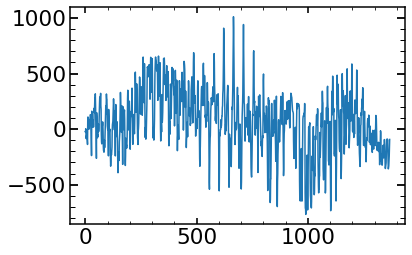

In [109]:
plt.plot(needed_subtraction)

In [110]:
res_0_images_flux_differencres=[]
for i in range(len(array_of_res_0)):
    res_0_images_flux_differencres.append(array_of_res_0[i][1][1][flux_mask]-initial_model[flux_mask])
    
res_0_images_flux_differencres=np.array(res_0_images_flux_differencres)

flux_in_initial_model=np.sum(initial_model[flux_mask])

res_0_images_flux_differencres_renormalized=np.zeros(res_0_images_flux_differencres.shape)
for i in range(len(res_0_images_flux_differencres_renormalized)):
    res_0_images_flux_differencres_renormalized[i]=res_0_images_flux_differencres[i]*flux_in_initial_model/np.sum(array_of_res_0[i][1][1][flux_mask])

s=len(res_0_images_flux_differencres_renormalized)
lb=np.full(s,-1)
ub=np.full(s,+1)

res = lsq_linear(res_0_images_flux_differencres_renormalized.T, needed_subtraction.astype('double'), bounds=(lb, ub), lsmr_tol='auto', verbose=1,max_iter=200)
first_level_correction=res.x@res_0_images_flux_differencres_renormalized

The relative change of the cost function is less than `tol`.
Number of iterations 33, initial cost 6.5255e+07, final cost 2.9177e+07, first-order optimality 8.11e-08.


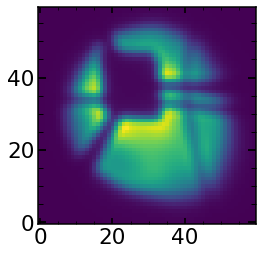

In [111]:
plt.imshow(array_of_res_0[0][1][1])

In [105]:
initial_model[flux_mask]

array([ 819.7325 ,  896.94073,  966.08673, ..., 1133.1315 ,  995.0088 ,
        847.5778 ], dtype=float32)

In [112]:
res_0_images_flux_differencres

array([[ 0.32891846,  0.35992432,  0.38781738, ...,  0.4547119 ,
         0.39935303,  0.34020996],
       [ 0.00622559,  0.00170898,  0.00286865, ...,  0.00305176,
         0.00286865,  0.00250244],
       [ 0.17010498,  0.00445557,  0.00286865, ...,  0.00354004,
         0.00317383,  0.00286865],
       ...,
       [ 0.00018311,  0.00036621,  0.00036621, ...,  0.00085449,
        -0.0010376 , -0.00091553],
       [ 0.32781982,  0.35876465,  0.38641357, ...,  0.45300293,
         0.39782715,  0.33892822],
       [ 0.32800293,  0.35894775,  0.38659668, ...,  0.45336914,
         0.3982544 ,  0.33935547]], dtype=float32)

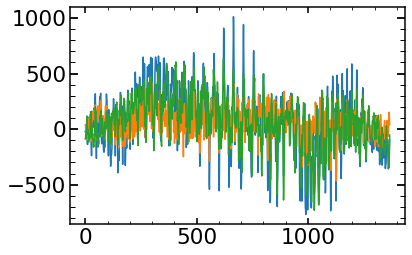

In [119]:
plt.plot(needed_subtraction)
plt.plot(first_level_correction)
plt.plot(subtraction_after_iteration)

## Bad image 

In [122]:
print(np.sum(np.abs(needed_subtraction)))
print(np.sum(np.abs(needed_subtraction-first_level_correction)))
print(np.sum(np.abs(subtraction_after_iteration)))

305169.9
218650.43330172118
258970.53


### m4

In [335]:
res_final_m4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_28.npy',allow_pickle=True)
#initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/initial_model_0.npy',allow_pickle=True)

#res_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_303.npy',allow_pickle=True)
res_initial_m4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_initial.npy',allow_pickle=True)
initial_model_m4=res_initial_m4[1]
sci_image_unit_m4=list_of_sci_images[0]

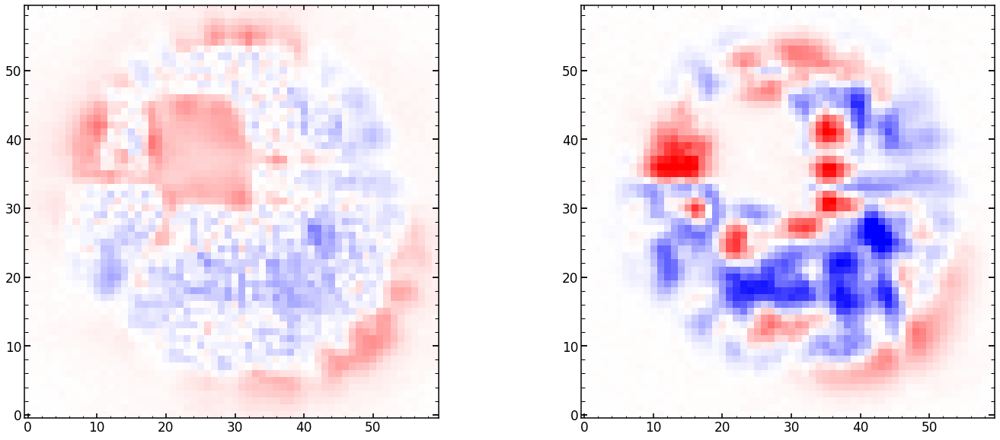

In [336]:
plt.figure(figsize=(24,10))

plt.subplot(121)

plt.imshow(res_final_m4[1]-sci_image_unit_m4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

plt.subplot(122)
plt.imshow(initial_model_m4-sci_image_unit_m4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

In [337]:
wf_grid_first_correction_central_dif_m4=res_final_m4[4][768:768*3,768:768*3]-res_initial_m4[4][768:768*3,768:768*3]
wf_grid_0_central_m4=res_initial_m4[4][768:768*3,768:768*3]

Text(0.5, 1.0, 'fractional change of wavefront')

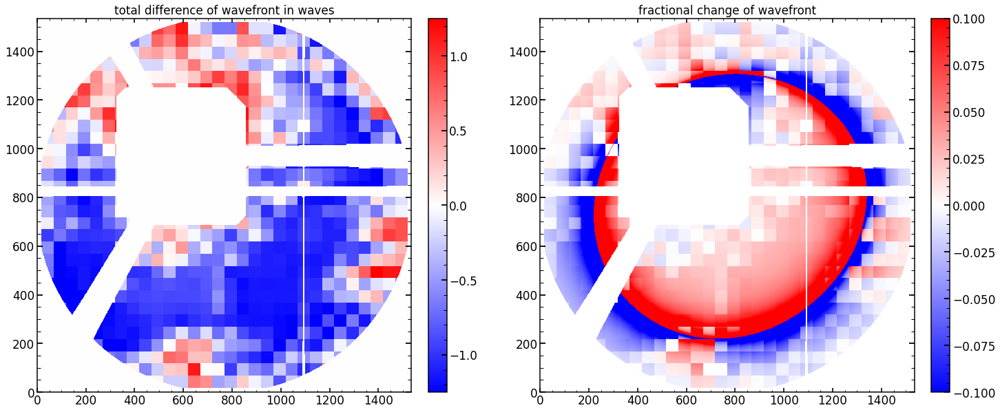

In [338]:
plt.figure(figsize=(24,10))

plt.subplot(121)
plt.imshow(wf_grid_first_correction_central_dif_m4,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1)

#plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_0_central))/1,
#           vmin=-np.max(np.abs(wf_grid_0_central))/1)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves')


plt.subplot(122)
plt.imshow(wf_grid_first_correction_central_dif_m4/wf_grid_0_central_m4,cmap='bwr',vmax=0.1,
           vmin=-0.1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional change of wavefront')

### p4 

In [339]:
res_final_p4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_29.npy',allow_pickle=True)
#initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/initial_model_0.npy',allow_pickle=True)

#res_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_303.npy',allow_pickle=True)
res_initial_p4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_initial_p4.npy',allow_pickle=True)
initial_model_p4=res_initial_p4[1]

In [340]:
sci_image_unit_p4=list_of_sci_images[8]

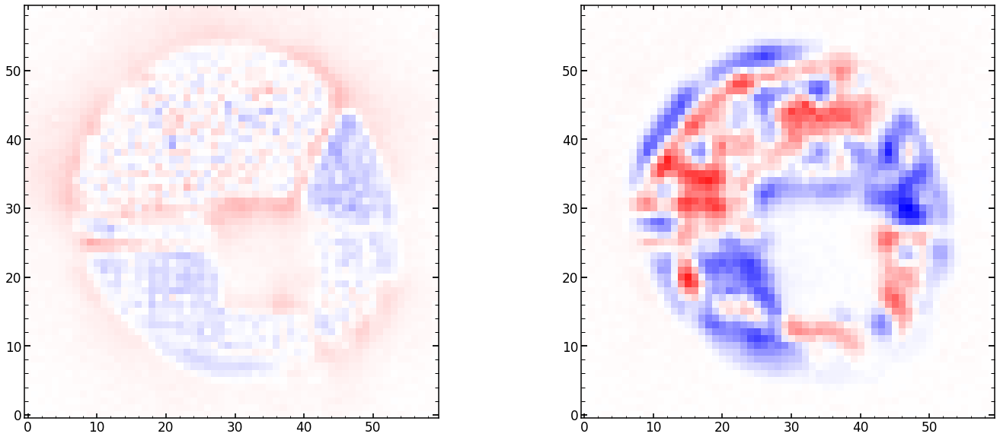

In [341]:
plt.figure(figsize=(24,10))

plt.subplot(121)

plt.imshow(res_final_p4[1]-sci_image_unit_p4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

plt.subplot(122)
plt.imshow(initial_model_p4-sci_image_unit_p4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

In [342]:
wf_grid_first_correction_central_dif_p4=res_final_p4[4][768:768*3,768:768*3]-res_initial_p4[4][768:768*3,768:768*3]
wf_grid_0_central_p4=res_initial_p4[4][768:768*3,768:768*3]

Text(0.5, 1.0, 'fractional change of wavefront')

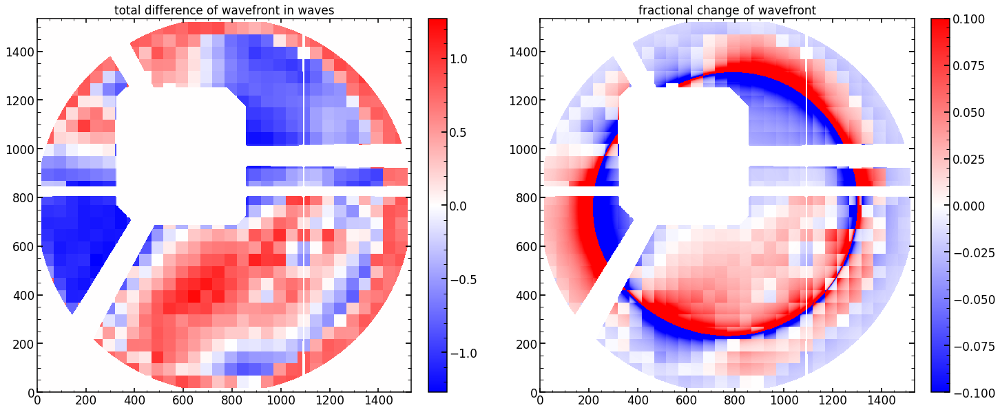

In [343]:
plt.figure(figsize=(24,10))

plt.subplot(121)
plt.imshow(wf_grid_first_correction_central_dif_p4,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_p4))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_p4))/1)

#plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_0_central))/1,
#           vmin=-np.max(np.abs(wf_grid_0_central))/1)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves')


plt.subplot(122)
plt.imshow(wf_grid_first_correction_central_dif_p4/wf_grid_0_central_p4,cmap='bwr',vmax=0.1,
           vmin=-0.1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional change of wavefront')

### together 

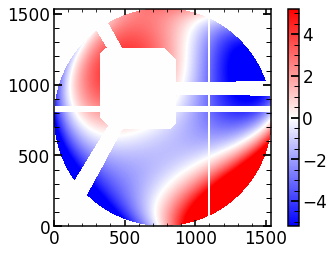

In [375]:
wf_full_fake_0_m4=np.load('/Users/nevencaplar/Documents/PFS/Testing/Wavefront_Images/wf_full_fake_0_m4.npy')
wf_full_fake_0_m4=wf_full_fake_0_m4
wf_full_fake_0_p4=np.load('/Users/nevencaplar/Documents/PFS/Testing/Wavefront_Images/wf_full_fake_0_p4.npy')
wf_full_fake_0_p4=wf_full_fake_0_p4

ilum=np.load('/Users/nevencaplar/Documents/PFS/Testing/Pupil_Images/ilum.npy')

midpoint=int(len(ilum)/2)
ilum_zoom=ilum[int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4),int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4)]
        
ilum_1=np.copy(ilum)
ilum_1[ilum_1>0.01]=1

wavefront=ilum_1*wf_full_fake_0_m4
wavefront=wavefront/800
wavefront_0_zoom_m4=wavefront[int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4),int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4)]



wf_full_fake_0_m4=np.load('/Users/nevencaplar/Documents/PFS/Testing/Wavefront_Images/wf_full_fake_0_m4.npy')
wf_full_fake_0_m4=wf_full_fake_0_m4
wf_full_fake_0_p4=np.load('/Users/nevencaplar/Documents/PFS/Testing/Wavefront_Images/wf_full_fake_0_p4.npy')
wf_full_fake_0_p4=wf_full_fake_0_p4

ilum=np.load('/Users/nevencaplar/Documents/PFS/Testing/Pupil_Images/ilum.npy')

midpoint=int(len(ilum)/2)
ilum_zoom=ilum[int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4),int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4)]
        
ilum_1=np.copy(ilum)
ilum_1[ilum_1>0.01]=1

wavefront=ilum_1*wf_full_fake_0_p4
wavefront=wavefront/800
wavefront_0_zoom_p4=wavefront[int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4),int(midpoint-len(ilum)/4):int(midpoint+len(ilum)/4)]

plt.imshow(wavefront_0_zoom,cmap=plt.get_cmap('bwr'),vmax=np.max(np.abs(wavefront))*0.75,vmin=-np.max(np.abs(wavefront))*0.75)
plt.colorbar()

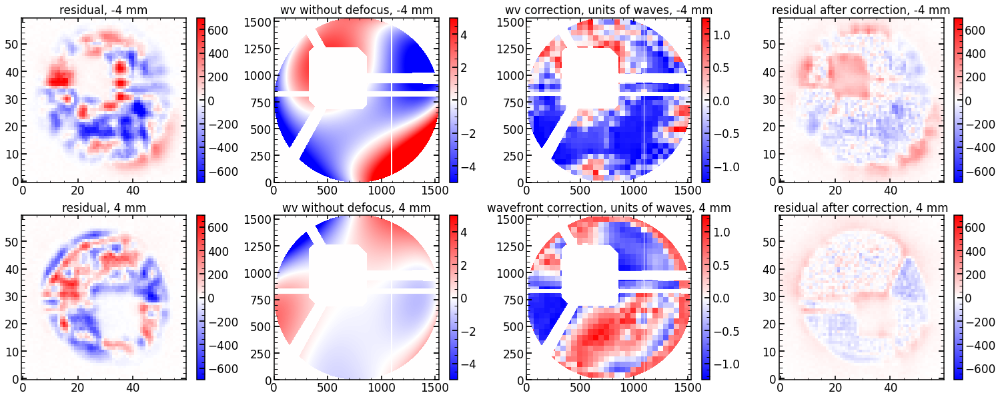

In [381]:
plt.figure(figsize=(26,10))

plt.subplot(241)
plt.imshow(initial_model_m4-sci_image_unit_m4,cmap='bwr',vmax=700,vmin=-700)
plt.title('residual, -4 mm')
plt.colorbar()

plt.subplot(242)

plt.imshow(wavefront_0_zoom_m4,cmap='bwr',vmax=5,
           vmin=-5)
plt.title('wv without defocus, -4 mm')
plt.colorbar()

plt.subplot(243)

plt.imshow(wf_grid_first_correction_central_dif_m4,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1)
plt.title('wv correction, units of waves, -4 mm')
plt.colorbar()



plt.subplot(244)
plt.imshow(res_final_m4[1]-sci_image_unit_m4,cmap='bwr',vmax=700,vmin=-700)
plt.title('residual after correction, -4 mm')
plt.colorbar()



plt.subplot(245)
plt.imshow(initial_model_p4-sci_image_unit_p4,cmap='bwr',vmax=700,vmin=-700)
plt.title('residual, 4 mm')
plt.colorbar()

plt.subplot(246)

plt.imshow(wavefront_0_zoom_p4,cmap='bwr',vmax=5,
           vmin=-5)
plt.title('wv without defocus, 4 mm')
plt.colorbar()

plt.subplot(247)
plt.imshow(wf_grid_first_correction_central_dif_p4,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1)
plt.title('wavefront correction, units of waves, 4 mm')
plt.colorbar()

plt.subplot(248)
plt.imshow(res_final_p4[1]-sci_image_unit_p4,cmap='bwr',vmax=700,vmin=-700)
plt.title('residual after correction, 4 mm')
plt.colorbar()



In [ ]:
# do the same for ``good'' image


## Good image

### m4 

In [431]:
res_final_m4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_55_m4_7.npy',allow_pickle=True)
#initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/initial_model_0.npy',allow_pickle=True)

#res_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_303.npy',allow_pickle=True)
res_initial_m4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_initial_55_m4.npy',allow_pickle=True)
initial_model_m4=res_initial_m4[1]
#sci_image_unit_m4=list_of_sci_images[0]
sci_image_unit_m4=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/sci_image_unit_55_m4_7.npy',allow_pickle=True)


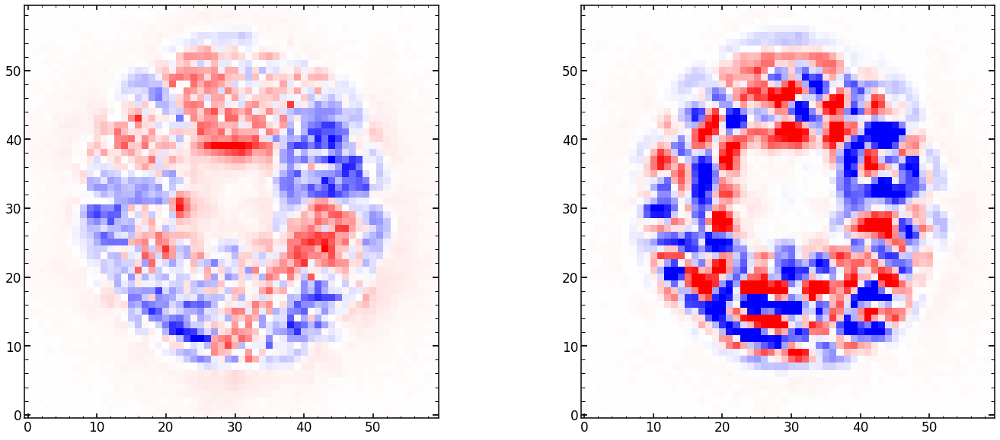

In [432]:
plt.figure(figsize=(24,10))

plt.subplot(121)

plt.imshow(res_final_m4[1]-sci_image_unit_m4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

plt.subplot(122)
plt.imshow(initial_model_m4-sci_image_unit_m4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

In [433]:
wf_grid_first_correction_central_dif_m4=res_final_m4[4][768:768*3,768:768*3]-res_initial_m4[4][768:768*3,768:768*3]
wf_grid_0_central_m4=res_initial_m4[4][768:768*3,768:768*3]

Text(0.5, 1.0, 'fractional change of wavefront')

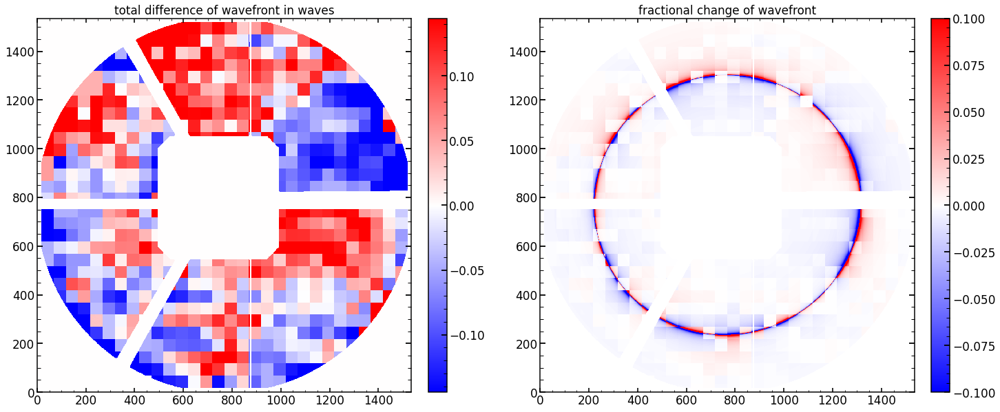

In [434]:
plt.figure(figsize=(24,10))

plt.subplot(121)
plt.imshow(wf_grid_first_correction_central_dif_m4,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_m4))/1)

#plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_0_central))/1,
#           vmin=-np.max(np.abs(wf_grid_0_central))/1)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves')


plt.subplot(122)
plt.imshow(wf_grid_first_correction_central_dif_m4/wf_grid_0_central_m4,cmap='bwr',vmax=0.1,
           vmin=-0.1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional change of wavefront')

### p4

In [ ]:
/Users/nevencaplar/Documents/PFS/TigerAnalysis/FineWavefront/first_level_correction_55_p4_220.npy

In [14]:
res_final_p4=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/FineWavefront/res_final_55_p4_220.npy',allow_pickle=True)
#initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/initial_model_0.npy',allow_pickle=True)

#res_final=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_303.npy',allow_pickle=True)
res_initial_p4=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/FineWavefront/res_initial_55_p4.npy',allow_pickle=True)
initial_model_p4=res_initial_p4[1]

flux_mask=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/FineWavefront/flux_mask_55_p4_220.npy')

In [16]:
sci_image_unit_p4=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/FineWavefront/sci_image_unit_55_p4_220.npy',allow_pickle=True)

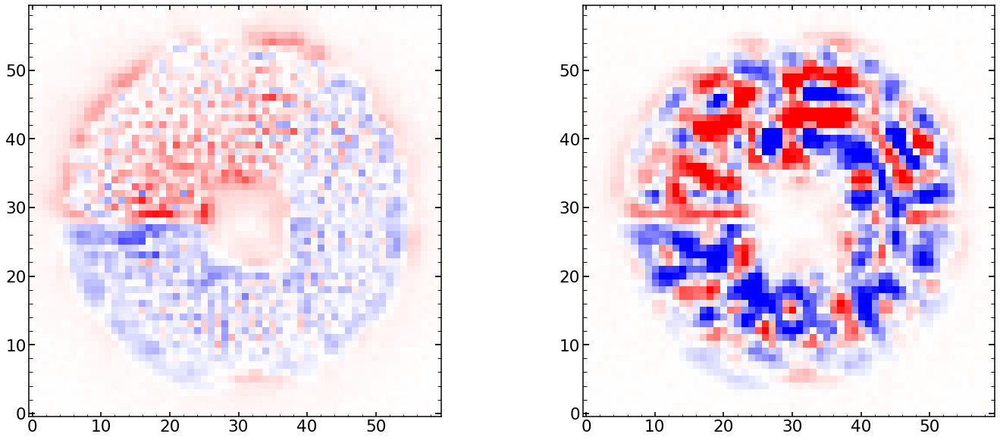

In [17]:
plt.figure(figsize=(24,10))

plt.subplot(121)

plt.imshow(res_final_p4[1]-sci_image_unit_p4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

plt.subplot(122)
plt.imshow(initial_model_p4-sci_image_unit_p4,cmap='bwr',vmax=700,vmin=-700)
#plt.imshow(flux_mask,alpha=0.2)

In [18]:
wf_grid_first_correction_central_dif_p4=res_final_p4[4][768:768*3,768:768*3]-res_initial_p4[4][768:768*3,768:768*3]
wf_grid_0_central_p4=res_initial_p4[4][768:768*3,768:768*3]

Text(0.5, 1.0, 'fractional change of wavefront')

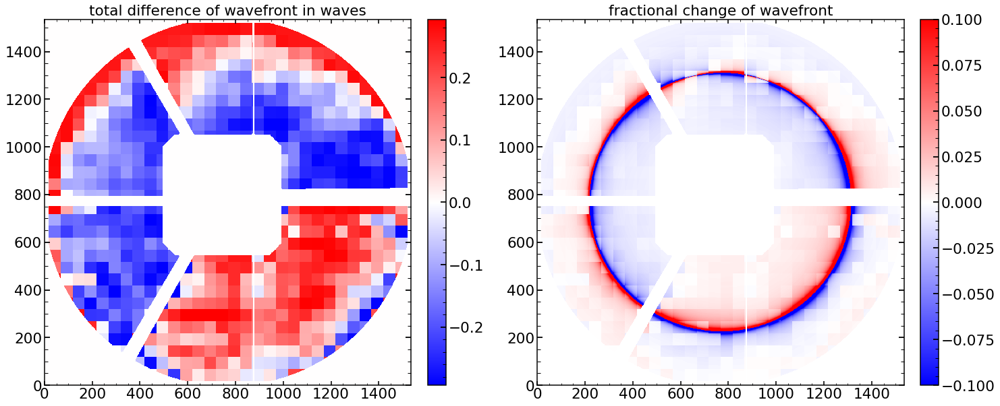

In [19]:
plt.figure(figsize=(24,10))

plt.subplot(121)
plt.imshow(wf_grid_first_correction_central_dif_p4,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_p4))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_p4))/1)

#plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_0_central))/1,
#           vmin=-np.max(np.abs(wf_grid_0_central))/1)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves')


plt.subplot(122)
plt.imshow(wf_grid_first_correction_central_dif_p4/wf_grid_0_central_p4,cmap='bwr',vmax=0.1,
           vmin=-0.1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional change of wavefront')

In [430]:
(300000-250000)/(300000-200000)

0.5

## continue 

In [195]:
res_final_10=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_10.npy',allow_pickle=True)
initial_model=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/initial_model_0.npy',allow_pickle=True)

res_final_303=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_final_303.npy',allow_pickle=True)
res_initial=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Fine_wavefront/res_initial_0.npy',allow_pickle=True)


In [196]:

wf_grid_0_central=res_initial[4][768:768*3,768:768*3]

wf_grid_first_correction_central_dif_303=res_final_303[4][768:768*3,768:768*3]-res_initial[4][768:768*3,768:768*3]
wf_grid_first_correction_central_dif_10=res_final_10[4][768:768*3,768:768*3]-res_initial[4][768:768*3,768:768*3]

Text(0.5, 1.0, 'image, 303')

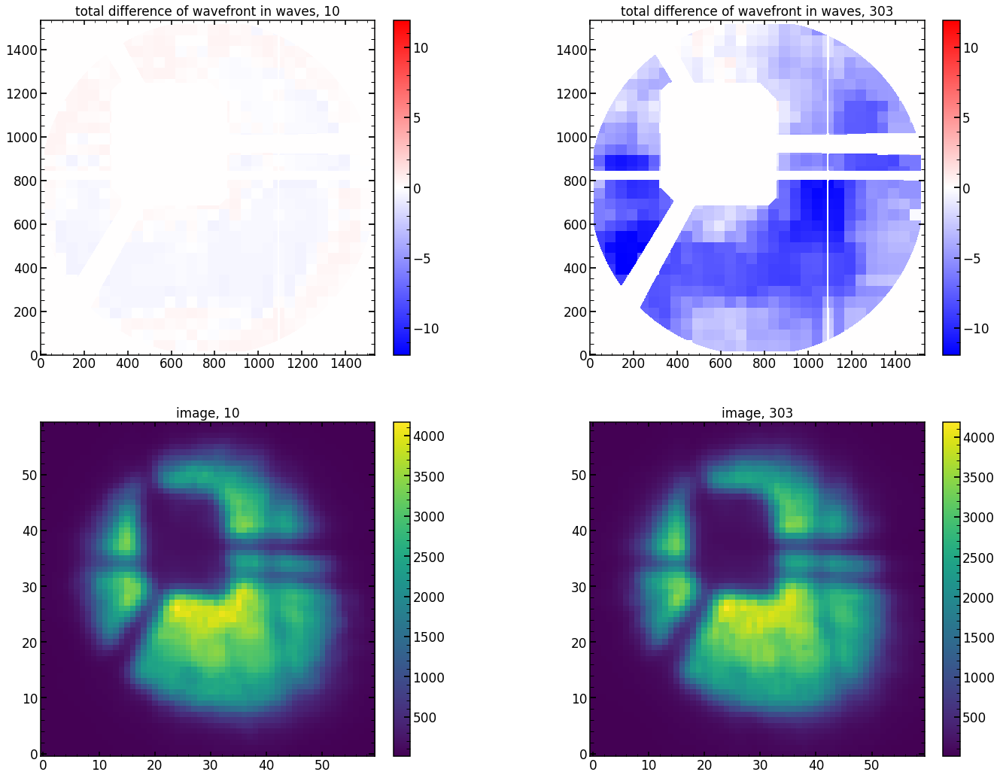

In [202]:
plt.figure(figsize=(24,18))

plt.subplot(221)
plt.imshow(wf_grid_first_correction_central_dif_10,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_303))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_303))/1)

#plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_0_central))/1,
#           vmin=-np.max(np.abs(wf_grid_0_central))/1)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves, 10')


plt.subplot(222)
plt.imshow(wf_grid_first_correction_central_dif_303,cmap='bwr',vmax=np.max(np.abs(wf_grid_first_correction_central_dif_303))/1,
           vmin=-np.max(np.abs(wf_grid_first_correction_central_dif_303))/1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('total difference of wavefront in waves, 303')


plt.subplot(223)
plt.imshow(res_final_10[1])

#plt.imshow(wf_grid_first_correction_central_dif,cmap='bwr',vmax=np.max(np.abs(wf_grid_0_central))/1,
#           vmin=-np.max(np.abs(wf_grid_0_central))/1)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('image, 10')


plt.subplot(224)
plt.imshow(res_final_303[1])
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('image, 303')

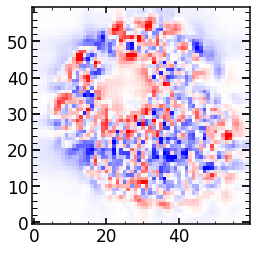

In [206]:
plt.imshow(res_final_10[1]-res_final_303[1],cmap='bwr',vmax=200,vmin=-200)

In [221]:

minchain=np.array([   27.82888138,    -2.76073621,    -1.03869291,    -0.75787603,
           1.33773784,    -0.68061175,    -0.6836074 ,     1.09462086,
           0.06777326,     0.06593109,    -0.13881094,    -0.14307069,
           0.14817439,     0.2120132 ,     0.026021  ,    -0.09667419,
           0.01505518,     0.04865938,     0.20137833,     0.69991908,
           0.11069462,    -0.23095152,     0.2634755 ,     0.05955178,
           0.09111398,     0.16964857,     0.23727531,     0.48081831,
           2.26598792,    -0.07118267,    -0.00769592,     0.852666  ,
           0.03060708,     0.64430913,     1.06384943,     0.52920915,
       63436.8173559 ,     2.13234192,     0.0033739 ,     0.34798325,
           1.84990475,     1.00254291,     0.03066097,    -0.06673234,
          -0.03561993,     0.01859054,     0.01584363,    -0.01226748,
           0.02015341,     0.0028996 ,    -0.02292109,    -0.0272912 ,
           0.04778645,    -0.06059794,     0.00625475,     0.00650501,
           0.01942844,    -0.00423994,     0.00657068,     0.01576848,
          -0.00520079,    -0.00594969,    -0.02733452,    -0.0334121 ,
           0.00335497,    -0.02533972,     0.00959805,    -0.02406293,
           0.00805668,     0.01547031,    -0.0112788 ,     0.00484796,
           0.00108524,     0.0040406 ,    -0.0004412 ,    -0.00526123])

In [222]:
wf_grid_1=np.copy(wf_grid)
wf_grid_1_test=np.copy(wf_grid_1)
wf_grid_1_test[768:3*768,768:3*768]=res_final_303[4][768:768*3,768:768*3]

In [284]:
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],
                      mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=1,\
                      use_wf_grid=wf_grid_1_test,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

minchain_0=list_of_minchain[index_of_single_image]

res_0_local=model(minchain,return_Image=True,use_only_chi=True,multi_background_factor=50)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   27.82888138    -2.76073621    -1.03869291    -0.75787603
     1.33773784    -0.68061175    -0.6836074      1.09462086
     0.06777326     0.06593109    -0.13881094    -0.14307069
     0.14817439     0.2120132      0.026021      -0.09667419
     0.01505518     0.04865938     0.20137833     0.69991908
     0.11069462    -0.23095152     0.2634755      0.05955178
     0.09111398     0.16964857     0.23727531     0.48081831
     2.26598792    -0.07

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.56889821 -10.33039613] / 155.80469
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.54775123 -10.29754888] / 155.84995
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.53717342 -10.28111854] / 155.87566
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.53717343 -10.28111854] / 155.87567
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.53717342 -10.28111855] / 155.87564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-12.70922976 -27.74889328] / 1211.6428
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-15.74670234 -18.64484389] / 391.5361
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.17014292 -14.37844381] / 212.84047
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.86054655 -12.30913502] / 170.31944
chi2 within shgo optimization routine 

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99263506 -10.3093047 ] / 155.34436
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99264259 -10.30930248] / 155.34436
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99263609 -10.30930256] / 155.34438
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99265114 -10.30929812] / 155.34436
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99264737 -10.30929923] / 155.34435
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99264942 -10.30929493] / 155.34435
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.99264772 -10.30929682] / 155.34435
We are fitting for only one source
One source fitting result is [-18.99264464 -10.30929819]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.6412441730499268
Sucesfully created optPsf_cut_fiber_

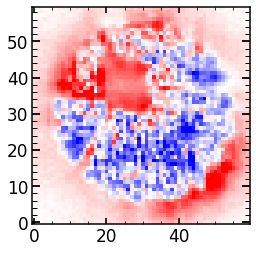

In [285]:
plt.imshow(res_0_local[1]-sci_image_unit,cmap='bwr',vmax=200,vmin=-200)

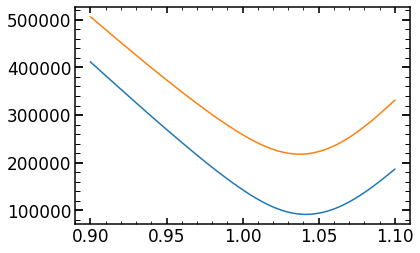

In [248]:
list_of_flux=[]
for i in np.arange(0.90,1.1,1/1000):
    list_of_flux.append([i,np.sum(np.abs(res_0_local[1][flux_mask]*i-sci_image_unit[flux_mask]))])
array_of_flux=np.array(list_of_flux)

list_of_flux_full=[]
for i in np.arange(0.90,1.1,1/1000):
    list_of_flux_full.append([i,np.sum(np.abs(res_0_local[1]*i-sci_image_unit))])
array_of_flux_full=np.array(list_of_flux_full)

plt.plot(array_of_flux[:,0],array_of_flux[:,1])
plt.plot(array_of_flux_full[:,0],array_of_flux_full[:,1])

In [255]:
modelImg=res_0_local[1]
sci_image=sci_image_unit
var_image=var_image_unit
mask_image=None


def create_custom_var(modelImg,sci_image,var_image,mask_image=None):
    """


    The algorithm creates variance map from the model image provided
    The connection between variance and flux is determined from the provided science image and variance image


    @param modelImg     model image
    @param sci_image    scientific image 
    @param var_image    variance image        
    @param mask_image   mask image     

    All of inputs have to be 2d np.arrays with same size

    Returns the np.array with same size as inputs

    introduced in v0.41

    """
    if mask_image is None:
        sci_pixels=sci_image.ravel()
        var_pixels=var_image.ravel()   
    else:
        sci_pixels=sci_image[mask_image==0].ravel()
        var_pixels=var_image[mask_image==0].ravel()
    z=np.polyfit(sci_pixels,var_pixels,deg=2)
    p1=np.poly1d(z)
    custom_var_image=p1(sci_image)

In [265]:
    def create_chi_2_almost(modelImg,sci_image,var_image,mask_image,use_only_chi=False,multi_background_factor=3):
        """
        @param modelImg    model image
        @param sci_image    scientific image 
        @param var_image    variance image        
        @param mask_image   mask image  
        @param use_only_chi if True, the program is reporting np.abs(chi), not chi^2
        
        
        returns array with 5 values (descriptions below with use_only_chi=False)
        1. normal chi**2
        2. what is 'instrinsic' chi**2, i.e., just sum((scientific image)**2/variance)
        3. 'Q' value = sum(abs(model - scientific image))/sum(scientific image)
        4. chi**2 reduced
        5. chi**2 reduced 'intrinsic'
        
        """ 

        try:
            
            if sci_image.shape[0]==20:
                multi_background_factor=3
                
            
            mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                                  np.median(var_image[:,0]),np.median(var_image[:,-1])])*multi_background_factor
         
            mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                                  np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*multi_background_factor
                
            mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])
            
            flux_mask=sci_image>(mean_value_of_background)
            inverted_flux_mask=flux_mask.astype(bool)
        except:
            inverted_flux_mask=np.ones(sci_image.shape)
        
        
        
        
        # array that has True for values which are good and False for bad values
        inverted_mask=~mask_image.astype(bool)
        
  
        # strengthen the mask by taking in the account only bright pixels, which have passed the flux cut
        inverted_mask=inverted_mask*inverted_flux_mask
      
        # at the moment plug it in here
        use_custom_var=True
        if use_custom_var==True:
            custom_var_image=create_custom_var(modelImg,sci_image,var_image,mask_image)
            # overload var_image with newly created image
            #var_image=custom_var_image
        
        # apply the mask on all of the images (sci, var and model)        
        var_image_masked=var_image*inverted_mask
        sci_image_masked=sci_image*inverted_mask
        modelImg_masked=modelImg*inverted_mask
        
        # sigma values
        sigma_masked = np.sqrt(var_image_masked)
        
        
        
        # chi array
        chi = (sci_image_masked - modelImg_masked)/sigma_masked
        # chi intrinsic, i.e., without subtracting model
        chi_intrinsic=(sci_image_masked/sigma_masked)
        
        
        #chi2_intrinsic=np.sum(sci_image_masked**2/var_image_masked)
        
        # ravel and remove bad values
        chi_without_nan = chi.ravel()[~np.isnan(chi.ravel())]
        chi_intrinsic_without_nan=chi_intrinsic.ravel()[~np.isnan(chi_intrinsic.ravel())]
        
        if use_only_chi==False:
            
            # square it
            chi2_res=(chi_without_nan)**2
            chi2_intrinsic_res=(chi_intrinsic_without_nan)**2
        else:
            # do not square it
            # keep the names, but careful as they are not squared quantities
            chi2_res=np.abs(chi_without_nan)**1
            chi2_intrinsic_res=np.abs(chi_intrinsic_without_nan)**1        

        #print('use_only_chi variable in create_chi_2_almost is: '+str(use_only_chi))
        #print('chi2_res '+str(np.sum(chi2_res)))
        #print('chi2_intrinsic_res '+str(np.sum(chi2_intrinsic_res)))
        
        # calculates 'Q' values
        Qlist=np.abs((sci_image_masked - modelImg_masked))
        Qlist_without_nan=Qlist.ravel()[~np.isnan(Qlist.ravel())]
        sci_image_without_nan=sci_image_masked.ravel()[~np.isnan(sci_image_masked.ravel())]
        Qvalue = np.sum(Qlist_without_nan)/np.sum(sci_image_without_nan)
        
        # return the result
        return [np.sum(chi2_res),np.sum(chi2_intrinsic_res),Qvalue,np.mean(chi2_res),np.mean(chi2_intrinsic_res)]

In [280]:
mask_image=np.zeros(sci_image.shape)

list_of_chi_2_almost=[]
for i in np.arange(0.90,1.1,1/1000):
    list_of_chi_2_almost.append([i,create_chi_2_almost(i*res_0_local[1],sci_image,var_image,mask_image,use_only_chi=False)[0]])
array_of_chi_2_almost=np.array(list_of_chi_2_almost)

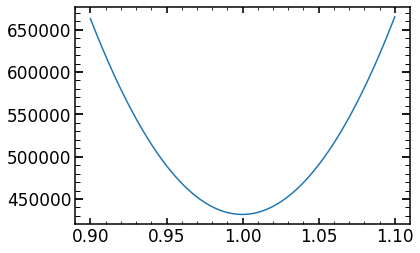

In [281]:
list_of_flux=[]
for i in np.arange(0.90,1.1,1/1000):
    list_of_flux.append([i,np.sum(np.abs(res_0_local[1][flux_mask]*i-sci_image_unit[flux_mask]))])
array_of_flux=np.array(list_of_flux)

list_of_flux_full=[]
for i in np.arange(0.90,1.1,1/1000):
    list_of_flux_full.append([i,np.sum(np.abs(res_0_local[1]*i-sci_image_unit))])
array_of_flux_full=np.array(list_of_flux_full)

#plt.plot(array_of_flux[:,0],array_of_flux[:,1])
#plt.plot(array_of_flux_full[:,0],array_of_flux_full[:,1])
plt.plot(array_of_chi_2_almost[:,0],array_of_chi_2_almost[:,1])

In [277]:
def find_flux_fit(flux_fit):
    return create_chi_2_almost(flux_fit*res_0_local[1],sci_image,var_image,mask_image,use_only_chi=True)[0]   

In [279]:
flux_fitting_result = scipy.optimize.shgo(find_flux_fit,bounds=[(0.98,1.02)],iters=6)
flux_fitting_result

     fun: 23845.05348937564
    funl: array([23845.05348938])
 message: 'Optimization terminated successfully.'
    nfev: 35
     nit: 6
   nlfev: 2
   nlhev: 0
   nljev: 1
 success: True
       x: array([1.02])
      xl: array([[1.02]])

In [305]:
list_of_minchain[8]

array([  -26.71911456,     0.68365966,     0.14394746,    -0.25892546,
           0.3135981 ,    -0.41779318,    -0.82115586,     0.40720889,
           0.1022539 ,     0.11945862,     0.19390971,    -0.10321521,
           0.14052595,    -0.04554323,     0.08155326,    -0.06743277,
          -0.02958767,     0.02745265,    -0.00470521,     0.69991908,
           0.11069462,    -0.23095152,     0.2634755 ,     0.05955178,
           0.09111398,     0.16964857,     0.23727531,     0.48081831,
           2.26598792,    -0.07118267,    -0.00769592,     0.852666  ,
           0.03060708,     0.64430913,     1.06384943,     0.52920915,
       63436.8173559 ,     2.13234192,     0.0033739 ,     0.34798325,
           1.84990475,     1.00254291,     0.02631317,    -0.01961215,
          -0.00903274,     0.039894  ,     0.02385379,     0.02571521,
          -0.02866365,     0.00654408,     0.01955671,    -0.01012921,
           0.04195006,    -0.0271979 ,     0.00558375,    -0.00328578,
      

# Jun 04 run - not really done

In [ ]:
# just +-4mm and focus
# wavelength taken into account

# parameter_Estimation v042
# Module v046

In [440]:
import glob

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_flip.pkl",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_flip.pkl",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_flip.pkl",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## first version 

In [441]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=finalAr[finalAr['close']=='1'].index 
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

80
40
10
Int64Index([  1,   3,   5,   6,   7,   8,   9,  11,  13,  15,  17,  18,  19,
             20,  21,  23,  25,  27,  29,  30,  31,  32,  33,  35,  37,  39,
             41,  42,  43,  44,  45,  47,  49,  51,  53,  54,  55,  56,  57,
             59,  61,  63,  65,  66,  67,  68,  69,  71,  73,  75,  77,  78,
             79,  80,  81,  83,  85,  87,  89,  90,  91,  92,  93,  95,  97,
             99, 101, 102, 103, 104, 105, 107, 109, 111, 113, 114, 115, 116,
            117, 119],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31, 35, 39], dtype='int64')


In [ ]:
date='Jun0421'


for single_spot in list_of_Ar_to_analyze:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 19:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34389 34437 -spot "+str(single_spot)+\
               " -nsteps 46 -eps 8 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Apr1421 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

# PIPE2D - 777 (recentering, renormalization)

In [443]:
image=list_of_sci_images[4]

In [453]:
def calculateCentroid(image):
    xx=np.arange(0,20)
    yy=np.arange(0,20)
    norm = np.sum(image.astype(float))
    xCen = np.sum(np.sum(image.astype(float), axis=0)*xx)/norm
    yCen = np.sum(np.sum(image.astype(float), axis=1)*yy.T)/norm
    return xCen,yCen

(10.1646046977598, 9.5219581140225)

In [458]:
def find_centroid_of_flux(image,mask=None):
    """
    function giving the tuple of the position of weighted average of the flux in a square image
    
    @input image    poststamp image for which to find center
    @input mask     mask, same size as the image
    
    returns tuple with x and y center, in units of pixels
    """
    if mask is None:
        mask=np.ones(image.shape)
    
    x_center=[]
    y_center=[]
    
    # if there are nan values (most likely cosmics), replace them with max value in the rest of the image
    # careful, this can seriously skew the results if not used for this purpose
    max_value_image=np.max(image[~np.isnan(image)])
    image[np.isnan(image)]=max_value_image

    I_x=[]
    for i in range(len(image)):
        I_x.append([i,np.mean(image[:,i]*mask[:,i])])

    I_x=np.array(I_x)

    I_y=[]
    for i in range(len(image)):
        I_y.append([i,np.mean(image[i]*mask[i])])

    I_y=np.array(I_y)


    x_center=(np.sum(I_x[:,0]*I_x[:,1])/np.sum(I_x[:,1]))
    y_center=(np.sum(I_y[:,0]*I_y[:,1])/np.sum(I_y[:,1]))
    
    return(x_center,y_center)

In [459]:
calculateCentroid(image)

(10.1646046977598, 9.5219581140225)

In [460]:
find_centroid_of_flux(image)

(10.164604697759803, 9.521958114022498)

In [20]:
1.4**7

10.541350399999995

In [32]:
4.6+6.55+6.88+4.9+6.55

29.48

In [41]:
sci_image=list_of_sci_images[4]
var_image=list_of_var_images[4]
mask_image=list_of_mask_images[4]
modelImg=list_of_single_model_image[4]

inverted_mask=~mask_image.astype(bool)

var_image_masked=var_image*inverted_mask
sci_image_masked=sci_image*inverted_mask
modelImg_masked=modelImg*inverted_mask

In [47]:
np.sqrt(np.sum((np.array(find_centroid_of_flux(modelImg_masked))-np.array(find_centroid_of_flux(sci_image_masked)))**2))

0.002237173318594386

In [49]:
np.sqrt(np.sum((np.array([1,1])-np.array([0,0]))**2))

1.4142135623730951

In [131]:
finalNe[finalNe['fiber']==2]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
81,2,4013,348,650.84186,0,Ne,4082,30.12,0.406,0,0
82,2,4013,379,653.4774,-1,Ne,4082,0,0,0,0
83,2,4012,455,660.0668,1,Ne,4081,0,0,0,0
84,2,4011,547,668.01764,0,Ne,4080,44.24,0.67,-29.97,0.003
85,2,4011,592,671.9268,-1,Ne,4080,0,0,0,0
86,2,4008,835,693.13116,1,Ne,4077,0,0,0,0
87,2,4007,1116,717.59015,1,Ne,4076,0,0,0,0
88,2,4006,1198,724.72437,1,Ne,4075,0,0,0,0
89,2,4005,1421,744.1276,0,Ne,4074,38.57,0.012,57.44,0.162


In [50]:
from astropy.io import fits

In [130]:
final_Ne

NameError: name 'final_Ne' is not defined

In [117]:
SM2_data_Argon=fits.open('/Volumes/Saturn_USA/PFS/LAM/raw/2021-06-04/PFLA02684622.fits')
SM1_data_Argon=fits.open('/Volumes/Saturn_USA/PFS/Subaru/2021-05-02/PFSA04758212.fits')

SM2_data_Neon=fits.open('/Volumes/Saturn_USA/PFS/LAM/raw/2021-06-04/PFLA02684722.fits')
SM1_data_Neon=fits.open('/Volumes/Saturn_USA/PFS/Subaru/2021-05-04/PFSA04824612.fits')


In [148]:
SM2_data_Argon_9=SM2_data_Argon[1].data[3422:3482,143:203]
SM1_data_Argon_9=SM1_data_Argon[1].data[3408:3468,65:125]

SM2_data_Argon_117=SM2_data_Argon[1].data[3425:3485,4257:4317]
SM1_data_Argon_117=SM1_data_Argon[1].data[3395:3455,4315:4375]

SM2_data_Neon_low=SM2_data_Neon[1].data[500:560,148:208]
SM1_data_Neon_low=SM1_data_Neon[1].data[475:535,65:125]

SM2_data_Neon_high=SM2_data_Neon[1].data[505:565,4250:4310]
SM1_data_Neon_high=SM1_data_Neon[1].data[465:525,4313:4373]

Text(0.5, 1.0, 'SM1, fiber=2, vw=912.56 nm')

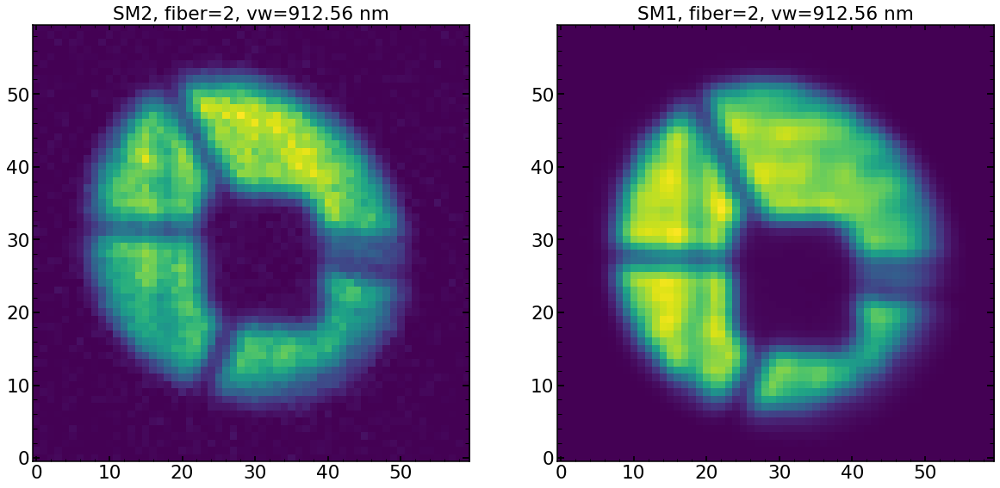

In [144]:
plt.figure(figsize=(20,10))
plt.subplot(121)
median_SM2_data_Argon_117=np.median(SM2_data_Argon_117[:,0])
plt.imshow(SM2_data_Argon_117-median_SM2_data_Argon_117,vmax=np.max(SM2_data_Argon_117-median_SM2_data_Argon_117),vmin=np.max(SM2_data_Argon_117-median_SM2_data_Argon_117)/1000)
plt.title('SM2, fiber=2, vw=912.56 nm')

plt.subplot(122)
median_SM1_data_Argon_117=np.median(SM1_data_Argon_117[:,0])
plt.imshow(SM1_data_Argon_117-median_SM1_data_Argon_117,vmax=np.max(SM1_data_Argon_117-median_SM1_data_Argon_117),vmin=np.max(SM1_data_Argon_117-median_SM1_data_Argon_117)/1000)
plt.title('SM1, fiber=2, vw=912.56 nm')

Text(0.5, 1.0, 'SM1, fiber=650, vw=912.56 nm')

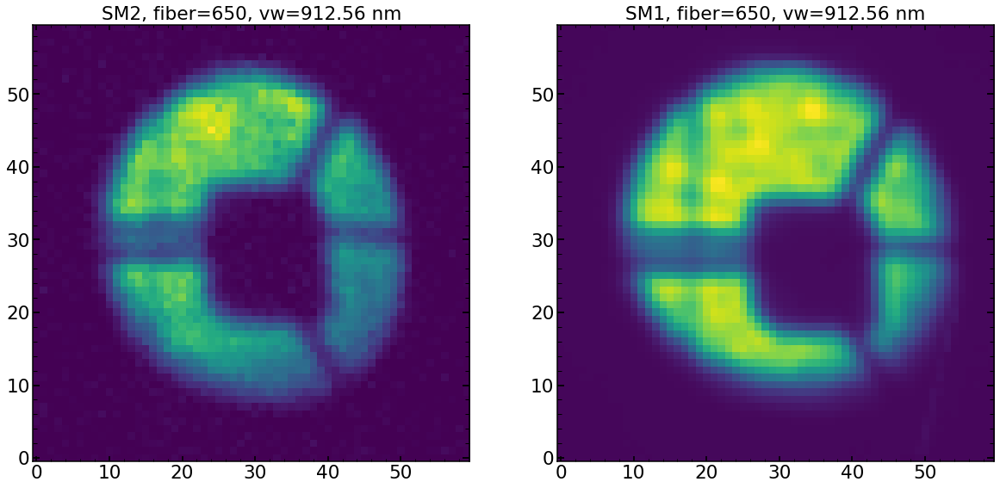

In [145]:
plt.figure(figsize=(20,10))
plt.subplot(121)
median_SM2_data_Argon_9=np.median(SM2_data_Argon_9[:,0])
plt.imshow(SM2_data_Argon_9-median_SM2_data_Argon_9,vmax=np.max(SM2_data_Argon_9-median_SM2_data_Argon_9),vmin=np.max(SM2_data_Argon_9-median_SM2_data_Argon_9)/1000)
plt.title('SM2, fiber=650, vw=912.56 nm')

plt.subplot(122)
plt.imshow(SM1_data_Argon_9,vmax=np.max(SM1_data_Argon_9),vmin=np.max(SM1_data_Argon_9)/1000)
plt.title('SM1, fiber=650, vw=912.56 nm')

Text(0.5, 1.0, 'SM1, fiber=650, vw=668.02 nm')

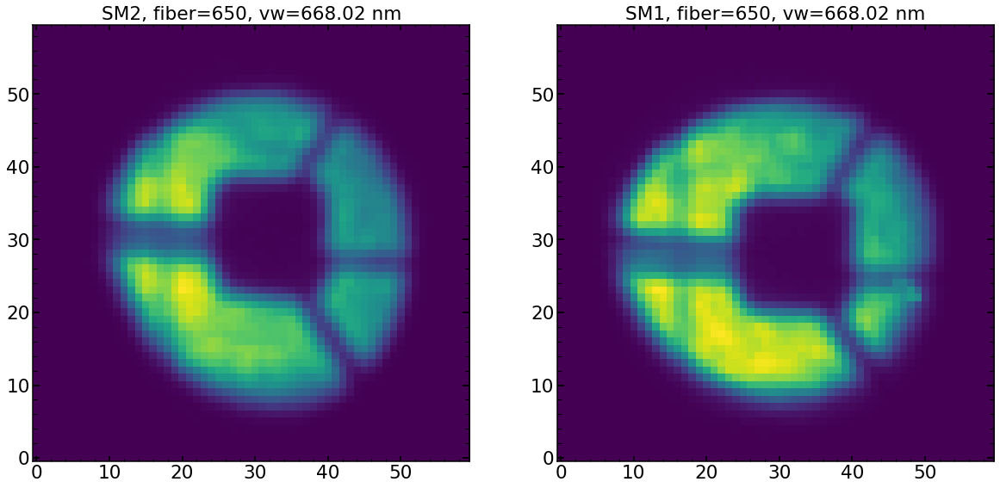

In [146]:
plt.figure(figsize=(20,10))
plt.subplot(121)
median_SM2_data_Neon_low=np.median(SM2_data_Neon_low[:,0])
plt.imshow(SM2_data_Neon_low-median_SM2_data_Neon_low,vmax=np.max(SM2_data_Neon_low-median_SM2_data_Neon_low),vmin=np.max(SM2_data_Neon_low-median_SM2_data_Neon_low)/1000)
plt.title('SM2, fiber=650, vw=668.02 nm')

plt.subplot(122)
median_SM1_data_Neon_low=np.median(SM1_data_Neon_low[:,0])
plt.imshow(SM1_data_Neon_low-median_SM1_data_Neon_low,vmax=np.max(SM1_data_Neon_low-median_SM1_data_Neon_low),vmin=np.max(SM1_data_Neon_low-median_SM1_data_Neon_low)/1000)
plt.title('SM1, fiber=650, vw=668.02 nm')

Text(0.5, 1.0, 'SM1, fiber=2, vw=668.02 nm')

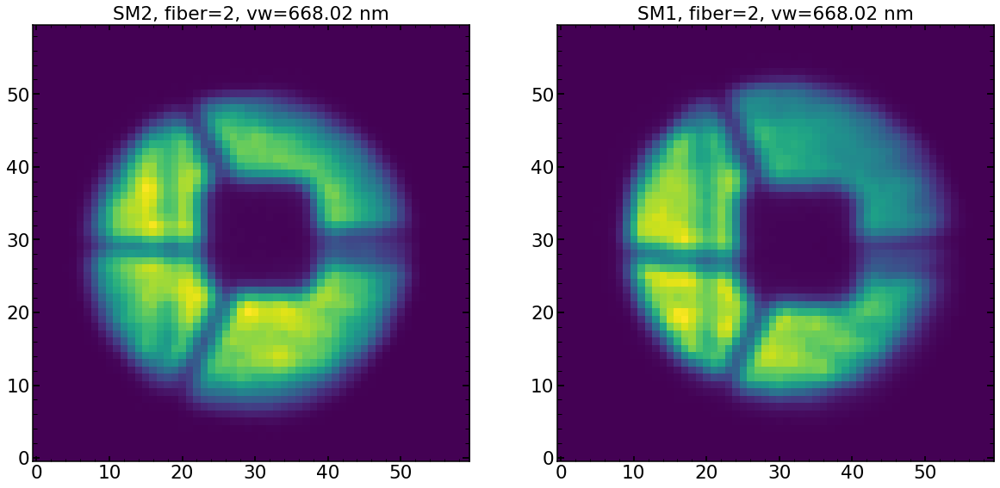

In [149]:
plt.figure(figsize=(20,10))
plt.subplot(121)
median_SM2_data_Neon_high=np.median(SM2_data_Neon_high[:,0])
plt.imshow(SM2_data_Neon_high-median_SM2_data_Neon_high,vmax=np.max(SM2_data_Neon_high-median_SM2_data_Neon_high),vmin=np.max(SM2_data_Neon_high-median_SM2_data_Neon_high)/1000)
plt.title('SM2, fiber=2, vw=668.02 nm')

plt.subplot(122)
median_SM1_data_Neon_high=np.median(SM1_data_Neon_high[:,0])
plt.imshow(SM1_data_Neon_high-median_SM1_data_Neon_high,vmax=np.max(SM1_data_Neon_high-median_SM1_data_Neon_high),vmin=np.max(SM1_data_Neon_high-median_SM1_data_Neon_high)/1000)
plt.title('SM1, fiber=2, vw=668.02 nm')

Text(0.5, 1.0, 'SM1, fiber=650, vw=668.02 nm')

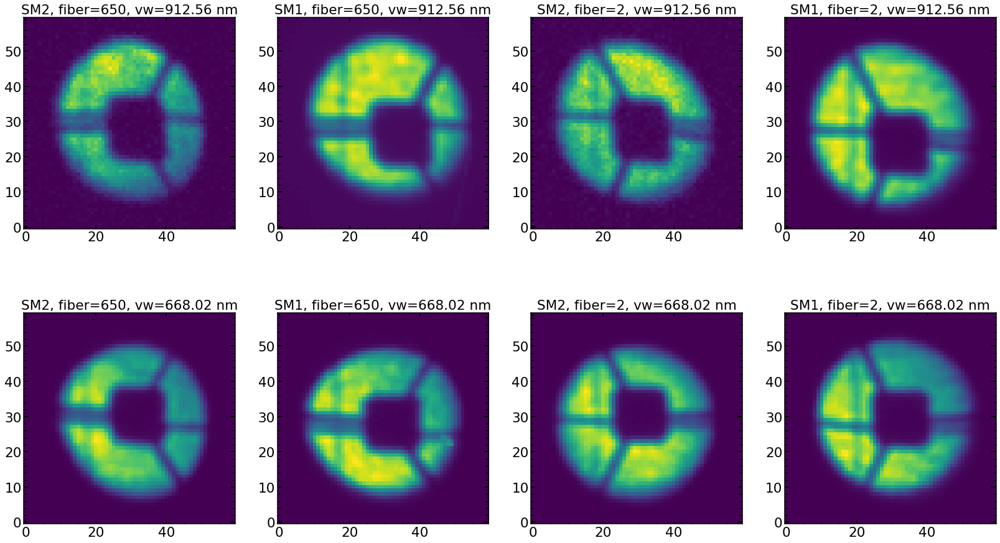

In [156]:
plt.figure(figsize=(28,16))

plt.subplot(241)
median_SM2_data_Argon_9=np.median(SM2_data_Argon_9[:,0])
plt.imshow(SM2_data_Argon_9-median_SM2_data_Argon_9,vmax=np.max(SM2_data_Argon_9-median_SM2_data_Argon_9),vmin=np.max(SM2_data_Argon_9-median_SM2_data_Argon_9)/1000)
plt.title('SM2, fiber=650, vw=912.56 nm')

plt.subplot(242)
plt.imshow(SM1_data_Argon_9,vmax=np.max(SM1_data_Argon_9),vmin=np.max(SM1_data_Argon_9)/1000)
plt.title('SM1, fiber=650, vw=912.56 nm')

plt.subplot(243)
median_SM2_data_Argon_117=np.median(SM2_data_Argon_117[:,0])
plt.imshow(SM2_data_Argon_117-median_SM2_data_Argon_117,vmax=np.max(SM2_data_Argon_117-median_SM2_data_Argon_117),vmin=np.max(SM2_data_Argon_117-median_SM2_data_Argon_117)/1000)
plt.title('SM2, fiber=2, vw=912.56 nm')

plt.subplot(244)
median_SM1_data_Argon_117=np.median(SM1_data_Argon_117[:,0])
plt.imshow(SM1_data_Argon_117-median_SM1_data_Argon_117,vmax=np.max(SM1_data_Argon_117-median_SM1_data_Argon_117),vmin=np.max(SM1_data_Argon_117-median_SM1_data_Argon_117)/1000)
plt.title('SM1, fiber=2, vw=912.56 nm')



plt.subplot(247)
median_SM2_data_Neon_high=np.median(SM2_data_Neon_high[:,0])
plt.imshow(SM2_data_Neon_high-median_SM2_data_Neon_high,vmax=np.max(SM2_data_Neon_high-median_SM2_data_Neon_high),vmin=np.max(SM2_data_Neon_high-median_SM2_data_Neon_high)/1000)
plt.title('SM2, fiber=2, vw=668.02 nm')

plt.subplot(248)
median_SM1_data_Neon_high=np.median(SM1_data_Neon_high[:,0])
plt.imshow(SM1_data_Neon_high-median_SM1_data_Neon_high,vmax=np.max(SM1_data_Neon_high-median_SM1_data_Neon_high),vmin=np.max(SM1_data_Neon_high-median_SM1_data_Neon_high)/1000)
plt.title('SM1, fiber=2, vw=668.02 nm')

plt.subplot(245)
median_SM2_data_Neon_low=np.median(SM2_data_Neon_low[:,0])
plt.imshow(SM2_data_Neon_low-median_SM2_data_Neon_low,vmax=np.max(SM2_data_Neon_low-median_SM2_data_Neon_low),vmin=np.max(SM2_data_Neon_low-median_SM2_data_Neon_low)/1000)
plt.title('SM2, fiber=650, vw=668.02 nm')

plt.subplot(246)
median_SM1_data_Neon_low=np.median(SM1_data_Neon_low[:,0])
plt.imshow(SM1_data_Neon_low-median_SM1_data_Neon_low,vmax=np.max(SM1_data_Neon_low-median_SM1_data_Neon_low),vmin=np.max(SM1_data_Neon_low-median_SM1_data_Neon_low)/1000)
plt.title('SM1, fiber=650, vw=668.02 nm')

In [ ]:
# 

In [249]:
index_of_single_image=4
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=0,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                     use_only_chi=False,use_center_of_flux=True)  

res_with_Image_True=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 4.361491
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.542502
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [   -0.14487556    -0.24587733    -0.31531036     0.15029098
    -0.04743954    -0.10812405    -0.30816248    -0.43655236
    -0.03807103     0.00309588     0.01114929     0.03271167
    -0.02275725     0.04240584     0.0027037     -0.00294969
    -0.01568774     0.02118155    -0.00348977     0.65492422
     0.07          -0.0321214      0.04006749     0.06063299
     0.00675912     0.16196142     0.17645599     0.27762149
     0.7642588      0.020

chi2 within shgo with use_only_chi False and use_center_of_light True [-4.42437889 19.65127067] / 1.85984844707651
chi2 within shgo with use_only_chi False and use_center_of_light True [  0.57562111 -10.34872933] / 1.3069556577042625
chi2 within shgo with use_only_chi False and use_center_of_light True [-9.42437889  9.65127067] / 0.9154319303848423
chi2 within shgo with use_only_chi False and use_center_of_light True [-6.29937889  0.90127067] / 0.00409744035443124
chi2 within shgo with use_only_chi False and use_center_of_light True [-6.2993789   0.90127067] / 0.00409745155840569
chi2 within shgo with use_only_chi False and use_center_of_light True [-6.29937889  0.90127068] / 0.0040974445073641745
chi2 within shgo with use_only_chi False and use_center_of_light True [-5.54749289  0.62257206] / 0.0836717619768895
chi2 within shgo with use_only_chi False and use_center_of_light True [-5.96483673  0.77726725] / 0.03947181047564662
chi2 within shgo with use_only_chi False and use_center_of

In [255]:
index_of_single_image=4
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=0,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,
                     use_only_chi=False,use_center_of_flux=False)  

res_with_Image_False=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 4.361491
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.542502
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.46a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [   -0.14487556    -0.24587733    -0.31531036     0.15029098
    -0.04743954    -0.10812405    -0.30816248    -0.43655236
    -0.03807103     0.00309588     0.01114929     0.03271167
    -0.02275725     0.04240584     0.0027037     -0.00294969
    -0.01568774     0.02118155    -0.00348977     0.65492422
     0.07          -0.0321214      0.04006749     0.06063299
     0.00675912     0.16196142     0.17645599     0.27762149
     0.7642588      0.020

chi2 within shgo with use_only_chi False and use_center_of_light False [-6.29937889  0.90127067] / 9.337436
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.2993789   0.90127067] / 9.337436
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.29937889  0.90127068] / 9.337436
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.29937889  0.90127067] / 9.337436
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.61434783  0.90127067] / 10.680463
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.29937889  0.9463342 ] / 9.350334
chi2 within shgo with use_only_chi False and use_center_of_light False [-5.98440994  0.9463342 ] / 12.575915
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.45686336  0.91253655] / 9.437521
chi2 within shgo with use_only_chi False and use_center_of_light False [-6.14189441  0.93506832] / 10.3703785
chi2 within shgo with us

Text(1.5, 18, '(10.167083733862212, 9.521891902096904)')

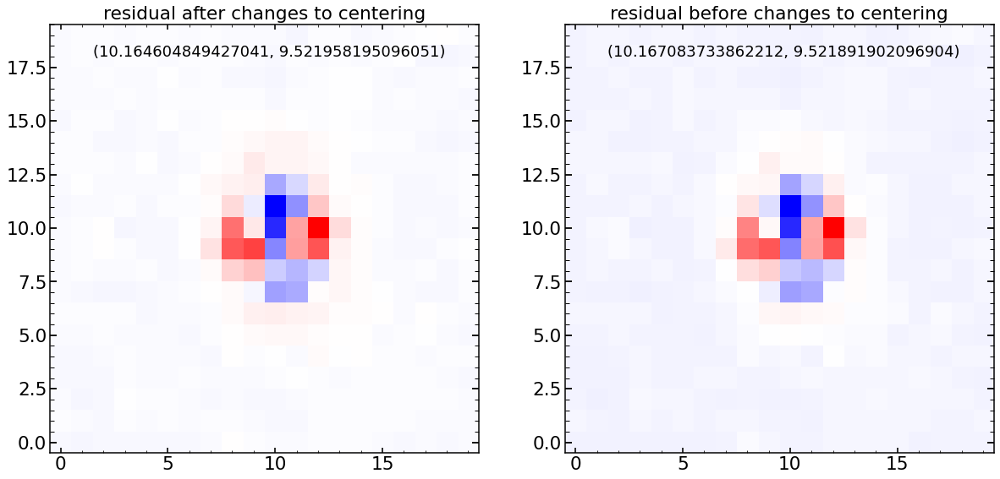

In [268]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title('residual after changes to centering')
plt.imshow(res_with_Image_True[1]-list_of_sci_images[index_of_single_image],cmap='bwr')
plt.text(x=1.5,y=18,s=str(find_centroid_of_flux(res_with_Image_True[1])))

plt.subplot(122)
plt.title('residual before changes to centering')
plt.imshow(res_with_Image_False[1]-list_of_sci_images[index_of_single_image],cmap='bwr')
plt.text(x=1.5,y=18,s=str(find_centroid_of_flux(res_with_Image_False[1])))

In [259]:
find_centroid_of_flux(res_with_Image_True[1])

(10.164604849427041, 9.521958195096051)

In [247]:
print(np.sum(res_with_Image[1]))
print(np.sum(list_of_sci_images[index_of_single_image]))

print(find_centroid_of_flux(res_with_Image[1]))
print(find_centroid_of_flux(list_of_sci_images[index_of_single_image]))

158007.03
156141.19
(10.164604849427041, 9.521958195096051)
(10.164604697332196, 9.521958064605068)


In [248]:
print(np.sum(res_with_Image[1]**2))
print(np.sum(res_with_Image[1]*list_of_sci_images[index_of_single_image]))

1345048400.0
1345048300.0


In [241]:
mask_image=list_of_mask_images[index_of_single_image]
sci_image=list_of_sci_images[index_of_single_image]

modelDotModel = np.sum(modelImg[inverted_mask]**2)
modelDotData = np.sum(modelImg[inverted_mask]*sci_image[inverted_mask])

In [239]:
inverted_mask=~mask_image.astype(bool)

In [242]:
modelDotModel

1304985900.0

In [274]:
from functools import partial
from scipy.interpolate import interp1d
DEFAULT_INTERPOLATOR = partial(interp1d, kind="linear", bounds_error=False, fill_value=0, copy=True,
                               assume_sorted=True)

def toArray(length, center, interpolator=DEFAULT_INTERPOLATOR):
    """Convert to an array at a nominated position
    Parameters
    ----------
    length : `int`
        Desired length of array.
    center : `float`
        Index position at which to insert the kernel.
    interpolator : callable, optional
        Interpolator factory. Calling this with arrays of ``x`` and ``y``
        should produce an interpolator that can be called with an array of
        ``x`` values at which to interpolate.
    Returns
    -------
    array : `numpy.ndarray`, floating-point, shape ``(length,)``
        Array containing inserted kernel.
    """
    return interpolator(indices + center, values)(np.arange(length))

In [275]:
plt.imshow(modelImg.toArray(20, (1,1), interpolator=DEFAULT_INTERPOLATOR))

AttributeError: 'numpy.ndarray' object has no attribute 'toArray'

# PIPE2D-778 (interpolation)

In [213]:
""" Python modules for Lanczos interpolation. """


import torch
import numpy as np


def lanczos_kernel(dx, a=3, N=None, dtype=None, device=None):
    '''
    Generates 1D Lanczos kernels for translation and interpolation.
    Args:
        dx : float, tensor (batch_size, 1), the translation in pixels to shift an image.
        a : int, number of lobes in the kernel support.
            If N is None, then the width is the kernel support (length of all lobes),
            S = 2(a + ceil(dx)) + 1.
        N : int, width of the kernel.
            If smaller than S then N is set to S.
    Returns:
        k: tensor (?, ?), lanczos kernel
    '''

    if not torch.is_tensor(dx):
        dx = torch.tensor(dx, dtype=dtype, device=device)

    if device is None:
        device = dx.device

    if dtype is None:
        dtype = dx.dtype

    D = dx.abs().ceil().int()
    S = 2 * (a + D) + 1  # width of kernel support

    S_max = S.max() if hasattr(S, 'shape') else S

    if (N is None) or (N < S_max):
        N = S

    Z = (N - S) // 2  # width of zeros beyond kernel support

    start = (-(a + D + Z)).min()
    end = (a + D + Z + 1).max()
    x = torch.arange(start, end, dtype=dtype, device=device).view(1, -1) - dx
    px = (np.pi * x) + 1e-3

    sin_px = torch.sin(px)
    sin_pxa = torch.sin(px / a)

    k = a * sin_px * sin_pxa / px**2  # sinc(x) masked by sinc(x/a)

    return k


def lanczos_shift(img, shift, p=3, a=3):
    '''
    Shifts an image by convolving it with a Lanczos kernel.
    Lanczos interpolation is an approximation to ideal sinc interpolation,
    by windowing a sinc kernel with another sinc function extending up to a
    few nunber of its lobes (typically a=3).
    Args:
        img : tensor (batch_size, channels, height, width), the images to be shifted
        shift : tensor (batch_size, 2) of translation parameters (dy, dx)
        p : int, padding width prior to convolution (default=3)
        a : int, number of lobes in the Lanczos interpolation kernel (default=3)
    Returns:
        I_s: tensor (batch_size, channels, height, width), shifted images
    '''

    dtype = img.dtype
    print(dtype)
    if len(img.shape) == 2:
        img = img[None, None].repeat(1, shift.shape[0], 1, 1)  # batch of one image
    elif len(img.shape) == 3:  # one image per shift
        assert img.shape[0] == shift.shape[0]
        img = img[None, ]

    # Apply padding

    padder = torch.nn.ReflectionPad2d(p)  # reflect pre-padding
    I_padded = padder(img)

    # Create 1D shifting kernels

    y_shift = shift[:, [0]]
    x_shift = shift[:, [1]]

    k_y = (lanczos_kernel(y_shift, a=a, N=None, dtype=dtype)
           .flip(1)  # flip axis of convolution
           )[:, None, :, None]  # expand dims to get shape (batch, channels, y_kernel, 1)
    k_x = (lanczos_kernel(x_shift, a=a, N=None, dtype=dtype)
           .flip(1)
           )[:, None, None, :]  # shape (batch, channels, 1, x_kernel)

    # Apply kernels
    k_y=k_y.to(device=None, dtype=torch.float)
    k_x=k_x.to(device=None, dtype=torch.float)

    I_s = torch.conv1d(I_padded,
                       groups=k_y.shape[0],
                       weight=k_y,
                       padding=[k_y.shape[2] // 2, 0])  # same padding
    I_s = torch.conv1d(I_s,
                       groups=k_x.shape[0],
                       weight=k_x,
                       padding=[0, k_x.shape[3] // 2])

    I_s = I_s[..., p:-p, p:-p]  # remove padding

    return I_s.squeeze()  # , k.squeeze()

In [214]:
def transform(theta, I, device="cpu"):
    '''
    Shifts images I by theta with Lanczos interpolation.
    Args:
        theta : tensor (B, 2), translation params
        I : tensor (B, C_in, H, W), input images
    Returns:
        out: tensor (B, C_in, W, H), shifted images
    '''


    new_I = lanczos.lanczos_shift(img=I.transpose(0, 1),
                                  shift=theta.flip(-1),  # (dx, dy) from register_batch -> flip
                                  a=3, p=5)[:, None]
    return new_I

tensor([[0.0000, 0.1200]], dtype=torch.float64)

torch.float32


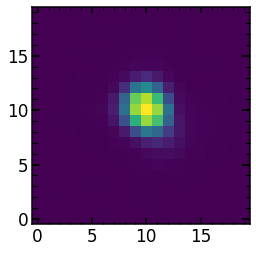

In [222]:
plt.imshow(x_image.numpy()[0][0])

In [304]:
# inpu image, move to torch shape
x_image = torch.reshape(torch.tensor(list_of_sci_images[4], dtype=None, device=None), [1, 1, 20, 20])
print(type(list_of_sci_images[4][0][0]))

# wanted shift in dy, dx (note that dy is first)
shift=np.array([0.1,0.00])
shift = torch.reshape(torch.tensor(shift, dtype=None, device=None),[1,2])

# new image, but hidden in torch shape
new_I = lanczos_shift(img=x_image,shift=shift,a=5, p=3)[:, None]

# move to array, it must be a better way to do it 
list_of_new_I=[]
for i in range(20):
    list_of_new_I.append(new_I.numpy()[i,:,:][0])   
array_of_new_I=np.array(list_of_new_I)

<class 'numpy.float32'>
torch.float32


old center: (9.068879908782982, 8.980777776529031)
new center: (9.068475237286687, 9.098409531131502)
offset: [-0.00031777  0.11792407]
shift: tensor([[0.1000, 0.0000]], dtype=torch.float64)


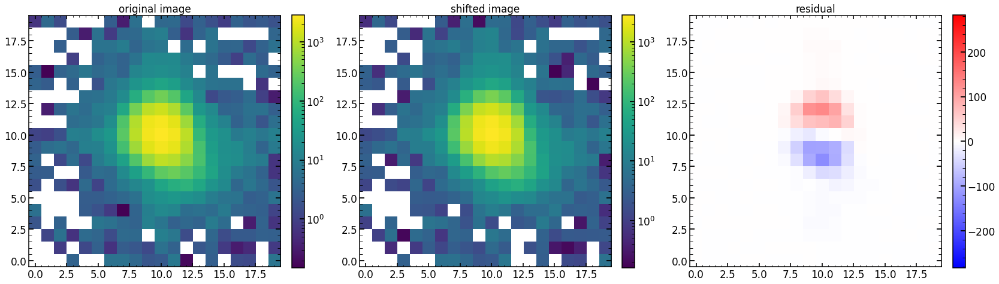

In [270]:
plt.figure(figsize=(28,10))

plt.subplot(131)
plt.imshow(x_image.numpy()[0][0],norm=LogNorm())
plt.title('original image')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(array_of_new_I,norm=LogNorm())
plt.title('shifted image')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(array_of_new_I-x_image.numpy()[0][0],cmap='bwr',vmax=np.max(array_of_new_I)/10,vmin=-np.max(array_of_new_I)/10)
plt.title('residual')
cbar=plt.colorbar(fraction=0.046, pad=0.04)


print('old center: '+str(find_centroid_of_flux((x_image.numpy()[0][0])[1:19,1:19])))
print('new center: '+str(find_centroid_of_flux(array_of_new_I[1:19,1:19])))
print('offset: '+str(np.array(find_centroid_of_flux(array_of_new_I))-np.array(find_centroid_of_flux(x_image.numpy()[0][0]))))
print('shift: '+str(shift))

In [234]:
np.array(find_centroid_of_flux(array_of_new_I))-np.array(find_centroid_of_flux(x_image.numpy()[0][0]))

array([0.14507154, 0.0242622 ])

In [39]:
x_image.shape

torch.Size([1, 1, 20, 20])

In [105]:
p=3
img=x_image

padder = torch.nn.ReflectionPad2d(p)  # reflect pre-padding
I_padded = padder(img)

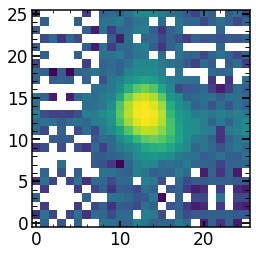

In [107]:
# padded with 3 pixels on the side
plt.imshow(I_padded.numpy()[0][0],norm=LogNorm())

In [45]:
y_shift = shift[:, [0]]
x_shift = shift[:, [1]]
print(x_shift,y_shift)

tensor([[0.1200]], dtype=torch.float64) tensor([[0.0200]], dtype=torch.float64)


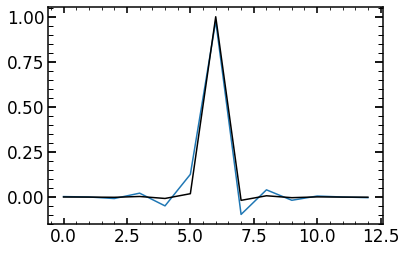

In [66]:
a=5
dtype=None
k_y = (lanczos_kernel(y_shift, a=a, N=None, dtype=dtype)
       .flip(1)  # flip axis of convolution
       )[:, None, :, None]  # expand dims to get shape (batch, channels, y_kernel, 1)
k_x = (lanczos_kernel(x_shift, a=a, N=None, dtype=dtype)
       .flip(1)
       )[:, None, None, :]  # shape (batch, channels, 1, x_kernel)

plt.plot(k_x.numpy()[0][0][0])
plt.plot(k_y.numpy()[0][0].T[0],color='black')

In [68]:
print(k_y.shape[0])

print(k_x.shape[0])

1
1


In [70]:
k_y=k_y.to(device=None, dtype=torch.float)
k_x=k_x.to(device=None, dtype=torch.float)

I_s = torch.conv1d(I_padded,
                       groups=k_y.shape[0],
                       weight=k_y,
                       padding=[k_y.shape[2] // 2, 0]) 

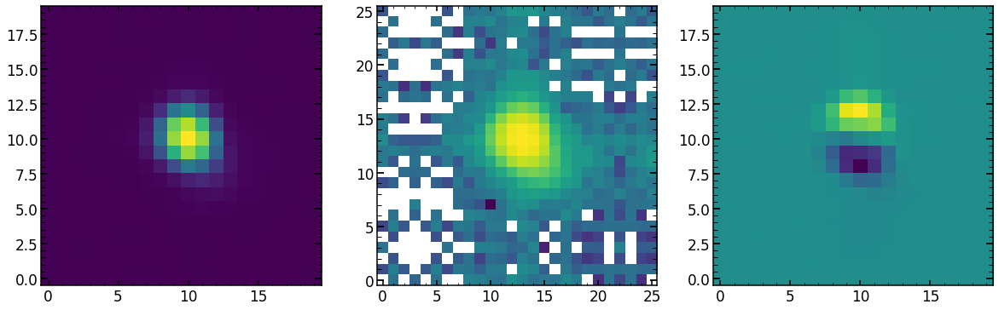

In [103]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(x_image.numpy()[0][0])

plt.subplot(132)
plt.imshow(I_s.numpy()[0][0],norm=LogNorm())

plt.subplot(133)
plt.imshow(I_s.numpy()[0][0][3:23,3:23]-x_image.numpy()[0][0])

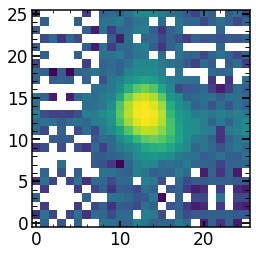

In [104]:
plt.imshow(I_padded.numpy()[0][0],norm=LogNorm())


In [180]:
k_y_padded=np.pad(k_y.numpy()[0][0].T[0], (6, 7), 'constant', constant_values=(0, 0))
k_y_padded.shape

(26,)

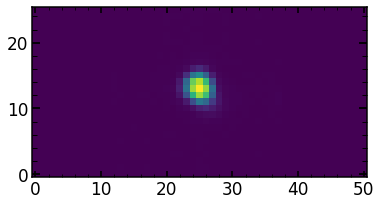

In [183]:
scipy_convolution_after_ky_2d=[]
for i in range(26):
    scipy_convolution_after_ky_1d=scipy.signal.convolve(I_padded.numpy()[0][0][i],k_y_padded)
    scipy_convolution_after_ky_2d.append(scipy_convolution_after_ky_1d)
    
scipy_convolution_after_ky_2d=np.array(scipy_convolution_after_ky_2d)

plt.imshow(scipy_convolution_after_ky_2d)

(10.0815182411937, 9.979462496121158)
(10.058141293700825, 9.979428818474744)


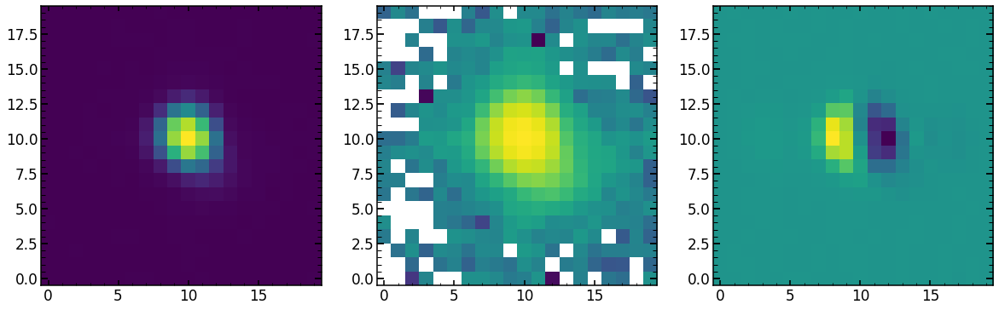

In [184]:
print(find_centroid_of_flux(x_image.numpy()[0][0]))
print(find_centroid_of_flux(scipy_convolution_after_ky_2d[3:23,15:35]))

plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(x_image.numpy()[0][0])

plt.subplot(132)
plt.imshow(scipy_convolution_after_ky_2d[3:23,15:35],norm=LogNorm())

plt.subplot(133)
plt.imshow(scipy_convolution_after_ky_2d[3:23,15:35]-x_image.numpy()[0][0])

In [160]:
k_y.numpy()[0][0].T

array([[ 0.00050569,  0.00001561, -0.0011811 ,  0.00336508, -0.00756067,
         0.01881919,  0.99933743, -0.01799667,  0.00732748, -0.00325168,
         0.00111931,  0.00001536, -0.00051639]], dtype=float32)

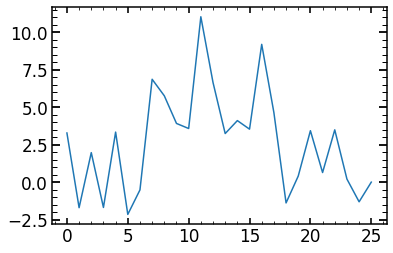

In [153]:
plt.plot(scipy_convolution_after_ky[13:39])

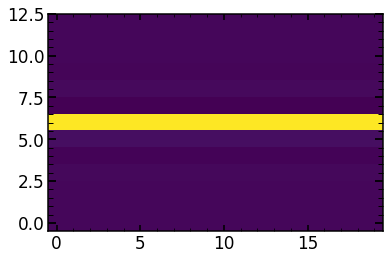

In [100]:
plt.imshow(ky2d)

In [91]:
I_padded.shape

torch.Size([1, 1, 26, 26])

In [111]:
from astropy.io import fits

In [130]:
data=fits.open('/Volumes/Saturn_USA/PFS/LAM/ReducedData/PFSA04663511.fits')

Text(0.5, 1.0, 'flux at y=800, 5 sec exposure, blue flat, 120V_4lamps, expid=46635')

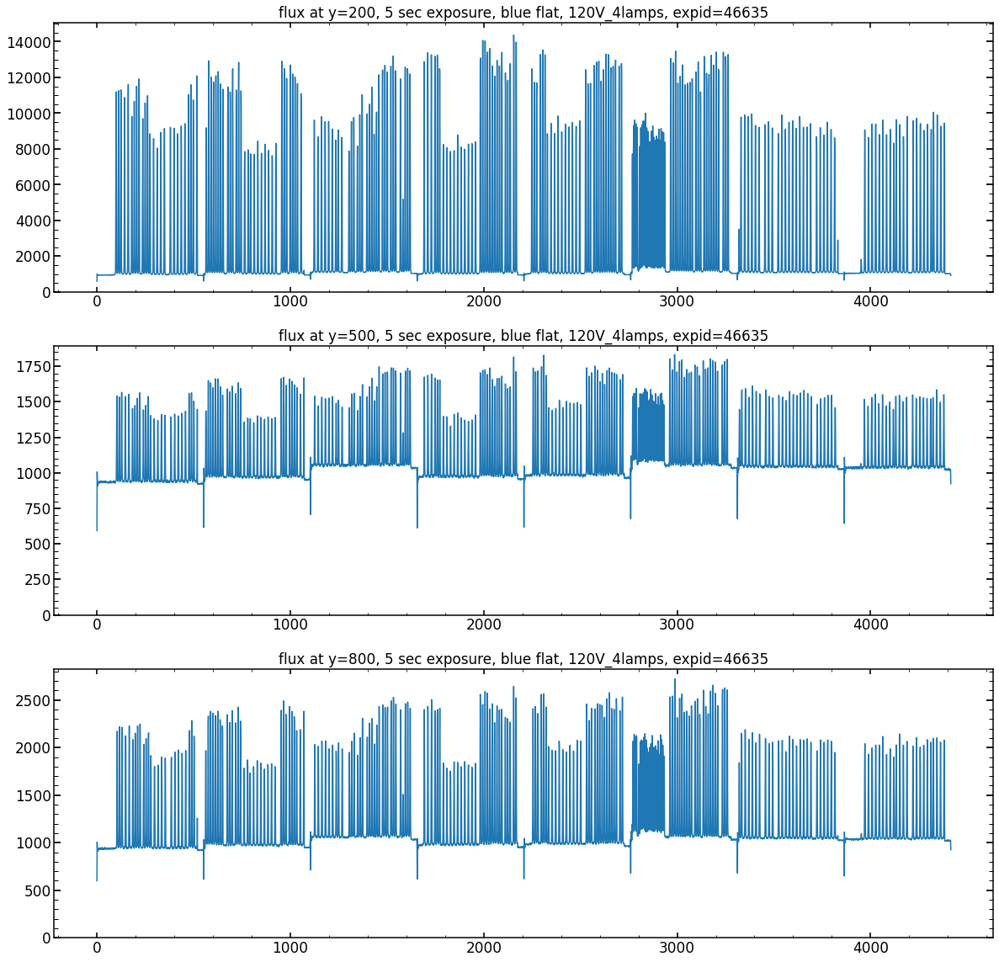

In [140]:
plt.figure(figsize=(20,20))
plt.subplot(311)
plt.plot(data[1].data[3600])
plt.ylim(0)
plt.title('flux at y=200, 5 sec exposure, blue flat, 120V_4lamps, expid=46635')

plt.subplot(312)
plt.plot(data[1].data[500])
plt.ylim(0)
plt.title('flux at y=500, 5 sec exposure, blue flat, 120V_4lamps, expid=46635')

plt.subplot(313)
plt.plot(data[1].data[800])
plt.ylim(0)
plt.title('flux at y=800, 5 sec exposure, blue flat, 120V_4lamps, expid=46635')

In [281]:
5775-1275-1461

3039

In [271]:
594.97+81.42+348.12+210.22+22.09+1.44+1.01+16.17

1275.44

In [295]:
(5775-1461)*0.296

1276.944

In [296]:
7083-(7083-1461)*0.296-1461

3957.888

In [285]:
497-39

458

In [286]:
458*12

5496

In [303]:
(0.623*15700)/1215700*0.093/12

815.0916666666667

In [290]:
(7083-5775)*0.7

915.5999999999999

# Jun 15, LAM images 

## scripts

In [42]:
finalAr_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

### first run 

In [43]:
list_of_Ne_to_analyze=finalNe_Feb2020_dataset[finalNe_Feb2020_dataset['close']=='1'].index
list_of_Ne_to_analyze

Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],
           dtype='int64')

In [134]:
date='Jun1521'

for single_spot in list_of_Ne_to_analyze:
    if str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0' or str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ne_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 5:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 27713 27677 27719 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 8 -dataset 7 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ne_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ne_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [ ]:
 python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 27713 27677 27719 -spot 11 -nsteps 9 -eps 8 -dataset 7 

In [ ]:
-arc Ne -double_sources False -double_sources_positions_ratios [0.0,0.0] -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output Jun1521 -analysis_type defocus 

### second run 

In [46]:
list_of_Ne_to_analyze=finalNe_Feb2020_dataset[finalNe_Feb2020_dataset['close']=='0'].index
list_of_Ne_to_analyze

Int64Index([ 0,  3,  8,  9, 12, 17, 18, 21, 26, 27, 30, 35, 36, 39, 44, 45, 48,
            53, 54, 57, 62, 63, 66, 71, 72, 75, 80, 81, 84, 89],
           dtype='int64')

In [47]:
date='Jun1521'

for single_spot in list_of_Ne_to_analyze:
    if str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0' or str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ne_2_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 5:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 27713 27677 27719 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 8 -dataset 7 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ne_2_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ne_2_'+str(single_spot)+date+'.sh \n')

file.close()

### third run

In [49]:
# first repetition, some that failed in first version



date='Jun1521'

for single_spot in [5,77]:
    if str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0' or str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ne_3_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 5:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 27713 27677 27719 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 8 -dataset 7 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ne_3_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in [5,77]:
    file.write('sbatch /home/ncaplar/Scripts/T_Ne_3_'+str(single_spot)+date+'.sh \n')

file.close()

## which are avaliable 

In [57]:
#date='May2921'

date='Jun1521'
ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*KrSwarm1.npy', recursive=True)

In [58]:
eps_value=8

analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 

analyzed_Ar_images=np.array(analyzed_Ar_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [59]:
print(analyzed_Ar_images)
print(analyzed_Neon_images)
print(analyzed_Kr_images)

[]
[['27719' '11' 'Ne']
 ['27719' '14' 'Ne']
 ['27719' '15' 'Ne']
 ['27719' '20' 'Ne']
 ['27719' '23' 'Ne']
 ['27719' '24' 'Ne']
 ['27719' '2' 'Ne']
 ['27719' '29' 'Ne']
 ['27719' '33' 'Ne']
 ['27719' '38' 'Ne']
 ['27719' '41' 'Ne']
 ['27719' '42' 'Ne']
 ['27719' '56' 'Ne']
 ['27719' '60' 'Ne']
 ['27719' '65' 'Ne']
 ['27719' '68' 'Ne']
 ['27719' '6' 'Ne']
 ['27719' '69' 'Ne']
 ['27719' '74' 'Ne']
 ['27719' '78' 'Ne']]
[]


In [60]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:0 / analyzed_Ne_images:20 / analyzed_Kr_images:0


## single image analysis 

In [65]:
#date='May2821'
date='Jun1521'

single_number='11'
image_index=int(single_number)
eps=8
arc='Ne'
dataset=7



if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=27719
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr

wavelength=float(finalArc.iloc[int(single_number)]['wavelength'])
wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_short_with_focus=['m4','0','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   63
xc                     461
yc                     443
wavelength        660.0668
close                    1
lamp                    Ne
xc_effective           461
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 11, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_May_21_2021/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [27713, 27677, 27719]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 27719
double_sources_positions_ratios for this spot is: [0 0]


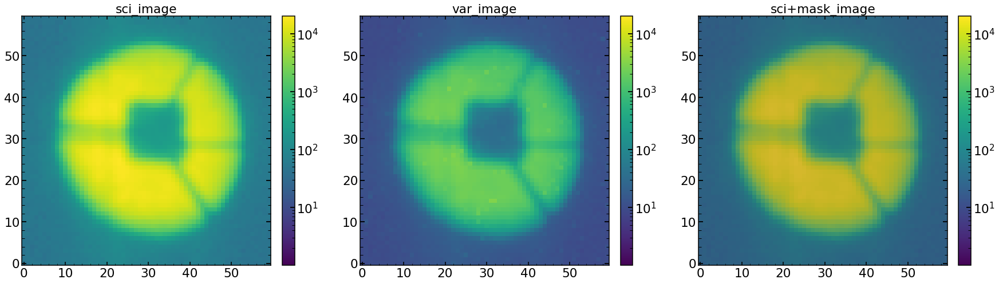

In [66]:
single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
single_analysis.create_basic_data_image()

In [68]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719118NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719118NeSwarm1.npy
(41, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719118NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 10.881994088490805
average chi2 reduced is: -5.390036008297381


### chain analysis 

In [142]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719208Neres_gbests_position.npy
(41, 129)


array([    -7.35121874,      1.37956907,      0.15735764,      0.49081777,
            0.00620007,      0.06102968,      0.02349005,      0.27589725,
            0.05265789,      0.37640951,      0.00116933,     -0.04371053,
            0.05373078,     -0.35253823,     -0.16210038,     -0.13764694,
            0.01525085,      0.02986315,     -0.01005968,     -0.10203428,
            0.0138551 ,     -0.04260136,      0.02300513,      0.02718155,
           -0.0218385 ,     -0.00039588,      0.00006083,      0.00879791,
           -0.01758102,     -0.05204481,     -0.00955859,     -0.0050675 ,
            0.00907365,      0.01344165,     -0.002135  ,      0.01393256,
           -0.07452886,     -0.00579638,      0.69566283,      0.07130865,
           -0.13537794,     -0.129201  ,      0.06028375,     -0.00191211,
            0.36916707,      0.22352026,      0.1199761 ,     10.23531383,
           -0.01730898,     -0.00458019,      0.90017622,      0.01624005,
            0.90927372,  

Text(0, 0.5, 'par_1')

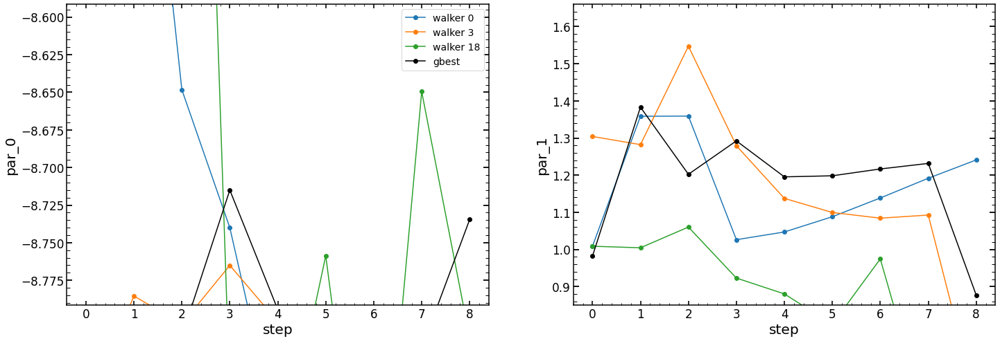

In [105]:
# wavefront paramter
plt.figure(figsize=(24,8))
i=0*2
plt.subplot(121)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(122)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))

Text(0.5, 1.0, 'par_46 / wide_43')

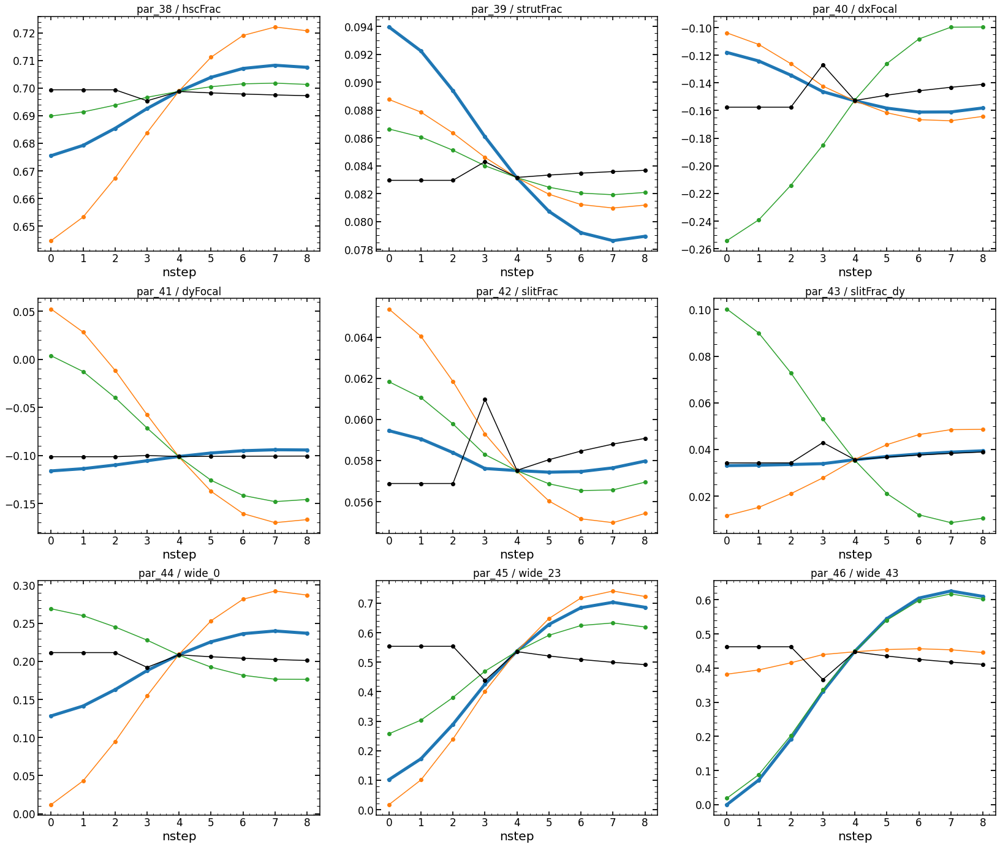

In [106]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

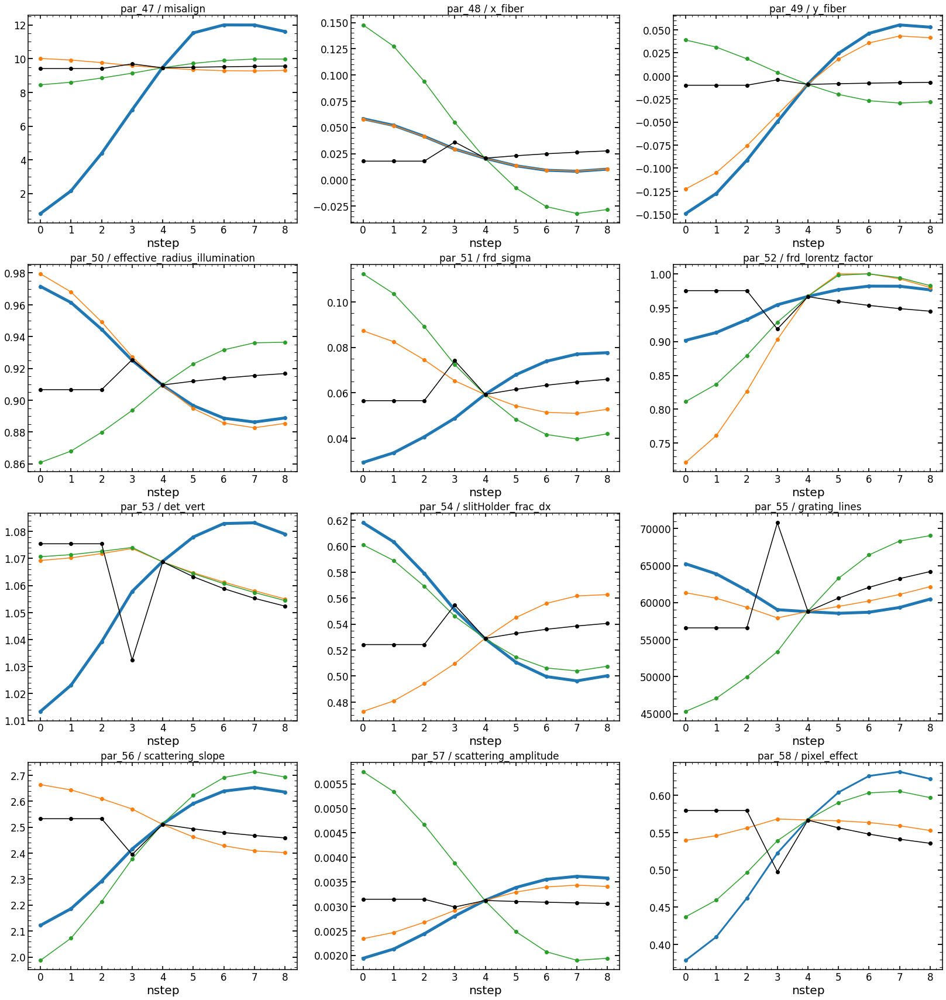

In [107]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

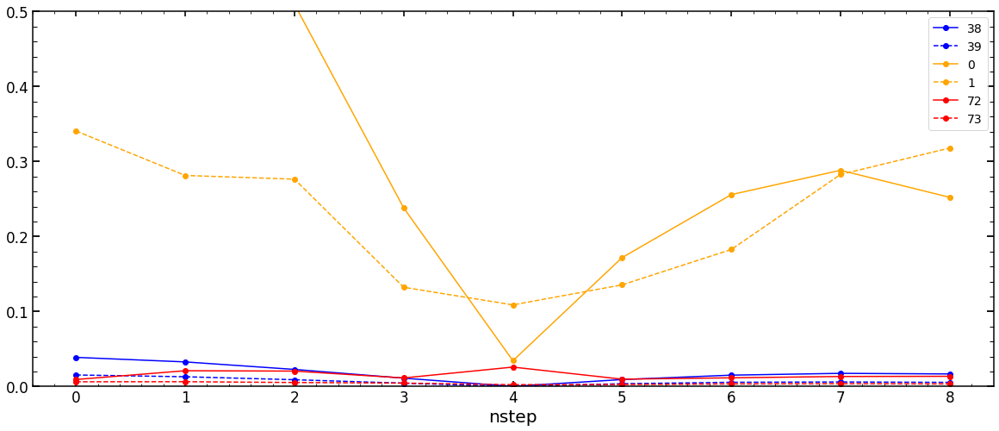

In [108]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

In [109]:
i1

38

(0.08169848170283266, 0.08546354165613458)

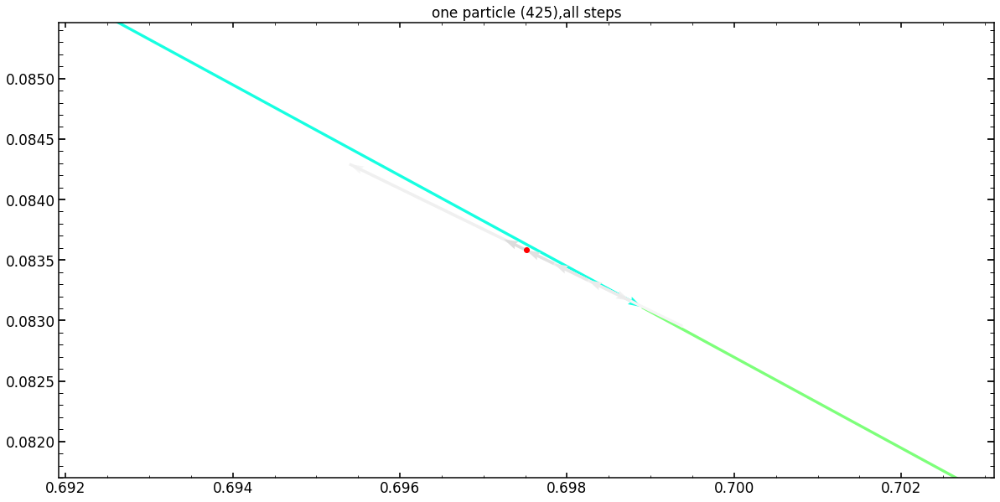

In [110]:
nsteps=chain0_swarm_1.shape[0]


j=0
n_particle=425
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle ('+str(n_particle)+'),all steps')

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors)
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,ls='--')
plt.scatter(X_best[-1],Y_best[-1],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.xlim(X_best[-1]-3*delta_X,X_best[-1]+3*delta_X)
plt.ylim(Y_best[-1]-3*delta_Y,Y_best[-1]+3*delta_Y)

Text(0, 0.5, 'parameter: 39')

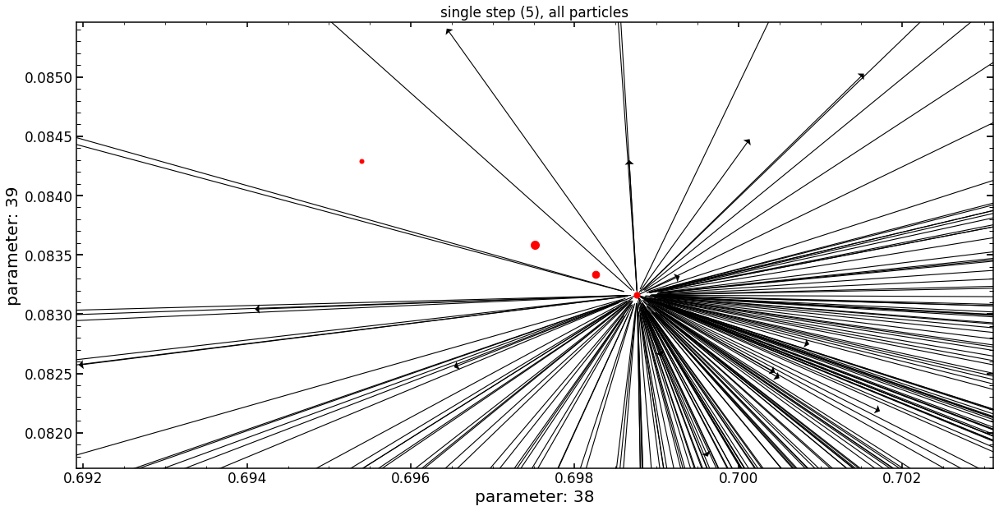

In [111]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

In [112]:
X[0:number_of_particles_shown]

array([0.69884782, 0.6988986 , 0.69900458, 0.69896715, 0.69870525,
       0.69895778, 0.69900774, 0.69894403, 0.69861547, 0.69901635,
       0.69900453, 0.69869713, 0.698858  , 0.69889973, 0.69903487,
       0.69881647, 0.69886094, 0.69873364, 0.69879209, 0.69891426,
       0.69888513, 0.69897526, 0.69885357, 0.69876837, 0.69876783,
       0.69877215, 0.69864331, 0.69900902, 0.69854794, 0.69903074,
       0.6990679 , 0.69894619, 0.6988773 , 0.69863311, 0.6988028 ,
       0.69869657, 0.6987734 , 0.69901274, 0.69890342, 0.69908539,
       0.69891741, 0.698642  , 0.69904999, 0.69897435, 0.69879118,
       0.69871784, 0.69865775, 0.69871302, 0.69899324, 0.69891261,
       0.69878879, 0.69904057, 0.69893182, 0.69879466, 0.69898944,
       0.69890333, 0.69858069, 0.69894818, 0.69876528, 0.69876203,
       0.69853976, 0.69900201, 0.6986207 , 0.69859699, 0.6989898 ,
       0.69890817, 0.69891356, 0.69882753, 0.69880429, 0.69890411,
       0.69872556, 0.69889846, 0.69860612, 0.69875407, 0.69890

In [113]:
 U

array([ 0.00505641,  0.00810633,  0.01447258,  0.01222436, -0.00350786,
        0.01166142,  0.01466267,  0.01083534, -0.0089006 ,  0.01517951,
        0.01446982, -0.00399538,  0.00566776,  0.00817435,  0.0162921 ,
        0.00317338,  0.00584411, -0.00180209,  0.00170862,  0.00904708,
        0.00729725,  0.01271119,  0.0054016 ,  0.00028384,  0.00025158,
        0.00051111, -0.00722847,  0.01473945, -0.01295705,  0.01604369,
        0.01827613,  0.01096541,  0.00682715, -0.00784088,  0.00235209,
       -0.00402892,  0.00058584,  0.01496298,  0.00839623,  0.01932679,
        0.00923657, -0.00730705,  0.01720045,  0.0126565 ,  0.00165401,
       -0.00275118, -0.00636094, -0.00304093,  0.01379153,  0.00894831,
        0.00151069,  0.01663417,  0.01010201,  0.00186278,  0.01356309,
        0.00839071, -0.01098978,  0.01108498,  0.00009824, -0.00009704,
       -0.01344814,  0.0143179 , -0.0085864 , -0.01001079,  0.01358455,
        0.00868142,  0.00900512,  0.00383718,  0.00244132,  0.00

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719118NeSwarm1.npy
(9, 480, 129)
minimal likelihood is: 20.74847650527954
average chi2 reduced is: -5.326300506834132
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719118NeSwarm1.npy
(9, 480, 129)


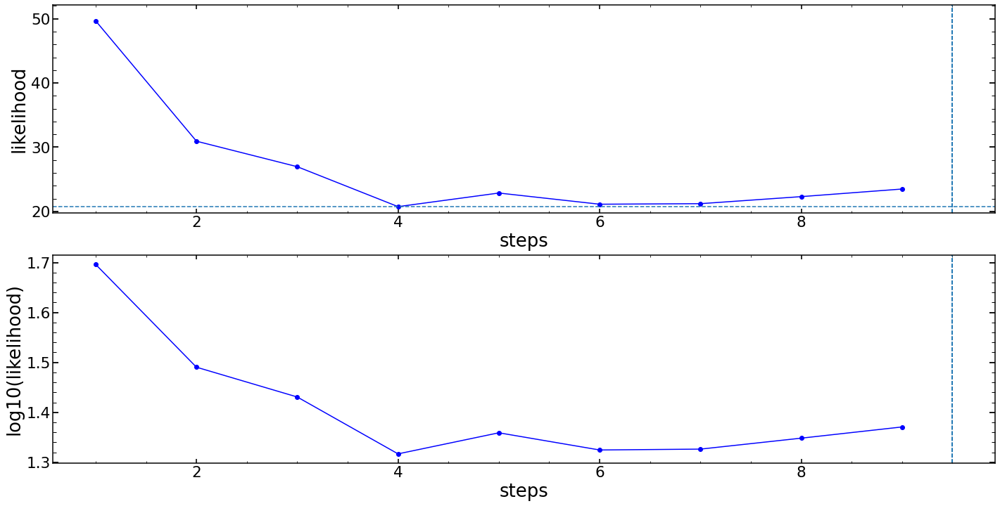

In [114]:
single_analysis.create_fitting_evolution_plot()

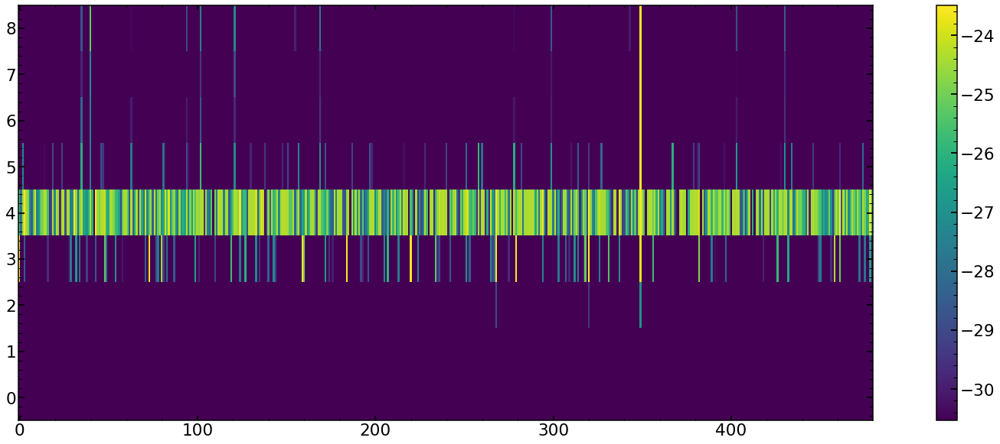

In [115]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()

In [116]:
list_of_which_particle_is_gbest=[]
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,38]==gbests_positions[i][38])[0][0]])

In [322]:
list_of_which_particle_is_gbest

[[0, 419],
 [1, 419],
 [2, 0],
 [3, 464],
 [4, 223],
 [5, 404],
 [6, 419],
 [7, 419],
 [8, 419],
 [9, 419],
 [10, 419],
 [11, 312],
 [12, 263],
 [13, 74],
 [14, 419],
 [15, 419],
 [16, 419],
 [17, 419],
 [18, 457],
 [19, 261],
 [20, 325]]

### image analysis 

In [73]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
#                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 50.76966
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 10.636986
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
scipy.__version__1.5.0
Zernike_Module.__version__0.46e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   29.74262168    -0.24768378     1.03998326    -0.16734893
     0.64149104    -0.07736883    -0.3114658     -0.2325135
    -0.21178052    -0.0184087     -0.0923327     -0.04096538
     0.02679194    -0.00001739    -0.04136809     0.06020547
    -0.09981003    -0.00579238     0.03734281     0.66423653
     0.09606095    -0.0719305     -0.15256821     0.06596439
    -0.01579325     0.25777805     0.04407993     

chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.87332956 -18.45520978] / 13.992486
chi2 within shgo with use_only_chi True and use_center_of_light False [1.87332956 1.54479022] / 45.500443
chi2 within shgo with use_only_chi True and use_center_of_light False [  2.49832956 -17.20520978] / 22.772392
chi2 within shgo with use_only_chi True and use_center_of_light False [12.49832956  2.79479022] / 45.807243
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.49832956 -27.20520978] / 29.982231
chi2 within shgo with use_only_chi True and use_center_of_light False [ 7.49832956 -7.20520978] / 26.11773
chi2 within shgo with use_only_chi True and use_center_of_light False [ 10.62332956 -15.95520978] / 13.307455
chi2 within shgo with use_only_chi True and use_center_of_light False [ 10.62332957 -15.95520978] / 13.307457
chi2 within shgo with use_only_chi True and use_center_of_light False [ 10.62332956 -15.9552098 ] / 13.307457
chi2 within shgo wi

chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.58867491 -16.4228112 ] / 13.0111685
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.59864133 -16.39626777] / 13.011477
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.59055197 -16.43333246] / 13.011144
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.59969899 -16.42966519] / 13.011152
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.59694297 -16.42795169] / 13.011122
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.589673   -16.44214023] / 13.01122
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.5957847 -16.424893 ] / 13.011113
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.6021757  -16.41951223] / 13.01119
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.5934579  -16.42987741] / 13.01112
chi2 within sh

Time to apodize the pupil: 0.14301586151123047
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3099498748779297
Time for pupil and illumination calculation is 0.31624794006347656

Starting creation of wavefront
diam_sic [m]: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 1.140100638821581, 0.5651979126987532, 0.34658186984907263, 0.11570776403806916, 0.6560391373434248, 0.037904717484431784, -0.3123510285249969, 0.0009063158451433199, -0.019081853316439103, -0.06865034796948699, -0.0316009471111714, 0.03541182163159886, -0.04575058289649718, 0.014240886631985528, -0.02050780690896396, 0.017433080283258944, -0.032768504737270464, -0.004879258381814696, -0.021387989047460858, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.5651979126987532, 0.34658186984907263, 0.11

Finished with optPsf_postprocessing
 
Image in focus, using pipeline normalization; multiplying all values in the model by 1.0023215
Finished with lnlike_Neven
chi_almost/d.o.f is 1.7184901; chi_almost_max_dof is 59.060383 log(improvment) is -1.5361493
The likelihood reported is: -1.7184901237487793
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4432037312
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4432037312 is: 4.703129053115845 seconds
 
################################
analyzing image 3 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 44.130363
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 9.49195
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dith

chi2 within shgo with use_only_chi True and use_center_of_light False [-9.15748289  4.69606403] / 12.1223955
chi2 within shgo with use_only_chi True and use_center_of_light False [-19.15748289  24.69606403] / 43.288437
chi2 within shgo with use_only_chi True and use_center_of_light False [-18.53248289   5.94606403] / 22.074661
chi2 within shgo with use_only_chi True and use_center_of_light False [-8.53248289 25.94606403] / 43.282005
chi2 within shgo with use_only_chi True and use_center_of_light False [-3.53248289 -4.05393597] / 29.817808
chi2 within shgo with use_only_chi True and use_center_of_light False [-13.53248289  15.94606403] / 22.901316
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.40748289   7.19606403] / 10.323795
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.40748291   7.19606403] / 10.323795
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.40748289   7.19606405] / 10.323795
chi2 within shg

We are fitting for only one source
One source fitting result is [-10.04506378   7.19268569]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.8316338062286377
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.988455679596343
Finished with lnlike_Neven
chi_almost/d.o.f is 14.037545; chi_almost_max_dof is 188.41197 log(improvment) is -1.1278173
The likelihood reported is: -14.037545204162598
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4432037312
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4432037312 is

In [101]:
len(list_of_var_images[0:3:2])

2

In [102]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images[0:3:2],list_of_var_images[0:3:2],list_of_mask_images=list_of_mask_images[0:3:2],
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
#                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 2
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 50.76966
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 10.636986
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
scipy.__version__1.5.0
Zernike_Module.__version__0.46e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   29.98840861     0.72234261    -0.7606894     -0.03694191
    -0.35646711    -0.0717755     -0.46098658    -0.1417688
    -0.23161646     0.14542736     0.00125992     0.09182945
    -0.05946332     0.0569271      0.06536218    -0.01218156
    -0.02961735    -0.03390991     0.19128598     0.66977746
     0.07021187     0.09692393    -0.09725613     0.05007632
    -0.02863634     0.12473708     0.18426145     

chi2 within shgo with use_only_chi True and use_center_of_light False [-19.2537506  -36.58583843] / 84.850105
chi2 within shgo with use_only_chi True and use_center_of_light False [-29.2537506  -16.58583843] / 81.0954
chi2 within shgo with use_only_chi True and use_center_of_light False [-19.8787506  -17.83583843] / 74.56834
chi2 within shgo with use_only_chi True and use_center_of_light False [-19.87875061 -17.83583843] / 74.56834
chi2 within shgo with use_only_chi True and use_center_of_light False [-19.8787506  -17.83583844] / 74.56834
chi2 within shgo with use_only_chi True and use_center_of_light False [-19.8787506  -17.83583843] / 74.56834
chi2 within shgo with use_only_chi True and use_center_of_light False [-20.87268813 -17.83583843] / 74.96055
chi2 within shgo with use_only_chi True and use_center_of_light False [-19.8787506  -18.72763035] / 74.4104
chi2 within shgo with use_only_chi True and use_center_of_light False [-18.88481307 -18.72763035] / 74.07253
chi2 within shgo wit

chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22148921 -20.09308497] / 73.384384
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22156389 -20.09320287] / 73.384384
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22125894 -20.09289827] / 73.38439
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22148765 -20.09312672] / 73.38439
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22141141 -20.09305057] / 73.384384
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22144875 -20.09310952] / 73.384384
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22129627 -20.09295722] / 73.384384
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22141063 -20.09307145] / 73.384384
chi2 within shgo with use_only_chi True and use_center_of_light False [-15.22137251 -20.09303337] / 73.38439
chi2 within s

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.00036215782165527344
Time for FFT is 0.34258008003234863
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 2971
optPsf_cut.shape(2972, 2972)
oversampling:10
optPsf_cut.shape[0]2972
size_of_optPsf_cut_downsampled: 840
optPsf_cut_downsampled.shape: (841, 841)
size_of_optPsf_cut_in_Microns: 1261.5
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[63845.9916316557, 2.061276139008804, 0.0015487959273454868, 0.3791964779430418, 1.83072273169046]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(841, 841)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
Time for postprocessing up to single_Psf_position protocol is 0.8230330944061279

chi2 within shgo with use_only_chi True and use_center_of_light False [-11.00091489   3.31866496] / 62.421436
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.99968392   3.33937101] / 62.421375
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.99792091   3.33393713] / 62.42142
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.00021204   3.33487374] / 62.42138
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.99868462   3.33424933] / 62.4214
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.99983019   3.33471764] / 62.42137
chi2 within shgo with use_only_chi True and use_center_of_light False [-11.00030137   3.34433659] / 62.421383
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.9994849    3.33339819] / 62.42138
chi2 within shgo with use_only_chi True and use_center_of_light False [-10.99975705   3.33704432] / 62.42137
chi2 within shgo 

In [74]:
#index_of_single_image=8
#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
#                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

In [75]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [76]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(len(list_of_sci_images)):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [ -962.19946289 -1484.04882812 -1133.98498535]


'model pixels with a flux larger than (quantile_08_focus): 92.14530029296898'

In [77]:
np.ones(len(list_of_sci_images))

array([1., 1., 1.])

mean reported value:-10.882630825042725
array_of_single_res: [-16.89185715  -1.71849012 -14.0375452 ]
renormalization factors: [1. 1. 1.]
array_of_single_res renormalized: [-16.89185715  -1.71849012 -14.0375452 ]


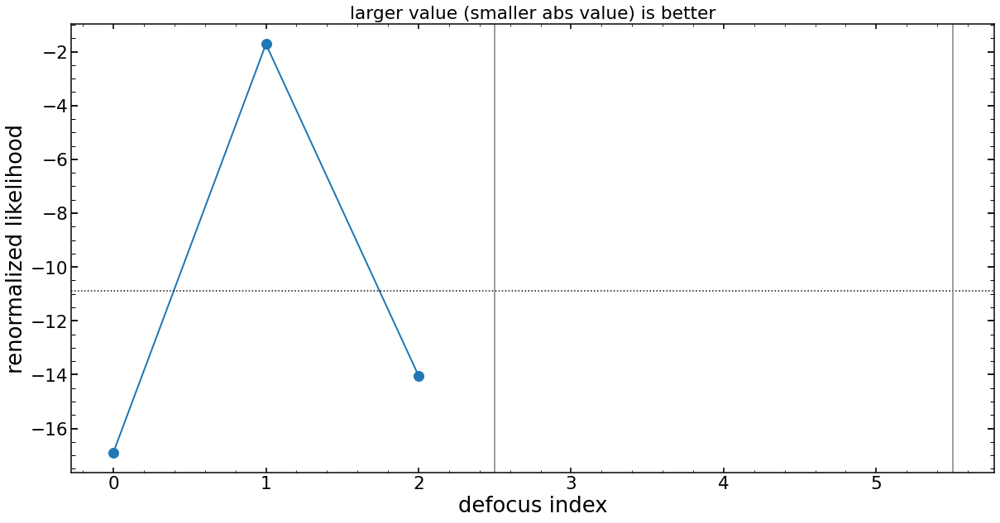

In [78]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.ones(len(list_of_sci_images))


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [79]:
minchain=list_of_minchain[1]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0  1.140101  0.565198  0.346582  0.115708  0.656039  0.037905 -0.312351   

        z11  
0  0.000906  
##############################################
        z12      z13       z14       z15       z16       z17       z18  \
0 -0.019082 -0.06865 -0.031601  0.035412 -0.045751  0.014241 -0.020508   

        z19       z20       z21       z22  
0  0.017433 -0.032769 -0.004879 -0.021388  

##############################################
    hscFrac  strutFrac  dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.664237   0.096061 -0.07193 -0.152568  0.065964    -0.015793
##############################################
     wide_0  wide_23   wide_43  misalign
0  0.257778  0.04408  0.052237   0.39358
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.116133 -0.085924                       0.991093   0.107014   

   frd_lorentz_factor  
0  

(-1.5, -0.5)

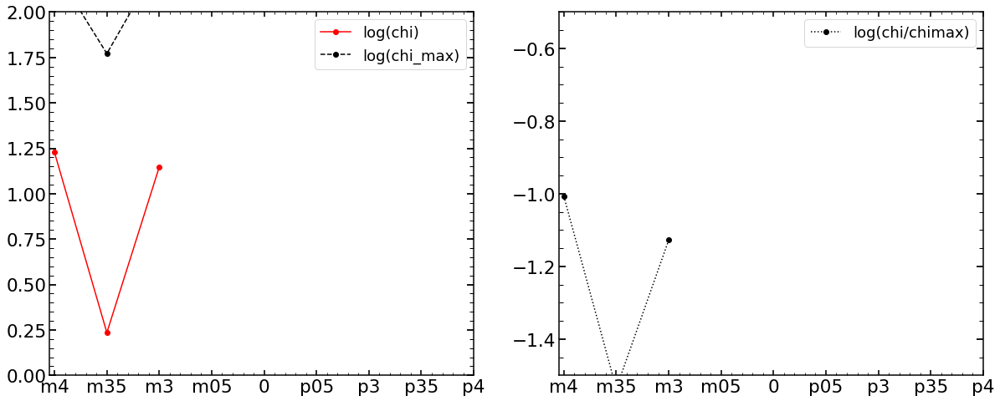

In [80]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

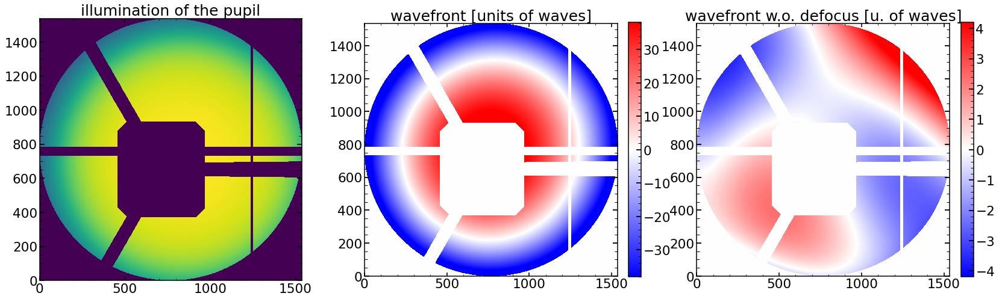

In [81]:
# save has to be save=1 for this to update
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 50.76966
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 10.636986
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
scipy.__version__1.5.0
Zernike_Module.__version__0.46e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 179.8275375366211
---------------------
chi**2 max reduced is: 22456.312
chi**2 reduced is: 327.10522 for log improvment: -1.836651
chi max reduced is: 106.39911
chi reduced is: 12.994454 for log improvment: -0.91317993
---------------------
chi**2 reduced within custom mask area is: 327.1052
---------------------
chi**2 max reduced within flux mask area is: 37279.9
chi**2 reduced within flux mask area is: 505.6261 for log improvment: -1.8676453
chi max 

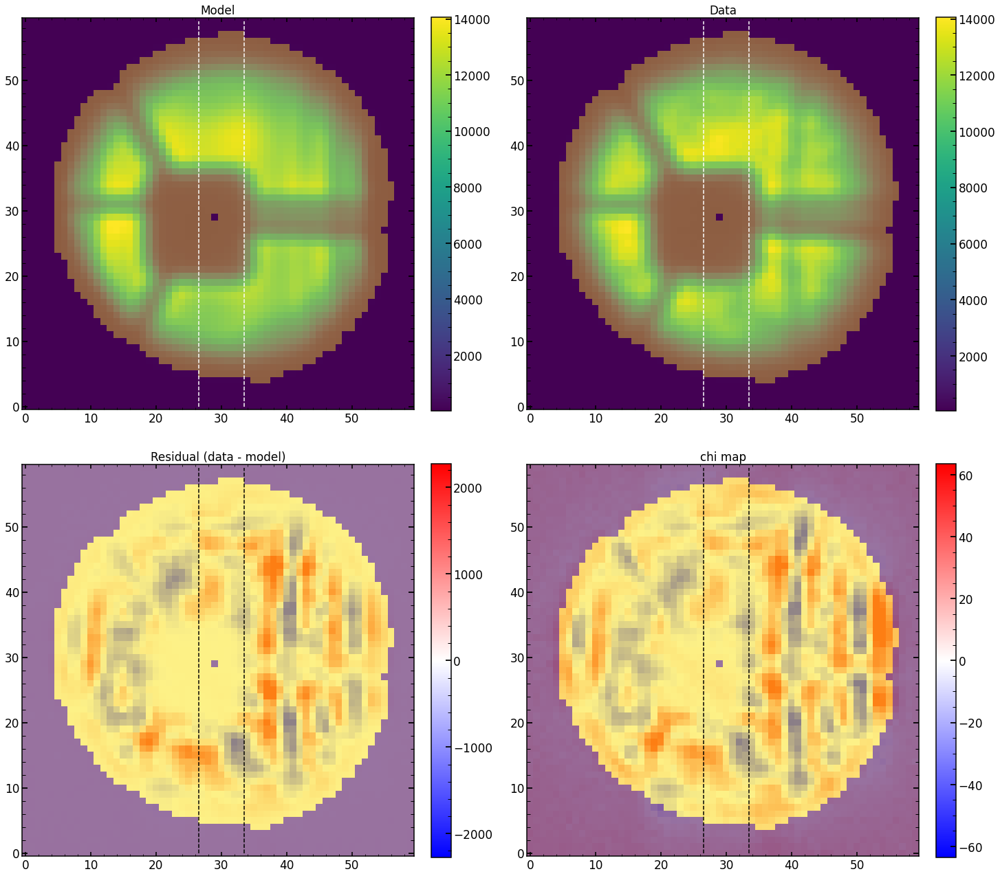

In [82]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_single_model_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_var_images)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 50.76966
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 10.636986
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
scipy.__version__1.5.0
Zernike_Module.__version__0.46e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 179.8275375366211
fraction of chi2 due to 1% of pixels: 0.10522716
---------------------
chi**2 max reduced is: 22456.312
chi**2 reduced is: 327.10522 for log improvment: -1.836651
chi max reduced is: 106.39911
chi reduced is: 12.994454 for log improvment: -0.91317993
---------------------
chi**2 reduced within custom mask area is: 327.1052
---------------------
chi**2 max reduced within flux mask area is: 37279.9
chi**2 reduced within flux mask area is:

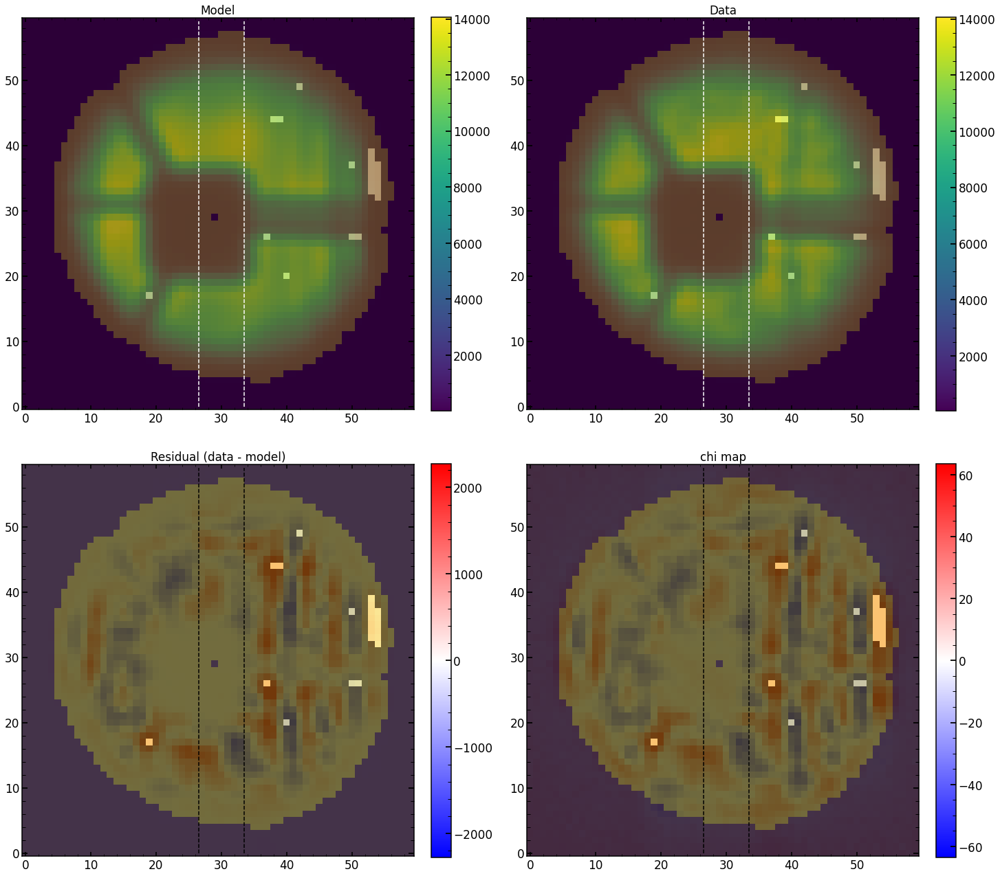

In [83]:

model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 50.76966
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 10.636986
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
scipy.__version__1.5.0
Zernike_Module.__version__0.46e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 179.8275375366211
---------------------
chi**2 max reduced is: 22456.312
chi**2 reduced is: 327.10522 for log improvment: -1.836651
chi max reduced is: 106.39911
chi reduced is: 12.994454 for log improvment: -0.91317993
---------------------
chi**2 reduced within custom mask area is: 327.1052
---------------------
chi**2 max reduced within flux mask area is: 37279.9
chi**2 reduced within flux mask area is: 505.6261 for log improvment: -1.8676453
chi max 

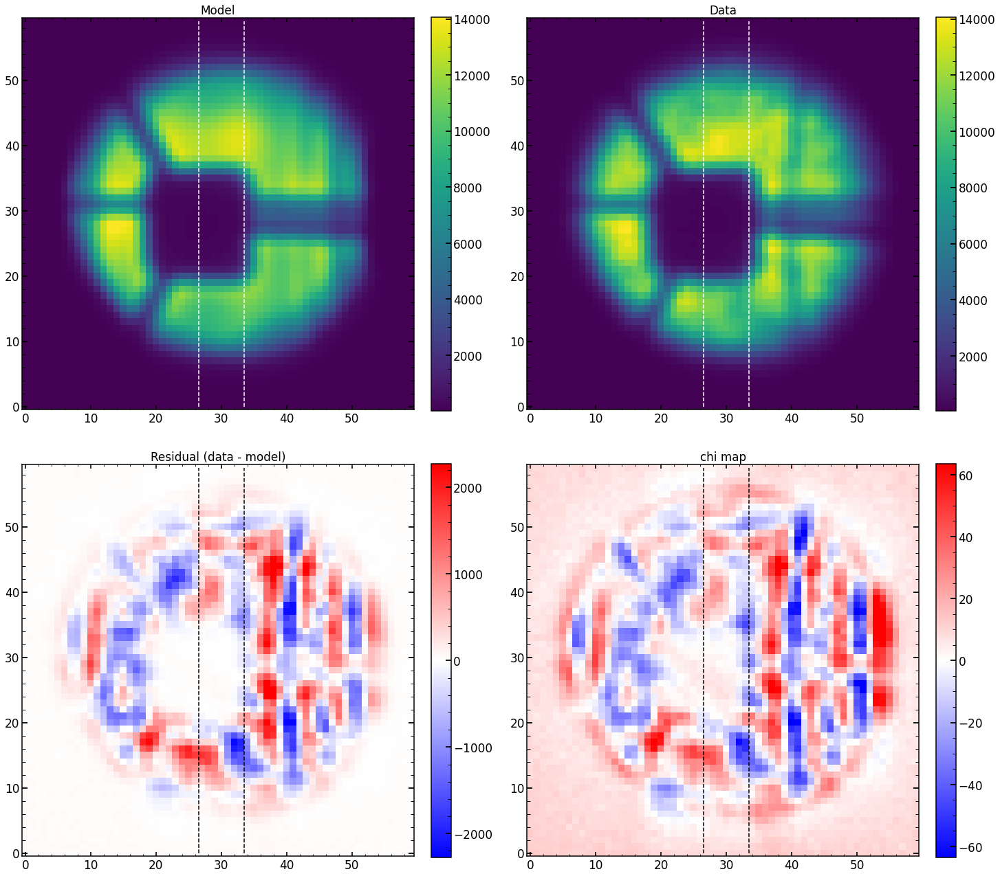

In [84]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 6.397676
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.9499788
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
scipy.__version__1.5.0
Zernike_Module.__version__0.46e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 19.281290531158447
---------------------
chi**2 max reduced is: 6832.815
chi**2 reduced is: 4.899949 for log improvment: -3.144408
chi max reduced is: 32.93361
chi reduced is: 1.6998572 for log improvment: -1.2872269
---------------------
chi**2 reduced within custom mask area is: 4.8999486
---------------------
chi**2 max reduced within flux mask area is: 13427.035
chi**2 reduced within flux mask area is: 5.6385665 for log improvment: -3.3768115
chi max

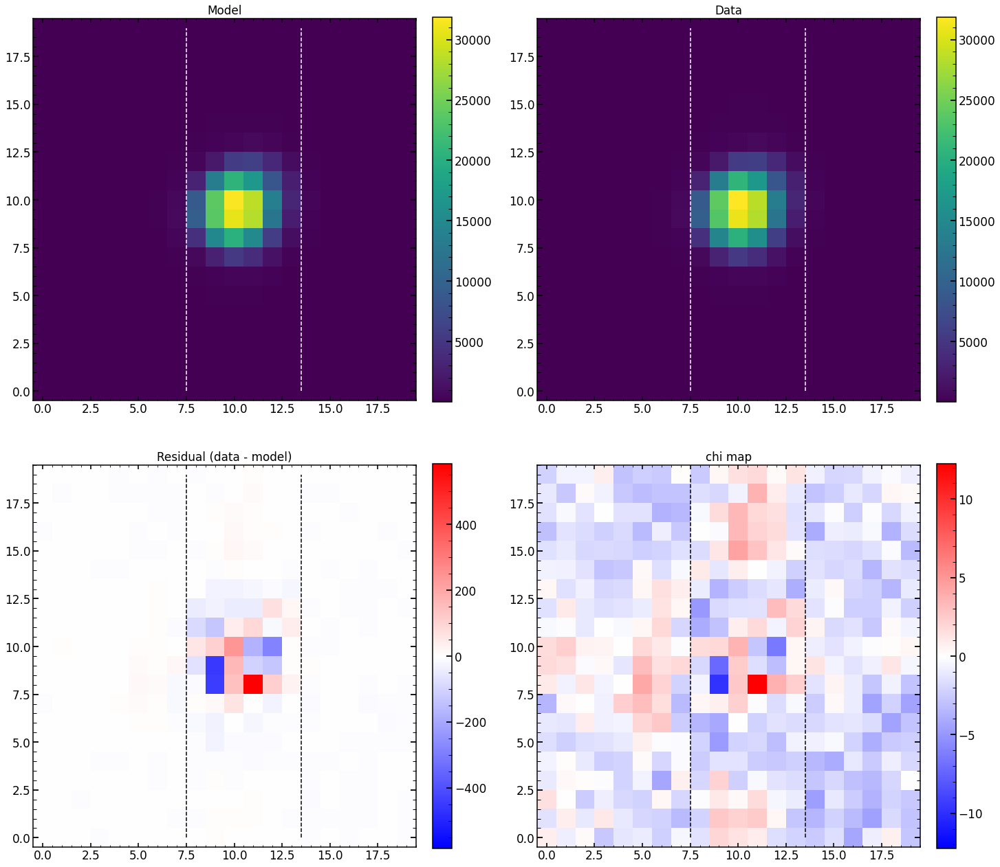

In [85]:
index_of_single_image=1
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 6832.815
chi**2 reduced is: 4.899949
Abs of residual divided by total flux is: 0.014429302
Abs of residual divided by largest value of a flux in the image is: 0.024620986


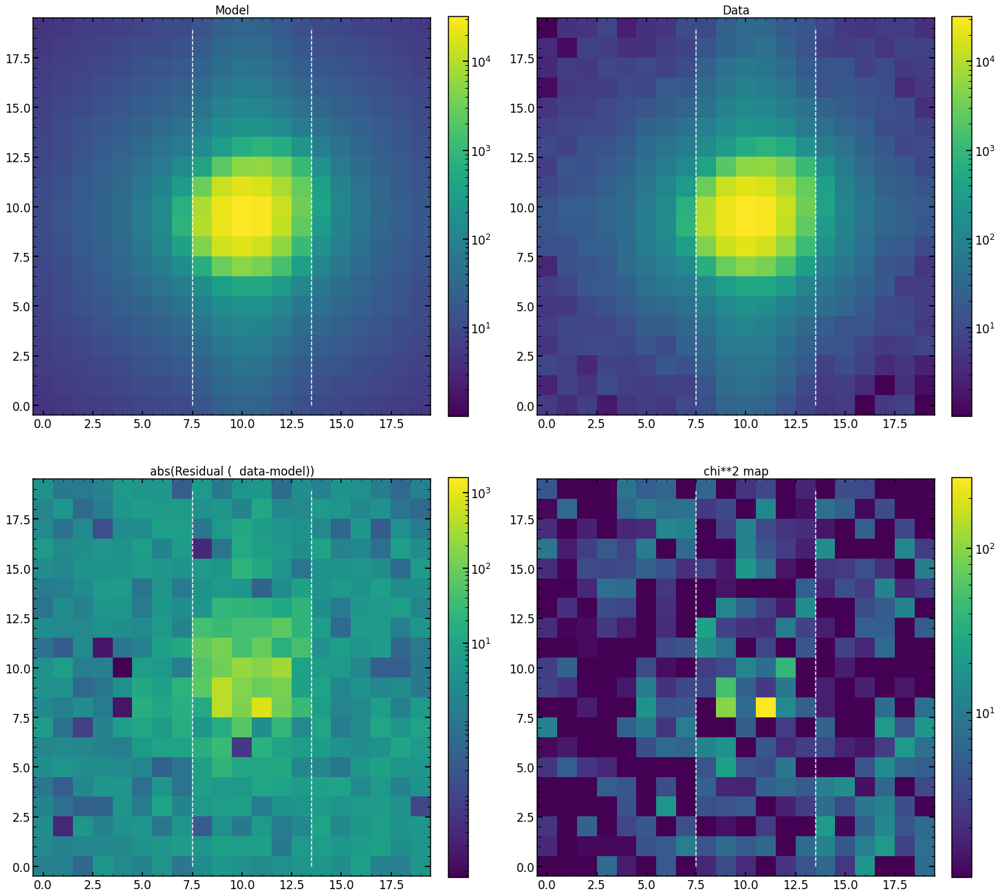

In [86]:
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

9.033083
chi**2 reduced is: 9.033083
Abs of residual divided by total flux is: 0.02314398
Abs of residual divided by largest value of a flux in the image is: 0.023893975


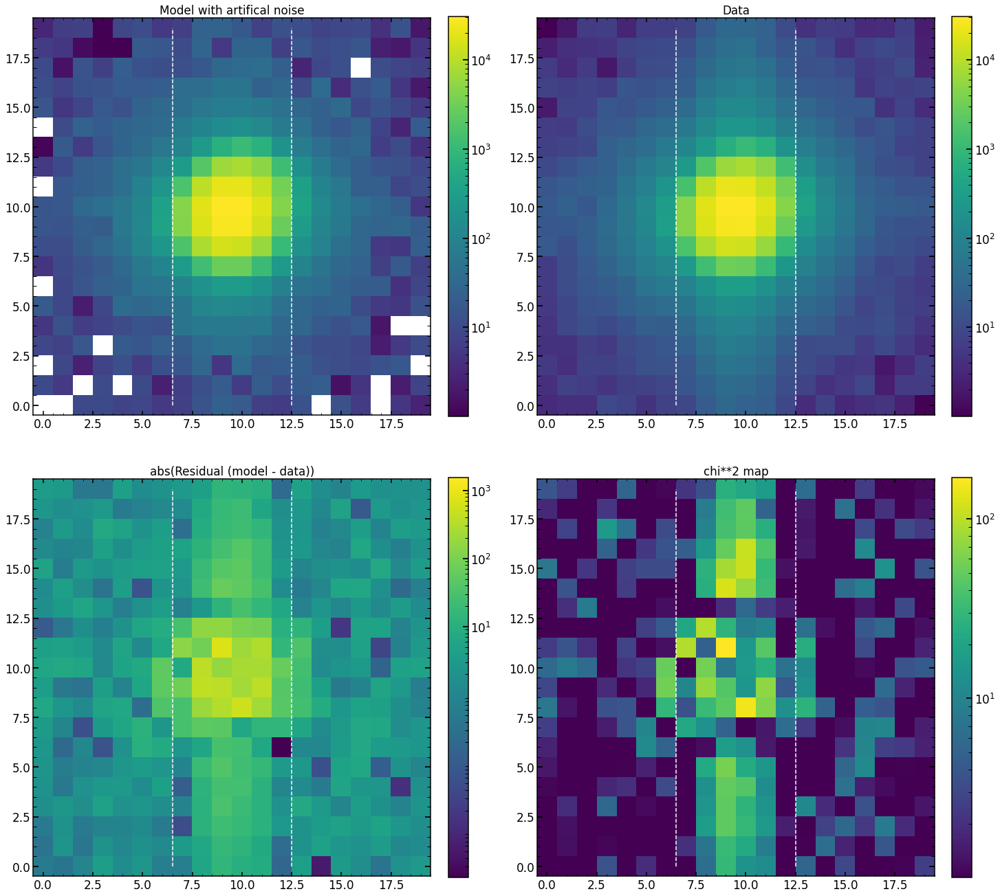

In [158]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

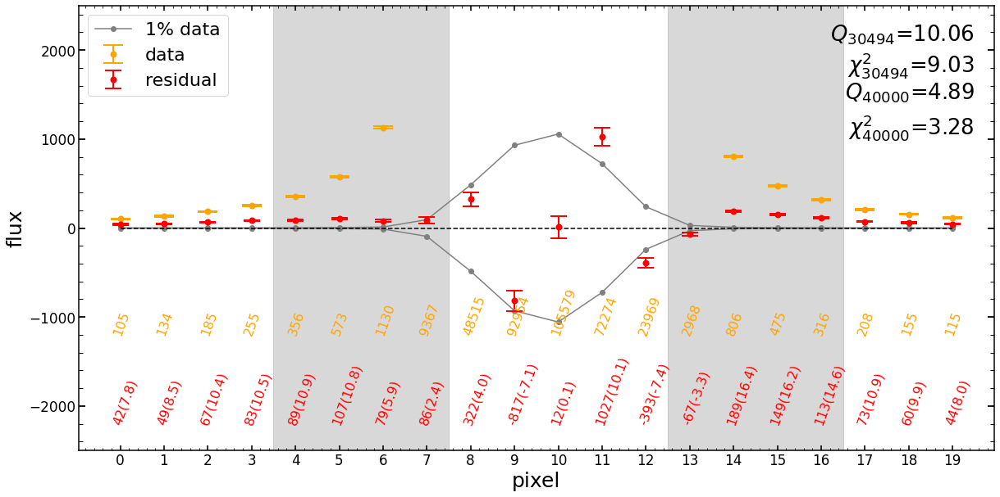

In [159]:
index_of_single_image=1
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## results everywhere 

In [63]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
#unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar[:,1])

unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne[:,1])

#if len(arranged_by_spot_number_Kr)>0:
#    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr[:,1])
#else:
#    unique_numbers_Kr=np.array([])
unique_numbers_Ne

array(['11', '14', '15', '2', '20', '23', '24', '29', '33', '38', '41',
       '42', '56', '6', '60', '65', '68', '69', '74', '78'], dtype='<U21')

In [ ]:
# Argon 

In [87]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=7,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=7,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_May_21_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [27713, -999, 27683, -999, 27677, -999, 27698, -999, 27719]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 27713
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719118NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 10.881994088490805
average chi2 reduced is: nan
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_May_21_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 14
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [27713, -999, 27683, -999, 27677, -999, 27698, -999, 277

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719428NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 6.363212943077087
average chi2 reduced is: nan
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_May_21_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 56
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [27713, -999, 27683, -999, 27677, -999, 27698, -999, 27719]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 27713
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jun1521/chainJun1521_Single_P_27719568NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 10.431639790534973
average chi2 reduced is: nan
STAMPS_FOLDER: /Users/nevencaplar/

In [89]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jun1521/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jun1521.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Apr1421.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

In [91]:
#labels_with_data_Ar=[]
#for i in range(len(label[:])):
#    if len(results_of_fit_many_Ar[label[i]])>5:
#        labels_with_data_Ar.append(i)
        
labels_with_data_Ne=[]
for i in range(len(label[:])):
    if len(results_of_fit_many_Ne[label[i]])>1:
        labels_with_data_Ne.append(i)
   
#labels_with_data_Kr=[]
#for i in range(len(label[:])):
#    if len(results_of_fit_many_Kr[label[i]])>5:
#        labels_with_data_Kr.append(i)

#labels_with_data=np.unique(labels_with_data_Ar+labels_with_data_Ne+labels_with_data_Kr)
labels_with_data=labels_with_data_Ne

In [93]:
# plot the results of the interpolation
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Jun1521'
descriptions=results_of_fit_many_Ne[label[0]].columns
# j runs throught the amount of defocu that we have analyzed

for j in tqdm(labels_with_data):
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        #x_Ar=finalAr.loc[results_of_fit_many_Ar[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        #y_Ar=finalAr.loc[results_of_fit_many_Ar[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        #values_Ar=np.array(results_of_fit_many_Ar[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne[label[j]][descriptions[i]])
        
        # take values for Krypton        
        #x_Kr=finalKr.loc[results_of_fit_many_Kr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        #y_Kr=finalKr.loc[results_of_fit_many_Kr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        #values_Kr=np.array(results_of_fit_many_Kr[label[j]][descriptions[i]])        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        #x=np.concatenate((x_Ar,x_Ne,x_Kr))
        #y=np.concatenate((y_Ar,y_Ne,y_Kr))    
        #colors= np.concatenate((values_Ar,values_Ne,values_Kr))

        # join these values
        x=x_Ne
        y=y_Ne  
        colors= values_Ne

        
        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 
                    
            # limits of color for z12-z22
            if np.in1d([i],[8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=0.25
                    min_colors=-0.25

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(np.quantile(colors,0.9)-median_color)
                low_limit=np.abs(np.quantile(colors,0.1)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  
            
            # Zernike above z22
            if i >42:
                max_colors=0.5/(i-20)
                min_colors=-0.5/(i-20)  

        #plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='o')
        plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='s')
        #plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='p')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+': '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

  0%|                                                         | 0/19 [00:00<?, ?it/s]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m4/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z4/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z5/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z6/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z7/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z8/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z9/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z10/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z11/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z12/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z13/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/z14/
Images are in folder: /Users/nevenc

  5%|██▌                                              | 1/19 [00:59<17:54, 59.67s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m35/


 11%|█████▏                                           | 2/19 [01:53<16:26, 58.01s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m3/


 16%|███████▋                                         | 3/19 [02:52<15:30, 58.15s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m25/


 21%|██████████▎                                      | 4/19 [03:58<15:06, 60.43s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m2/


 26%|████████████▉                                    | 5/19 [04:54<13:47, 59.12s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m15/


 32%|███████████████▍                                 | 6/19 [05:47<12:27, 57.52s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m1/


 37%|██████████████████                               | 7/19 [06:42<11:19, 56.64s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/m05/


 42%|████████████████████▋                            | 8/19 [07:35<10:10, 55.51s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/0/


 47%|███████████████████████▏                         | 9/19 [08:46<10:03, 60.34s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/0d/


 53%|█████████████████████████▎                      | 10/19 [09:47<09:04, 60.52s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p05/


 58%|███████████████████████████▊                    | 11/19 [10:45<07:57, 59.68s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p1/


 63%|██████████████████████████████▎                 | 12/19 [11:42<06:52, 58.92s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p15/


 68%|████████████████████████████████▊               | 13/19 [12:37<05:46, 57.77s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p2/


 74%|███████████████████████████████████▎            | 14/19 [13:29<04:40, 56.08s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p25/


 79%|█████████████████████████████████████▉          | 15/19 [14:27<03:45, 56.47s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p3/


 84%|████████████████████████████████████████▍       | 16/19 [15:27<02:53, 57.70s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p35/


 89%|██████████████████████████████████████████▉     | 17/19 [16:23<01:54, 57.07s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/p4/


 95%|█████████████████████████████████████████████▍  | 18/19 [17:11<00:54, 54.43s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun1521/Plane/0p/


100%|████████████████████████████████████████████████| 19/19 [18:01<00:00, 56.93s/it]


<Figure size 864x720 with 0 Axes>

In [103]:
34341+48

34389